In [1]:
import pickle
from os import listdir
from os.path import isfile, join
import sys
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

In [2]:
mypath =  "../../Downloads/298_Dataset-master/malware_dict/"

In [3]:
directories = listdir("../../Downloads/298_Dataset-master/malware_dict/")

In [4]:
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [5]:
for directory in directories:
    pathToDir = mypath+directory+"/"
    with open(pathToDir+"top.txt",'rb') as f:
        dictionary = pickle.load(f,encoding='latin1')
        print(len(dictionary))
        

1500
921
1500
1500
1169
1500
1500
1500
1500
1012
985
1500
1500
1500
1500
1500
1500


In [6]:
print(directories)

['vobfus', 'lolyda', 'ceeinject', 'cycbot', 'bho', 'fakerean', 'alureon', 'renos', 'vundo', 'hotbar', 'adload', 'agent', 'startpage', 'delfinject', 'obfuscator', 'rbot', 'onlinegames']


In [7]:
count = 0
for directory in directories:
    pathToDir = mypath+directory+"/"
    onlyfiles = [f for f in listdir(pathToDir) if isfile(join(pathToDir, f))]
    count = count+len(onlyfiles)
print(count)

17017


In [8]:
# Dictionary = {}
# flag = 0
# for directory in directories:
#     pathToDir = mypath+directory+"/"
#     with open(pathToDir+"top.txt",'rb') as f:
#         d = pickle.load(f,encoding='latin1')
#         if flag == 0:
#             Dictionary = d
#             flag = 1
#         else :
#             for key,value in d.items():
#                 if key in Dictionary:
#                     Dictionary[key] = Dictionary[key] + value
#                 else :
#                     Dictionary[key] = value

In [9]:
# K = 1000

In [10]:
# featureVectorTopK = sorted(Dictionary.items(), key=lambda kv: kv[1],reverse=True)[:K]

In [11]:
# print(featureVectorTopK)

In [12]:
# dataset = []
# for directory in directories:
#     pathToDir = mypath+directory+"/"
#     fileName = [pathToDir+f for f in listdir(pathToDir) if isfile(join(pathToDir, f))]
#     for filePath in fileName:
#         dictionaryOfNgram = {}
#         with open(filePath,"rb") as f:
#             dictionaryOfNgram = pickle.load(f,encoding='latin1')
#         vectorForSample = []
#         for ngram_tuple in featureVectorTopK:
#             if (ngram_tuple[0] in dictionaryOfNgram.keys()):
#                 vectorForSample.append(dictionaryOfNgram[ngram_tuple[0]])
#             else:
#                 vectorForSample.append(0)
#         sumOfRow = sum(vectorForSample)
#         for i in range(0,len(vectorForSample)):
#             vectorForSample[i] = float(vectorForSample[i]) / sumOfRow
#         vectorForSample = [directory] + vectorForSample
#         dataset.append(vectorForSample)

In [13]:
# print(len(dataset))

In [14]:
# print(dataset[0])

In [15]:
# print(dataset)

In [16]:
# dataset_Tmp = pd.DataFrame(dataset,columns=["Family Name"]+[i for i in range(1,K+1)])
# dataset_Tmp.to_csv("../dataset/bigdata1/top1000_bigdata1.csv",sep="\t")

In [17]:
dataset_dataframe = pd.read_csv("../dataset/bigdata1/top1000_bigdata1.csv",sep="\t")
dataset_dataframe.head()

,Unnamed: 0,Family Name,1,2,3,4,5,6,7,8,...,991,992,993,994,995,996,997,998,999,1000
0,0,vobfus,0.161217,0.142666,0.058180,0.008559,0.000000,0.004410,0.007263,0.013166,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,vobfus,0.335831,0.111819,0.023257,0.002638,0.003637,0.007130,0.008142,0.016115,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,vobfus,0.215399,0.103113,0.067630,0.014031,0.005303,0.005638,0.013526,0.011528,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,vobfus,0.259472,0.080973,0.059598,0.010809,0.009412,0.008873,0.011053,0.013322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,vobfus,0.222228,0.120731,0.012010,0.000000,0.004476,0.003771,0.005539,0.013656,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
dataset = np.array(dataset_dataframe.iloc[:,2:])

In [19]:
y = np.array(dataset_dataframe.loc[:,"Family Name"])

In [20]:
TopFamilyName = ['vobfus', 'lolyda', 'ceeinject', 'cycbot', 'bho', 'fakerean', 'alureon', 'renos', 'vundo', 'hotbar', 'adload', 'agent', 'startpage', 'delfinject', 'obfuscator', 'rbot', 'onlinegames']
topfam = set(TopFamilyName) 
label = []
for familyname in y:
    if familyname in topfam:
        for name_index in range(0,len(TopFamilyName)):
            if familyname == TopFamilyName[name_index]:
                label.append(name_index)
    else :
        label.append(len(TopFamilyName))
label = np.array(label)

In [21]:
print(len(TopFamilyName))

17


In [22]:
# avg_scores_knn = [0 for i in range(0,10)]
# n_itr = 5
# for itr in range(0,n_itr):
#     # Dividing the dataset into various sub-dataset
#     skf = StratifiedKFold(n_splits=10,shuffle=True)
#     subDatasetIndex = []
#     for train_index, test_index in skf.split(dataset,label):
#         subDatasetIndex.append(test_index)
#     # Verifying the whether the total is equal to total dataset
#     sum = 0;
#     for elem in subDatasetIndex:
#         print(len(elem))
#         sum = sum+len(elem)

#     MeanScoreForAll = []
#     sizeOfEachDataset = []
#     for i in range(1,11):
#         X = []
#         Y = []
#         tmp_sizeOfEachDataset_sum = 0;
#         for j in range (0,i):
#             tmp_sizeOfEachDataset_sum = tmp_sizeOfEachDataset_sum + len(subDatasetIndex[j])
#             for rowIndex in subDatasetIndex[j]:
#                 X.append(dataset[rowIndex])
#                 Y.append(label[rowIndex])
#         sizeOfEachDataset.append(tmp_sizeOfEachDataset_sum)
#         X = np.array(X)
#         Y = np.array(Y)
#         mean_accuracy_array = []
#         k_range = range(1, 31)
#         k_scores = []
#         # 1. we will loop through reasonable values of k
#         for k in k_range:
#             # 2. run KNeighborsClassifier with k neighbours
#             knn = KNeighborsClassifier(n_neighbors=k)
#             # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
#             cv = StratifiedKFold(n_splits=10,shuffle=True)
#             scores = cross_val_score(knn, X, Y, cv=cv, scoring='accuracy')
#             # 4. append mean of scores for k neighbors to k_scores list
#             k_scores.append(scores.mean())
#         print("For i = " + str(i))
#         print("Scores For K ranging from 1 to 30 \n" + str(k_scores))
#         highestAccuracy_k = (k_scores.index(max(k_scores))+1)
#         print("K with highest accuracy and its accuracy : " + str(highestAccuracy_k) +" , " + str(k_scores[highestAccuracy_k-1]))
#         mean_accuracy_array.append(k_scores[highestAccuracy_k-1])
#         mean = np.mean(mean_accuracy_array)
#         MeanScoreForAll.append(mean)
#         print("Mean Accuracy : " + str(mean))
#         print("\n\n")
#     for i in range(0,len(MeanScoreForAll)):
#         avg_scores_knn[i] = avg_scores_knn[i]+MeanScoreForAll[i]

In [23]:
# for score in avg_scores_knn:
#     print((score*100)/5)

In [24]:
# tmp = avg_scores_knn
# for i in range(0,len(avg_scores_knn)):
#     avg_scores_knn[i] = avg_scores_knn[i] / n_itr
# print(avg_scores_knn)

In [25]:
X_train, X_test, y_train, y_test = train_test_split(dataset, label, test_size=0.1)

In [26]:
print(len(X_train[0]))

1000


In [33]:
# Trial and error
# valuesOfEpochs = [5,10,50,100,200,500,1000]
# valuesOfTestSize = [0.1,0.2,0.3]
valuesOfEpochs = [1000]
valuesOfTestSize = [0.1,0.2,0.3]
overAllY = []
n_itr = 5
for v in valuesOfTestSize:
    for e in valuesOfEpochs:
        sizeOfEachDataset = []
        accForVariousSize = [0 for i in range (0,10)]
        lossForVariousSize = [0 for i in range(0,10)]
        for itr in range(0,n_itr):
            print(str(v) + ", "+str(e) + ", "+str(itr))
            # Dividing the dataset into various sub-dataset
            skf = StratifiedKFold(n_splits=10,shuffle=True)
            subDatasetIndex = []
            for train_index, test_index in skf.split(dataset,label):
                subDatasetIndex.append(test_index)
                
            for i in range(1,11):
                print("------" + str(i) + "--------")
                X = []
                Y = []
                tmp_sizeOfEachDataset_sum = 0;
                for j in range (0,i):
                    tmp_sizeOfEachDataset_sum = tmp_sizeOfEachDataset_sum + len(subDatasetIndex[j])
                    for rowIndex in subDatasetIndex[j]:
                        X.append(dataset[rowIndex])
                        Y.append(label[rowIndex])
                sizeOfEachDataset.append(tmp_sizeOfEachDataset_sum)
                X = np.array(X)
                Y = np.array(Y)
                X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=v)
                model = keras.Sequential()
                model.add(keras.layers.Dense(128,activation='relu',kernel_initializer='random_normal',input_dim=1000))
                model.add(keras.layers.Dense(128,activation='relu',kernel_initializer='random_normal'))
                model.add(keras.layers.Dense(17, activation='sigmoid', kernel_initializer='random_normal'))
                model.compile(optimizer='adam', 
                          loss='sparse_categorical_crossentropy',
                          metrics=['accuracy'])
                model.fit(X_train, y_train, epochs=e)
                loss, acc = model.evaluate(X_test,y_test)
                accForVariousSize[i-1] = accForVariousSize[i-1] + acc
                lossForVariousSize[i-1] = lossForVariousSize[i-1] + loss
        print(accForVariousSize)
            
        for i in range(0,10):
            accForVariousSize[i] = accForVariousSize[i] / n_itr
            lossForVariousSize[i] = lossForVariousSize[i] / n_itr
        overAllY.append(accForVariousSize)

0.1, 1000, 0
------1--------
Epoch 1/1000
1545/1545 [==============================] - 22s 14ms/sample - loss: 2.8260 - acc: 0.1307
Epoch 2/1000
1545/1545 [==============================] - 5s 4ms/sample - loss: 2.6962 - acc: 0.1689
Epoch 3/1000
1545/1545 [==============================] - 5s 3ms/sample - loss: 2.4162 - acc: 0.1566
Epoch 4/1000
1545/1545 [==============================] - 3s 2ms/sample - loss: 2.2372 - acc: 0.3068
Epoch 5/1000
1545/1545 [==============================] - 3s 2ms/sample - loss: 1.9833 - acc: 0.3728
Epoch 6/1000
1545/1545 [==============================] - 3s 2ms/sample - loss: 1.7715 - acc: 0.4434
Epoch 7/1000
1545/1545 [==============================] - 3s 2ms/sample - loss: 1.6439 - acc: 0.4595 2s 
Epoch 8/1000
1545/1545 [==============================] - 3s 2ms/sample - loss: 1.5450 - acc: 0.4997
Epoch 9/1000
1545/1545 [==============================] - 2s 2ms/sample - loss: 1.4819 - acc: 0.5262
Epoch 10/1000
1545/1545 [==============================]

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0426 - acc: 0.9909 0s - loss: 0.0436 - acc: 0.99
Epoch 157/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0403 - acc: 0.9903 0s - loss: 0.0402 - ac
Epoch 158/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0388 - acc: 0.9916
Epoch 159/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0357 - acc: 0.9948
Epoch 160/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0451 - acc: 0.9909
Epoch 161/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0394 - acc: 0.9916 2s -
Epoch 162/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0343 - acc: 0.9935 0s - loss: 0.0349 - acc: 0.993
Epoch 163/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0360 - acc: 0.9922
Epoch 164/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0354 - acc: 0.9929

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0032 - acc: 0.9994
Epoch 308/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0062 - acc: 0.9981
Epoch 309/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0041 - acc: 0.9981
Epoch 310/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0035 - acc: 0.9987
Epoch 311/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0044 - acc: 0.9987
Epoch 312/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0062 - acc: 0.9981 0s - loss: 0.0064 - acc
Epoch 313/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0065 - acc: 0.9981
Epoch 314/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0029 - acc: 0.9994
Epoch 315/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0062 - acc: 0.9974ETA: 1s - lo
Epoch 316/1000
1545/1545 [==========================

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0012 - acc: 0.9994
Epoch 462/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0015 - acc: 0.9994
Epoch 463/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0011 - acc: 0.9994
Epoch 464/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0014 - acc: 0.9987
Epoch 465/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0043 - acc: 0.9974 0s - loss: 0.0045 - acc: 0.9
Epoch 466/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0020 - acc: 0.9987
Epoch 467/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0049 - acc: 0.9981
Epoch 468/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0012 - acc: 0.9994
Epoch 469/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 9.2538e-04 - acc: 0.9994
Epoch 470/1000
1545/1545 [=============================

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0015 - acc: 0.9987
Epoch 538/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.8811e-04 - acc: 0.9994 - loss: 0.001
Epoch 539/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.1094e-04 - acc: 0.9994
Epoch 540/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.2771e-04 - acc: 0.9994
Epoch 541/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.2674e-04 - acc: 0.9994
Epoch 542/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.4051e-04 - acc: 0.9994
Epoch 543/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.2687e-04 - acc: 0.9994
Epoch 544/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.3550e-04 - acc: 0.9994
Epoch 545/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 7.5922e-04 - acc: 0.9994
Epoch 546/1000
1545/1545 [================

1545/1545 [==============================] - 2s 1ms/sample - loss: 5.8385e-04 - acc: 0.9994
Epoch 684/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.8646e-04 - acc: 0.9994
Epoch 685/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.7550e-04 - acc: 0.9994
Epoch 686/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 6.4140e-04 - acc: 0.9994
Epoch 687/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0022 - acc: 0.9987
Epoch 688/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0011 - acc: 0.9994 0s - loss: 0.0012 - acc: 0.9
Epoch 689/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 6.1081e-04 - acc: 0.9994
Epoch 690/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 6.1404e-04 - acc: 0.9994
Epoch 691/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 6.4716e-04 - acc: 0.9994
Epoch 692/1000
1545/1545 [=====

1545/1545 [==============================] - 2s 998us/sample - loss: 5.2644e-04 - acc: 0.9994
Epoch 834/1000
1545/1545 [==============================] - 1s 961us/sample - loss: 5.2314e-04 - acc: 0.9994
Epoch 835/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.1885e-04 - acc: 0.9994
Epoch 836/1000
1545/1545 [==============================] - 2s 976us/sample - loss: 5.2142e-04 - acc: 0.9994s - loss: 5.8731e-04 - acc: 0.
Epoch 837/1000
1545/1545 [==============================] - 2s 974us/sample - loss: 5.1932e-04 - acc: 0.9994
Epoch 838/1000
1545/1545 [==============================] - 2s 985us/sample - loss: 5.4407e-04 - acc: 0.9994
Epoch 839/1000
1545/1545 [==============================] - 1s 968us/sample - loss: 5.1724e-04 - acc: 0.9994
Epoch 840/1000
1545/1545 [==============================] - 2s 980us/sample - loss: 5.1616e-04 - acc: 0.9994
Epoch 841/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.1410e-04 - acc: 0.9994
Epoch 84

1545/1545 [==============================] - 1s 966us/sample - loss: 5.3314e-04 - acc: 0.9994
Epoch 982/1000
1545/1545 [==============================] - 1s 957us/sample - loss: 5.3062e-04 - acc: 0.9994
Epoch 983/1000
1545/1545 [==============================] - 2s 992us/sample - loss: 5.2814e-04 - acc: 0.9994
Epoch 984/1000
1545/1545 [==============================] - 2s 993us/sample - loss: 5.2584e-04 - acc: 0.9994
Epoch 985/1000
1545/1545 [==============================] - 2s 991us/sample - loss: 5.2473e-04 - acc: 0.9994
Epoch 986/1000
1545/1545 [==============================] - 2s 996us/sample - loss: 5.2285e-04 - acc: 0.9994
Epoch 987/1000
1545/1545 [==============================] - 2s 984us/sample - loss: 5.2155e-04 - acc: 0.9994
Epoch 988/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.2053e-04 - acc: 0.9994
Epoch 989/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 5.1868e-04 - acc: 0.9994
Epoch 990/1000
1545/1545 [============

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2573 - acc: 0.9255
Epoch 57/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2492 - acc: 0.9298
Epoch 58/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2440 - acc: 0.9330
Epoch 59/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2462 - acc: 0.9311
Epoch 60/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2315 - acc: 0.9372
Epoch 61/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2300 - acc: 0.9333 0s - loss: 0.2273 - acc: 0.9
Epoch 62/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2223 - acc: 0.9395 0s - loss: 0.2144
Epoch 63/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2179 - acc: 0.9363
Epoch 64/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.2072 - acc: 0.9447
Epoch 65/1000
3075/3075 [========================

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0208 - acc: 0.9941
Epoch 210/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0352 - acc: 0.9883
Epoch 211/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0215 - acc: 0.9932
Epoch 212/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0219 - acc: 0.9928
Epoch 213/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0201 - acc: 0.9935 1s - loss
Epoch 214/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0231 - acc: 0.9932
Epoch 215/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0222 - acc: 0.9925
Epoch 216/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0224 - acc: 0.9912
Epoch 217/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0204 - acc: 0.9922
Epoch 218/1000
3075/3075 [==============================] - 4s 1ms/sample - lo

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0122 - acc: 0.9958
Epoch 362/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0737 - acc: 0.9837
Epoch 363/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0124 - acc: 0.9964 0s - loss: 0.0128 - - ETA: 0s - loss: 0.0130 - acc:
Epoch 364/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0105 - acc: 0.9961
Epoch 365/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0104 - acc: 0.9964 2s -
Epoch 366/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0100 - acc: 0.9964 1s - loss: 0.00
Epoch 367/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0125 - acc: 0.9967
Epoch 368/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0119 - acc: 0.9961
Epoch 369/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0106 - acc: 0.9961 0s - loss: 0.0


3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0163 - acc: 0.9951
Epoch 514/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0109 - acc: 0.9964 0s - loss: 0.0111 - acc: 0.996
Epoch 515/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0102 - acc: 0.9961
Epoch 516/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0129 - acc: 0.9951
Epoch 517/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0112 - acc: 0.9964
Epoch 518/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0096 - acc: 0.9967 1s - 
Epoch 519/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0137 - acc: 0.9951
Epoch 520/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0087 - acc: 0.9974
Epoch 521/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0082 - acc: 0.9971
Epoch 522/1000
3075/3075 [=========================

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0093 - acc: 0.9971
Epoch 667/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0100 - acc: 0.9971
Epoch 668/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0165 - acc: 0.9925
Epoch 669/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0173 - acc: 0.9948
Epoch 670/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0165 - acc: 0.9945
Epoch 671/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0100 - acc: 0.9961
Epoch 672/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0088 - acc: 0.9967 1s - l
Epoch 673/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0076 - acc: 0.9971
Epoch 674/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0101 - acc: 0.9964
Epoch 675/1000
3075/3075 [==============================] - 4s 1ms/sample - loss:

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0083 - acc: 0.9967
Epoch 817/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0090 - acc: 0.9964
Epoch 818/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0089 - acc: 0.9971
Epoch 819/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0075 - acc: 0.9974
Epoch 820/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0085 - acc: 0.9971
Epoch 821/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0112 - acc: 0.9967 0s - loss: 0.0112 - acc
Epoch 822/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0085 - acc: 0.9971
Epoch 823/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0107 - acc: 0.9964
Epoch 824/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0070 - acc: 0.9974 0s - loss: 0.0074 - acc: 0
Epoch 825/1000
3075/3075 [===========

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0068 - acc: 0.9974
Epoch 967/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0067 - acc: 0.9977
Epoch 968/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0073 - acc: 0.9974
Epoch 969/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0067 - acc: 0.9977
Epoch 970/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0074 - acc: 0.9977
Epoch 971/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0074 - acc: 0.9971
Epoch 972/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0079 - acc: 0.9974
Epoch 973/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0064 - acc: 0.9977
Epoch 974/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0082 - acc: 0.9964
Epoch 975/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0387

4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0570 - acc: 0.9850
Epoch 121/1000
4605/4605 [==============================] - 7s 1ms/sample - loss: 0.0564 - acc: 0.9844
Epoch 122/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0600 - acc: 0.9844
Epoch 123/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0558 - acc: 0.9852
Epoch 124/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0538 - acc: 0.9846
Epoch 125/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0547 - acc: 0.9857
Epoch 126/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0501 - acc: 0.9852
Epoch 127/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0511 - acc: 0.9863
Epoch 128/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0514 - acc: 0.9848
Epoch 129/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0491

4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0221 - acc: 0.9935
Epoch 276/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0244 - acc: 0.9922
Epoch 277/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0197 - acc: 0.9933
Epoch 278/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0194 - acc: 0.9926
Epoch 279/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0235 - acc: 0.9926
Epoch 280/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0190 - acc: 0.9946 1s - 
Epoch 281/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0184 - acc: 0.9935
Epoch 282/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0184 - acc: 0.9937
Epoch 283/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0192 - acc: 0.9926
Epoch 284/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 

4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0146 - acc: 0.9952
Epoch 428/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0127 - acc: 0.9959
Epoch 429/1000
4605/4605 [==============================] - 7s 1ms/sample - loss: 0.0162 - acc: 0.9948
Epoch 430/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0142 - acc: 0.9952
Epoch 431/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0136 - acc: 0.9952
Epoch 432/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0157 - acc: 0.9946
Epoch 433/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0199 - acc: 0.9939
Epoch 434/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0147 - acc: 0.9957
Epoch 435/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0145 - acc: 0.9952
Epoch 436/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0148

4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0156 - acc: 0.9950
Epoch 581/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0137 - acc: 0.9957
Epoch 582/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0115 - acc: 0.9963
Epoch 583/1000
4605/4605 [==============================] - ETA: 0s - loss: 0.0142 - acc: 0.9943- ETA: 0s - loss: 0.0148 - acc - 6s 1ms/sample - loss: 0.0140 - acc: 0.9944
Epoch 584/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0121 - acc: 0.9952
Epoch 585/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0128 - acc: 0.9961
Epoch 586/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0124 - acc: 0.9957
Epoch 587/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0140 - acc: 0.9948
Epoch 588/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0124 - acc: 0.9957 1s 
Epoch 589/1000


4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0104 - acc: 0.9967
Epoch 735/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0107 - acc: 0.9963
Epoch 736/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0218 - acc: 0.9922
Epoch 737/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0236 - acc: 0.9922
Epoch 738/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0121 - acc: 0.9959
Epoch 739/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0114 - acc: 0.9967
Epoch 740/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0145 - acc: 0.9944 0s - loss: 0.0137 -
Epoch 741/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0111 - acc: 0.9959
Epoch 742/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0112 - acc: 0.9961
Epoch 743/1000
4605/4605 [==============================] - 6s 1ms/s

4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0098 - acc: 0.9965
Epoch 888/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0143 - acc: 0.9950
Epoch 889/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0145 - acc: 0.9952
Epoch 890/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0110 - acc: 0.9957 1s - l
Epoch 891/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0110 - acc: 0.9957
Epoch 892/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0112 - acc: 0.9959
Epoch 893/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0110 - acc: 0.9963
Epoch 894/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0111 - acc: 0.9961
Epoch 895/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0135 - acc: 0.9950 1s - loss
Epoch 896/1000
4605/4605 [==============================] - 6s 1ms/samp

6135/6135 [==============================] - 9s 1ms/sample - loss: 0.2702 - acc: 0.9218 1s - lo
Epoch 42/1000
6135/6135 [==============================] - 9s 1ms/sample - loss: 0.2646 - acc: 0.9222
Epoch 43/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2562 - acc: 0.9270
Epoch 44/1000
6135/6135 [==============================] - 9s 2ms/sample - loss: 0.2484 - acc: 0.9299
Epoch 45/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2490 - acc: 0.9276
Epoch 46/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2415 - acc: 0.9306
Epoch 47/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2374 - acc: 0.9330
Epoch 48/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2330 - acc: 0.9325
Epoch 49/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.2257 - acc: 0.9363 0s - loss: 0.2248
Epoch 50/1000
6135/6135 [==============================] - 8s 1ms/samp

Epoch 119/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0773 - acc: 0.9772
Epoch 120/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0752 - acc: 0.9786
Epoch 121/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0739 - acc: 0.9783
Epoch 122/1000
6135/6135 [==============================] - 9s 1ms/sample - loss: 0.0743 - acc: 0.9788
Epoch 123/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0698 - acc: 0.9800
Epoch 124/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0675 - acc: 0.9809
Epoch 125/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0701 - acc: 0.9790
Epoch 126/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0714 - acc: 0.9786
Epoch 127/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0691 - acc: 0.9795
Epoch 128/1000
6135/6135 [==============================] - 8s 1ms/sample

Epoch 273/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0499 - acc: 0.9832
Epoch 274/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0436 - acc: 0.9860
Epoch 275/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0436 - acc: 0.9860
Epoch 276/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0449 - acc: 0.9850
Epoch 277/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0454 - acc: 0.9844
Epoch 278/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0457 - acc: 0.9835
Epoch 279/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0431 - acc: 0.9845
Epoch 280/1000
6135/6135 [==============================] - 9s 1ms/sample - loss: 0.0454 - acc: 0.9861
Epoch 281/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0421 - acc: 0.9855
Epoch 282/1000
6135/6135 [==============================] - 8s 1ms/sample

6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0392 - acc: 0.9863
Epoch 428/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0381 - acc: 0.9871
Epoch 429/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0366 - acc: 0.9870
Epoch 430/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0379 - acc: 0.9870
Epoch 431/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0372 - acc: 0.9874
Epoch 432/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0381 - acc: 0.9865
Epoch 433/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0379 - acc: 0.9866
Epoch 434/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0392 - acc: 0.9863
Epoch 435/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0383 - acc: 0.9861
Epoch 436/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0391

6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0391 - acc: 0.9863
Epoch 580/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0390 - acc: 0.9866
Epoch 581/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0438 - acc: 0.9857
Epoch 582/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0357 - acc: 0.9873
Epoch 583/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0364 - acc: 0.9873
Epoch 584/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0365 - acc: 0.9876
Epoch 585/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0392 - acc: 0.9861
Epoch 586/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0357 - acc: 0.9868
Epoch 587/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0342 - acc: 0.9876 4s -  - ETA: 2s - loss: 0.0299  - ETA: 2s 
Epoch 588/1000
6135/6135 [===================

6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0434 - acc: 0.9853
Epoch 732/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0396 - acc: 0.9866
Epoch 733/1000
6135/6135 [==============================] - 9s 1ms/sample - loss: 0.0331 - acc: 0.9881 1s - loss: 0.0321 - acc: 0.9 - ETA: 0s - loss: 0.0313
Epoch 734/1000
6135/6135 [==============================] - 9s 2ms/sample - loss: 0.0344 - acc: 0.9878
Epoch 735/1000
6135/6135 [==============================] - 9s 1ms/sample - loss: 0.0354 - acc: 0.9878 1s - los
Epoch 736/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9876
Epoch 737/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0334 - acc: 0.9881
Epoch 738/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0346 - acc: 0.9876 1s - loss: 0.0339
Epoch 739/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0346 - acc: 0.9874
Epoch 7

6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0342 - acc: 0.9881
Epoch 883/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0333 - acc: 0.9881
Epoch 884/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0341 - acc: 0.9881
Epoch 885/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0348 - acc: 0.9876
Epoch 886/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0332 - acc: 0.9878
Epoch 887/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0339 - acc: 0.9873 0s - loss: 0.0337 - 
Epoch 888/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0329 - acc: 0.9881
Epoch 889/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0333 - acc: 0.9883
Epoch 890/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.0340 - acc: 0.9881 1s - loss: 0.030 - ETA: 0s - loss: 0.0331 - acc:
Epoch 891/1000
613

7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2891 - acc: 0.9132
Epoch 35/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2843 - acc: 0.9140
Epoch 36/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2776 - acc: 0.9198
Epoch 37/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2684 - acc: 0.9208
Epoch 38/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2654 - acc: 0.9215
Epoch 39/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2682 - acc: 0.9203
Epoch 40/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2527 - acc: 0.9249
Epoch 41/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2475 - acc: 0.9263
Epoch 42/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.2397 - acc: 0.9322
Epoch 43/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.236

7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0538 - acc: 0.9825
Epoch 186/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0529 - acc: 0.9830
Epoch 187/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0540 - acc: 0.9823
Epoch 188/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0511 - acc: 0.9837
Epoch 189/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0501 - acc: 0.98290s - loss: 0.0485 - acc:
Epoch 190/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0487 - acc: 0.9846
Epoch 191/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0535 - acc: 0.9821
Epoch 192/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0505 - acc: 0.9826
Epoch 193/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0528 - acc: 0.9826
Epoch 194/1000
7665/7665 [=============================

7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0405 - acc: 0.98661s - lo
Epoch 338/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0420 - acc: 0.9863
Epoch 339/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0391 - acc: 0.9862
Epoch 340/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0381 - acc: 0.98641s - l
Epoch 341/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0403 - acc: 0.9855
Epoch 342/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0446 - acc: 0.9854
Epoch 343/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0379 - acc: 0.9871
Epoch 344/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0401 - acc: 0.9866
Epoch 345/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0417 - acc: 0.9862
Epoch 346/1000
7665/7665 [==============================] - 10s 1m

7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0349 - acc: 0.9872
Epoch 488/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0415 - acc: 0.9868
Epoch 489/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0406 - acc: 0.9864
Epoch 490/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0350 - acc: 0.9877
Epoch 491/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0362 - acc: 0.9877
Epoch 492/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0403 - acc: 0.9862
Epoch 493/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0374 - acc: 0.9866
Epoch 494/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0353 - acc: 0.98730s - loss: 0.0348 - acc: 0.987
Epoch 495/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0384 - acc: 0.9873
Epoch 496/1000
7665/7665 [=======================

7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0333 - acc: 0.9877
Epoch 640/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0329 - acc: 0.9884
Epoch 641/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0318 - acc: 0.9884
Epoch 642/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0382 - acc: 0.9868
Epoch 643/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0368 - acc: 0.98751s - l
Epoch 644/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0372 - acc: 0.9866
Epoch 645/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0340 - acc: 0.9881
Epoch 646/1000
7665/7665 [==============================] - 10s 1ms/sample - loss: 0.0340 - acc: 0.9875
Epoch 647/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0327 - acc: 0.9880
Epoch 648/1000
7665/7665 [==============================] - 12s 2ms/sampl

7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0304 - acc: 0.9894
Epoch 792/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0312 - acc: 0.9893
Epoch 793/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0325 - acc: 0.9883
Epoch 794/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0324 - acc: 0.9889
Epoch 795/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0317 - acc: 0.9892
Epoch 796/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0334 - acc: 0.98830s - loss: 0.0343 - acc:
Epoch 797/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0329 - acc: 0.9885
Epoch 798/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0324 - acc: 0.9886
Epoch 799/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0311 - acc: 0.9884
Epoch 800/1000
7665/7665 [=============================

7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0351 - acc: 0.9877
Epoch 866/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0385 - acc: 0.9868
Epoch 867/1000
7665/7665 [==============================] - 12s 2ms/sample - loss: 0.0383 - acc: 0.98731s - loss: 0.03 - ETA: 0s - loss: 0.0397 -
Epoch 868/1000
7665/7665 [==============================] - 12s 2ms/sample - loss: 0.0359 - acc: 0.98721s - loss: 0.
Epoch 869/1000
7665/7665 [==============================] - 12s 2ms/sample - loss: 0.0335 - acc: 0.98800s - loss: 0.0333 - a
Epoch 870/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0373 - acc: 0.98710s - loss: 0.03
Epoch 871/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0337 - acc: 0.9886
Epoch 872/1000
7665/7665 [==============================] - 11s 1ms/sample - loss: 0.0348 - acc: 0.9883
Epoch 873/1000
7665/7665 [==============================] - 12s 2ms/sample - loss: 0.0329 - 

9195/9195 [==============================] - 7s 799us/sample - loss: 0.5151 - acc: 0.8500
Epoch 15/1000
9195/9195 [==============================] - 7s 810us/sample - loss: 0.4926 - acc: 0.8543
Epoch 16/1000
9195/9195 [==============================] - 8s 825us/sample - loss: 0.4760 - acc: 0.8595
Epoch 17/1000
9195/9195 [==============================] - 7s 801us/sample - loss: 0.4550 - acc: 0.8675
Epoch 18/1000
9195/9195 [==============================] - 7s 800us/sample - loss: 0.4391 - acc: 0.8690
Epoch 19/1000
9195/9195 [==============================] - 7s 800us/sample - loss: 0.4274 - acc: 0.8729
Epoch 20/1000
9195/9195 [==============================] - 7s 800us/sample - loss: 0.4117 - acc: 0.8791
Epoch 21/1000
9195/9195 [==============================] - 7s 787us/sample - loss: 0.4003 - acc: 0.8800
Epoch 22/1000
9195/9195 [==============================] - 7s 796us/sample - loss: 0.3867 - acc: 0.8873
Epoch 23/1000
9195/9195 [==============================] - 7s 798us/sample - l

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0434 - acc: 0.98640s - loss: 0.0434 -
Epoch 169/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0450 - acc: 0.9855
Epoch 170/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0452 - acc: 0.98640s - loss: 0.0453 - acc: 0.986
Epoch 171/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0430 - acc: 0.9862
Epoch 172/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0456 - acc: 0.9864
Epoch 173/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0441 - acc: 0.9852
Epoch 174/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0495 - acc: 0.9848
Epoch 175/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0455 - acc: 0.9854
Epoch 176/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0484 - acc: 0.9847
Epoch 177/1000
9195/9195 [====

Epoch 321/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0334 - acc: 0.9892
Epoch 322/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0300 - acc: 0.98991s - loss: 
Epoch 323/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0326 - acc: 0.98881s 
Epoch 324/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0348 - acc: 0.9892
Epoch 325/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0320 - acc: 0.9887
Epoch 326/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0308 - acc: 0.99020s - loss: 0.0314 - ac
Epoch 327/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0311 - acc: 0.9891
Epoch 328/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0312 - acc: 0.9892
Epoch 329/1000
9195/9195 [==============================] - 12s 1ms/sample - loss: 0.0309 - acc: 0.9898
Epoch 330/1000
9195/9195 [==

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0287 - acc: 0.9898
Epoch 398/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0315 - acc: 0.9892
Epoch 399/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0299 - acc: 0.9897
Epoch 400/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0282 - acc: 0.9905
Epoch 401/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0298 - acc: 0.9900 0s - loss: 0.0299 - acc: 0.990 - ETA: 0s - loss: 0.0297 - a
Epoch 402/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0265 - acc: 0.9909
Epoch 403/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0322 - acc: 0.9891
Epoch 404/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0293 - acc: 0.9892
Epoch 405/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0285 - acc: 0.9899
Epoch 406/1000
9195/91

9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0280 - acc: 0.9898
Epoch 547/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0273 - acc: 0.9904
Epoch 548/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0275 - acc: 0.9902
Epoch 549/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0280 - acc: 0.9904
Epoch 550/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0297 - acc: 0.98951s -
Epoch 551/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0301 - acc: 0.9896
Epoch 552/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0325 - acc: 0.9891
Epoch 553/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0274 - acc: 0.9903
Epoch 554/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0278 - acc: 0.9899
Epoch 555/1000
9195/9195 [==============================] - 13s 1ms/sample 

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0259 - acc: 0.9903
Epoch 700/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0264 - acc: 0.9904
Epoch 701/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0261 - acc: 0.9904
Epoch 702/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0261 - acc: 0.9904
Epoch 703/1000
9195/9195 [==============================] - 11s 1ms/sample - loss: 0.0278 - acc: 0.9899
Epoch 704/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0260 - acc: 0.9906
Epoch 705/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0280 - acc: 0.99006s - loss: 0.03
Epoch 706/1000
9195/9195 [==============================] - 14s 2ms/sample - loss: 0.0269 - acc: 0.99067s -
Epoch 707/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0291 - acc: 0.9901
Epoch 708/1000
9195/9195 [==============================] - 14

9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0241 - acc: 0.99121s -
Epoch 852/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0251 - acc: 0.9905
Epoch 853/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0244 - acc: 0.9910
Epoch 854/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0247 - acc: 0.9905
Epoch 855/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0245 - acc: 0.9906
Epoch 856/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0256 - acc: 0.9909
Epoch 857/1000
9195/9195 [==============================] - 13s 1ms/sample - loss: 0.0310 - acc: 0.9896
Epoch 858/1000
9195/9195 [==============================] - 14s 1ms/sample - loss: 0.0266 - acc: 0.9908
Epoch 859/1000
9195/9195 [==============================] - 15s 2ms/sample - loss: 0.0275 - acc: 0.99010s - loss: 0.0289 -
Epoch 860/1000
9195/9195 [==============================

10725/10725 [==============================] - 24s 2ms/sample - loss: 2.3256 - acc: 0.2269
Epoch 2/1000
10725/10725 [==============================] - 16s 2ms/sample - loss: 1.4760 - acc: 0.5249
Epoch 3/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 1.1536 - acc: 0.6694
Epoch 4/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.9699 - acc: 0.70971s - loss: 0.97
Epoch 5/1000
10725/10725 [==============================] - ETA: 0s - loss: 0.8586 - acc: 0.738 - 15s 1ms/sample - loss: 0.8586 - acc: 0.7386
Epoch 6/1000
10725/10725 [==============================] - 16s 2ms/sample - loss: 0.7757 - acc: 0.7645
Epoch 7/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.7225 - acc: 0.7829
Epoch 8/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.6694 - acc: 0.8010
Epoch 9/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.6344 - acc: 0.81312s
Epoch 10/1000
10725/10

10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0666 - acc: 0.9801
Epoch 152/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0683 - acc: 0.9791
Epoch 153/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0717 - acc: 0.9780
Epoch 154/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0699 - acc: 0.9782
Epoch 155/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0661 - acc: 0.9794
Epoch 156/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0728 - acc: 0.97720s - loss: 0.0737 - acc:
Epoch 157/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0698 - acc: 0.9777
Epoch 158/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0663 - acc: 0.97980s - loss: 0.0660 - acc: 0.9
Epoch 159/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0669 - acc: 0.9791
Epoch 160

10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0568 - acc: 0.9813
Epoch 298/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0504 - acc: 0.9829
Epoch 299/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0513 - acc: 0.9830
Epoch 300/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0536 - acc: 0.98281s - loss: 0.05
Epoch 301/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0525 - acc: 0.9825
Epoch 302/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0548 - acc: 0.9823
Epoch 303/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0542 - acc: 0.9823
Epoch 304/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0537 - acc: 0.9819
Epoch 305/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0550 - acc: 0.98202s - loss:  - ETA: 0s - loss: 0.0558 - ac
Epoch

10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0485 - acc: 0.9838
Epoch 448/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0487 - acc: 0.9835
Epoch 449/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0501 - acc: 0.9833
Epoch 450/1000
10725/10725 [==============================] - 16s 2ms/sample - loss: 0.0475 - acc: 0.9840
Epoch 451/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0521 - acc: 0.9818
Epoch 452/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0478 - acc: 0.9841
Epoch 453/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0497 - acc: 0.9835
Epoch 454/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0528 - acc: 0.9827
Epoch 455/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0478 - acc: 0.9839
Epoch 456/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0539 - acc: 0.982010s - loss: 0.0554
Epoch 597/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0455 - acc: 0.9842
Epoch 598/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0458 - acc: 0.9845
Epoch 599/1000
10725/10725 [==============================] - ETA: 0s - loss: 0.0449 - acc: 0.984 - 14s 1ms/sample - loss: 0.0449 - acc: 0.9840
Epoch 600/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0452 - acc: 0.9840
Epoch 601/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0465 - acc: 0.9844
Epoch 602/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0480 - acc: 0.9839
Epoch 603/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0466 - acc: 0.9840
Epoch 604/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0449 - acc: 0.9845
Epoch

10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0463 - acc: 0.9852
Epoch 746/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0464 - acc: 0.98460s - loss: 0.0465 - acc:
Epoch 747/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0460 - acc: 0.9845
Epoch 748/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0433 - acc: 0.9851
Epoch 749/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0426 - acc: 0.9849
Epoch 750/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0491 - acc: 0.9838
Epoch 751/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0471 - acc: 0.9838
Epoch 752/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0426 - acc: 0.9848
Epoch 753/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0419 - acc: 0.9855
Epoch 754/1000
10725/10725 [=========

10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0425 - acc: 0.9855
Epoch 895/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0465 - acc: 0.9840
Epoch 896/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0467 - acc: 0.9839
Epoch 897/1000
10725/10725 [==============================] - 15s 1ms/sample - loss: 0.0436 - acc: 0.9851 - ETA: 0s - loss: 0.0429 - 
Epoch 898/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0424 - acc: 0.9855
Epoch 899/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0425 - acc: 0.9849
Epoch 900/1000
10725/10725 [==============================] - 16s 1ms/sample - loss: 0.0414 - acc: 0.9856
Epoch 901/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0417 - acc: 0.9855
Epoch 902/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0414 - acc: 0.9855
Epoch 903/1000
10725/10725 [=====

12255/12255 [==============================] - 16s 1ms/sample - loss: 0.2321 - acc: 0.9346
Epoch 42/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.2253 - acc: 0.9343
Epoch 43/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.2215 - acc: 0.9377
Epoch 44/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.2149 - acc: 0.9386
Epoch 45/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.2142 - acc: 0.93814
Epoch 46/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.2100 - acc: 0.9387
Epoch 47/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.2069 - acc: 0.9407
Epoch 48/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.1986 - acc: 0.9439
Epoch 49/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.1942 - acc: 0.9443
Epoch 50/1000
12255/12255 [==============================] - 17s 1ms

12255/12255 [==============================] - 16s 1ms/sample - loss: 0.0618 - acc: 0.9793
Epoch 191/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0654 - acc: 0.9788
Epoch 192/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0607 - acc: 0.9802
Epoch 193/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0623 - acc: 0.97933s - - ETA: 1s - los
Epoch 194/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0588 - acc: 0.9806
Epoch 195/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0615 - acc: 0.9792
Epoch 196/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0611 - acc: 0.9796
Epoch 197/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0612 - acc: 0.9801
Epoch 198/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0621 - acc: 0.9787
Epoch 199/1000
12255/12255 [=============

12255/12255 [==============================] - 12s 969us/sample - loss: 0.0513 - acc: 0.9821
Epoch 342/1000
12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0524 - acc: 0.9824
Epoch 343/1000
12255/12255 [==============================] - 11s 915us/sample - loss: 0.0497 - acc: 0.9827
Epoch 344/1000
12255/12255 [==============================] - 12s 972us/sample - loss: 0.0513 - acc: 0.9825
Epoch 345/1000
12255/12255 [==============================] - 12s 961us/sample - loss: 0.0525 - acc: 0.9820
Epoch 346/1000
12255/12255 [==============================] - 12s 947us/sample - loss: 0.0501 - acc: 0.9825
Epoch 347/1000
12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0537 - acc: 0.9820
Epoch 348/1000
12255/12255 [==============================] - 12s 969us/sample - loss: 0.0512 - acc: 0.9825
Epoch 349/1000
12255/12255 [==============================] - 12s 987us/sample - loss: 0.0544 - acc: 0.9816
Epoch 350/1000
12255/12255 [===================

Epoch 491/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.0462 - acc: 0.9835
Epoch 492/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0465 - acc: 0.9836
Epoch 493/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.0489 - acc: 0.9827
Epoch 494/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0473 - acc: 0.9836
Epoch 495/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.0494 - acc: 0.9829
Epoch 496/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0497 - acc: 0.9825
Epoch 497/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0469 - acc: 0.9838
Epoch 498/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0490 - acc: 0.9833
Epoch 499/1000
12255/12255 [==============================] - 16s 1ms/sample - loss: 0.0490 - acc: 0.9829
Epoch 500/1000
12255/12255 [==================

12255/12255 [==============================] - 18s 2ms/sample - loss: 0.0452 - acc: 0.9839
Epoch 641/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0455 - acc: 0.9842
Epoch 642/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0445 - acc: 0.9843
Epoch 643/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0470 - acc: 0.9834
Epoch 644/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0501 - acc: 0.98311s -
Epoch 645/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0463 - acc: 0.9837
Epoch 646/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0455 - acc: 0.9836
Epoch 647/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0434 - acc: 0.9845
Epoch 648/1000
12255/12255 [==============================] - 17s 1ms/sample - loss: 0.0450 - acc: 0.9842
Epoch 649/1000
12255/12255 [=============================

12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0481 - acc: 0.9830
Epoch 791/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0429 - acc: 0.9852
Epoch 792/1000
12255/12255 [==============================] - 18s 2ms/sample - loss: 0.0435 - acc: 0.9843
Epoch 793/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0440 - acc: 0.9846
Epoch 794/1000
12255/12255 [==============================] - 19s 2ms/sample - loss: 0.0451 - acc: 0.9841
Epoch 795/1000
12255/12255 [==============================] - ETA: 0s - loss: 0.0458 - acc: 0.983 - 17s 1ms/sample - loss: 0.0458 - acc: 0.9836
Epoch 796/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0471 - acc: 0.98344s - loss:  -
Epoch 797/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0442 - acc: 0.9843
Epoch 798/1000
12255/12255 [==============================] - 18s 1ms/sample - loss: 0.0450 - acc: 0.9838
Epoch 799/

12255/12255 [==============================] - 10s 812us/sample - loss: 0.0420 - acc: 0.9851
Epoch 939/1000
12255/12255 [==============================] - 10s 812us/sample - loss: 0.0444 - acc: 0.9842
Epoch 940/1000
12255/12255 [==============================] - 10s 783us/sample - loss: 0.0415 - acc: 0.9852
Epoch 941/1000
12255/12255 [==============================] - 10s 812us/sample - loss: 0.0419 - acc: 0.9851
Epoch 942/1000
12255/12255 [==============================] - 10s 842us/sample - loss: 0.0418 - acc: 0.9848
Epoch 943/1000
12255/12255 [==============================] - 9s 715us/sample - loss: 0.0429 - acc: 0.9847
Epoch 944/1000
12255/12255 [==============================] - 8s 619us/sample - loss: 0.0425 - acc: 0.9847
Epoch 945/1000
12255/12255 [==============================] - 7s 581us/sample - loss: 0.0425 - acc: 0.9847
Epoch 946/1000
12255/12255 [==============================] - 7s 580us/sample - loss: 0.0464 - acc: 0.9835
Epoch 947/1000
12255/12255 [===================

13785/13785 [==============================] - 13s 951us/sample - loss: 0.0992 - acc: 0.9702
Epoch 89/1000
13785/13785 [==============================] - 13s 916us/sample - loss: 0.0946 - acc: 0.9712
Epoch 90/1000
13785/13785 [==============================] - 11s 781us/sample - loss: 0.0941 - acc: 0.9725
Epoch 91/1000
13785/13785 [==============================] - 12s 879us/sample - loss: 0.0929 - acc: 0.9723
Epoch 92/1000
13785/13785 [==============================] - 13s 963us/sample - loss: 0.0890 - acc: 0.9737 - loss: 0.0881 - ac
Epoch 93/1000
13785/13785 [==============================] - 12s 895us/sample - loss: 0.0895 - acc: 0.9729
Epoch 94/1000
13785/13785 [==============================] - 12s 862us/sample - loss: 0.0894 - acc: 0.9729
Epoch 95/1000
13785/13785 [==============================] - 12s 848us/sample - loss: 0.0898 - acc: 0.9727
Epoch 96/1000
13785/13785 [==============================] - 10s 745us/sample - loss: 0.0856 - acc: 0.9733
Epoch 97/1000
13785/13785 [====

13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0529 - acc: 0.9827
Epoch 237/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0545 - acc: 0.9816
Epoch 238/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0544 - acc: 0.98221s - loss: 0.05
Epoch 239/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0555 - acc: 0.9820
Epoch 240/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0571 - acc: 0.9809
Epoch 241/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0531 - acc: 0.98196s - - ETA: 2s
Epoch 242/1000
13785/13785 [==============================] - 21s 2ms/sample - loss: 0.0539 - acc: 0.9819
Epoch 243/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0547 - acc: 0.9817
Epoch 244/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0534 - acc: 0.9820
Epoch 245/1000
13785/13785 [====

13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0453 - acc: 0.9843
Epoch 386/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0484 - acc: 0.9836
Epoch 387/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0454 - acc: 0.9843
Epoch 388/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0461 - acc: 0.9844
Epoch 389/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0456 - acc: 0.9843
Epoch 390/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0442 - acc: 0.9843
Epoch 391/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0433 - acc: 0.9845
Epoch 392/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0458 - acc: 0.9844
Epoch 393/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0449 - acc: 0.9843
Epoch 394/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 18s 1ms/sample - loss: 0.0430 - acc: 0.9843
Epoch 537/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0436 - acc: 0.9849
Epoch 538/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0423 - acc: 0.9854
Epoch 539/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0427 - acc: 0.98480s - loss: 0.0428 - acc: 0.984
Epoch 540/1000
13785/13785 [==============================] - 18s 1ms/sample - loss: 0.0431 - acc: 0.9849
Epoch 541/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0428 - acc: 0.9848
Epoch 542/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0507 - acc: 0.98271s - 
Epoch 543/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0426 - acc: 0.9857
Epoch 544/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0451 - acc: 0.98431s - loss: 0.
Epoch 545/100

13785/13785 [==============================] - 21s 2ms/sample - loss: 0.0392 - acc: 0.98571s - loss: 0.039
Epoch 687/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0401 - acc: 0.9855
Epoch 688/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0396 - acc: 0.9856
Epoch 689/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0412 - acc: 0.9854
Epoch 690/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0418 - acc: 0.9851
Epoch 691/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0414 - acc: 0.9851
Epoch 692/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0409 - acc: 0.98470s - loss: 0.0413 - acc: 0.9 - ETA: 0s - loss: 0.0411 - acc: 0.98
Epoch 693/1000
13785/13785 [==============================] - 21s 2ms/sample - loss: 0.0414 - acc: 0.9849
Epoch 694/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0

13785/13785 [==============================] - 21s 2ms/sample - loss: 0.0381 - acc: 0.9869
Epoch 835/1000
13785/13785 [==============================] - 21s 1ms/sample - loss: 0.0388 - acc: 0.9864
Epoch 836/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0387 - acc: 0.9857
Epoch 837/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0375 - acc: 0.9864
Epoch 838/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0388 - acc: 0.98560s - loss: 0.03
Epoch 839/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0407 - acc: 0.9856
Epoch 840/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0419 - acc: 0.9855
Epoch 841/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0388 - acc: 0.9862
Epoch 842/1000
13785/13785 [==============================] - 19s 1ms/sample - loss: 0.0385 - acc: 0.9859
Epoch 843/1000
13785/13785 [==================

13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0400 - acc: 0.9862
Epoch 983/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0406 - acc: 0.9864
Epoch 984/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0367 - acc: 0.98670s - loss: 0.0367 - acc: 
Epoch 985/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0398 - acc: 0.9856
Epoch 986/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0375 - acc: 0.9869
Epoch 987/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0369 - acc: 0.9868
Epoch 988/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0374 - acc: 0.9870
Epoch 989/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0392 - acc: 0.9860
Epoch 990/1000
13785/13785 [==============================] - 20s 1ms/sample - loss: 0.0377 - acc: 0.9865
Epoch 991/1000
13785/13785 [========

15315/15315 [==============================] - 15s 979us/sample - loss: 0.0656 - acc: 0.9789
Epoch 135/1000
15315/15315 [==============================] - 15s 974us/sample - loss: 0.0666 - acc: 0.9788
Epoch 136/1000
15315/15315 [==============================] - 15s 967us/sample - loss: 0.0652 - acc: 0.9790
Epoch 137/1000
15315/15315 [==============================] - 15s 958us/sample - loss: 0.0666 - acc: 0.9783
Epoch 138/1000
15315/15315 [==============================] - 15s 975us/sample - loss: 0.0658 - acc: 0.9795
Epoch 139/1000
15315/15315 [==============================] - 15s 964us/sample - loss: 0.0634 - acc: 0.9788
Epoch 140/1000
15315/15315 [==============================] - 15s 979us/sample - loss: 0.0612 - acc: 0.9793
Epoch 141/1000
15315/15315 [==============================] - 15s 982us/sample - loss: 0.0631 - acc: 0.9788
Epoch 142/1000
15315/15315 [==============================] - 15s 987us/sample - loss: 0.0622 - acc: 0.9797
Epoch 143/1000
15315/15315 [===============

15315/15315 [==============================] - 13s 860us/sample - loss: 0.0473 - acc: 0.9841
Epoch 284/1000
15315/15315 [==============================] - 13s 847us/sample - loss: 0.0502 - acc: 0.9830
Epoch 285/1000
15315/15315 [==============================] - 13s 878us/sample - loss: 0.0465 - acc: 0.9841
Epoch 286/1000
15315/15315 [==============================] - 14s 889us/sample - loss: 0.0503 - acc: 0.9830
Epoch 287/1000
15315/15315 [==============================] - 14s 910us/sample - loss: 0.0483 - acc: 0.9837
Epoch 288/1000
15315/15315 [==============================] - 13s 867us/sample - loss: 0.0467 - acc: 0.9837
Epoch 289/1000
15315/15315 [==============================] - 13s 817us/sample - loss: 0.0481 - acc: 0.9835
Epoch 290/1000
15315/15315 [==============================] - 15s 959us/sample - loss: 0.0478 - acc: 0.9838
Epoch 291/1000
15315/15315 [==============================] - 15s 974us/sample - loss: 0.0466 - acc: 0.9842
Epoch 292/1000
15315/15315 [===============

15315/15315 [==============================] - 15s 975us/sample - loss: 0.0440 - acc: 0.9845
Epoch 433/1000
15315/15315 [==============================] - 15s 962us/sample - loss: 0.0411 - acc: 0.9847
Epoch 434/1000
15315/15315 [==============================] - 15s 970us/sample - loss: 0.0425 - acc: 0.9849
Epoch 435/1000
15315/15315 [==============================] - 15s 976us/sample - loss: 0.0439 - acc: 0.9845
Epoch 436/1000
15315/15315 [==============================] - 15s 973us/sample - loss: 0.0420 - acc: 0.9848
Epoch 437/1000
15315/15315 [==============================] - 15s 977us/sample - loss: 0.0429 - acc: 0.9843
Epoch 438/1000
15315/15315 [==============================] - 15s 974us/sample - loss: 0.0430 - acc: 0.9847
Epoch 439/1000
15315/15315 [==============================] - 15s 987us/sample - loss: 0.0450 - acc: 0.9838
Epoch 440/1000
15315/15315 [==============================] - 15s 979us/sample - loss: 0.0456 - acc: 0.9838
Epoch 441/1000
15315/15315 [===============

15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0392 - acc: 0.9853
Epoch 583/1000
15315/15315 [==============================] - 15s 964us/sample - loss: 0.0405 - acc: 0.9851
Epoch 584/1000
15315/15315 [==============================] - 15s 969us/sample - loss: 0.0399 - acc: 0.9856
Epoch 585/1000
15315/15315 [==============================] - 15s 964us/sample - loss: 0.0398 - acc: 0.9857
Epoch 586/1000
15315/15315 [==============================] - 15s 968us/sample - loss: 0.0400 - acc: 0.9852
Epoch 587/1000
15315/15315 [==============================] - 15s 968us/sample - loss: 0.0408 - acc: 0.9853
Epoch 588/1000
15315/15315 [==============================] - 15s 963us/sample - loss: 0.0397 - acc: 0.9856
Epoch 589/1000
15315/15315 [==============================] - 15s 980us/sample - loss: 0.0401 - acc: 0.9849
Epoch 590/1000
15315/15315 [==============================] - 15s 990us/sample - loss: 0.0438 - acc: 0.9848
Epoch 591/1000
15315/15315 [=================

15315/15315 [==============================] - 15s 969us/sample - loss: 0.0426 - acc: 0.9849
Epoch 733/1000
15315/15315 [==============================] - 15s 962us/sample - loss: 0.0384 - acc: 0.9857
Epoch 734/1000
15315/15315 [==============================] - 15s 995us/sample - loss: 0.0403 - acc: 0.9855
Epoch 735/1000
15315/15315 [==============================] - 15s 969us/sample - loss: 0.0377 - acc: 0.9857
Epoch 736/1000
15315/15315 [==============================] - 15s 968us/sample - loss: 0.0385 - acc: 0.9854
Epoch 737/1000
15315/15315 [==============================] - 15s 975us/sample - loss: 0.0386 - acc: 0.9857
Epoch 738/1000
15315/15315 [==============================] - 15s 964us/sample - loss: 0.0382 - acc: 0.9857
Epoch 739/1000
15315/15315 [==============================] - 15s 968us/sample - loss: 0.0412 - acc: 0.9849
Epoch 740/1000
15315/15315 [==============================] - 15s 968us/sample - loss: 0.0420 - acc: 0.9849
Epoch 741/1000
15315/15315 [===============

15315/15315 [==============================] - 15s 964us/sample - loss: 0.0401 - acc: 0.9857
Epoch 883/1000
15315/15315 [==============================] - 15s 977us/sample - loss: 0.0408 - acc: 0.9860
Epoch 884/1000
15315/15315 [==============================] - 15s 969us/sample - loss: 0.0386 - acc: 0.9861
Epoch 885/1000
15315/15315 [==============================] - 15s 975us/sample - loss: 0.0384 - acc: 0.9853
Epoch 886/1000
15315/15315 [==============================] - 15s 965us/sample - loss: 0.0371 - acc: 0.9859
Epoch 887/1000
15315/15315 [==============================] - 15s 975us/sample - loss: 0.0394 - acc: 0.9854
Epoch 888/1000
15315/15315 [==============================] - 15s 995us/sample - loss: 0.0437 - acc: 0.9844
Epoch 889/1000
15315/15315 [==============================] - 15s 986us/sample - loss: 0.0390 - acc: 0.9857
Epoch 890/1000
15315/15315 [==============================] - 15s 978us/sample - loss: 0.0357 - acc: 0.9862
Epoch 891/1000
15315/15315 [===============

1545/1545 [==============================] - 2s 980us/sample - loss: 0.5726 - acc: 0.8388
Epoch 35/1000
1545/1545 [==============================] - 2s 990us/sample - loss: 0.5700 - acc: 0.8291
Epoch 36/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.5484 - acc: 0.8395
Epoch 37/1000
1545/1545 [==============================] - 2s 985us/sample - loss: 0.5254 - acc: 0.8479
Epoch 38/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.5317 - acc: 0.8369 0s - loss: 0.5327 - acc: 0.836
Epoch 39/1000
1545/1545 [==============================] - 1s 960us/sample - loss: 0.5065 - acc: 0.8595
Epoch 40/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.4976 - acc: 0.8550
Epoch 41/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.4851 - acc: 0.8576
Epoch 42/1000
1545/1545 [==============================] - 2s 997us/sample - loss: 0.4688 - acc: 0.8602
Epoch 43/1000
1545/1545 [==============================

1545/1545 [==============================] - 2s 974us/sample - loss: 0.0362 - acc: 0.9890
Epoch 191/1000
1545/1545 [==============================] - 2s 979us/sample - loss: 0.0333 - acc: 0.9909
Epoch 192/1000
1545/1545 [==============================] - 2s 990us/sample - loss: 0.0310 - acc: 0.9935
Epoch 193/1000
1545/1545 [==============================] - 2s 981us/sample - loss: 0.0298 - acc: 0.9909
Epoch 194/1000
1545/1545 [==============================] - 1s 948us/sample - loss: 0.0344 - acc: 0.9916
Epoch 195/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0349 - acc: 0.9896
Epoch 196/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0287 - acc: 0.9916
Epoch 197/1000
1545/1545 [==============================] - 2s 985us/sample - loss: 0.0283 - acc: 0.9922
Epoch 198/1000
1545/1545 [==============================] - 2s 977us/sample - loss: 0.0316 - acc: 0.9909
Epoch 199/1000
1545/1545 [==============================] - 1s 968us/sampl

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0169 - acc: 0.9929
Epoch 270/1000
1545/1545 [==============================] - 1s 953us/sample - loss: 0.0184 - acc: 0.9955
Epoch 271/1000
1545/1545 [==============================] - 2s 989us/sample - loss: 0.0172 - acc: 0.9916
Epoch 272/1000
1545/1545 [==============================] - 2s 984us/sample - loss: 0.0203 - acc: 0.9909
Epoch 273/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0232 - acc: 0.9929
Epoch 274/1000
1545/1545 [==============================] - 1s 960us/sample - loss: 0.0185 - acc: 0.9929
Epoch 275/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0221 - acc: 0.9922
Epoch 276/1000
1545/1545 [==============================] - 1s 969us/sample - loss: 0.0161 - acc: 0.9922
Epoch 277/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0196 - acc: 0.9916
Epoch 278/1000
1545/1545 [==============================] - 2s 1ms/sample - lo

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0163 - acc: 0.9929
Epoch 426/1000
1545/1545 [==============================] - 1s 970us/sample - loss: 0.0135 - acc: 0.9922
Epoch 427/1000
1545/1545 [==============================] - 1s 957us/sample - loss: 0.0112 - acc: 0.9955
Epoch 428/1000
1545/1545 [==============================] - 2s 973us/sample - loss: 0.0117 - acc: 0.9942: 1s - loss
Epoch 429/1000
1545/1545 [==============================] - 1s 965us/sample - loss: 0.0111 - acc: 0.9955
Epoch 430/1000
1545/1545 [==============================] - 2s 978us/sample - loss: 0.0122 - acc: 0.9942
Epoch 431/1000
1545/1545 [==============================] - 2s 981us/sample - loss: 0.0124 - acc: 0.9935
Epoch 432/1000
1545/1545 [==============================] - 1s 963us/sample - loss: 0.0131 - acc: 0.9929
Epoch 433/1000
1545/1545 [==============================] - 2s 997us/sample - loss: 0.0136 - acc: 0.9942
Epoch 434/1000
1545/1545 [==============================] - 2

1545/1545 [==============================] - 2s 986us/sample - loss: 0.0116 - acc: 0.9942
Epoch 504/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0129 - acc: 0.9935
Epoch 505/1000
1545/1545 [==============================] - 2s 987us/sample - loss: 0.0130 - acc: 0.9942
Epoch 506/1000
1545/1545 [==============================] - 2s 994us/sample - loss: 0.0120 - acc: 0.9935
Epoch 507/1000
1545/1545 [==============================] - 1s 967us/sample - loss: 0.0128 - acc: 0.9948
Epoch 508/1000
1545/1545 [==============================] - 2s 994us/sample - loss: 0.0151 - acc: 0.9929
Epoch 509/1000
1545/1545 [==============================] - 1s 951us/sample - loss: 0.0135 - acc: 0.9922
Epoch 510/1000
1545/1545 [==============================] - 2s 982us/sample - loss: 0.0148 - acc: 0.9922
Epoch 511/1000
1545/1545 [==============================] - 2s 996us/sample - loss: 0.0147 - acc: 0.9935
Epoch 512/1000
1545/1545 [==============================] - 1s 963us/sam

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0096 - acc: 0.9961
Epoch 659/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0100 - acc: 0.9961
Epoch 660/1000
1545/1545 [==============================] - 1s 969us/sample - loss: 0.0093 - acc: 0.9961
Epoch 661/1000
1545/1545 [==============================] - 2s 973us/sample - loss: 0.0099 - acc: 0.9955
Epoch 662/1000
1545/1545 [==============================] - 2s 992us/sample - loss: 0.0091 - acc: 0.9948
Epoch 663/1000
1545/1545 [==============================] - 2s 995us/sample - loss: 0.0093 - acc: 0.9961
Epoch 664/1000
1545/1545 [==============================] - 2s 979us/sample - loss: 0.0093 - acc: 0.9955
Epoch 665/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0092 - acc: 0.9961
Epoch 666/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0097 - acc: 0.9955
Epoch 667/1000
1545/1545 [==============================] - 2s 976us/sample - 

1545/1545 [==============================] - 2s 985us/sample - loss: 0.0094 - acc: 0.9955
Epoch 814/1000
1545/1545 [==============================] - 2s 976us/sample - loss: 0.0126 - acc: 0.9935
Epoch 815/1000
1545/1545 [==============================] - 1s 949us/sample - loss: 0.0286 - acc: 0.9896
Epoch 816/1000
1545/1545 [==============================] - 2s 981us/sample - loss: 0.0134 - acc: 0.9935
Epoch 817/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0102 - acc: 0.9955
Epoch 818/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0093 - acc: 0.9942
Epoch 819/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0090 - acc: 0.9961
Epoch 820/1000
1545/1545 [==============================] - 2s 989us/sample - loss: 0.0086 - acc: 0.9961
Epoch 821/1000
1545/1545 [==============================] - 2s 996us/sample - loss: 0.0087 - acc: 0.9961
Epoch 822/1000
1545/1545 [==============================] - 2s 978us/sample 

Epoch 968/1000
1545/1545 [==============================] - 2s 992us/sample - loss: 0.0095 - acc: 0.9961
Epoch 969/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0087 - acc: 0.9961
Epoch 970/1000
1545/1545 [==============================] - 1s 959us/sample - loss: 0.0086 - acc: 0.9961
Epoch 971/1000
1545/1545 [==============================] - 2s 981us/sample - loss: 0.0084 - acc: 0.9961
Epoch 972/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0085 - acc: 0.9961
Epoch 973/1000
1545/1545 [==============================] - 1s 955us/sample - loss: 0.0088 - acc: 0.9961
Epoch 974/1000
1545/1545 [==============================] - 2s 991us/sample - loss: 0.0085 - acc: 0.9961
Epoch 975/1000
1545/1545 [==============================] - 2s 990us/sample - loss: 0.0087 - acc: 0.9961
Epoch 976/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0088 - acc: 0.9961
Epoch 977/1000
1545/1545 [==============================] - 2

Epoch 45/1000
3075/3075 [==============================] - 3s 860us/sample - loss: 0.3023 - acc: 0.9076
Epoch 46/1000
3075/3075 [==============================] - 3s 905us/sample - loss: 0.2947 - acc: 0.9119
Epoch 47/1000
3075/3075 [==============================] - 3s 890us/sample - loss: 0.2863 - acc: 0.9177
Epoch 48/1000
3075/3075 [==============================] - 3s 865us/sample - loss: 0.2778 - acc: 0.9164
Epoch 49/1000
3075/3075 [==============================] - 3s 876us/sample - loss: 0.2820 - acc: 0.9158
Epoch 50/1000
3075/3075 [==============================] - 3s 879us/sample - loss: 0.2755 - acc: 0.9216
Epoch 51/1000
3075/3075 [==============================] - 3s 866us/sample - loss: 0.2665 - acc: 0.9220
Epoch 52/1000
3075/3075 [==============================] - 3s 887us/sample - loss: 0.2594 - acc: 0.9252
Epoch 53/1000
3075/3075 [==============================] - 3s 933us/sample - loss: 0.2544 - acc: 0.9265
Epoch 54/1000
3075/3075 [==============================] - 3s 98

3075/3075 [==============================] - 3s 989us/sample - loss: 0.0706 - acc: 0.9815
Epoch 124/1000
3075/3075 [==============================] - 3s 972us/sample - loss: 0.0706 - acc: 0.9808
Epoch 125/1000
3075/3075 [==============================] - 3s 979us/sample - loss: 0.0687 - acc: 0.9834
Epoch 126/1000
3075/3075 [==============================] - 3s 969us/sample - loss: 0.0671 - acc: 0.9844
Epoch 127/1000
3075/3075 [==============================] - 3s 979us/sample - loss: 0.0705 - acc: 0.9821
Epoch 128/1000
3075/3075 [==============================] - 3s 971us/sample - loss: 0.0664 - acc: 0.9837
Epoch 129/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0785 - acc: 0.9776
Epoch 130/1000
3075/3075 [==============================] - 3s 986us/sample - loss: 0.0684 - acc: 0.9811
Epoch 131/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0691 - acc: 0.9798
Epoch 132/1000
3075/3075 [==============================] - 3s 1ms/sampl

3075/3075 [==============================] - 3s 974us/sample - loss: 0.0382 - acc: 0.9873
Epoch 202/1000
3075/3075 [==============================] - 3s 993us/sample - loss: 0.0374 - acc: 0.9883
Epoch 203/1000
3075/3075 [==============================] - 3s 996us/sample - loss: 0.0374 - acc: 0.9883
Epoch 204/1000
3075/3075 [==============================] - 3s 983us/sample - loss: 0.0405 - acc: 0.9873
Epoch 205/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0392 - acc: 0.9880
Epoch 206/1000
3075/3075 [==============================] - 3s 970us/sample - loss: 0.0375 - acc: 0.9896
Epoch 207/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0383 - acc: 0.9876
Epoch 208/1000
3075/3075 [==============================] - 3s 985us/sample - loss: 0.0385 - acc: 0.9880
Epoch 209/1000
3075/3075 [==============================] - 3s 990us/sample - loss: 0.0385 - acc: 0.9870
Epoch 210/1000
3075/3075 [==============================] - 3s 981us/sampl

3075/3075 [==============================] - 3s 980us/sample - loss: 0.0346 - acc: 0.9893
Epoch 280/1000
3075/3075 [==============================] - 3s 977us/sample - loss: 0.0311 - acc: 0.9906
Epoch 281/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0308 - acc: 0.9896 1s 
Epoch 282/1000
3075/3075 [==============================] - 3s 983us/sample - loss: 0.0301 - acc: 0.9896
Epoch 283/1000
3075/3075 [==============================] - 3s 969us/sample - loss: 0.0338 - acc: 0.9899
Epoch 284/1000
3075/3075 [==============================] - 3s 981us/sample - loss: 0.0320 - acc: 0.9886
Epoch 285/1000
3075/3075 [==============================] - 3s 979us/sample - loss: 0.0304 - acc: 0.9902
Epoch 286/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0332 - acc: 0.9906
Epoch 287/1000
3075/3075 [==============================] - 3s 994us/sample - loss: 0.0327 - acc: 0.9896
Epoch 288/1000
3075/3075 [==============================] - 3s 982us

3075/3075 [==============================] - 3s 982us/sample - loss: 0.0252 - acc: 0.9912
Epoch 433/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0271 - acc: 0.9896
Epoch 434/1000
3075/3075 [==============================] - 3s 983us/sample - loss: 0.0308 - acc: 0.9899
Epoch 435/1000
3075/3075 [==============================] - 3s 967us/sample - loss: 0.0273 - acc: 0.9906
Epoch 436/1000
3075/3075 [==============================] - 3s 969us/sample - loss: 0.0263 - acc: 0.9906
Epoch 437/1000
3075/3075 [==============================] - 3s 976us/sample - loss: 0.0326 - acc: 0.9889
Epoch 438/1000
3075/3075 [==============================] - 3s 988us/sample - loss: 0.0267 - acc: 0.9906
Epoch 439/1000
3075/3075 [==============================] - 3s 996us/sample - loss: 0.0286 - acc: 0.9902
Epoch 440/1000
3075/3075 [==============================] - 3s 981us/sample - loss: 0.0276 - acc: 0.9906
Epoch 441/1000
3075/3075 [==============================] - 3s 1ms/sampl

3075/3075 [==============================] - 3s 962us/sample - loss: 0.0247 - acc: 0.9925
Epoch 589/1000
3075/3075 [==============================] - 3s 973us/sample - loss: 0.0238 - acc: 0.9925
Epoch 590/1000
3075/3075 [==============================] - 3s 967us/sample - loss: 0.0223 - acc: 0.9928
Epoch 591/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0282 - acc: 0.9915
Epoch 592/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0347 - acc: 0.9896
Epoch 593/1000
3075/3075 [==============================] - 3s 968us/sample - loss: 0.0249 - acc: 0.9919
Epoch 594/1000
3075/3075 [==============================] - 3s 982us/sample - loss: 0.0262 - acc: 0.9925
Epoch 595/1000
3075/3075 [==============================] - 3s 986us/sample - loss: 0.0225 - acc: 0.9932
Epoch 596/1000
3075/3075 [==============================] - 3s 969us/sample - loss: 0.0256 - acc: 0.9925
Epoch 597/1000
3075/3075 [==============================] - 3s 977us/sampl

3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0443 - acc: 0.9873
Epoch 742/1000
3075/3075 [==============================] - 3s 985us/sample - loss: 0.0446 - acc: 0.9863
Epoch 743/1000
3075/3075 [==============================] - 3s 967us/sample - loss: 0.0228 - acc: 0.9922
Epoch 744/1000
3075/3075 [==============================] - 3s 976us/sample - loss: 0.0208 - acc: 0.9935
Epoch 745/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0206 - acc: 0.9935
Epoch 746/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0206 - acc: 0.9935
Epoch 747/1000
3075/3075 [==============================] - 3s 987us/sample - loss: 0.0208 - acc: 0.9935
Epoch 748/1000
3075/3075 [==============================] - 3s 992us/sample - loss: 0.0204 - acc: 0.9938
Epoch 749/1000
3075/3075 [==============================] - 3s 984us/sample - loss: 0.0200 - acc: 0.9938
Epoch 750/1000
3075/3075 [==============================] - 3s 1ms/sample - 

3075/3075 [==============================] - 3s 969us/sample - loss: 0.0206 - acc: 0.9932
Epoch 897/1000
3075/3075 [==============================] - 3s 967us/sample - loss: 0.0203 - acc: 0.9935
Epoch 898/1000
3075/3075 [==============================] - 3s 970us/sample - loss: 0.0214 - acc: 0.9932
Epoch 899/1000
3075/3075 [==============================] - 3s 978us/sample - loss: 0.0207 - acc: 0.9932
Epoch 900/1000
3075/3075 [==============================] - 3s 995us/sample - loss: 0.0241 - acc: 0.9928
Epoch 901/1000
3075/3075 [==============================] - 3s 990us/sample - loss: 0.0345 - acc: 0.9899
Epoch 902/1000
3075/3075 [==============================] - 3s 975us/sample - loss: 0.0269 - acc: 0.9912
Epoch 903/1000
3075/3075 [==============================] - 3s 989us/sample - loss: 0.0203 - acc: 0.9938
Epoch 904/1000
3075/3075 [==============================] - 3s 993us/sample - loss: 0.0208 - acc: 0.9935
Epoch 905/1000
3075/3075 [==============================] - 3s 984us/s

4605/4605 [==============================] - 4s 960us/sample - loss: 0.2450 - acc: 0.9305
Epoch 52/1000
4605/4605 [==============================] - 5s 997us/sample - loss: 0.2376 - acc: 0.9292
Epoch 53/1000
4605/4605 [==============================] - 5s 988us/sample - loss: 0.2295 - acc: 0.9299
Epoch 54/1000
4605/4605 [==============================] - 4s 971us/sample - loss: 0.2254 - acc: 0.9327
Epoch 55/1000
4605/4605 [==============================] - 5s 1000us/sample - loss: 0.2279 - acc: 0.9316
Epoch 56/1000
4605/4605 [==============================] - 4s 955us/sample - loss: 0.2235 - acc: 0.9340
Epoch 57/1000
4605/4605 [==============================] - 5s 986us/sample - loss: 0.2131 - acc: 0.9353
Epoch 58/1000
4605/4605 [==============================] - 4s 967us/sample - loss: 0.2064 - acc: 0.9414
Epoch 59/1000
4605/4605 [==============================] - 5s 984us/sample - loss: 0.2067 - acc: 0.9394
Epoch 60/1000
4605/4605 [==============================] - 5s 1ms/sample - lo

4605/4605 [==============================] - 4s 973us/sample - loss: 0.0538 - acc: 0.9852
Epoch 130/1000
4605/4605 [==============================] - 4s 977us/sample - loss: 0.0516 - acc: 0.9848
Epoch 131/1000
4605/4605 [==============================] - 5s 994us/sample - loss: 0.0577 - acc: 0.9822
Epoch 132/1000
4605/4605 [==============================] - 5s 992us/sample - loss: 0.0550 - acc: 0.9837
Epoch 133/1000
4605/4605 [==============================] - 5s 981us/sample - loss: 0.0519 - acc: 0.9831
Epoch 134/1000
4605/4605 [==============================] - 4s 967us/sample - loss: 0.0535 - acc: 0.9841
Epoch 135/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0528 - acc: 0.9841
Epoch 136/1000
4605/4605 [==============================] - 5s 996us/sample - loss: 0.0522 - acc: 0.9846
Epoch 137/1000
4605/4605 [==============================] - 5s 977us/sample - loss: 0.0526 - acc: 0.9857
Epoch 138/1000
4605/4605 [==============================] - 5s 980us/sam

4605/4605 [==============================] - 4s 975us/sample - loss: 0.0257 - acc: 0.9911
Epoch 285/1000
4605/4605 [==============================] - 5s 984us/sample - loss: 0.0227 - acc: 0.9926
Epoch 286/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0216 - acc: 0.9933
Epoch 287/1000
4605/4605 [==============================] - 4s 958us/sample - loss: 0.0228 - acc: 0.9935
Epoch 288/1000
4605/4605 [==============================] - 4s 971us/sample - loss: 0.0295 - acc: 0.9902
Epoch 289/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0237 - acc: 0.9926
Epoch 290/1000
4605/4605 [==============================] - 4s 974us/sample - loss: 0.0249 - acc: 0.9902
Epoch 291/1000
4605/4605 [==============================] - 4s 971us/sample - loss: 0.0240 - acc: 0.9924
Epoch 292/1000
4605/4605 [==============================] - 4s 973us/sample - loss: 0.0215 - acc: 0.9928
Epoch 293/1000
4605/4605 [==============================] - 5s 979us/sampl

4605/4605 [==============================] - 5s 982us/sample - loss: 0.0219 - acc: 0.9931
Epoch 439/1000
4605/4605 [==============================] - 4s 975us/sample - loss: 0.0160 - acc: 0.9944
Epoch 440/1000
4605/4605 [==============================] - 5s 978us/sample - loss: 0.0182 - acc: 0.9944
Epoch 441/1000
4605/4605 [==============================] - 4s 974us/sample - loss: 0.0174 - acc: 0.9939
Epoch 442/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0199 - acc: 0.9928
Epoch 443/1000
4605/4605 [==============================] - 5s 986us/sample - loss: 0.0170 - acc: 0.9937
Epoch 444/1000
4605/4605 [==============================] - 4s 972us/sample - loss: 0.0181 - acc: 0.9946
Epoch 445/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0313 - acc: 0.9904
Epoch 446/1000
4605/4605 [==============================] - 5s 986us/sample - loss: 0.0214 - acc: 0.9926
Epoch 447/1000
4605/4605 [==============================] - 5s 1ms/sample 

4605/4605 [==============================] - 4s 916us/sample - loss: 0.0200 - acc: 0.9931
Epoch 594/1000
4605/4605 [==============================] - 4s 916us/sample - loss: 0.0177 - acc: 0.9937
Epoch 595/1000
4605/4605 [==============================] - 4s 906us/sample - loss: 0.0183 - acc: 0.9935
Epoch 596/1000
4605/4605 [==============================] - 4s 877us/sample - loss: 0.0170 - acc: 0.9950
Epoch 597/1000
4605/4605 [==============================] - 4s 849us/sample - loss: 0.0145 - acc: 0.9950
Epoch 598/1000
4605/4605 [==============================] - 4s 888us/sample - loss: 0.0159 - acc: 0.9939
Epoch 599/1000
4605/4605 [==============================] - 4s 870us/sample - loss: 0.0154 - acc: 0.9948
Epoch 600/1000
4605/4605 [==============================] - 4s 891us/sample - loss: 0.0174 - acc: 0.9937
Epoch 601/1000
4605/4605 [==============================] - 4s 927us/sample - loss: 0.0148 - acc: 0.9950
Epoch 602/1000
4605/4605 [==============================] - 5s 992us/s

4605/4605 [==============================] - 5s 978us/sample - loss: 0.0128 - acc: 0.9957
Epoch 749/1000
4605/4605 [==============================] - 4s 972us/sample - loss: 0.0154 - acc: 0.9950
Epoch 750/1000
4605/4605 [==============================] - 4s 969us/sample - loss: 0.0144 - acc: 0.9950
Epoch 751/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0144 - acc: 0.9950
Epoch 752/1000
4605/4605 [==============================] - 5s 989us/sample - loss: 0.0144 - acc: 0.9952
Epoch 753/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0157 - acc: 0.9941
Epoch 754/1000
4605/4605 [==============================] - 4s 973us/sample - loss: 0.0142 - acc: 0.9952
Epoch 755/1000
4605/4605 [==============================] - 5s 981us/sample - loss: 0.0167 - acc: 0.9950
Epoch 756/1000
4605/4605 [==============================] - 4s 970us/sample - loss: 0.0129 - acc: 0.9957
Epoch 757/1000
4605/4605 [==============================] - 5s 1000us/samp

4605/4605 [==============================] - 5s 986us/sample - loss: 0.0129 - acc: 0.9952
Epoch 905/1000
4605/4605 [==============================] - 4s 969us/sample - loss: 0.0166 - acc: 0.9944
Epoch 906/1000
4605/4605 [==============================] - 5s 979us/sample - loss: 0.0124 - acc: 0.9959
Epoch 907/1000
4605/4605 [==============================] - 4s 968us/sample - loss: 0.0173 - acc: 0.9941
Epoch 908/1000
4605/4605 [==============================] - 4s 962us/sample - loss: 0.0136 - acc: 0.9957
Epoch 909/1000
4605/4605 [==============================] - 5s 985us/sample - loss: 0.0126 - acc: 0.9952
Epoch 910/1000
4605/4605 [==============================] - 5s 986us/sample - loss: 0.0144 - acc: 0.9950
Epoch 911/1000
4605/4605 [==============================] - 4s 973us/sample - loss: 0.0135 - acc: 0.9954
Epoch 912/1000
4605/4605 [==============================] - 4s 975us/sample - loss: 0.0122 - acc: 0.9952
Epoch 913/1000
4605/4605 [==============================] - 5s 999us/s

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1741 - acc: 0.9495
Epoch 59/1000
6135/6135 [==============================] - 6s 998us/sample - loss: 0.1702 - acc: 0.9495
Epoch 60/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1689 - acc: 0.9488
Epoch 61/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1647 - acc: 0.9521
Epoch 62/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1627 - acc: 0.9508
Epoch 63/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1580 - acc: 0.9516
Epoch 64/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1558 - acc: 0.9532
Epoch 65/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1534 - acc: 0.9557
Epoch 66/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1491 - acc: 0.9532
Epoch 67/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1479 - acc:

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0419 - acc: 0.9866
Epoch 212/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0420 - acc: 0.9863
Epoch 213/1000
6135/6135 [==============================] - 6s 988us/sample - loss: 0.0432 - acc: 0.9855
Epoch 214/1000
6135/6135 [==============================] - 6s 994us/sample - loss: 0.0420 - acc: 0.9860
Epoch 215/1000
6135/6135 [==============================] - 6s 986us/sample - loss: 0.0402 - acc: 0.9865
Epoch 216/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0447 - acc: 0.9863
Epoch 217/1000
6135/6135 [==============================] - 6s 999us/sample - loss: 0.0452 - acc: 0.9855s - loss:
Epoch 218/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0424 - acc: 0.9866
Epoch 219/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0417 - acc: 0.9870
Epoch 220/1000
6135/6135 [==============================] - 6s 997us/sa

6135/6135 [==============================] - 6s 989us/sample - loss: 0.0319 - acc: 0.9892s - loss: 0.03
Epoch 367/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0304 - acc: 0.9899 1s - loss: 0
Epoch 368/1000
6135/6135 [==============================] - 6s 992us/sample - loss: 0.0301 - acc: 0.9897
Epoch 369/1000
6135/6135 [==============================] - 6s 991us/sample - loss: 0.0318 - acc: 0.9894
Epoch 370/1000
6135/6135 [==============================] - 6s 992us/sample - loss: 0.0324 - acc: 0.9888
Epoch 371/1000
6135/6135 [==============================] - 6s 985us/sample - loss: 0.0325 - acc: 0.9888
Epoch 372/1000
6135/6135 [==============================] - 6s 1000us/sample - loss: 0.0370 - acc: 0.9883
Epoch 373/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0315 - acc: 0.9883
Epoch 374/1000
6135/6135 [==============================] - 6s 991us/sample - loss: 0.0299 - acc: 0.9892
Epoch 375/1000
6135/6135 [====================

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0296 - acc: 0.9897
Epoch 522/1000
6135/6135 [==============================] - 6s 997us/sample - loss: 0.0299 - acc: 0.9894
Epoch 523/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0295 - acc: 0.9902
Epoch 524/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0295 - acc: 0.9902
Epoch 525/1000
6135/6135 [==============================] - 6s 995us/sample - loss: 0.0298 - acc: 0.9897
Epoch 526/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0296 - acc: 0.9894
Epoch 527/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0284 - acc: 0.9902
Epoch 528/1000
6135/6135 [==============================] - 6s 994us/sample - loss: 0.0297 - acc: 0.9896
Epoch 529/1000
6135/6135 [==============================] - 6s 999us/sample - loss: 0.0319 - acc: 0.9892
Epoch 530/1000
6135/6135 [==============================] - 6s 1ms/sample - loss

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0293 - acc: 0.9897
Epoch 679/1000
6135/6135 [==============================] - 6s 982us/sample - loss: 0.0302 - acc: 0.9899
Epoch 680/1000
6135/6135 [==============================] - 6s 994us/sample - loss: 0.0345 - acc: 0.9889
Epoch 681/1000
6135/6135 [==============================] - 6s 987us/sample - loss: 0.0292 - acc: 0.9891
Epoch 682/1000
6135/6135 [==============================] - 6s 990us/sample - loss: 0.0279 - acc: 0.9902
Epoch 683/1000
6135/6135 [==============================] - 6s 979us/sample - loss: 0.0281 - acc: 0.9902
Epoch 684/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0292 - acc: 0.9902
Epoch 685/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0298 - acc: 0.9901
Epoch 686/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0288 - acc: 0.9901
Epoch 687/1000
6135/6135 [==============================] - 6s 1ms/sample - lo

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0267 - acc: 0.9905
Epoch 835/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0273 - acc: 0.9902
Epoch 836/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0287 - acc: 0.9902
Epoch 837/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0260 - acc: 0.9909
Epoch 838/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0271 - acc: 0.9907
Epoch 839/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0268 - acc: 0.9907
Epoch 840/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0277 - acc: 0.9904
Epoch 841/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0301 - acc: 0.9888
Epoch 842/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0275 - acc: 0.9901
Epoch 843/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0291

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0326 - acc: 0.9889
Epoch 989/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0299 - acc: 0.9902
Epoch 990/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0279 - acc: 0.9904
Epoch 991/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0268 - acc: 0.9912
Epoch 992/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0260 - acc: 0.9914
Epoch 993/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0284 - acc: 0.9910
Epoch 994/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0260 - acc: 0.9909
Epoch 995/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0262 - acc: 0.9910
Epoch 996/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0263 - acc: 0.9905
Epoch 997/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0267

7665/7665 [==============================] - 8s 985us/sample - loss: 0.1510 - acc: 0.9559
Epoch 66/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1494 - acc: 0.9573
Epoch 67/1000
7665/7665 [==============================] - 8s 985us/sample - loss: 0.1462 - acc: 0.9568
Epoch 68/1000
7665/7665 [==============================] - 8s 998us/sample - loss: 0.1450 - acc: 0.9579
Epoch 69/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1410 - acc: 0.9586
Epoch 70/1000
7665/7665 [==============================] - 8s 999us/sample - loss: 0.1446 - acc: 0.9589
Epoch 71/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1360 - acc: 0.9620
Epoch 72/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1384 - acc: 0.9603
Epoch 73/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1336 - acc: 0.9623
Epoch 74/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.1311 

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0476 - acc: 0.9850
Epoch 223/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0463 - acc: 0.9850
Epoch 224/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0468 - acc: 0.9856
Epoch 225/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0456 - acc: 0.9858
Epoch 226/1000
7665/7665 [==============================] - 8s 999us/sample - loss: 0.0476 - acc: 0.9850
Epoch 227/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0489 - acc: 0.9846
Epoch 228/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0507 - acc: 0.9845
Epoch 229/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0491 - acc: 0.9849
Epoch 230/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0447 - acc: 0.9849
Epoch 231/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.04

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0404 - acc: 0.9875 1s - loss: 
Epoch 378/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0384 - acc: 0.9864 0s - loss: 0.037
Epoch 379/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0382 - acc: 0.9875
Epoch 380/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0373 - acc: 0.9872
Epoch 381/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0402 - acc: 0.9867
Epoch 382/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0429 - acc: 0.9858 0s - loss: 0.0426 - ac
Epoch 383/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0389 - acc: 0.9867
Epoch 384/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0377 - acc: 0.9873
Epoch 385/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0366 - acc: 0.9875
Epoch 386/1000
7665/7665 [==========

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0359 - acc: 0.9879
Epoch 533/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0349 - acc: 0.9885 0s - loss: 0.03
Epoch 534/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0381 - acc: 0.9873
Epoch 535/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0363 - acc: 0.9879
Epoch 536/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0365 - acc: 0.9877
Epoch 537/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0347 - acc: 0.9883
Epoch 538/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0366 - acc: 0.9876
Epoch 539/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0453 - acc: 0.9860
Epoch 540/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0351 - acc: 0.9883
Epoch 541/1000
7665/7665 [==============================] - 8s 1ms/sampl

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0339 - acc: 0.9877
Epoch 688/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0327 - acc: 0.9884
Epoch 689/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0333 - acc: 0.9886
Epoch 690/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0317 - acc: 0.9890
Epoch 691/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9884
Epoch 692/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0324 - acc: 0.9885
Epoch 693/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0359 - acc: 0.9873
Epoch 694/1000
7665/7665 [==============================] - ETA: 0s - loss: 0.0342 - acc: 0.988 - 8s 1ms/sample - loss: 0.0342 - acc: 0.9884
Epoch 695/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0342 - acc: 0.9881 0s - loss: 0.0335 -
Epoch 696/1000
7665/7665 [====

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0339 - acc: 0.9885
Epoch 841/1000
7665/7665 [==============================] - 8s 992us/sample - loss: 0.0347 - acc: 0.9877
Epoch 842/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0338 - acc: 0.9883
Epoch 843/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0365 - acc: 0.9884 0s - loss: 0.0357 - acc: 0
Epoch 844/1000
7665/7665 [==============================] - 8s 986us/sample - loss: 0.0335 - acc: 0.9884
Epoch 845/1000
7665/7665 [==============================] - 8s 988us/sample - loss: 0.0332 - acc: 0.9886s - loss: 0.0320 - acc: 0. - ETA
Epoch 846/1000
7665/7665 [==============================] - 8s 988us/sample - loss: 0.0331 - acc: 0.9879
Epoch 847/1000
7665/7665 [==============================] - 8s 989us/sample - loss: 0.0313 - acc: 0.9889
Epoch 848/1000
7665/7665 [==============================] - 8s 996us/sample - loss: 0.0317 - acc: 0.9886
Epoch 849/1000
76

7665/7665 [==============================] - 7s 960us/sample - loss: 0.0334 - acc: 0.9888
Epoch 994/1000
7665/7665 [==============================] - 8s 983us/sample - loss: 0.0333 - acc: 0.9875
Epoch 995/1000
7665/7665 [==============================] - 8s 982us/sample - loss: 0.0333 - acc: 0.9885
Epoch 996/1000
7665/7665 [==============================] - 8s 982us/sample - loss: 0.0319 - acc: 0.9892
Epoch 997/1000
7665/7665 [==============================] - 8s 999us/sample - loss: 0.0307 - acc: 0.9893
Epoch 998/1000
7665/7665 [==============================] - 8s 981us/sample - loss: 0.0304 - acc: 0.9893
Epoch 999/1000
7665/7665 [==============================] - 7s 977us/sample - loss: 0.0312 - acc: 0.9886
Epoch 1000/1000
852/852 [==============================] - 8s 9ms/sample - loss: 1.0985 - acc: 0.8732
------6--------
Epoch 1/1000
9195/9195 [==============================] - 17s 2ms/sample - loss: 2.3273 - acc: 0.2741
Epoch 2/1000
9195/9195 [==============================] - 9s

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0613 - acc: 0.9810
Epoch 148/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0648 - acc: 0.9799
Epoch 149/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0594 - acc: 0.9815
Epoch 150/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0604 - acc: 0.9806 1s - loss:
Epoch 151/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0632 - acc: 0.98051s - 
Epoch 152/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0588 - acc: 0.9823
Epoch 153/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0612 - acc: 0.9806
Epoch 154/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0604 - acc: 0.9814
Epoch 155/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0582 - acc: 0.9822
Epoch 156/1000
9195/9195 [==============================] - 9s 1ms/sam

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0406 - acc: 0.9861
Epoch 303/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0406 - acc: 0.9864 0s - loss: 0.0407 - acc: 0
Epoch 304/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0407 - acc: 0.9862
Epoch 305/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0458 - acc: 0.9854
Epoch 306/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0443 - acc: 0.9852
Epoch 307/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0422 - acc: 0.9858
Epoch 308/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0449 - acc: 0.9849
Epoch 309/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0421 - acc: 0.9856
Epoch 310/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0438 - acc: 0.9848
Epoch 311/1000
9195/9195 [=============================

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0447 - acc: 0.9858
Epoch 457/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0394 - acc: 0.9860
Epoch 458/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0403 - acc: 0.9858
Epoch 459/1000
9195/9195 [==============================] - 11s 1ms/sample - loss: 0.0357 - acc: 0.9872
Epoch 460/1000
9195/9195 [==============================] - 11s 1ms/sample - loss: 0.0358 - acc: 0.9873
Epoch 461/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0363 - acc: 0.9877
Epoch 462/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0371 - acc: 0.9868
Epoch 463/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0388 - acc: 0.9863
Epoch 464/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0381 - acc: 0.9859
Epoch 465/1000
9195/9195 [==============================] - 10s 1ms/sample - lo

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0370 - acc: 0.9869
Epoch 611/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0352 - acc: 0.9874
Epoch 612/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0357 - acc: 0.9873
Epoch 613/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0365 - acc: 0.9866
Epoch 614/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0366 - acc: 0.9872
Epoch 615/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0351 - acc: 0.9868
Epoch 616/1000
9195/9195 [==============================] - 9s 976us/sample - loss: 0.0351 - acc: 0.9875
Epoch 617/1000
9195/9195 [==============================] - 9s 962us/sample - loss: 0.0402 - acc: 0.9862
Epoch 618/1000
9195/9195 [==============================] - 9s 971us/sample - loss: 0.0368 - acc: 0.9871
Epoch 619/1000
9195/9195 [==============================] - 9s 972us/sample 

9195/9195 [==============================] - 9s 988us/sample - loss: 0.0383 - acc: 0.9871
Epoch 766/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0334 - acc: 0.9876
Epoch 767/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0368 - acc: 0.9876
Epoch 768/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0358 - acc: 0.9867 2s - loss: 0.0357 - - ETA: 1s - lo
Epoch 769/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0362 - acc: 0.9865 0s - loss: 0.0366 - 
Epoch 770/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0317 - acc: 0.98811s - loss
Epoch 771/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0335 - acc: 0.9875
Epoch 772/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0373 - acc: 0.9867
Epoch 773/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0331 - acc: 0.9878
Epoch 774/1000
919

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0315 - acc: 0.9887
Epoch 921/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0322 - acc: 0.9880
Epoch 922/1000
9195/9195 [==============================] - 9s 977us/sample - loss: 0.0423 - acc: 0.9855
Epoch 923/1000
9195/9195 [==============================] - 9s 974us/sample - loss: 0.0329 - acc: 0.9885
Epoch 924/1000
9195/9195 [==============================] - 9s 962us/sample - loss: 0.0321 - acc: 0.9878
Epoch 925/1000
9195/9195 [==============================] - 9s 988us/sample - loss: 0.0354 - acc: 0.9871
Epoch 926/1000
9195/9195 [==============================] - 9s 982us/sample - loss: 0.0325 - acc: 0.9880
Epoch 927/1000
9195/9195 [==============================] - 9s 996us/sample - loss: 0.0324 - acc: 0.9884
Epoch 928/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0327 - acc: 0.9880
Epoch 929/1000
9195/9195 [==============================] - 9s 1ms/sample 

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1311 - acc: 0.9618
Epoch 72/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1288 - acc: 0.9600
Epoch 73/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1276 - acc: 0.9633
Epoch 74/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1232 - acc: 0.9639
Epoch 75/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1267 - acc: 0.96141s - loss: 0.12
Epoch 76/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1187 - acc: 0.96650s - loss: 0.1195 - ac
Epoch 77/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1175 - acc: 0.9655
Epoch 78/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1162 - acc: 0.9654
Epoch 79/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1165 - acc: 0.9650
Epoch 80/1000
10725/10725 [=====

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0620 - acc: 0.9801
Epoch 222/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0510 - acc: 0.9831
Epoch 223/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0517 - acc: 0.9822
Epoch 224/1000
10725/10725 [==============================] - 11s 987us/sample - loss: 0.0544 - acc: 0.9815
Epoch 225/1000
10725/10725 [==============================] - 10s 969us/sample - loss: 0.0524 - acc: 0.9830
Epoch 226/1000
10725/10725 [==============================] - 10s 963us/sample - loss: 0.0533 - acc: 0.9822
Epoch 227/1000
10725/10725 [==============================] - 11s 982us/sample - loss: 0.0534 - acc: 0.9824
Epoch 228/1000
10725/10725 [==============================] - 10s 973us/sample - loss: 0.0564 - acc: 0.9811
Epoch 229/1000
10725/10725 [==============================] - 11s 981us/sample - loss: 0.0525 - acc: 0.9828
Epoch 230/1000
10725/10725 [=====================

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0436 - acc: 0.9848
Epoch 374/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0451 - acc: 0.98411s - loss: 0.0
Epoch 375/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0486 - acc: 0.9838
Epoch 376/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0445 - acc: 0.9850
Epoch 377/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0451 - acc: 0.9845
Epoch 378/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0451 - acc: 0.98520s - loss: 0.0448 - acc: 0.9
Epoch 379/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0451 - acc: 0.9841
Epoch 380/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0473 - acc: 0.9841
Epoch 381/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0468 - acc: 0.9840
Epoch 382/1000
1072

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0409 - acc: 0.9857
Epoch 524/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0396 - acc: 0.9859
Epoch 525/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0405 - acc: 0.9866
Epoch 526/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0411 - acc: 0.9858
Epoch 527/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0416 - acc: 0.9858
Epoch 528/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0426 - acc: 0.9850
Epoch 529/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0444 - acc: 0.9849
Epoch 530/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0404 - acc: 0.9855
Epoch 531/1000
10725/10725 [==============================] - 10s 957us/sample - loss: 0.0390 - acc: 0.9855
Epoch 532/1000
10725/10725 [==============================]

10725/10725 [==============================] - 10s 978us/sample - loss: 0.0418 - acc: 0.9851
Epoch 675/1000
10725/10725 [==============================] - 11s 987us/sample - loss: 0.0448 - acc: 0.9848 - loss: 0.0435
Epoch 676/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0437 - acc: 0.9849
Epoch 677/1000
10725/10725 [==============================] - 11s 991us/sample - loss: 0.0385 - acc: 0.9863
Epoch 678/1000
10725/10725 [==============================] - 11s 996us/sample - loss: 0.0390 - acc: 0.9856
Epoch 679/1000
10725/10725 [==============================] - 11s 994us/sample - loss: 0.0391 - acc: 0.9860
Epoch 680/1000
10725/10725 [==============================] - 11s 997us/sample - loss: 0.0394 - acc: 0.9861
Epoch 681/1000
10725/10725 [==============================] - 11s 990us/sample - loss: 0.0390 - acc: 0.9863
Epoch 682/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0382 - acc: 0.9864
Epoch 683/1000
10725/10725 [====

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0369 - acc: 0.9867
Epoch 825/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0368 - acc: 0.9864
Epoch 826/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0372 - acc: 0.9867
Epoch 827/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0373 - acc: 0.9864
Epoch 828/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0377 - acc: 0.9862
Epoch 829/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0407 - acc: 0.9857
Epoch 830/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0401 - acc: 0.9859
Epoch 831/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0375 - acc: 0.9868
Epoch 832/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0408 - acc: 0.9856
Epoch 833/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 10s 962us/sample - loss: 0.0357 - acc: 0.9867
Epoch 975/1000
10725/10725 [==============================] - 10s 969us/sample - loss: 0.0362 - acc: 0.9866
Epoch 976/1000
10725/10725 [==============================] - 11s 986us/sample - loss: 0.0355 - acc: 0.9865
Epoch 977/1000
10725/10725 [==============================] - 11s 988us/sample - loss: 0.0465 - acc: 0.9841 - loss: 0
Epoch 978/1000
10725/10725 [==============================] - 11s 988us/sample - loss: 0.0390 - acc: 0.9860
Epoch 979/1000
10725/10725 [==============================] - 11s 991us/sample - loss: 0.0354 - acc: 0.9867
Epoch 980/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0353 - acc: 0.9867
Epoch 981/1000
10725/10725 [==============================] - 11s 993us/sample - loss: 0.0362 - acc: 0.9868
Epoch 982/1000
10725/10725 [==============================] - 11s 1000us/sample - loss: 0.0356 - acc: 0.9870
Epoch 983/1000
10725/10725 [======

12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0704 - acc: 0.9793
Epoch 126/1000
12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0641 - acc: 0.9803
Epoch 127/1000
12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0649 - acc: 0.9803
Epoch 128/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0678 - acc: 0.9790
Epoch 129/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0663 - acc: 0.9811
Epoch 130/1000
12255/12255 [==============================] - 12s 1ms/sample - loss: 0.0627 - acc: 0.9807
Epoch 131/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0629 - acc: 0.9813
Epoch 132/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0623 - acc: 0.9815
Epoch 133/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0639 - acc: 0.9812
Epoch 134/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0516 - acc: 0.9836
Epoch 201/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0466 - acc: 0.9854
Epoch 202/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0536 - acc: 0.9834
Epoch 203/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0484 - acc: 0.9841
Epoch 204/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0461 - acc: 0.9858
Epoch 205/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0478 - acc: 0.9851
Epoch 206/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0524 - acc: 0.9834
Epoch 207/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0483 - acc: 0.9843
Epoch 208/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0483 - acc: 0.9841
Epoch 209/1000
12255/12255 [==============================] -

Epoch 276/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0448 - acc: 0.9853
Epoch 277/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0432 - acc: 0.9860
Epoch 278/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0440 - acc: 0.9853
Epoch 279/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0446 - acc: 0.9859
Epoch 280/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0422 - acc: 0.9856
Epoch 281/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0439 - acc: 0.9856
Epoch 282/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0471 - acc: 0.98500s - loss: 0.0474 
Epoch 283/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0425 - acc: 0.9866
Epoch 284/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0419 - acc: 0.98651s - loss
Epoch 285/1000
1225

Epoch 352/1000
12255/12255 [==============================] - 12s 967us/sample - loss: 0.0431 - acc: 0.9858 - loss: 
Epoch 353/1000
12255/12255 [==============================] - 12s 971us/sample - loss: 0.0401 - acc: 0.9871
Epoch 354/1000
12255/12255 [==============================] - 12s 972us/sample - loss: 0.0394 - acc: 0.9869
Epoch 355/1000
12255/12255 [==============================] - 12s 966us/sample - loss: 0.0432 - acc: 0.9852
Epoch 356/1000
12255/12255 [==============================] - 12s 987us/sample - loss: 0.0396 - acc: 0.9860
Epoch 357/1000
12255/12255 [==============================] - 12s 988us/sample - loss: 0.0395 - acc: 0.9868
Epoch 358/1000
12255/12255 [==============================] - 12s 979us/sample - loss: 0.0404 - acc: 0.9867 
Epoch 359/1000
12255/12255 [==============================] - 12s 992us/sample - loss: 0.0406 - acc: 0.9865 - los
Epoch 360/1000
12255/12255 [==============================] - 12s 979us/sample - loss: 0.0422 - acc: 0.9861
Epoch 361/10

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0375 - acc: 0.98760s - loss: 0.0371 - acc: 0.98
Epoch 504/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0378 - acc: 0.98670s - loss: 0.0379
Epoch 505/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0365 - acc: 0.9872
Epoch 506/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0398 - acc: 0.9865
Epoch 507/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0374 - acc: 0.9872
Epoch 508/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0396 - acc: 0.9865
Epoch 509/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0404 - acc: 0.9863
Epoch 510/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0398 - acc: 0.9860
Epoch 511/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0401 - acc: 0.9865
Epoch 512/1000


12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0350 - acc: 0.9879
Epoch 655/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0349 - acc: 0.9874
Epoch 656/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0334 - acc: 0.9883
Epoch 657/1000
12255/12255 [==============================] - 12s 978us/sample - loss: 0.0365 - acc: 0.9865
Epoch 658/1000
12255/12255 [==============================] - 12s 967us/sample - loss: 0.0343 - acc: 0.9876
Epoch 659/1000
12255/12255 [==============================] - 12s 969us/sample - loss: 0.0374 - acc: 0.9874 - loss: 0.0379 - acc
Epoch 660/1000
12255/12255 [==============================] - 12s 959us/sample - loss: 0.0379 - acc: 0.9874
Epoch 661/1000
12255/12255 [==============================] - 12s 975us/sample - loss: 0.0340 - acc: 0.9882
Epoch 662/1000
12255/12255 [==============================] - 12s 960us/sample - loss: 0.0338 - acc: 0.9883
Epoch 663/1000
12255/12255 [

12255/12255 [==============================] - 12s 965us/sample - loss: 0.0322 - acc: 0.9880
Epoch 806/1000
12255/12255 [==============================] - 12s 974us/sample - loss: 0.0316 - acc: 0.9882
Epoch 807/1000
12255/12255 [==============================] - 12s 984us/sample - loss: 0.0331 - acc: 0.9878
Epoch 808/1000
12255/12255 [==============================] - 12s 966us/sample - loss: 0.0346 - acc: 0.9882
Epoch 809/1000
12255/12255 [==============================] - 12s 970us/sample - loss: 0.0329 - acc: 0.9878
Epoch 810/1000
12255/12255 [==============================] - 12s 980us/sample - loss: 0.0334 - acc: 0.9882
Epoch 811/1000
12255/12255 [==============================] - 12s 979us/sample - loss: 0.0357 - acc: 0.9878
Epoch 812/1000
12255/12255 [==============================] - 12s 986us/sample - loss: 0.0339 - acc: 0.9882
Epoch 813/1000
12255/12255 [==============================] - 12s 998us/sample - loss: 0.0349 - acc: 0.9879
Epoch 814/1000
12255/12255 [===============

12255/12255 [==============================] - 12s 974us/sample - loss: 0.0328 - acc: 0.9883
Epoch 956/1000
12255/12255 [==============================] - 12s 982us/sample - loss: 0.0358 - acc: 0.9878
Epoch 957/1000
12255/12255 [==============================] - 11s 874us/sample - loss: 0.0338 - acc: 0.9880
Epoch 958/1000
12255/12255 [==============================] - 8s 679us/sample - loss: 0.0322 - acc: 0.9885
Epoch 959/1000
12255/12255 [==============================] - 8s 692us/sample - loss: 0.0334 - acc: 0.9882
Epoch 960/1000
12255/12255 [==============================] - 9s 702us/sample - loss: 0.0324 - acc: 0.9887
Epoch 961/1000
12255/12255 [==============================] - 8s 690us/sample - loss: 0.0315 - acc: 0.9884
Epoch 962/1000
12255/12255 [==============================] - 9s 702us/sample - loss: 0.0325 - acc: 0.9882
Epoch 963/1000
12255/12255 [==============================] - 9s 767us/sample - loss: 0.0310 - acc: 0.9886
Epoch 964/1000
12255/12255 [=====================

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0773 - acc: 0.9755
Epoch 106/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0753 - acc: 0.9769
Epoch 107/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0745 - acc: 0.9765
Epoch 108/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0770 - acc: 0.9761
Epoch 109/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0751 - acc: 0.9759
Epoch 110/1000
13785/13785 [==============================] - 13s 971us/sample - loss: 0.0739 - acc: 0.9764
Epoch 111/1000
13785/13785 [==============================] - 13s 978us/sample - loss: 0.0737 - acc: 0.9769
Epoch 112/1000
13785/13785 [==============================] - 14s 981us/sample - loss: 0.0712 - acc: 0.9774
Epoch 113/1000
13785/13785 [==============================] - 14s 987us/sample - loss: 0.0717 - acc: 0.9772 - loss: 0.0687 - acc: 0.9 - E - ETA: 0s - loss: 0.071

13785/13785 [==============================] - 13s 965us/sample - loss: 0.0452 - acc: 0.9847
Epoch 256/1000
13785/13785 [==============================] - 14s 983us/sample - loss: 0.0450 - acc: 0.9845
Epoch 257/1000
13785/13785 [==============================] - 13s 972us/sample - loss: 0.0530 - acc: 0.9833
Epoch 258/1000
13785/13785 [==============================] - 13s 978us/sample - loss: 0.0434 - acc: 0.9851
Epoch 259/1000
13785/13785 [==============================] - 14s 991us/sample - loss: 0.0480 - acc: 0.9838
Epoch 260/1000
13785/13785 [==============================] - 13s 977us/sample - loss: 0.0431 - acc: 0.9851
Epoch 261/1000
13785/13785 [==============================] - 14s 989us/sample - loss: 0.0435 - acc: 0.9851
Epoch 262/1000
13785/13785 [==============================] - 14s 995us/sample - loss: 0.0440 - acc: 0.9849
Epoch 263/1000
13785/13785 [==============================] - 14s 999us/sample - loss: 0.0442 - acc: 0.9849
Epoch 264/1000
13785/13785 [===============

13785/13785 [==============================] - 14s 984us/sample - loss: 0.0393 - acc: 0.9859
Epoch 406/1000
13785/13785 [==============================] - 14s 982us/sample - loss: 0.0383 - acc: 0.9863
Epoch 407/1000
13785/13785 [==============================] - 14s 988us/sample - loss: 0.0403 - acc: 0.9864
Epoch 408/1000
13785/13785 [==============================] - 14s 987us/sample - loss: 0.0376 - acc: 0.9869
Epoch 409/1000
13785/13785 [==============================] - 14s 992us/sample - loss: 0.0406 - acc: 0.9857
Epoch 410/1000
13785/13785 [==============================] - 14s 991us/sample - loss: 0.0369 - acc: 0.9867
Epoch 411/1000
13785/13785 [==============================] - 14s 998us/sample - loss: 0.0368 - acc: 0.9867
Epoch 412/1000
13785/13785 [==============================] - 14s 989us/sample - loss: 0.0385 - acc: 0.9864
Epoch 413/1000
13785/13785 [==============================] - 14s 994us/sample - loss: 0.0371 - acc: 0.9867
Epoch 414/1000
13785/13785 [===============

13785/13785 [==============================] - 14s 988us/sample - loss: 0.0353 - acc: 0.9869
Epoch 557/1000
13785/13785 [==============================] - 14s 988us/sample - loss: 0.0378 - acc: 0.9867
Epoch 558/1000
13785/13785 [==============================] - 14s 991us/sample - loss: 0.0364 - acc: 0.9870
Epoch 559/1000
13785/13785 [==============================] - 14s 983us/sample - loss: 0.0373 - acc: 0.9864
Epoch 560/1000
13785/13785 [==============================] - 14s 996us/sample - loss: 0.0340 - acc: 0.9875
Epoch 561/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0347 - acc: 0.9875
Epoch 562/1000
13785/13785 [==============================] - 14s 993us/sample - loss: 0.0351 - acc: 0.9875
Epoch 563/1000
13785/13785 [==============================] - 14s 993us/sample - loss: 0.0334 - acc: 0.9876
Epoch 564/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0343 - acc: 0.9875
Epoch 565/1000
13785/13785 [===================

13785/13785 [==============================] - 13s 978us/sample - loss: 0.0335 - acc: 0.9874
Epoch 707/1000
13785/13785 [==============================] - 13s 978us/sample - loss: 0.0348 - acc: 0.9874
Epoch 708/1000
13785/13785 [==============================] - 14s 991us/sample - loss: 0.0340 - acc: 0.9877
Epoch 709/1000
13785/13785 [==============================] - 14s 992us/sample - loss: 0.0363 - acc: 0.9870
Epoch 710/1000
13785/13785 [==============================] - 14s 985us/sample - loss: 0.0333 - acc: 0.9880
Epoch 711/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0321 - acc: 0.9877
Epoch 712/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0324 - acc: 0.9877
Epoch 713/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0360 - acc: 0.9869
Epoch 714/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0347 - acc: 0.9873
Epoch 715/1000
13785/13785 [=======================

13785/13785 [==============================] - 14s 985us/sample - loss: 0.0389 - acc: 0.9867
Epoch 857/1000
13785/13785 [==============================] - 14s 980us/sample - loss: 0.0317 - acc: 0.9880
Epoch 858/1000
13785/13785 [==============================] - 14s 992us/sample - loss: 0.0321 - acc: 0.9881 - loss: 0.0
Epoch 859/1000
13785/13785 [==============================] - 14s 981us/sample - loss: 0.0317 - acc: 0.9880
Epoch 860/1000
13785/13785 [==============================] - 14s 989us/sample - loss: 0.0319 - acc: 0.9879
Epoch 861/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0353 - acc: 0.9871
Epoch 862/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0318 - acc: 0.9881
Epoch 863/1000
13785/13785 [==============================] - 14s 991us/sample - loss: 0.0326 - acc: 0.9879
Epoch 864/1000
13785/13785 [==============================] - 14s 994us/sample - loss: 0.0314 - acc: 0.9877
Epoch 865/1000
13785/13785 [=======

15315/15315 [==============================] - 14s 899us/sample - loss: 0.9940 - acc: 0.7217
Epoch 4/1000
15315/15315 [==============================] - 14s 888us/sample - loss: 0.8221 - acc: 0.7628
Epoch 5/1000
15315/15315 [==============================] - 14s 915us/sample - loss: 0.7191 - acc: 0.7946
Epoch 6/1000
15315/15315 [==============================] - 14s 906us/sample - loss: 0.6518 - acc: 0.8095
Epoch 7/1000
15315/15315 [==============================] - 14s 914us/sample - loss: 0.6007 - acc: 0.8238
Epoch 8/1000
15315/15315 [==============================] - 14s 904us/sample - loss: 0.5657 - acc: 0.8319
Epoch 9/1000
15315/15315 [==============================] - 14s 899us/sample - loss: 0.5286 - acc: 0.8439
Epoch 10/1000
15315/15315 [==============================] - 14s 901us/sample - loss: 0.5024 - acc: 0.8513
Epoch 11/1000
15315/15315 [==============================] - 14s 944us/sample - loss: 0.4752 - acc: 0.8601
Epoch 12/1000
15315/15315 [==============================

15315/15315 [==============================] - 15s 982us/sample - loss: 0.0560 - acc: 0.9822
Epoch 155/1000
15315/15315 [==============================] - 15s 988us/sample - loss: 0.0551 - acc: 0.9821
Epoch 156/1000
15315/15315 [==============================] - 15s 997us/sample - loss: 0.0551 - acc: 0.9825
Epoch 157/1000
15315/15315 [==============================] - 15s 993us/sample - loss: 0.0518 - acc: 0.9840
Epoch 158/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0555 - acc: 0.9824
Epoch 159/1000
15315/15315 [==============================] - 15s 993us/sample - loss: 0.0529 - acc: 0.9830
Epoch 160/1000
15315/15315 [==============================] - 15s 993us/sample - loss: 0.0573 - acc: 0.9815 - loss: 0.
Epoch 161/1000
15315/15315 [==============================] - 15s 1ms/sample - loss: 0.0514 - acc: 0.9840
Epoch 162/1000
15315/15315 [==============================] - 15s 1ms/sample - loss: 0.0566 - acc: 0.9824
Epoch 163/1000
15315/15315 [==========

15315/15315 [==============================] - 15s 994us/sample - loss: 0.0431 - acc: 0.9852
Epoch 307/1000
15315/15315 [==============================] - 15s 978us/sample - loss: 0.0422 - acc: 0.9860
Epoch 308/1000
15315/15315 [==============================] - 15s 987us/sample - loss: 0.0420 - acc: 0.9857
Epoch 309/1000
15315/15315 [==============================] - 15s 986us/sample - loss: 0.0440 - acc: 0.9851
Epoch 310/1000
15315/15315 [==============================] - 15s 987us/sample - loss: 0.0442 - acc: 0.9850
Epoch 311/1000
15315/15315 [==============================] - 15s 1ms/sample - loss: 0.0454 - acc: 0.98454s - l
Epoch 312/1000
15315/15315 [==============================] - 15s 992us/sample - loss: 0.0415 - acc: 0.9857
Epoch 313/1000
15315/15315 [==============================] - 15s 993us/sample - loss: 0.0406 - acc: 0.9862
Epoch 314/1000
15315/15315 [==============================] - 15s 1ms/sample - loss: 0.0429 - acc: 0.9854
Epoch 315/1000
15315/15315 [=============

15315/15315 [==============================] - 15s 982us/sample - loss: 0.0371 - acc: 0.9869
Epoch 457/1000
15315/15315 [==============================] - 15s 982us/sample - loss: 0.0398 - acc: 0.9856
Epoch 458/1000
15315/15315 [==============================] - 15s 995us/sample - loss: 0.0372 - acc: 0.9870
Epoch 459/1000
15315/15315 [==============================] - 15s 990us/sample - loss: 0.0356 - acc: 0.9868
Epoch 460/1000
15315/15315 [==============================] - 15s 986us/sample - loss: 0.0363 - acc: 0.9867
Epoch 461/1000
15315/15315 [==============================] - 15s 990us/sample - loss: 0.0368 - acc: 0.9869
Epoch 462/1000
15315/15315 [==============================] - 15s 992us/sample - loss: 0.0402 - acc: 0.9862
Epoch 463/1000
15315/15315 [==============================] - 15s 985us/sample - loss: 0.0356 - acc: 0.9872
Epoch 464/1000
15315/15315 [==============================] - 15s 997us/sample - loss: 0.0383 - acc: 0.9865
Epoch 465/1000
15315/15315 [===============

15315/15315 [==============================] - 15s 996us/sample - loss: 0.0376 - acc: 0.9871
Epoch 609/1000
15315/15315 [==============================] - 15s 984us/sample - loss: 0.0342 - acc: 0.9876
Epoch 610/1000
15315/15315 [==============================] - 15s 987us/sample - loss: 0.0343 - acc: 0.9879
Epoch 611/1000
15315/15315 [==============================] - 15s 975us/sample - loss: 0.0344 - acc: 0.9874
Epoch 612/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0346 - acc: 0.9877
Epoch 613/1000
15315/15315 [==============================] - 15s 981us/sample - loss: 0.0394 - acc: 0.9869
Epoch 614/1000
15315/15315 [==============================] - 15s 998us/sample - loss: 0.0358 - acc: 0.9879
Epoch 615/1000
15315/15315 [==============================] - 15s 1000us/sample - loss: 0.0347 - acc: 0.9875
Epoch 616/1000
15315/15315 [==============================] - 15s 991us/sample - loss: 0.0404 - acc: 0.9860 - loss: 0.0
Epoch 617/1000
15315/15315 [====

15315/15315 [==============================] - 13s 875us/sample - loss: 0.0324 - acc: 0.9881
Epoch 759/1000
15315/15315 [==============================] - 13s 873us/sample - loss: 0.0327 - acc: 0.9880
Epoch 760/1000
15315/15315 [==============================] - 14s 914us/sample - loss: 0.0325 - acc: 0.9876
Epoch 761/1000
15315/15315 [==============================] - 14s 924us/sample - loss: 0.0361 - acc: 0.9873
Epoch 762/1000
15315/15315 [==============================] - 14s 897us/sample - loss: 0.0321 - acc: 0.9881
Epoch 763/1000
15315/15315 [==============================] - 14s 913us/sample - loss: 0.0332 - acc: 0.9879
Epoch 764/1000
15315/15315 [==============================] - 14s 912us/sample - loss: 0.0364 - acc: 0.9870
Epoch 765/1000
15315/15315 [==============================] - 14s 939us/sample - loss: 0.0325 - acc: 0.9877
Epoch 766/1000
15315/15315 [==============================] - 14s 936us/sample - loss: 0.0331 - acc: 0.9879
Epoch 767/1000
15315/15315 [===============

15315/15315 [==============================] - 15s 985us/sample - loss: 0.0327 - acc: 0.9883 - los
Epoch 910/1000
15315/15315 [==============================] - 15s 983us/sample - loss: 0.0353 - acc: 0.9874
Epoch 911/1000
15315/15315 [==============================] - 15s 999us/sample - loss: 0.0344 - acc: 0.9869
Epoch 912/1000
15315/15315 [==============================] - 15s 991us/sample - loss: 0.0344 - acc: 0.9875
Epoch 913/1000
15315/15315 [==============================] - 15s 988us/sample - loss: 0.0325 - acc: 0.9874
Epoch 914/1000
15315/15315 [==============================] - 15s 990us/sample - loss: 0.0323 - acc: 0.9881
Epoch 915/1000
15315/15315 [==============================] - 14s 941us/sample - loss: 0.0311 - acc: 0.9882
Epoch 916/1000
15315/15315 [==============================] - 14s 918us/sample - loss: 0.0318 - acc: 0.9878
Epoch 917/1000
15315/15315 [==============================] - 14s 912us/sample - loss: 0.0325 - acc: 0.9878
Epoch 918/1000
15315/15315 [=========

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.3592 - acc: 0.9003
Epoch 61/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.3449 - acc: 0.9029
Epoch 62/1000
1545/1545 [==============================] - 2s 977us/sample - loss: 0.3474 - acc: 0.9003
Epoch 63/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.3283 - acc: 0.9087
Epoch 64/1000
1545/1545 [==============================] - 2s 999us/sample - loss: 0.3266 - acc: 0.9081
Epoch 65/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.3211 - acc: 0.9113
Epoch 66/1000
1545/1545 [==============================] - 2s 995us/sample - loss: 0.3128 - acc: 0.9113
Epoch 67/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.3061 - acc: 0.9165
Epoch 68/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.2984 - acc: 0.9204
Epoch 69/1000
1545/1545 [==============================] - 2s 988us/sample - loss: 0.2911 

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0424 - acc: 0.9896
Epoch 217/1000
1545/1545 [==============================] - 1s 965us/sample - loss: 0.0417 - acc: 0.9864
Epoch 218/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0430 - acc: 0.9890
Epoch 219/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0411 - acc: 0.9896
Epoch 220/1000
1545/1545 [==============================] - 2s 996us/sample - loss: 0.0413 - acc: 0.9890
Epoch 221/1000
1545/1545 [==============================] - 2s 974us/sample - loss: 0.0407 - acc: 0.9871
Epoch 222/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0382 - acc: 0.9903
Epoch 223/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0418 - acc: 0.9864
Epoch 224/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0400 - acc: 0.9871
Epoch 225/1000
1545/1545 [==============================] - 2s 994us/sample - loss

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0230 - acc: 0.9922
Epoch 372/1000
1545/1545 [==============================] - 1s 966us/sample - loss: 0.0198 - acc: 0.9916
Epoch 373/1000
1545/1545 [==============================] - 2s 996us/sample - loss: 0.0240 - acc: 0.9916
Epoch 374/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0212 - acc: 0.9922
Epoch 375/1000
1545/1545 [==============================] - 2s 984us/sample - loss: 0.0199 - acc: 0.9909
Epoch 376/1000
1545/1545 [==============================] - 2s 979us/sample - loss: 0.0228 - acc: 0.9929
Epoch 377/1000
1545/1545 [==============================] - 2s 995us/sample - loss: 0.0211 - acc: 0.9922
Epoch 378/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0365 - acc: 0.9877
Epoch 379/1000
1545/1545 [==============================] - 2s 1000us/sample - loss: 0.0260 - acc: 0.9896
Epoch 380/1000
1545/1545 [==============================] - 2s 995us/sample

1545/1545 [==============================] - 2s 977us/sample - loss: 0.0366 - acc: 0.9916
Epoch 528/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0171 - acc: 0.9948
Epoch 529/1000
1545/1545 [==============================] - 2s 997us/sample - loss: 0.0213 - acc: 0.9916
Epoch 530/1000
1545/1545 [==============================] - 2s 991us/sample - loss: 0.0175 - acc: 0.9942
Epoch 531/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0182 - acc: 0.9935
Epoch 532/1000
1545/1545 [==============================] - 2s 988us/sample - loss: 0.0253 - acc: 0.9903
Epoch 533/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0181 - acc: 0.9942
Epoch 534/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0167 - acc: 0.9935
Epoch 535/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0207 - acc: 0.9922
Epoch 536/1000
1545/1545 [==============================] - 2s 1ms/sample - loss

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0217 - acc: 0.9916
Epoch 683/1000
1545/1545 [==============================] - 2s 997us/sample - loss: 0.0192 - acc: 0.9935
Epoch 684/1000
1545/1545 [==============================] - 2s 998us/sample - loss: 0.0156 - acc: 0.9935
Epoch 685/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0153 - acc: 0.9929
Epoch 686/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0155 - acc: 0.9935
Epoch 687/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0161 - acc: 0.9929
Epoch 688/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0198 - acc: 0.9909
Epoch 689/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0197 - acc: 0.9922
Epoch 690/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0234 - acc: 0.9896
Epoch 691/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.

1545/1545 [==============================] - 2s 999us/sample - loss: 0.0123 - acc: 0.9935
Epoch 838/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0157 - acc: 0.9922
Epoch 839/1000
1545/1545 [==============================] - 2s 999us/sample - loss: 0.0157 - acc: 0.9929
Epoch 840/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0136 - acc: 0.9935
Epoch 841/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0122 - acc: 0.9942
Epoch 842/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0148 - acc: 0.9935
Epoch 843/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0167 - acc: 0.9922
Epoch 844/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0159 - acc: 0.9948
Epoch 845/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0141 - acc: 0.9929
Epoch 846/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.

1545/1545 [==============================] - 2s 992us/sample - loss: 0.0114 - acc: 0.9961
Epoch 994/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0114 - acc: 0.9942
Epoch 995/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0140 - acc: 0.9955
Epoch 996/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0195 - acc: 0.9916
Epoch 997/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0199 - acc: 0.9948
Epoch 998/1000
1545/1545 [==============================] - 2s 991us/sample - loss: 0.0177 - acc: 0.9935
Epoch 999/1000
1545/1545 [==============================] - 2s 998us/sample - loss: 0.0147 - acc: 0.9955
Epoch 1000/1000
172/172 [==============================] - 7s 39ms/sample - loss: 1.8197 - acc: 0.8140
------2--------
Epoch 1/1000
3075/3075 [==============================] - 9s 3ms/sample - loss: 2.7651 - acc: 0.1620
Epoch 2/1000
3075/3075 [==============================] - 3s 906us/s

3075/3075 [==============================] - 3s 980us/sample - loss: 0.0528 - acc: 0.9844
Epoch 150/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0507 - acc: 0.9844
Epoch 151/1000
3075/3075 [==============================] - 3s 986us/sample - loss: 0.0488 - acc: 0.9857
Epoch 152/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0492 - acc: 0.9837
Epoch 153/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0521 - acc: 0.9837
Epoch 154/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0476 - acc: 0.9844
Epoch 155/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0465 - acc: 0.9844
Epoch 156/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0465 - acc: 0.9863
Epoch 157/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0484 - acc: 0.9847
Epoch 158/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0260 - acc: 0.9896
Epoch 305/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0241 - acc: 0.9909
Epoch 306/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0238 - acc: 0.9896
Epoch 307/1000
3075/3075 [==============================] - 3s 998us/sample - loss: 0.0221 - acc: 0.9906
Epoch 308/1000
3075/3075 [==============================] - 3s 979us/sample - loss: 0.0217 - acc: 0.9925
Epoch 309/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0218 - acc: 0.9915
Epoch 310/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0265 - acc: 0.9896
Epoch 311/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0268 - acc: 0.9906
Epoch 312/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0240 - acc: 0.9915
Epoch 313/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0195 - acc: 0.9909
Epoch 459/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0210 - acc: 0.9919
Epoch 460/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0300 - acc: 0.9880
Epoch 461/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0204 - acc: 0.9919
Epoch 462/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0180 - acc: 0.9922
Epoch 463/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0223 - acc: 0.9912
Epoch 464/1000
3075/3075 [==============================] - 3s 992us/sample - loss: 0.0193 - acc: 0.9922s - loss
Epoch 465/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0178 - acc: 0.9932
Epoch 466/1000
3075/3075 [==============================] - 3s 1000us/sample - loss: 0.0203 - acc: 0.9909
Epoch 467/1000
3075/3075 [==============================] - 3s 1000us/s

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0205 - acc: 0.9915
Epoch 537/1000
3075/3075 [==============================] - 3s 996us/sample - loss: 0.0188 - acc: 0.9919
Epoch 538/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0206 - acc: 0.9922
Epoch 539/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0181 - acc: 0.9922
Epoch 540/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0193 - acc: 0.9912
Epoch 541/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0226 - acc: 0.9909
Epoch 542/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0197 - acc: 0.9912
Epoch 543/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0189 - acc: 0.9912
Epoch 544/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0198 - acc: 0.9909
Epoch 545/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.01

3075/3075 [==============================] - 3s 999us/sample - loss: 0.0219 - acc: 0.9915
Epoch 693/1000
3075/3075 [==============================] - 3s 998us/sample - loss: 0.0178 - acc: 0.9932
Epoch 694/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0180 - acc: 0.9919
Epoch 695/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0165 - acc: 0.9938
Epoch 696/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0171 - acc: 0.9935
Epoch 697/1000
3075/3075 [==============================] - 3s 994us/sample - loss: 0.0195 - acc: 0.9932
Epoch 698/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0197 - acc: 0.9919
Epoch 699/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0196 - acc: 0.9935
Epoch 700/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0163 - acc: 0.9935
Epoch 701/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0163 - acc: 0.9922
Epoch 771/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0163 - acc: 0.9925
Epoch 772/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0170 - acc: 0.9922
Epoch 773/1000
3075/3075 [==============================] - 3s 999us/sample - loss: 0.0167 - acc: 0.9922
Epoch 774/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0175 - acc: 0.9925
Epoch 775/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0158 - acc: 0.9935
Epoch 776/1000
3075/3075 [==============================] - 3s 993us/sample - loss: 0.0180 - acc: 0.9915
Epoch 777/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0173 - acc: 0.9932
Epoch 778/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0178 - acc: 0.9919
Epoch 779/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0163 - acc: 0.9928
Epoch 927/1000
3075/3075 [==============================] - 3s 992us/sample - loss: 0.0166 - acc: 0.9932
Epoch 928/1000
3075/3075 [==============================] - 3s 999us/sample - loss: 0.0162 - acc: 0.9935
Epoch 929/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0164 - acc: 0.9935
Epoch 930/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0171 - acc: 0.9932 1s - los
Epoch 931/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0173 - acc: 0.9922
Epoch 932/1000
3075/3075 [==============================] - 3s 987us/sample - loss: 0.0161 - acc: 0.9932
Epoch 933/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0161 - acc: 0.9935
Epoch 934/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0188 - acc: 0.9932
Epoch 935/1000
3075/3075 [==============================] - 3s 996us/samp

4605/4605 [==============================] - 5s 999us/sample - loss: 0.1274 - acc: 0.9659
Epoch 82/1000
4605/4605 [==============================] - 5s 999us/sample - loss: 0.1282 - acc: 0.9655
Epoch 83/1000
4605/4605 [==============================] - 5s 992us/sample - loss: 0.1220 - acc: 0.9679
Epoch 84/1000
4605/4605 [==============================] - 5s 987us/sample - loss: 0.1202 - acc: 0.9661
Epoch 85/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.1215 - acc: 0.9683
Epoch 86/1000
4605/4605 [==============================] - 4s 975us/sample - loss: 0.1156 - acc: 0.9705
Epoch 87/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.1126 - acc: 0.9700
Epoch 88/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.1139 - acc: 0.9687
Epoch 89/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.1125 - acc: 0.9694
Epoch 90/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.106

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0353 - acc: 0.9865
Epoch 237/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0440 - acc: 0.9855
Epoch 238/1000
4605/4605 [==============================] - 5s 986us/sample - loss: 0.0342 - acc: 0.9874
Epoch 239/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0373 - acc: 0.9872
Epoch 240/1000
4605/4605 [==============================] - 5s 989us/sample - loss: 0.0342 - acc: 0.9881
Epoch 241/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0359 - acc: 0.9881
Epoch 242/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0338 - acc: 0.9887
Epoch 243/1000
4605/4605 [==============================] - 5s 991us/sample - loss: 0.0329 - acc: 0.9885
Epoch 244/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0344 - acc: 0.9874
Epoch 245/1000
4605/4605 [==============================] - 5s 999us/sample - loss

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0275 - acc: 0.9896
Epoch 392/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0292 - acc: 0.9894
Epoch 393/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0261 - acc: 0.9902
Epoch 394/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0281 - acc: 0.9902
Epoch 395/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0271 - acc: 0.9900
Epoch 396/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0308 - acc: 0.9889
Epoch 397/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0294 - acc: 0.9896
Epoch 398/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0301 - acc: 0.9889
Epoch 399/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0302 - acc: 0.9900
Epoch 400/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0300

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0311 - acc: 0.9898
Epoch 548/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0265 - acc: 0.9900
Epoch 549/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0295 - acc: 0.9894
Epoch 550/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0258 - acc: 0.9898
Epoch 551/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0253 - acc: 0.9904
Epoch 552/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0255 - acc: 0.9902
Epoch 553/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0236 - acc: 0.9915
Epoch 554/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0235 - acc: 0.9907
Epoch 555/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0282 - acc: 0.9900 1s - loss: 
Epoch 556/1000
4605/4605 [==============================] - 5s 997us/sample 

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0235 - acc: 0.9909
Epoch 704/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0238 - acc: 0.9909
Epoch 705/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0269 - acc: 0.9891
Epoch 706/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0246 - acc: 0.9915
Epoch 707/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0246 - acc: 0.9902
Epoch 708/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0241 - acc: 0.9909
Epoch 709/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0232 - acc: 0.9909
Epoch 710/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0230 - acc: 0.9909
Epoch 711/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0228 - acc: 0.9911
Epoch 712/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0298

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0244 - acc: 0.9907
Epoch 859/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0262 - acc: 0.9911
Epoch 860/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0243 - acc: 0.9902
Epoch 861/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0230 - acc: 0.9915
Epoch 862/1000
4605/4605 [==============================] - ETA: 0s - loss: 0.0224 - acc: 0.991 - 5s 1ms/sample - loss: 0.0223 - acc: 0.9909
Epoch 863/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0226 - acc: 0.9911
Epoch 864/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0222 - acc: 0.9920
Epoch 865/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0239 - acc: 0.9911
Epoch 866/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0274 - acc: 0.9907
Epoch 867/1000
4605/4605 [========================

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.6697 - acc: 0.7985
Epoch 13/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.6362 - acc: 0.8064
Epoch 14/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.6079 - acc: 0.8171 0s - loss: 0.6075 - acc: 0.81
Epoch 15/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.5798 - acc: 0.8259
Epoch 16/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.5583 - acc: 0.8319
Epoch 17/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.5410 - acc: 0.8386
Epoch 18/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.5202 - acc: 0.8424
Epoch 19/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.5060 - acc: 0.8469
Epoch 20/1000
6135/6135 [==============================] - 8s 1ms/sample - loss: 0.4861 - acc: 0.8528
Epoch 21/1000
6135/6135 [==============================] - 6s 1ms/

Epoch 91/1000
6135/6135 [==============================] - 6s 902us/sample - loss: 0.0981 - acc: 0.9721
Epoch 92/1000
6135/6135 [==============================] - 6s 944us/sample - loss: 0.0992 - acc: 0.9713
Epoch 93/1000
6135/6135 [==============================] - 6s 929us/sample - loss: 0.0903 - acc: 0.9747
Epoch 94/1000
6135/6135 [==============================] - 6s 940us/sample - loss: 0.0949 - acc: 0.9734
Epoch 95/1000
6135/6135 [==============================] - 6s 944us/sample - loss: 0.0920 - acc: 0.9718
Epoch 96/1000
6135/6135 [==============================] - 6s 940us/sample - loss: 0.0865 - acc: 0.9746
Epoch 97/1000
6135/6135 [==============================] - 6s 952us/sample - loss: 0.0842 - acc: 0.9747
Epoch 98/1000
6135/6135 [==============================] - 6s 967us/sample - loss: 0.0840 - acc: 0.9773
Epoch 99/1000
6135/6135 [==============================] - 6s 960us/sample - loss: 0.0814 - acc: 0.9769
Epoch 100/1000
6135/6135 [==============================] - 6s 9

Epoch 169/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0434 - acc: 0.9853
Epoch 170/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0397 - acc: 0.9861
Epoch 171/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0402 - acc: 0.9871 1s - 
Epoch 172/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0437 - acc: 0.9850
Epoch 173/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0455 - acc: 0.9848
Epoch 174/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0479 - acc: 0.9850
Epoch 175/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0415 - acc: 0.9858
Epoch 176/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0392 - acc: 0.9863
Epoch 177/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0418 - acc: 0.9858
Epoch 178/1000
6135/6135 [==============================] - 6s 1ms/

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0259 - acc: 0.9909
Epoch 325/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0251 - acc: 0.9905
Epoch 326/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0246 - acc: 0.9902
Epoch 327/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0246 - acc: 0.9917
Epoch 328/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0239 - acc: 0.9919 0s - loss: 0.0235 
Epoch 329/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0256 - acc: 0.9910
Epoch 330/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0278 - acc: 0.9904
Epoch 331/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0255 - acc: 0.9912
Epoch 332/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0248 - acc: 0.9904
Epoch 333/1000
6135/6135 [==============================] - 6s 1ms/sa

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0237 - acc: 0.9917 1s - loss
Epoch 401/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0252 - acc: 0.9910
Epoch 402/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0262 - acc: 0.9905
Epoch 403/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0263 - acc: 0.9902
Epoch 404/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0284 - acc: 0.9904
Epoch 405/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0299 - acc: 0.9884
Epoch 406/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0310 - acc: 0.9889
Epoch 407/1000
6135/6135 [==============================] - 6s 995us/sample - loss: 0.0255 - acc: 0.9914
Epoch 408/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0251 - acc: 0.9909
Epoch 409/1000
6135/6135 [==============================] - 6s 1ms/sample - 

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0250 - acc: 0.9905
Epoch 556/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0214 - acc: 0.9923
Epoch 557/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0241 - acc: 0.9910
Epoch 558/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0277 - acc: 0.9907
Epoch 559/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0230 - acc: 0.9915
Epoch 560/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0211 - acc: 0.9925
Epoch 561/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0233 - acc: 0.9917
Epoch 562/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0233 - acc: 0.9919
Epoch 563/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0252 - acc: 0.9909
Epoch 564/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0244

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0216 - acc: 0.9920
Epoch 710/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0244 - acc: 0.9907
Epoch 711/1000
6135/6135 [==============================] - 6s 991us/sample - loss: 0.0233 - acc: 0.9915
Epoch 712/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0206 - acc: 0.9927
Epoch 713/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0215 - acc: 0.9925
Epoch 714/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0216 - acc: 0.9925
Epoch 715/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0204 - acc: 0.9927
Epoch 716/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0208 - acc: 0.9925
Epoch 717/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0210 - acc: 0.9919
Epoch 718/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.02

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0207 - acc: 0.9925
Epoch 866/1000
6135/6135 [==============================] - 6s 999us/sample - loss: 0.0200 - acc: 0.9928
Epoch 867/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0205 - acc: 0.9923
Epoch 868/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0216 - acc: 0.9920
Epoch 869/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0211 - acc: 0.9925
Epoch 870/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0255 - acc: 0.9914
Epoch 871/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0237 - acc: 0.9919 1s - l
Epoch 872/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0207 - acc: 0.9925
Epoch 873/1000
6135/6135 [==============================] - 6s 998us/sample - loss: 0.0200 - acc: 0.9928
Epoch 874/1000
6135/6135 [==============================] - 6s 1ms/sample - l

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.4381 - acc: 0.8681
Epoch 21/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.4187 - acc: 0.8751
Epoch 22/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.4080 - acc: 0.8787
Epoch 23/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3972 - acc: 0.8805
Epoch 24/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3769 - acc: 0.8908
Epoch 25/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3689 - acc: 0.8907
Epoch 26/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3590 - acc: 0.8950
Epoch 27/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3468 - acc: 0.9018
Epoch 28/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3415 - acc: 0.9023
Epoch 29/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.3289 - acc: 0

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0512 - acc: 0.9833
Epoch 176/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0538 - acc: 0.9829
Epoch 177/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0519 - acc: 0.9828
Epoch 178/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0529 - acc: 0.9841
Epoch 179/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0495 - acc: 0.9838
Epoch 180/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0488 - acc: 0.9830
Epoch 181/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0468 - acc: 0.9846
Epoch 182/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0499 - acc: 0.9847
Epoch 183/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0500 - acc: 0.9829
Epoch 184/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0498

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0378 - acc: 0.9870
Epoch 331/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0372 - acc: 0.9871
Epoch 332/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0395 - acc: 0.9866
Epoch 333/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0400 - acc: 0.9872
Epoch 334/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0385 - acc: 0.9870
Epoch 335/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0371 - acc: 0.9873
Epoch 336/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0390 - acc: 0.9868
Epoch 337/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0387 - acc: 0.9864
Epoch 338/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0385 - acc: 0.9872
Epoch 339/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0377

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9876
Epoch 409/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0360 - acc: 0.9872
Epoch 410/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0356 - acc: 0.9873
Epoch 411/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0398 - acc: 0.9872
Epoch 412/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0397 - acc: 0.9870 1s
Epoch 413/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0361 - acc: 0.9873
Epoch 414/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0357 - acc: 0.9879
Epoch 415/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0373 - acc: 0.9872
Epoch 416/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0355 - acc: 0.9872
Epoch 417/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0327 - acc: 0.9881
Epoch 565/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0339 - acc: 0.9879
Epoch 566/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0328 - acc: 0.9881
Epoch 567/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0332 - acc: 0.9877
Epoch 568/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0325 - acc: 0.9883
Epoch 569/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0335 - acc: 0.9884
Epoch 570/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0331 - acc: 0.9884
Epoch 571/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0351 - acc: 0.9876
Epoch 572/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0336 - acc: 0.9876
Epoch 573/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0382

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0325 - acc: 0.9881
Epoch 720/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0311 - acc: 0.9886
Epoch 721/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0329 - acc: 0.9886 2s - loss: 0.0262 -  - ETA:
Epoch 722/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9875
Epoch 723/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0307 - acc: 0.9885
Epoch 724/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0327 - acc: 0.9881
Epoch 725/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0349 - acc: 0.9872
Epoch 726/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0338 - acc: 0.9885
Epoch 727/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0324 - acc: 0.9880 3s - 
Epoch 728/1000
7665/7665 [============================

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0305 - acc: 0.9884 
Epoch 874/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0297 - acc: 0.9886
Epoch 875/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0302 - acc: 0.9886
Epoch 876/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0303 - acc: 0.9883
Epoch 877/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0303 - acc: 0.9890
Epoch 878/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0322 - acc: 0.9877
Epoch 879/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0309 - acc: 0.9883
Epoch 880/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0303 - acc: 0.9885
Epoch 881/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0320 - acc: 0.9877
Epoch 882/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.029

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.3334 - acc: 0.9021
Epoch 28/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.3244 - acc: 0.9046
Epoch 29/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.3150 - acc: 0.9076
Epoch 30/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.3066 - acc: 0.9091
Epoch 31/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.2967 - acc: 0.9115
Epoch 32/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.2875 - acc: 0.9146
Epoch 33/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.2836 - acc: 0.9185
Epoch 34/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.2749 - acc: 0.9192
Epoch 35/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.2675 - acc: 0.9220
Epoch 36/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.2615 - acc:

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0429 - acc: 0.9851
Epoch 183/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0395 - acc: 0.9868
Epoch 184/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0389 - acc: 0.9866 1s
Epoch 185/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0422 - acc: 0.9848
Epoch 186/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0449 - acc: 0.9853
Epoch 187/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0440 - acc: 0.9862
Epoch 188/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0385 - acc: 0.9866
Epoch 189/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0414 - acc: 0.9858
Epoch 190/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0393 - acc: 0.9867
Epoch 191/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0353 - acc: 0.9880
Epoch 337/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0297 - acc: 0.9896
Epoch 338/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0280 - acc: 0.9898
Epoch 339/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0346 - acc: 0.9876
Epoch 340/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0276 - acc: 0.9902
Epoch 341/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0366 - acc: 0.9872
Epoch 342/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0296 - acc: 0.9895
Epoch 343/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0315 - acc: 0.9886
Epoch 344/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0292 - acc: 0.9890
Epoch 345/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.029

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0295 - acc: 0.9888
Epoch 490/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0299 - acc: 0.9889
Epoch 491/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0285 - acc: 0.9897 1s - loss: 0.0
Epoch 492/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0286 - acc: 0.9890
Epoch 493/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0373 - acc: 0.9877
Epoch 494/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0333 - acc: 0.9877
Epoch 495/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0281 - acc: 0.9900
Epoch 496/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0335 - acc: 0.9895
Epoch 497/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0279 - acc: 0.9896
Epoch 498/1000
9195/9195 [==============================] - 9s 1ms/sampl

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0245 - acc: 0.9908
Epoch 644/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0236 - acc: 0.9909
Epoch 645/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0257 - acc: 0.9908
Epoch 646/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0238 - acc: 0.9912
Epoch 647/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0239 - acc: 0.9909
Epoch 648/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0238 - acc: 0.9910
Epoch 649/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0236 - acc: 0.9915
Epoch 650/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0288 - acc: 0.9898
Epoch 651/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0233 - acc: 0.9909
Epoch 652/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.027

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0244 - acc: 0.9915
Epoch 799/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0249 - acc: 0.9913
Epoch 800/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0220 - acc: 0.9917
Epoch 801/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0246 - acc: 0.9906
Epoch 802/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0247 - acc: 0.9906
Epoch 803/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0226 - acc: 0.9916
Epoch 804/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0242 - acc: 0.9913
Epoch 805/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0261 - acc: 0.9906
Epoch 806/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0230 - acc: 0.9914
Epoch 807/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0340

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0258 - acc: 0.9911
Epoch 952/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0262 - acc: 0.9908
Epoch 953/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0261 - acc: 0.9910
Epoch 954/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0257 - acc: 0.9912
Epoch 955/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0282 - acc: 0.9903
Epoch 956/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0253 - acc: 0.9913
Epoch 957/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0278 - acc: 0.9902
Epoch 958/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0255 - acc: 0.9913
Epoch 959/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0253 - acc: 0.9913
Epoch 960/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0260

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0839 - acc: 0.9733
Epoch 105/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0826 - acc: 0.9741
Epoch 106/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0802 - acc: 0.9760
Epoch 107/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0838 - acc: 0.97211s - loss: 0.
Epoch 108/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0822 - acc: 0.9739
Epoch 109/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0803 - acc: 0.9745
Epoch 110/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0785 - acc: 0.9752
Epoch 111/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0796 - acc: 0.9741
Epoch 112/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0761 - acc: 0.97651s 
Epoch 113/1000
10725/10725 [=================

Epoch 180/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0588 - acc: 0.9801
Epoch 181/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0545 - acc: 0.98140s - loss: 0.0543 - acc: 0.9
Epoch 182/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0586 - acc: 0.9800
Epoch 183/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0537 - acc: 0.98150s - loss: 0.052
Epoch 184/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0555 - acc: 0.9813
Epoch 185/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0558 - acc: 0.9808
Epoch 186/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0575 - acc: 0.98090s - loss: 0.0575 - acc: 0.980
Epoch 187/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0572 - acc: 0.9808
Epoch 188/1000
10725/10725 [==============================] - 11s 1ms/sample -

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0514 - acc: 0.9828
Epoch 330/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0436 - acc: 0.9842
Epoch 331/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0461 - acc: 0.9833
Epoch 332/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0453 - acc: 0.9841
Epoch 333/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0506 - acc: 0.9828
Epoch 334/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0439 - acc: 0.9845
Epoch 335/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0434 - acc: 0.9845
Epoch 336/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0454 - acc: 0.9838
Epoch 337/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0466 - acc: 0.9837
Epoch 338/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 11s 980us/sample - loss: 0.0426 - acc: 0.9854
Epoch 407/1000
10725/10725 [==============================] - 10s 971us/sample - loss: 0.0431 - acc: 0.9848
Epoch 408/1000
10725/10725 [==============================] - 10s 954us/sample - loss: 0.0474 - acc: 0.9837
Epoch 409/1000
10725/10725 [==============================] - 10s 930us/sample - loss: 0.0469 - acc: 0.9838
Epoch 410/1000
10725/10725 [==============================] - 10s 923us/sample - loss: 0.0416 - acc: 0.9856
Epoch 411/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0424 - acc: 0.9854
Epoch 412/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0429 - acc: 0.98520s - loss: 0.0427 - acc:
Epoch 413/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0437 - acc: 0.9845
Epoch 414/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0436 - acc: 0.9849
Epoch 415/1000
10725/10725 

Epoch 482/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0452 - acc: 0.9845
Epoch 483/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0439 - acc: 0.9850
Epoch 484/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0450 - acc: 0.98490s - loss: 0.0453 - acc: 
Epoch 485/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0402 - acc: 0.9855
Epoch 486/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0387 - acc: 0.9860
Epoch 487/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0429 - acc: 0.9847
Epoch 488/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0420 - acc: 0.9851
Epoch 489/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0408 - acc: 0.9852
Epoch 490/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0397 - acc: 0.9859
Epoch 491/1000
10725/

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0418 - acc: 0.9851
Epoch 634/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0393 - acc: 0.9860
Epoch 635/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0419 - acc: 0.9853
Epoch 636/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0416 - acc: 0.9853
Epoch 637/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0386 - acc: 0.9860
Epoch 638/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0397 - acc: 0.9851
Epoch 639/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0396 - acc: 0.9855
Epoch 640/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0405 - acc: 0.98511s - loss: 0.0418 - a - ETA: 0s - loss: 0.0405 - acc
Epoch 641/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0388 - acc: 0.9858
Epoch 642

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0376 - acc: 0.9858
Epoch 785/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0372 - acc: 0.9864
Epoch 786/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0377 - acc: 0.9862
Epoch 787/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0459 - acc: 0.9842
Epoch 788/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0389 - acc: 0.9855
Epoch 789/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0399 - acc: 0.9858
Epoch 790/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0384 - acc: 0.9860
Epoch 791/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0373 - acc: 0.9862
Epoch 792/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0378 - acc: 0.9859
Epoch 793/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0364 - acc: 0.9862
Epoch 861/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0383 - acc: 0.9860
Epoch 862/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0392 - acc: 0.9860
Epoch 863/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0376 - acc: 0.9862
Epoch 864/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0365 - acc: 0.9862
Epoch 865/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0382 - acc: 0.9863
Epoch 866/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0367 - acc: 0.9864
Epoch 867/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0378 - acc: 0.98600s - loss: 0.0376 - acc: 0
Epoch 868/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0389 - acc: 0.9857
Epoch 869/1000
10725/10725 [=======

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0370 - acc: 0.9861
Epoch 937/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0387 - acc: 0.9858
Epoch 938/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0368 - acc: 0.9861
Epoch 939/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0364 - acc: 0.9864
Epoch 940/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0375 - acc: 0.9863
Epoch 941/1000
10725/10725 [==============================] - 13s 1ms/sample - loss: 0.0404 - acc: 0.98550s - loss: 0.0408 - acc: 0.
Epoch 942/1000
10725/10725 [==============================] - 13s 1ms/sample - loss: 0.0366 - acc: 0.9866
Epoch 943/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0368 - acc: 0.98670s - loss: 0.0361 -
Epoch 944/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0371 - acc: 0.9865
Epoch 945/1000


12255/12255 [==============================] - 9s 736us/sample - loss: 0.0858 - acc: 0.9741
Epoch 89/1000
12255/12255 [==============================] - 9s 724us/sample - loss: 0.0899 - acc: 0.9729
Epoch 90/1000
12255/12255 [==============================] - 9s 712us/sample - loss: 0.0899 - acc: 0.9722
Epoch 91/1000
12255/12255 [==============================] - 9s 695us/sample - loss: 0.0867 - acc: 0.9732
Epoch 92/1000
12255/12255 [==============================] - 8s 690us/sample - loss: 0.0876 - acc: 0.9729
Epoch 93/1000
12255/12255 [==============================] - 9s 711us/sample - loss: 0.0852 - acc: 0.9739
Epoch 94/1000
12255/12255 [==============================] - 9s 708us/sample - loss: 0.0855 - acc: 0.9732
Epoch 95/1000
12255/12255 [==============================] - 9s 697us/sample - loss: 0.0885 - acc: 0.9723
Epoch 96/1000
12255/12255 [==============================] - 9s 729us/sample - loss: 0.0808 - acc: 0.9752
Epoch 97/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0465 - acc: 0.9839
Epoch 239/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0460 - acc: 0.9847
Epoch 240/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0451 - acc: 0.9844
Epoch 241/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0471 - acc: 0.9836
Epoch 242/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0465 - acc: 0.9847
Epoch 243/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0464 - acc: 0.9838
Epoch 244/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0514 - acc: 0.9827
Epoch 245/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0437 - acc: 0.98471s -
Epoch 246/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0460 - acc: 0.9837
Epoch 247/1000
12255/12255 [=============================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0411 - acc: 0.9853
Epoch 389/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0411 - acc: 0.9848
Epoch 390/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0391 - acc: 0.9864
Epoch 391/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0433 - acc: 0.9852
Epoch 392/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0392 - acc: 0.9860
Epoch 393/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0399 - acc: 0.9859
Epoch 394/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0399 - acc: 0.9857
Epoch 395/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0445 - acc: 0.9838 6s - loss: 0 - ETA: 4s 
Epoch 396/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0413 - acc: 0.9854
Epoch 397/1000
12255/12255 [=========

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0397 - acc: 0.9858
Epoch 538/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0398 - acc: 0.9860
Epoch 539/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0373 - acc: 0.9863
Epoch 540/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0357 - acc: 0.9869
Epoch 541/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0457 - acc: 0.98430s - loss: 0.0455 - acc: 0.
Epoch 542/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0357 - acc: 0.9867
Epoch 543/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0375 - acc: 0.9866
Epoch 544/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0364 - acc: 0.9867
Epoch 545/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0375 - acc: 0.9863
Epoch 546/1000
12255/12255 [======

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0352 - acc: 0.98701s 
Epoch 689/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0367 - acc: 0.9866
Epoch 690/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0348 - acc: 0.9869
Epoch 691/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0410 - acc: 0.9850
Epoch 692/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0368 - acc: 0.9865
Epoch 693/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0343 - acc: 0.9875
Epoch 694/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0353 - acc: 0.9866
Epoch 695/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0356 - acc: 0.9867
Epoch 696/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0367 - acc: 0.9864
Epoch 697/1000
12255/12255 [==============================

12255/12255 [==============================] - 9s 697us/sample - loss: 0.0369 - acc: 0.9861
Epoch 841/1000
12255/12255 [==============================] - 9s 705us/sample - loss: 0.0378 - acc: 0.9861
Epoch 842/1000
12255/12255 [==============================] - 9s 729us/sample - loss: 0.0355 - acc: 0.9865
Epoch 843/1000
12255/12255 [==============================] - 9s 738us/sample - loss: 0.0368 - acc: 0.9861
Epoch 844/1000
12255/12255 [==============================] - 9s 714us/sample - loss: 0.0376 - acc: 0.9860
Epoch 845/1000
12255/12255 [==============================] - 9s 713us/sample - loss: 0.0357 - acc: 0.9861
Epoch 846/1000
12255/12255 [==============================] - 9s 718us/sample - loss: 0.0384 - acc: 0.9861
Epoch 847/1000
12255/12255 [==============================] - 9s 713us/sample - loss: 0.0367 - acc: 0.9864
Epoch 848/1000
12255/12255 [==============================] - 9s 711us/sample - loss: 0.0384 - acc: 0.9858
Epoch 849/1000
12255/12255 [========================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0365 - acc: 0.9869
Epoch 992/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0334 - acc: 0.9874
Epoch 993/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0333 - acc: 0.9872
Epoch 994/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0344 - acc: 0.9875
Epoch 995/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0395 - acc: 0.9859
Epoch 996/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0331 - acc: 0.9878
Epoch 997/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0330 - acc: 0.98761s -
Epoch 998/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0329 - acc: 0.98711s - loss: 0
Epoch 999/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0331 - acc: 0.9871
Epoch 1000/1000
1362/1362 [==================

Epoch 66/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1324 - acc: 0.9618
Epoch 67/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1295 - acc: 0.9629
Epoch 68/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.1292 - acc: 0.9631
Epoch 69/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1272 - acc: 0.9630
Epoch 70/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1252 - acc: 0.9645
Epoch 71/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1219 - acc: 0.9650
Epoch 72/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1210 - acc: 0.9635
Epoch 73/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1176 - acc: 0.96530s - loss: 0.1181 - acc: 0.9
Epoch 74/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1149 - acc: 0.9669
Epoch 75/1000
13785/13785 [

13785/13785 [==============================] - 10s 735us/sample - loss: 0.0583 - acc: 0.9814
Epoch 218/1000
13785/13785 [==============================] - 10s 708us/sample - loss: 0.0569 - acc: 0.9811
Epoch 219/1000
13785/13785 [==============================] - 10s 741us/sample - loss: 0.0551 - acc: 0.9816
Epoch 220/1000
13785/13785 [==============================] - 10s 744us/sample - loss: 0.0540 - acc: 0.9817
Epoch 221/1000
13785/13785 [==============================] - 11s 765us/sample - loss: 0.0555 - acc: 0.9812
Epoch 222/1000
13785/13785 [==============================] - 11s 768us/sample - loss: 0.0561 - acc: 0.9814
Epoch 223/1000
13785/13785 [==============================] - 10s 745us/sample - loss: 0.0546 - acc: 0.9815
Epoch 224/1000
13785/13785 [==============================] - 10s 712us/sample - loss: 0.0556 - acc: 0.9810
Epoch 225/1000
13785/13785 [==============================] - 10s 709us/sample - loss: 0.0540 - acc: 0.9821
Epoch 226/1000
13785/13785 [===============

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0516 - acc: 0.9829
Epoch 370/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0489 - acc: 0.9838
Epoch 371/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0480 - acc: 0.9839
Epoch 372/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0474 - acc: 0.98401s 
Epoch 373/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0479 - acc: 0.9828
Epoch 374/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0475 - acc: 0.9837
Epoch 375/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0495 - acc: 0.9835
Epoch 376/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0507 - acc: 0.9830
Epoch 377/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0477 - acc: 0.9832
Epoch 378/1000
13785/13785 [==============================

13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0462 - acc: 0.9841
Epoch 521/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0457 - acc: 0.9842
Epoch 522/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0448 - acc: 0.9842
Epoch 523/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0438 - acc: 0.9848
Epoch 524/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0437 - acc: 0.9846
Epoch 525/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0449 - acc: 0.9842
Epoch 526/1000
13785/13785 [==============================] - 18s 1ms/sample - loss: 0.0454 - acc: 0.9843
Epoch 527/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0476 - acc: 0.9837
Epoch 528/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0463 - acc: 0.9841
Epoch 529/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0411 - acc: 0.9855
Epoch 672/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0413 - acc: 0.9855
Epoch 673/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0428 - acc: 0.9853
Epoch 674/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0486 - acc: 0.9835
Epoch 675/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0438 - acc: 0.9848
Epoch 676/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0413 - acc: 0.9853
Epoch 677/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0406 - acc: 0.9855
Epoch 678/1000
13785/13785 [==============================] - 13s 946us/sample - loss: 0.0413 - acc: 0.9853
Epoch 679/1000
13785/13785 [==============================] - 8s 611us/sample - loss: 0.0417 - acc: 0.9853
Epoch 680/1000
13785/13785 [==============================

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0414 - acc: 0.9853
Epoch 823/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0404 - acc: 0.9856
Epoch 824/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0420 - acc: 0.9848
Epoch 825/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0411 - acc: 0.9851
Epoch 826/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0432 - acc: 0.9845
Epoch 827/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0395 - acc: 0.9857
Epoch 828/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0398 - acc: 0.98600s - loss: 0.0402 - acc: 0.985 - ETA: 0s - loss: 0.0404 - acc: 0
Epoch 829/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0410 - acc: 0.9856
Epoch 830/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0446 - acc: 0.98

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0430 - acc: 0.9847
Epoch 972/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0494 - acc: 0.9839
Epoch 973/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0422 - acc: 0.9846
Epoch 974/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0407 - acc: 0.9852
Epoch 975/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0409 - acc: 0.9852
Epoch 976/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0407 - acc: 0.9853
Epoch 977/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0412 - acc: 0.9852
Epoch 978/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0444 - acc: 0.9845
Epoch 979/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0421 - acc: 0.9848
Epoch 980/1000
13785/13785 [==============================] -

15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0724 - acc: 0.9766
Epoch 124/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0692 - acc: 0.9779
Epoch 125/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0700 - acc: 0.9778
Epoch 126/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0713 - acc: 0.9779
Epoch 127/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0703 - acc: 0.9776
Epoch 128/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0685 - acc: 0.9778
Epoch 129/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0670 - acc: 0.9784
Epoch 130/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0687 - acc: 0.9781
Epoch 131/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0697 - acc: 0.9779
Epoch 132/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0504 - acc: 0.9825
Epoch 274/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0533 - acc: 0.9824
Epoch 275/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0512 - acc: 0.98251s - l
Epoch 276/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0494 - acc: 0.9832
Epoch 277/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0520 - acc: 0.9828
Epoch 278/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0509 - acc: 0.9827
Epoch 279/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0504 - acc: 0.9831
Epoch 280/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0509 - acc: 0.9836
Epoch 281/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0507 - acc: 0.9825
Epoch 282/1000
15315/15315 [===========================

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0466 - acc: 0.9836
Epoch 426/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0427 - acc: 0.98470s - loss: 0.0426 - acc
Epoch 427/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0482 - acc: 0.9833
Epoch 428/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0453 - acc: 0.9838
Epoch 429/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0448 - acc: 0.9846
Epoch 430/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0439 - acc: 0.98420s - loss: 0.0446 - acc: 
Epoch 431/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0446 - acc: 0.9838
Epoch 432/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0436 - acc: 0.9848
Epoch 433/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0495 - acc: 0.9833
Epoch 434/100

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0433 - acc: 0.9843
Epoch 501/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0457 - acc: 0.9838
Epoch 502/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0438 - acc: 0.9845
Epoch 503/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0459 - acc: 0.9837
Epoch 504/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0446 - acc: 0.9847
Epoch 505/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0419 - acc: 0.9849
Epoch 506/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0438 - acc: 0.98450s - loss: 0.0441 -
Epoch 507/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0425 - acc: 0.9847
Epoch 508/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0460 - acc: 0.9838
Epoch 509/1000
15315/15315 [==============

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0407 - acc: 0.9850
Epoch 651/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0405 - acc: 0.9850
Epoch 652/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0409 - acc: 0.98500s - loss: 0.0409 - ac
Epoch 653/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0404 - acc: 0.9850
Epoch 654/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0414 - acc: 0.9849
Epoch 655/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0421 - acc: 0.9847
Epoch 656/1000
15315/15315 [==============================] - 15s 1ms/sample - loss: 0.0460 - acc: 0.9847
Epoch 657/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0406 - acc: 0.9848
Epoch 658/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0400 - acc: 0.9849
Epoch 659/1000
15315/15315 [===========

15315/15315 [==============================] - 11s 731us/sample - loss: 0.0397 - acc: 0.9854
Epoch 803/1000
15315/15315 [==============================] - 11s 742us/sample - loss: 0.0387 - acc: 0.9857
Epoch 804/1000
15315/15315 [==============================] - 11s 733us/sample - loss: 0.0410 - acc: 0.9845
Epoch 805/1000
15315/15315 [==============================] - 11s 720us/sample - loss: 0.0413 - acc: 0.9850
Epoch 806/1000
15315/15315 [==============================] - 11s 705us/sample - loss: 0.0388 - acc: 0.9854
Epoch 807/1000
15315/15315 [==============================] - 12s 760us/sample - loss: 0.0409 - acc: 0.9849
Epoch 808/1000
15315/15315 [==============================] - 11s 714us/sample - loss: 0.0392 - acc: 0.9854
Epoch 809/1000
15315/15315 [==============================] - 11s 720us/sample - loss: 0.0385 - acc: 0.9858
Epoch 810/1000
15315/15315 [==============================] - 11s 740us/sample - loss: 0.0387 - acc: 0.9857
Epoch 811/1000
15315/15315 [===============

15315/15315 [==============================] - 10s 666us/sample - loss: 0.0399 - acc: 0.9853
Epoch 954/1000
15315/15315 [==============================] - 10s 642us/sample - loss: 0.0375 - acc: 0.9858
Epoch 955/1000
15315/15315 [==============================] - 10s 641us/sample - loss: 0.0382 - acc: 0.9854
Epoch 956/1000
15315/15315 [==============================] - 10s 657us/sample - loss: 0.0378 - acc: 0.9860
Epoch 957/1000
15315/15315 [==============================] - 10s 678us/sample - loss: 0.0397 - acc: 0.9852
Epoch 958/1000
15315/15315 [==============================] - 11s 687us/sample - loss: 0.0389 - acc: 0.9856
Epoch 959/1000
15315/15315 [==============================] - 11s 701us/sample - loss: 0.0388 - acc: 0.9859
Epoch 960/1000
15315/15315 [==============================] - 11s 722us/sample - loss: 0.0375 - acc: 0.9855
Epoch 961/1000
15315/15315 [==============================] - 11s 733us/sample - loss: 0.0416 - acc: 0.9851
Epoch 962/1000
15315/15315 [===============

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1420 - acc: 0.9663
Epoch 109/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1383 - acc: 0.9683
Epoch 110/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1460 - acc: 0.9618
Epoch 111/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1361 - acc: 0.9657
Epoch 112/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1387 - acc: 0.9650
Epoch 113/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1318 - acc: 0.9663
Epoch 114/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1326 - acc: 0.9689
Epoch 115/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1226 - acc: 0.9702
Epoch 116/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1302 - acc: 0.9631
Epoch 117/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1288

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0376 - acc: 0.9883
Epoch 265/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0266 - acc: 0.9896
Epoch 266/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0293 - acc: 0.9916
Epoch 267/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0258 - acc: 0.9922
Epoch 268/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0298 - acc: 0.9896
Epoch 269/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0360 - acc: 0.9883 0s - loss: 0.0294 - a
Epoch 270/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0274 - acc: 0.9916
Epoch 271/1000
1545/1545 [==============================] - 2s 995us/sample - loss: 0.0265 - acc: 0.9890
Epoch 272/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0281 - acc: 0.9896 1s - loss: 0.0
Epoch 273/1000
1545/1545 [=======================

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0208 - acc: 0.9916
Epoch 421/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0188 - acc: 0.9922
Epoch 422/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0170 - acc: 0.9935
Epoch 423/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0180 - acc: 0.9935
Epoch 424/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0187 - acc: 0.9916
Epoch 425/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0186 - acc: 0.9909
Epoch 426/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0185 - acc: 0.9948
Epoch 427/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0186 - acc: 0.9916
Epoch 428/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0173 - acc: 0.9942
Epoch 429/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0186

1545/1545 [==============================] - 1s 623us/sample - loss: 0.0229 - acc: 0.9909
Epoch 578/1000
1545/1545 [==============================] - 1s 621us/sample - loss: 0.0176 - acc: 0.9922
Epoch 579/1000
1545/1545 [==============================] - 1s 626us/sample - loss: 0.0223 - acc: 0.9909
Epoch 580/1000
1545/1545 [==============================] - 1s 617us/sample - loss: 0.0161 - acc: 0.9942
Epoch 581/1000
1545/1545 [==============================] - 1s 622us/sample - loss: 0.0171 - acc: 0.9922
Epoch 582/1000
1545/1545 [==============================] - 1s 628us/sample - loss: 0.0157 - acc: 0.9929
Epoch 583/1000
1545/1545 [==============================] - 1s 639us/sample - loss: 0.0166 - acc: 0.9929
Epoch 584/1000
1545/1545 [==============================] - 1s 625us/sample - loss: 0.0179 - acc: 0.9916
Epoch 585/1000
1545/1545 [==============================] - 1s 636us/sample - loss: 0.0195 - acc: 0.9929
Epoch 586/1000
1545/1545 [==============================] - 1s 685us/s

1545/1545 [==============================] - 1s 735us/sample - loss: 0.0133 - acc: 0.9935
Epoch 656/1000
1545/1545 [==============================] - 1s 714us/sample - loss: 0.0169 - acc: 0.9916
Epoch 657/1000
1545/1545 [==============================] - 1s 723us/sample - loss: 0.0158 - acc: 0.9929
Epoch 658/1000
1545/1545 [==============================] - 1s 742us/sample - loss: 0.0133 - acc: 0.9942
Epoch 659/1000
1545/1545 [==============================] - 1s 729us/sample - loss: 0.0130 - acc: 0.9948
Epoch 660/1000
1545/1545 [==============================] - 1s 742us/sample - loss: 0.0166 - acc: 0.9916
Epoch 661/1000
1545/1545 [==============================] - 1s 701us/sample - loss: 0.0153 - acc: 0.9929
Epoch 662/1000
1545/1545 [==============================] - 1s 715us/sample - loss: 0.0161 - acc: 0.9922
Epoch 663/1000
1545/1545 [==============================] - 1s 674us/sample - loss: 0.0140 - acc: 0.9929
Epoch 664/1000
1545/1545 [==============================] - 1s 693us/s

1545/1545 [==============================] - 1s 737us/sample - loss: 0.0129 - acc: 0.9948
Epoch 812/1000
1545/1545 [==============================] - 1s 767us/sample - loss: 0.0141 - acc: 0.9942
Epoch 813/1000
1545/1545 [==============================] - 1s 718us/sample - loss: 0.0130 - acc: 0.9955
Epoch 814/1000
1545/1545 [==============================] - 1s 727us/sample - loss: 0.0348 - acc: 0.9916
Epoch 815/1000
1545/1545 [==============================] - 1s 692us/sample - loss: 0.0128 - acc: 0.9955
Epoch 816/1000
1545/1545 [==============================] - 1s 705us/sample - loss: 0.0131 - acc: 0.9948
Epoch 817/1000
1545/1545 [==============================] - 1s 739us/sample - loss: 0.0125 - acc: 0.9942
Epoch 818/1000
1545/1545 [==============================] - 1s 733us/sample - loss: 0.0116 - acc: 0.9955
Epoch 819/1000
1545/1545 [==============================] - 1s 755us/sample - loss: 0.0113 - acc: 0.9955
Epoch 820/1000
1545/1545 [==============================] - 1s 712us/s

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0119 - acc: 0.9955
Epoch 968/1000
1545/1545 [==============================] - ETA: 0s - loss: 0.0131 - acc: 0.9947   - ETA: 1s - loss: - 2s 1ms/sample - loss: 0.0127 - acc: 0.9948
Epoch 969/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0149 - acc: 0.9935
Epoch 970/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0139 - acc: 0.9942
Epoch 971/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0125 - acc: 0.9955
Epoch 972/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0111 - acc: 0.9955
Epoch 973/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0116 - acc: 0.9961
Epoch 974/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0132 - acc: 0.9935
Epoch 975/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0164 - acc: 0.9942
Epoch 976/1000
1545/1545 [===

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0874 - acc: 0.9743
Epoch 123/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0811 - acc: 0.9769
Epoch 124/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0816 - acc: 0.9779
Epoch 125/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0795 - acc: 0.9789
Epoch 126/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0769 - acc: 0.9785
Epoch 127/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0759 - acc: 0.9785
Epoch 128/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0760 - acc: 0.9785
Epoch 129/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0741 - acc: 0.9798
Epoch 130/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0749 - acc: 0.9792
Epoch 131/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.1240

3075/3075 [==============================] - 5s 2ms/sample - loss: 0.0321 - acc: 0.9883
Epoch 276/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0358 - acc: 0.9867
Epoch 277/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0337 - acc: 0.9886
Epoch 278/1000
3075/3075 [==============================] - 5s 2ms/sample - loss: 0.0363 - acc: 0.9867
Epoch 279/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0310 - acc: 0.9896
Epoch 280/1000
3075/3075 [==============================] - 3s 904us/sample - loss: 0.0307 - acc: 0.9899
Epoch 281/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0346 - acc: 0.9883
Epoch 282/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0342 - acc: 0.9883
Epoch 283/1000
3075/3075 [==============================] - 4s 1ms/sample - loss: 0.0307 - acc: 0.9889
Epoch 284/1000
3075/3075 [==============================] - 5s 2ms/sample - loss: 0.03

Epoch 354/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0344 - acc: 0.9876
Epoch 355/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0275 - acc: 0.9896
Epoch 356/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0295 - acc: 0.9899
Epoch 357/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0276 - acc: 0.9899
Epoch 358/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0270 - acc: 0.9896 0s - loss: 0.0288 - a
Epoch 359/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0283 - acc: 0.9899
Epoch 360/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0288 - acc: 0.9886
Epoch 361/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0380 - acc: 0.9883
Epoch 362/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0304 - acc: 0.9886
Epoch 363/1000
3075/3075 [=========================

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0265 - acc: 0.9909
Epoch 509/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0292 - acc: 0.9896
Epoch 510/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0270 - acc: 0.9899
Epoch 511/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0266 - acc: 0.9909
Epoch 512/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0219 - acc: 0.9915 1s
Epoch 513/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0295 - acc: 0.9893
Epoch 514/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0269 - acc: 0.9899 0s - loss: 0.0298
Epoch 515/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0226 - acc: 0.9912
Epoch 516/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0263 - acc: 0.9902
Epoch 517/1000
3075/3075 [==============================] - 3s 1ms/

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0223 - acc: 0.9919
Epoch 665/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0228 - acc: 0.9909
Epoch 666/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0249 - acc: 0.9906
Epoch 667/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0216 - acc: 0.9915
Epoch 668/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0276 - acc: 0.9899
Epoch 669/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0282 - acc: 0.9893
Epoch 670/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0232 - acc: 0.9912
Epoch 671/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0225 - acc: 0.9919
Epoch 672/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0231 - acc: 0.9906
Epoch 673/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0240

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0221 - acc: 0.9922
Epoch 742/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0232 - acc: 0.9909
Epoch 743/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0227 - acc: 0.9909
Epoch 744/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0230 - acc: 0.9915
Epoch 745/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0226 - acc: 0.9912
Epoch 746/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0223 - acc: 0.9915
Epoch 747/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0259 - acc: 0.9915 1s - loss: 0.02
Epoch 748/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0265 - acc: 0.9893
Epoch 749/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0246 - acc: 0.9912
Epoch 750/1000
3075/3075 [==============================] - 3s 1ms/sampl

3075/3075 [==============================] - 3s 944us/sample - loss: 0.0210 - acc: 0.9919
Epoch 898/1000
3075/3075 [==============================] - 3s 970us/sample - loss: 0.0216 - acc: 0.9922
Epoch 899/1000
3075/3075 [==============================] - 3s 955us/sample - loss: 0.0201 - acc: 0.9922
Epoch 900/1000
3075/3075 [==============================] - 3s 947us/sample - loss: 0.0201 - acc: 0.9915
Epoch 901/1000
3075/3075 [==============================] - 3s 961us/sample - loss: 0.0194 - acc: 0.9928
Epoch 902/1000
3075/3075 [==============================] - 3s 974us/sample - loss: 0.0210 - acc: 0.9915
Epoch 903/1000
3075/3075 [==============================] - 3s 961us/sample - loss: 0.0200 - acc: 0.9912
Epoch 904/1000
3075/3075 [==============================] - 3s 946us/sample - loss: 0.0200 - acc: 0.9919
Epoch 905/1000
3075/3075 [==============================] - 3s 954us/sample - loss: 0.0225 - acc: 0.9915
Epoch 906/1000
3075/3075 [==============================] - 3s 964us/s

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2478 - acc: 0.9299
Epoch 54/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2441 - acc: 0.9286
Epoch 55/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2353 - acc: 0.9342 1s - loss
Epoch 56/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2309 - acc: 0.9353
Epoch 57/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2240 - acc: 0.9375
Epoch 58/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2210 - acc: 0.9398
Epoch 59/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2260 - acc: 0.9340  - ETA: 0s - loss: 0.2279 - acc: 0.93
Epoch 60/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2143 - acc: 0.9398 3s - loss: 0.231
Epoch 61/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.2055 - acc: 0.9429
Epoch 62/1000
4605/4605 [======

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0345 - acc: 0.9881
Epoch 208/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0371 - acc: 0.9883
Epoch 209/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0394 - acc: 0.9876
Epoch 210/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0400 - acc: 0.9883
Epoch 211/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0399 - acc: 0.9865
Epoch 212/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0362 - acc: 0.9874
Epoch 213/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0335 - acc: 0.9881
Epoch 214/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0357 - acc: 0.9885
Epoch 215/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0370 - acc: 0.9876
Epoch 216/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0376

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0246 - acc: 0.9913 0s - loss: 0.0252 - acc: 0.991
Epoch 362/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0234 - acc: 0.9909
Epoch 363/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0276 - acc: 0.9904
Epoch 364/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0259 - acc: 0.9904
Epoch 365/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0252 - acc: 0.9904
Epoch 366/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0287 - acc: 0.9896
Epoch 367/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0279 - acc: 0.9909
Epoch 368/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0258 - acc: 0.9904
Epoch 369/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0259 - acc: 0.9898
Epoch 370/1000
4605/4605 [==============================]

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0213 - acc: 0.9920
Epoch 517/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0219 - acc: 0.9913
Epoch 518/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0222 - acc: 0.9920
Epoch 519/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0216 - acc: 0.9924
Epoch 520/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0241 - acc: 0.9911
Epoch 521/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0222 - acc: 0.9915
Epoch 522/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0243 - acc: 0.9907
Epoch 523/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0246 - acc: 0.9909 0s - loss: 0.0247 - acc: 0.990
Epoch 524/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0232 - acc: 0.9917
Epoch 525/1000
4605/4605 [==============================]

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0231 - acc: 0.9909
Epoch 595/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0213 - acc: 0.9913
Epoch 596/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0226 - acc: 0.9913
Epoch 597/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0262 - acc: 0.9907 0s - loss: 0.0266 - ac
Epoch 598/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0250 - acc: 0.9909
Epoch 599/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0245 - acc: 0.9911
Epoch 600/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0215 - acc: 0.9920
Epoch 601/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0217 - acc: 0.9917
Epoch 602/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0252 - acc: 0.9907
Epoch 603/1000
4605/4605 [==============================] - 5s 1m

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0197 - acc: 0.9922
Epoch 750/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0202 - acc: 0.9917
Epoch 751/1000
4605/4605 [==============================] - 5s 991us/sample - loss: 0.0211 - acc: 0.9913
Epoch 752/1000
4605/4605 [==============================] - 4s 966us/sample - loss: 0.0210 - acc: 0.9915
Epoch 753/1000
4605/4605 [==============================] - 4s 963us/sample - loss: 0.0219 - acc: 0.9911
Epoch 754/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0212 - acc: 0.9913
Epoch 755/1000
4605/4605 [==============================] - 4s 940us/sample - loss: 0.0214 - acc: 0.9915
Epoch 756/1000
4605/4605 [==============================] - 4s 961us/sample - loss: 0.0208 - acc: 0.9913
Epoch 757/1000
4605/4605 [==============================] - 4s 962us/sample - loss: 0.0217 - acc: 0.9920
Epoch 758/1000
4605/4605 [==============================] - 4s 955us/sample 

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0202 - acc: 0.9920
Epoch 906/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0219 - acc: 0.9913
Epoch 907/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0249 - acc: 0.9907
Epoch 908/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0202 - acc: 0.9917
Epoch 909/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0197 - acc: 0.9920
Epoch 910/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0214 - acc: 0.9907
Epoch 911/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0200 - acc: 0.9915
Epoch 912/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0190 - acc: 0.9922
Epoch 913/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0195 - acc: 0.9920
Epoch 914/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0192

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.1792 - acc: 0.9491
Epoch 62/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1710 - acc: 0.9508
Epoch 63/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1677 - acc: 0.9532 1s
Epoch 64/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1667 - acc: 0.9519
Epoch 65/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.1598 - acc: 0.9529
Epoch 66/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1632 - acc: 0.9522
Epoch 67/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1559 - acc: 0.9558
Epoch 68/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.1512 - acc: 0.9578
Epoch 69/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1534 - acc: 0.9578 0s - loss: 0.1547 - acc: 0.9
Epoch 70/1000
6135/6135 [==============================] - 6s 1m

Epoch 217/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0426 - acc: 0.9860
Epoch 218/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0408 - acc: 0.9871
Epoch 219/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0406 - acc: 0.9857
Epoch 220/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0404 - acc: 0.9863
Epoch 221/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0386 - acc: 0.9879
Epoch 222/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0374 - acc: 0.9878
Epoch 223/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0392 - acc: 0.9863
Epoch 224/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0395 - acc: 0.9874
Epoch 225/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0406 - acc: 0.9868 3s - loss: - ETA: 
Epoch 226/1000
6135/6135 [============================

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0337 - acc: 0.9889
Epoch 372/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0319 - acc: 0.9891
Epoch 373/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0313 - acc: 0.9892
Epoch 374/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0321 - acc: 0.9892
Epoch 375/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0330 - acc: 0.9891 0s - loss: 0.0332 - acc: 0.989
Epoch 376/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0312 - acc: 0.9889
Epoch 377/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0332 - acc: 0.9881
Epoch 378/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0309 - acc: 0.9897
Epoch 379/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0299 - acc: 0.9897
Epoch 380/1000
6135/6135 [==============================]

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0434 - acc: 0.9855
Epoch 526/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0296 - acc: 0.9896 0s - loss: 0.0285 - ac
Epoch 527/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0279 - acc: 0.9897
Epoch 528/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0269 - acc: 0.9905
Epoch 529/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0286 - acc: 0.9901
Epoch 530/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0288 - acc: 0.9894
Epoch 531/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0282 - acc: 0.9897
Epoch 532/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0270 - acc: 0.9901
Epoch 533/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0289 - acc: 0.9891
Epoch 534/1000
6135/6135 [==============================] - 7s 1m

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0261 - acc: 0.9905
Epoch 681/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0289 - acc: 0.9889
Epoch 682/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0257 - acc: 0.9904
Epoch 683/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0257 - acc: 0.9907
Epoch 684/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0253 - acc: 0.9905
Epoch 685/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0267 - acc: 0.9897
Epoch 686/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0247 - acc: 0.9904
Epoch 687/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0256 - acc: 0.9902
Epoch 688/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0249 - acc: 0.9909
Epoch 689/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0264

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0259 - acc: 0.9902
Epoch 834/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0249 - acc: 0.9902
Epoch 835/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0248 - acc: 0.9904
Epoch 836/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0258 - acc: 0.9901
Epoch 837/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0245 - acc: 0.9902
Epoch 838/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0252 - acc: 0.9902
Epoch 839/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0257 - acc: 0.9901
Epoch 840/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0278 - acc: 0.9896
Epoch 841/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0264 - acc: 0.9905
Epoch 842/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0289

6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0247 - acc: 0.9899 
Epoch 989/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0227 - acc: 0.9910
Epoch 990/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0320 - acc: 0.9891
Epoch 991/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0307 - acc: 0.9888
Epoch 992/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0230 - acc: 0.9910
Epoch 993/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0228 - acc: 0.9909
Epoch 994/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0229 - acc: 0.9909
Epoch 995/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0231 - acc: 0.9905
Epoch 996/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0220 - acc: 0.9910
Epoch 997/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.025

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0672 - acc: 0.9796
Epoch 145/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0684 - acc: 0.9791 1s - loss:
Epoch 146/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0638 - acc: 0.9804
Epoch 147/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0618 - acc: 0.9810
Epoch 148/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0591 - acc: 0.9817
Epoch 149/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0628 - acc: 0.9811
Epoch 150/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0652 - acc: 0.9794
Epoch 151/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0636 - acc: 0.9812
Epoch 152/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0615 - acc: 0.9803
Epoch 153/1000
7665/7665 [==============================] - 8s 1ms/sample - l

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0556 - acc: 0.9833
Epoch 223/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0504 - acc: 0.9834
Epoch 224/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0497 - acc: 0.9836
Epoch 225/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0533 - acc: 0.9832
Epoch 226/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0565 - acc: 0.9813
Epoch 227/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0509 - acc: 0.9834 0s - loss: 0.0535
Epoch 228/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0516 - acc: 0.9834
Epoch 229/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0454 - acc: 0.9838 1s - loss: - ETA: 0s - loss: 0.0458 - ac
Epoch 230/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0535 - acc: 0.9816
Epoch 231/1000
7665/7665 [===

7665/7665 [==============================] - 7s 963us/sample - loss: 0.0427 - acc: 0.9851
Epoch 377/1000
7665/7665 [==============================] - 7s 968us/sample - loss: 0.0414 - acc: 0.9855
Epoch 378/1000
7665/7665 [==============================] - 7s 955us/sample - loss: 0.0466 - acc: 0.9841
Epoch 379/1000
7665/7665 [==============================] - 8s 980us/sample - loss: 0.0417 - acc: 0.9862
Epoch 380/1000
7665/7665 [==============================] - 7s 927us/sample - loss: 0.0432 - acc: 0.9855
Epoch 381/1000
7665/7665 [==============================] - 7s 961us/sample - loss: 0.0451 - acc: 0.9849
Epoch 382/1000
7665/7665 [==============================] - 8s 999us/sample - loss: 0.0483 - acc: 0.9837
Epoch 383/1000
7665/7665 [==============================] - 7s 960us/sample - loss: 0.0416 - acc: 0.9854
Epoch 384/1000
7665/7665 [==============================] - 7s 967us/sample - loss: 0.0404 - acc: 0.9858
Epoch 385/1000
7665/7665 [==============================] - 7s 963us/s

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0429 - acc: 0.9859 1s - loss: 
Epoch 533/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0382 - acc: 0.9866
Epoch 534/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0405 - acc: 0.9859
Epoch 535/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0393 - acc: 0.9859
Epoch 536/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0399 - acc: 0.9867
Epoch 537/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0395 - acc: 0.9860
Epoch 538/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0393 - acc: 0.9860
Epoch 539/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0422 - acc: 0.9854
Epoch 540/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0397 - acc: 0.9855 1s - loss: 0.03
Epoch 541/1000
7665/7665 [==============================] - 

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0373 - acc: 0.9870
Epoch 689/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0360 - acc: 0.9871
Epoch 690/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0363 - acc: 0.9870 0s - loss: 0.0362 - 
Epoch 691/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0418 - acc: 0.9858
Epoch 692/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0385 - acc: 0.9864
Epoch 693/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0378 - acc: 0.9866
Epoch 694/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0371 - acc: 0.9863
Epoch 695/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0375 - acc: 0.9864
Epoch 696/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0364 - acc: 0.9870
Epoch 697/1000
7665/7665 [==============================] - 8s 1ms/

Epoch 766/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0354 - acc: 0.9875
Epoch 767/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0373 - acc: 0.9867
Epoch 768/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0357 - acc: 0.9875
Epoch 769/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0365 - acc: 0.9871
Epoch 770/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0373 - acc: 0.9872 1s 
Epoch 771/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0367 - acc: 0.9867
Epoch 772/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0365 - acc: 0.9870
Epoch 773/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0376 - acc: 0.9870
Epoch 774/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0382 - acc: 0.9862
Epoch 775/1000
7665/7665 [==============================] - 8s 1ms/sa

7665/7665 [==============================] - 9s 1ms/sample - loss: 0.0358 - acc: 0.9875
Epoch 922/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0371 - acc: 0.9871
Epoch 923/1000
7665/7665 [==============================] - 9s 1ms/sample - loss: 0.0405 - acc: 0.9860
Epoch 924/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0355 - acc: 0.9872
Epoch 925/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0336 - acc: 0.9879
Epoch 926/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0347 - acc: 0.9876
Epoch 927/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0347 - acc: 0.9876
Epoch 928/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9876
Epoch 929/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9876
Epoch 930/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0350

Epoch 75/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1247 - acc: 0.9643
Epoch 76/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1268 - acc: 0.9623
Epoch 77/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1231 - acc: 0.9626
Epoch 78/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1202 - acc: 0.96561s - loss: 0.1249 - acc: 0 - ETA: 1s - loss: 0
Epoch 79/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1186 - acc: 0.9652
Epoch 80/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1177 - acc: 0.9659
Epoch 81/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1153 - acc: 0.9656
Epoch 82/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1144 - acc: 0.9666
Epoch 83/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.1145 - acc: 0.9655
Epoch 84/1000
9195/9195 [==

Epoch 229/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0539 - acc: 0.9810
Epoch 230/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0580 - acc: 0.9809
Epoch 231/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0581 - acc: 0.9800
Epoch 232/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0559 - acc: 0.9811
Epoch 233/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0570 - acc: 0.9806
Epoch 234/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0566 - acc: 0.9817
Epoch 235/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0570 - acc: 0.9812
Epoch 236/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0570 - acc: 0.9808
Epoch 237/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0603 - acc: 0.9787
Epoch 238/1000
9195/9195 [==============================] - 10s 

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0529 - acc: 0.9824
Epoch 384/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0508 - acc: 0.9819
Epoch 385/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0495 - acc: 0.9822
Epoch 386/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0503 - acc: 0.9826
Epoch 387/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0501 - acc: 0.9823
Epoch 388/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0500 - acc: 0.9828
Epoch 389/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0480 - acc: 0.9831
Epoch 390/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0504 - acc: 0.9823
Epoch 391/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0486 - acc: 0.98290s - loss: 0.0504
Epoch 392/1000
9195/9195 [==============================] - 10

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0498 - acc: 0.9827
Epoch 462/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0483 - acc: 0.9827
Epoch 463/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0471 - acc: 0.9834
Epoch 464/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0463 - acc: 0.9831
Epoch 465/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0493 - acc: 0.9829
Epoch 466/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0503 - acc: 0.9823
Epoch 467/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0468 - acc: 0.98331s - 
Epoch 468/1000
9195/9195 [==============================] - 11s 1ms/sample - loss: 0.0479 - acc: 0.9833
Epoch 469/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0477 - acc: 0.9826
Epoch 470/1000
9195/9195 [==============================] - 10s 1ms/sample

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0451 - acc: 0.9837
Epoch 615/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0448 - acc: 0.9839
Epoch 616/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0456 - acc: 0.9831
Epoch 617/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0467 - acc: 0.9831
Epoch 618/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0444 - acc: 0.9841
Epoch 619/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0453 - acc: 0.9833
Epoch 620/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0470 - acc: 0.9835
Epoch 621/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0459 - acc: 0.98331s - loss: 0
Epoch 622/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0472 - acc: 0.9833
Epoch 623/1000
9195/9195 [==============================] - 10s 1ms

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0438 - acc: 0.9837
Epoch 769/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0434 - acc: 0.9838
Epoch 770/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0464 - acc: 0.9835
Epoch 771/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0426 - acc: 0.9844
Epoch 772/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0428 - acc: 0.9843
Epoch 773/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0494 - acc: 0.9828
Epoch 774/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0433 - acc: 0.9841
Epoch 775/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0459 - acc: 0.98401s
Epoch 776/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0432 - acc: 0.9841
Epoch 777/1000
9195/9195 [==============================] - 10s 1ms/sample - 

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0438 - acc: 0.9843
Epoch 921/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0429 - acc: 0.98393s - los - ETA: 1s 
Epoch 922/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0418 - acc: 0.9850
Epoch 923/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0439 - acc: 0.9846
Epoch 924/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0434 - acc: 0.9846
Epoch 925/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0416 - acc: 0.9850
Epoch 926/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0464 - acc: 0.9831
Epoch 927/1000
9195/9195 [==============================] - 9s 972us/sample - loss: 0.0422 - acc: 0.9846
Epoch 928/1000
9195/9195 [==============================] - 9s 1000us/sample - loss: 0.0416 - acc: 0.9853
Epoch 929/1000
9195/9195 [==============================] 

10725/10725 [==============================] - 15s 1ms/sample - loss: 0.1267 - acc: 0.9623
Epoch 75/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.1263 - acc: 0.9615
Epoch 76/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1229 - acc: 0.9637
Epoch 77/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1243 - acc: 0.9631
Epoch 78/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1209 - acc: 0.9659
Epoch 79/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1196 - acc: 0.9636
Epoch 80/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1180 - acc: 0.9653
Epoch 81/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.1163 - acc: 0.9662
Epoch 82/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1118 - acc: 0.9670
Epoch 83/1000
10725/10725 [==============================] - 12s 1ms/

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0515 - acc: 0.9825
Epoch 226/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0504 - acc: 0.9835
Epoch 227/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0521 - acc: 0.9822
Epoch 228/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0503 - acc: 0.9828
Epoch 229/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0503 - acc: 0.9832
Epoch 230/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0529 - acc: 0.9818
Epoch 231/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0501 - acc: 0.9832
Epoch 232/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0516 - acc: 0.9831
Epoch 233/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0482 - acc: 0.98420s - loss: 0.0470 - ac
Epoch 234/1000
10725/10725 [===========

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0441 - acc: 0.9859
Epoch 377/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0451 - acc: 0.9844
Epoch 378/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0405 - acc: 0.9853
Epoch 379/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0431 - acc: 0.9855
Epoch 380/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0407 - acc: 0.9853
Epoch 381/1000
10725/10725 [==============================] - 14s 1ms/sample - loss: 0.0447 - acc: 0.9841
Epoch 382/1000
10725/10725 [==============================] - 13s 1ms/sample - loss: 0.0442 - acc: 0.9846
Epoch 383/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0404 - acc: 0.98630s - loss: 0.0406 - acc: 0.
Epoch 384/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0429 - acc: 0.9855
Epoch 385/1000
10725/10725 [======

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0394 - acc: 0.98571s - loss: 0.
Epoch 528/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0418 - acc: 0.9848
Epoch 529/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0451 - acc: 0.9848
Epoch 530/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0390 - acc: 0.9860
Epoch 531/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0403 - acc: 0.9855
Epoch 532/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0421 - acc: 0.9856
Epoch 533/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0415 - acc: 0.9855
Epoch 534/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0395 - acc: 0.9856
Epoch 535/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0399 - acc: 0.9855
Epoch 536/1000
10725/10725 [====================

10725/10725 [==============================] - 8s 739us/sample - loss: 0.0423 - acc: 0.9852
Epoch 680/1000
10725/10725 [==============================] - 8s 733us/sample - loss: 0.0389 - acc: 0.9859
Epoch 681/1000
10725/10725 [==============================] - 8s 735us/sample - loss: 0.0383 - acc: 0.9860
Epoch 682/1000
10725/10725 [==============================] - 8s 755us/sample - loss: 0.0386 - acc: 0.9858
Epoch 683/1000
10725/10725 [==============================] - 8s 758us/sample - loss: 0.0361 - acc: 0.9864
Epoch 684/1000
10725/10725 [==============================] - 8s 734us/sample - loss: 0.0386 - acc: 0.9858
Epoch 685/1000
10725/10725 [==============================] - 8s 731us/sample - loss: 0.0389 - acc: 0.9853
Epoch 686/1000
10725/10725 [==============================] - 8s 750us/sample - loss: 0.0395 - acc: 0.9853
Epoch 687/1000
10725/10725 [==============================] - 8s 732us/sample - loss: 0.0408 - acc: 0.9852
Epoch 688/1000
10725/10725 [========================

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0372 - acc: 0.98661s - loss: 0.036
Epoch 832/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0382 - acc: 0.9864
Epoch 833/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0405 - acc: 0.9851
Epoch 834/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0397 - acc: 0.9859
Epoch 835/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0381 - acc: 0.9855
Epoch 836/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0378 - acc: 0.9863
Epoch 837/1000
10725/10725 [==============================] - 13s 1ms/sample - loss: 0.0365 - acc: 0.9862
Epoch 838/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0362 - acc: 0.9867
Epoch 839/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0371 - acc: 0.9865
Epoch 840/1000
10725/10725 [=================

10725/10725 [==============================] - 8s 734us/sample - loss: 0.0351 - acc: 0.9865
Epoch 983/1000
10725/10725 [==============================] - 8s 719us/sample - loss: 0.0353 - acc: 0.9869
Epoch 984/1000
10725/10725 [==============================] - 8s 745us/sample - loss: 0.0359 - acc: 0.9868
Epoch 985/1000
10725/10725 [==============================] - 8s 748us/sample - loss: 0.0393 - acc: 0.9857
Epoch 986/1000
10725/10725 [==============================] - 8s 766us/sample - loss: 0.0384 - acc: 0.9861
Epoch 987/1000
10725/10725 [==============================] - 8s 784us/sample - loss: 0.0358 - acc: 0.9862
Epoch 988/1000
10725/10725 [==============================] - 8s 771us/sample - loss: 0.0347 - acc: 0.9868
Epoch 989/1000
10725/10725 [==============================] - 8s 746us/sample - loss: 0.0357 - acc: 0.9868
Epoch 990/1000
10725/10725 [==============================] - 8s 736us/sample - loss: 0.0353 - acc: 0.9868
Epoch 991/1000
10725/10725 [========================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0727 - acc: 0.9766
Epoch 133/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0722 - acc: 0.9770
Epoch 134/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0699 - acc: 0.9772
Epoch 135/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0717 - acc: 0.9776
Epoch 136/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0714 - acc: 0.9773
Epoch 137/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0725 - acc: 0.9767
Epoch 138/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0708 - acc: 0.9764
Epoch 139/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0685 - acc: 0.97731s - l - ETA: 0s - loss: 0.0682 - acc: 0.9
Epoch 140/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0690 - acc: 0.9772
Epoch 141/1000
1225

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0534 - acc: 0.9817
Epoch 285/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0540 - acc: 0.9809
Epoch 286/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0531 - acc: 0.9819
Epoch 287/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0553 - acc: 0.9811
Epoch 288/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0539 - acc: 0.9817
Epoch 289/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0541 - acc: 0.98200s - loss: 0.0538 - acc: 0
Epoch 290/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0512 - acc: 0.9820
Epoch 291/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0577 - acc: 0.9806
Epoch 292/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0538 - acc: 0.9815
Epoch 293/1000
12255/12255 [=======

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0517 - acc: 0.9820
Epoch 435/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0488 - acc: 0.9828
Epoch 436/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0483 - acc: 0.9828
Epoch 437/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0475 - acc: 0.9826
Epoch 438/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0528 - acc: 0.9820
Epoch 439/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0492 - acc: 0.9829
Epoch 440/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0495 - acc: 0.9820
Epoch 441/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0499 - acc: 0.9820
Epoch 442/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0513 - acc: 0.9822
Epoch 443/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0484 - acc: 0.9831
Epoch 587/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0456 - acc: 0.9832
Epoch 588/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0454 - acc: 0.9833
Epoch 589/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0536 - acc: 0.9812
Epoch 590/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0473 - acc: 0.9829
Epoch 591/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0455 - acc: 0.9832
Epoch 592/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0459 - acc: 0.98311s - loss: 0.
Epoch 593/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0452 - acc: 0.9836
Epoch 594/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0471 - acc: 0.9829
Epoch 595/1000
12255/12255 [====================

12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0434 - acc: 0.98341s - l
Epoch 738/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0494 - acc: 0.9823
Epoch 739/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0553 - acc: 0.9809
Epoch 740/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0450 - acc: 0.9833
Epoch 741/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0440 - acc: 0.9837
Epoch 742/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0431 - acc: 0.9838
Epoch 743/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0442 - acc: 0.9839
Epoch 744/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0458 - acc: 0.9837
Epoch 745/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0445 - acc: 0.9838
Epoch 746/1000
12255/12255 [===========================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0440 - acc: 0.9834
Epoch 814/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0462 - acc: 0.9838
Epoch 815/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0439 - acc: 0.9838
Epoch 816/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0459 - acc: 0.9832
Epoch 817/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0441 - acc: 0.9843
Epoch 818/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0427 - acc: 0.9838
Epoch 819/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0433 - acc: 0.9838
Epoch 820/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0458 - acc: 0.9832
Epoch 821/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0426 - acc: 0.9845
Epoch 822/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0422 - acc: 0.9847
Epoch 966/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0424 - acc: 0.9843
Epoch 967/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0419 - acc: 0.9844
Epoch 968/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0426 - acc: 0.9838
Epoch 969/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0426 - acc: 0.9838
Epoch 970/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0450 - acc: 0.9838
Epoch 971/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0449 - acc: 0.9835
Epoch 972/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0460 - acc: 0.9832
Epoch 973/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0441 - acc: 0.98381s - loss: - ETA: 0s - loss: 0.0444 - acc: 0.98
Epoch 974/1000

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0740 - acc: 0.9772
Epoch 116/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0745 - acc: 0.9761
Epoch 117/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0752 - acc: 0.9766
Epoch 118/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0737 - acc: 0.97660s - loss: 0.0730
Epoch 119/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0723 - acc: 0.9767
Epoch 120/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0698 - acc: 0.9777
Epoch 121/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0699 - acc: 0.9780
Epoch 122/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0738 - acc: 0.9764
Epoch 123/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0709 - acc: 0.9774
Epoch 124/1000
13785/13785 [================

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0476 - acc: 0.9840
Epoch 267/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0482 - acc: 0.9830
Epoch 268/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0486 - acc: 0.9832
Epoch 269/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0466 - acc: 0.9843
Epoch 270/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0447 - acc: 0.9848
Epoch 271/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0460 - acc: 0.9837
Epoch 272/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0469 - acc: 0.98411s - 
Epoch 273/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0483 - acc: 0.9834
Epoch 274/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0567 - acc: 0.9815
Epoch 275/1000
13785/13785 [============================

Epoch 342/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0476 - acc: 0.9840
Epoch 343/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0440 - acc: 0.9847
Epoch 344/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0458 - acc: 0.9839
Epoch 345/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0444 - acc: 0.9843
Epoch 346/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0439 - acc: 0.9845
Epoch 347/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0474 - acc: 0.9831
Epoch 348/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0458 - acc: 0.9840
Epoch 349/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0450 - acc: 0.9840
Epoch 350/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0429 - acc: 0.9847
Epoch 351/1000
13785/13785 [==================

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0453 - acc: 0.9841
Epoch 419/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0468 - acc: 0.9837
Epoch 420/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0456 - acc: 0.9839
Epoch 421/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0426 - acc: 0.9849
Epoch 422/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0417 - acc: 0.9849
Epoch 423/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0452 - acc: 0.9843
Epoch 424/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0491 - acc: 0.9838
Epoch 425/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0444 - acc: 0.9840
Epoch 426/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0431 - acc: 0.9848
Epoch 427/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0416 - acc: 0.9850
Epoch 570/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0443 - acc: 0.9846
Epoch 571/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0430 - acc: 0.9847
Epoch 572/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0428 - acc: 0.9843
Epoch 573/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0430 - acc: 0.9844
Epoch 574/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0435 - acc: 0.9843
Epoch 575/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0421 - acc: 0.9849
Epoch 576/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0420 - acc: 0.9852
Epoch 577/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0405 - acc: 0.9853
Epoch 578/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0371 - acc: 0.9860
Epoch 719/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0371 - acc: 0.9862
Epoch 720/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0374 - acc: 0.98616s - loss: 0
Epoch 721/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0382 - acc: 0.9860
Epoch 722/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0401 - acc: 0.9856
Epoch 723/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0383 - acc: 0.9859
Epoch 724/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0388 - acc: 0.9863
Epoch 725/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0394 - acc: 0.9861
Epoch 726/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0374 - acc: 0.98610s - loss: 0.0372 
Epoch 727/1000
13785/13785 [===

13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0366 - acc: 0.9859
Epoch 871/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0413 - acc: 0.9856
Epoch 872/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0428 - acc: 0.9860
Epoch 873/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0408 - acc: 0.9862
Epoch 874/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0359 - acc: 0.9869
Epoch 875/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0369 - acc: 0.9862
Epoch 876/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0369 - acc: 0.9863
Epoch 877/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0367 - acc: 0.9861
Epoch 878/1000
13785/13785 [==============================] - 14s 1ms/sample - loss: 0.0362 - acc: 0.9867
Epoch 879/1000
13785/13785 [==============================] -

15315/15315 [==============================] - 18s 1ms/sample - loss: 0.3673 - acc: 0.89210s - loss: 0.3687 - acc: 0
Epoch 20/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3568 - acc: 0.8955
Epoch 21/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3462 - acc: 0.8987
Epoch 22/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3353 - acc: 0.90150s - loss: 0.3370 - 
Epoch 23/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3276 - acc: 0.90401s - loss: 0.32
Epoch 24/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3199 - acc: 0.9062
Epoch 25/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3097 - acc: 0.9110
Epoch 26/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.3026 - acc: 0.91181s - los
Epoch 27/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.2976 - acc: 0.9123


15315/15315 [==============================] - 12s 775us/sample - loss: 0.1100 - acc: 0.9654
Epoch 96/1000
15315/15315 [==============================] - 12s 774us/sample - loss: 0.1088 - acc: 0.9654
Epoch 97/1000
15315/15315 [==============================] - 11s 740us/sample - loss: 0.1073 - acc: 0.9665
Epoch 98/1000
15315/15315 [==============================] - 11s 732us/sample - loss: 0.1097 - acc: 0.9656
Epoch 99/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.1050 - acc: 0.9664
Epoch 100/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.1072 - acc: 0.9666
Epoch 101/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.1038 - acc: 0.9666
Epoch 102/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.1033 - acc: 0.9675
Epoch 103/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.1018 - acc: 0.9675
Epoch 104/1000
15315/15315 [=============================

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0734 - acc: 0.9753
Epoch 247/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0725 - acc: 0.9751
Epoch 248/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0748 - acc: 0.97451s - loss: 
Epoch 249/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0733 - acc: 0.9746
Epoch 250/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0786 - acc: 0.9743
Epoch 251/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0724 - acc: 0.9759
Epoch 252/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0732 - acc: 0.9757
Epoch 253/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0755 - acc: 0.9746
Epoch 254/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0731 - acc: 0.9748
Epoch 255/1000
15315/15315 [======================

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0686 - acc: 0.9767
Epoch 397/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0684 - acc: 0.9766
Epoch 398/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0662 - acc: 0.9766
Epoch 399/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0692 - acc: 0.9764
Epoch 400/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0662 - acc: 0.9770
Epoch 401/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0687 - acc: 0.9760
Epoch 402/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0670 - acc: 0.9771
Epoch 403/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0661 - acc: 0.9773
Epoch 404/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0669 - acc: 0.9770
Epoch 405/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0633 - acc: 0.9775
Epoch 549/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0655 - acc: 0.9766
Epoch 550/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0641 - acc: 0.9780
Epoch 551/1000
15315/15315 [==============================] - 12s 778us/sample - loss: 0.0632 - acc: 0.9779
Epoch 552/1000
15315/15315 [==============================] - 12s 767us/sample - loss: 0.0646 - acc: 0.9772
Epoch 553/1000
15315/15315 [==============================] - 11s 744us/sample - loss: 0.0654 - acc: 0.9773
Epoch 554/1000
15315/15315 [==============================] - 11s 735us/sample - loss: 0.0623 - acc: 0.9777
Epoch 555/1000
15315/15315 [==============================] - 11s 741us/sample - loss: 0.0624 - acc: 0.9779
Epoch 556/1000
15315/15315 [==============================] - 12s 754us/sample - loss: 0.0635 - acc: 0.9775
Epoch 557/1000
15315/15315 [=====================

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0635 - acc: 0.9781
Epoch 701/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0612 - acc: 0.9784
Epoch 702/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0613 - acc: 0.9784
Epoch 703/1000
15315/15315 [==============================] - 20s 1ms/sample - loss: 0.0608 - acc: 0.9784
Epoch 704/1000
15315/15315 [==============================] - 18s 1ms/sample - loss: 0.0609 - acc: 0.9784
Epoch 705/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0634 - acc: 0.9776
Epoch 706/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0623 - acc: 0.9779
Epoch 707/1000
15315/15315 [==============================] - 19s 1ms/sample - loss: 0.0663 - acc: 0.9774
Epoch 708/1000
15315/15315 [==============================] - 19s 1ms/sample - loss: 0.0625 - acc: 0.9785
Epoch 709/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0604 - acc: 0.9783
Epoch 852/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0604 - acc: 0.9781
Epoch 853/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0617 - acc: 0.9782
Epoch 854/1000
15315/15315 [==============================] - 16s 1ms/sample - loss: 0.0590 - acc: 0.9785
Epoch 855/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0592 - acc: 0.9788
Epoch 856/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0604 - acc: 0.9782
Epoch 857/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0594 - acc: 0.9788
Epoch 858/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0602 - acc: 0.9787
Epoch 859/1000
15315/15315 [==============================] - 17s 1ms/sample - loss: 0.0624 - acc: 0.9786
Epoch 860/1000
15315/15315 [==============================] -

Epoch 3/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 2.3989 - acc: 0.1981
Epoch 4/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 2.2503 - acc: 0.2434
Epoch 5/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 2.0075 - acc: 0.3883
Epoch 6/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.7684 - acc: 0.4324
Epoch 7/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.6308 - acc: 0.4602
Epoch 8/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.5252 - acc: 0.5049
Epoch 9/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.4573 - acc: 0.5476
Epoch 10/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.3733 - acc: 0.6071
Epoch 11/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.3109 - acc: 0.6123
Epoch 12/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 1.2493 -

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.2015 - acc: 0.9417
Epoch 83/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.2017 - acc: 0.9411
Epoch 84/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1942 - acc: 0.9463
Epoch 85/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1984 - acc: 0.9417
Epoch 86/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1965 - acc: 0.9450 1s - loss: 0.
Epoch 87/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1847 - acc: 0.9508
Epoch 88/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1871 - acc: 0.9508
Epoch 89/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1711 - acc: 0.9547
Epoch 90/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.1731 - acc: 0.9515
Epoch 91/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0616 - acc: 0.9838
Epoch 162/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0572 - acc: 0.9838
Epoch 163/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0531 - acc: 0.9864
Epoch 164/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0573 - acc: 0.9871
Epoch 165/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0532 - acc: 0.9851
Epoch 166/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0590 - acc: 0.9871
Epoch 167/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0512 - acc: 0.9871
Epoch 168/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0495 - acc: 0.9871
Epoch 169/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0449 - acc: 0.9883 0s - loss: 0.0449 - acc: 0.988
Epoch 170/1000
1545/1545 [==============================]

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0182 - acc: 0.9922
Epoch 317/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0182 - acc: 0.9929
Epoch 318/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0232 - acc: 0.9916
Epoch 319/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0202 - acc: 0.9942
Epoch 320/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0182 - acc: 0.9948
Epoch 321/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0209 - acc: 0.9922
Epoch 322/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0220 - acc: 0.9922 0s - loss: 0.0226 - a
Epoch 323/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0253 - acc: 0.9903
Epoch 324/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0263 - acc: 0.9903
Epoch 325/1000
1545/1545 [==============================] - 2s 1ms

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0178 - acc: 0.9929
Epoch 472/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0149 - acc: 0.9948
Epoch 473/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0135 - acc: 0.9961
Epoch 474/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0145 - acc: 0.9942
Epoch 475/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0122 - acc: 0.9968
Epoch 476/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0100 - acc: 0.9961
Epoch 477/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0117 - acc: 0.9955
Epoch 478/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0125 - acc: 0.9961
Epoch 479/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0124 - acc: 0.9955
Epoch 480/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0110

1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0094 - acc: 0.9955
Epoch 630/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0102 - acc: 0.9961
Epoch 631/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0075 - acc: 0.9974
Epoch 632/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0148 - acc: 0.9955
Epoch 633/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0131 - acc: 0.9948
Epoch 634/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0211 - acc: 0.9929
Epoch 635/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0092 - acc: 0.9968
Epoch 636/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0102 - acc: 0.9961
Epoch 637/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0118 - acc: 0.9955
Epoch 638/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0114

Epoch 708/1000
1545/1545 [==============================] - 2s 992us/sample - loss: 0.0071 - acc: 0.9968
Epoch 709/1000
1545/1545 [==============================] - 2s 983us/sample - loss: 0.0088 - acc: 0.9968
Epoch 710/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0074 - acc: 0.9974
Epoch 711/1000
1545/1545 [==============================] - 2s 976us/sample - loss: 0.0095 - acc: 0.9968
Epoch 712/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0097 - acc: 0.9968
Epoch 713/1000
1545/1545 [==============================] - 1s 947us/sample - loss: 0.0083 - acc: 0.9968
Epoch 714/1000
1545/1545 [==============================] - 2s 989us/sample - loss: 0.0107 - acc: 0.9955
Epoch 715/1000
1545/1545 [==============================] - 2s 972us/sample - loss: 0.0093 - acc: 0.9955
Epoch 716/1000
1545/1545 [==============================] - 2s 981us/sample - loss: 0.0141 - acc: 0.9935
Epoch 717/1000
1545/1545 [==============================] -

1545/1545 [==============================] - 2s 982us/sample - loss: 0.0086 - acc: 0.9961
Epoch 866/1000
1545/1545 [==============================] - 2s 989us/sample - loss: 0.0055 - acc: 0.9974
Epoch 867/1000
1545/1545 [==============================] - 2s 990us/sample - loss: 0.0109 - acc: 0.9961
Epoch 868/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0054 - acc: 0.9981
Epoch 869/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0074 - acc: 0.9974
Epoch 870/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0072 - acc: 0.9968
Epoch 871/1000
1545/1545 [==============================] - 2s 982us/sample - loss: 0.0088 - acc: 0.9968
Epoch 872/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0062 - acc: 0.9974
Epoch 873/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 0.0075 - acc: 0.9974
Epoch 874/1000
1545/1545 [==============================] - 2s 1ms/sample - loss

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.6267 - acc: 0.8182 0s - loss: 0.6272 - acc
Epoch 21/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5922 - acc: 0.8293
Epoch 22/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5709 - acc: 0.8335
Epoch 23/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5592 - acc: 0.8468 1s - 
Epoch 24/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5414 - acc: 0.8413
Epoch 25/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5258 - acc: 0.8504
Epoch 26/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5181 - acc: 0.8442
Epoch 27/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.5032 - acc: 0.8511
Epoch 28/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.4915 - acc: 0.8520
Epoch 29/1000
3075/3075 [==============================] - 3s 1ms/

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0552 - acc: 0.9844 1s - loss: 0
Epoch 176/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0502 - acc: 0.9844
Epoch 177/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0491 - acc: 0.9860
Epoch 178/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0487 - acc: 0.9863
Epoch 179/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0505 - acc: 0.9850
Epoch 180/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0518 - acc: 0.9860
Epoch 181/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0501 - acc: 0.9841
Epoch 182/1000
3075/3075 [==============================] - 3s 997us/sample - loss: 0.0478 - acc: 0.9860
Epoch 183/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0485 - acc: 0.9850
Epoch 184/1000
3075/3075 [==============================] - 3s 1ms/sample

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0342 - acc: 0.9886
Epoch 333/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0337 - acc: 0.9883
Epoch 334/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0388 - acc: 0.9860
Epoch 335/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0391 - acc: 0.9870
Epoch 336/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0340 - acc: 0.9889
Epoch 337/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0326 - acc: 0.9889
Epoch 338/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0320 - acc: 0.9899
Epoch 339/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0357 - acc: 0.9886
Epoch 340/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0328 - acc: 0.9889
Epoch 341/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0327

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0344 - acc: 0.9893
Epoch 412/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0355 - acc: 0.9880
Epoch 413/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0300 - acc: 0.9896 1s - loss: 0.0
Epoch 414/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0329 - acc: 0.9893
Epoch 415/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0328 - acc: 0.9883
Epoch 416/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0316 - acc: 0.9902
Epoch 417/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0328 - acc: 0.9880
Epoch 418/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0306 - acc: 0.9886
Epoch 419/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0316 - acc: 0.9893
Epoch 420/1000
3075/3075 [==============================] - 3s 1ms/sample

Epoch 490/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0331 - acc: 0.9886
Epoch 491/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0279 - acc: 0.9899
Epoch 492/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0270 - acc: 0.9909
Epoch 493/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0304 - acc: 0.9906
Epoch 494/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0311 - acc: 0.9886
Epoch 495/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0304 - acc: 0.9899
Epoch 496/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0293 - acc: 0.9896
Epoch 497/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0277 - acc: 0.9899
Epoch 498/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0308 - acc: 0.9876
Epoch 499/1000
3075/3075 [==============================] - 3s 1ms/sample

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0318 - acc: 0.9880
Epoch 645/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0291 - acc: 0.9899
Epoch 646/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0272 - acc: 0.9899
Epoch 647/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0282 - acc: 0.9893
Epoch 648/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0307 - acc: 0.9886
Epoch 649/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0271 - acc: 0.9909
Epoch 650/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0261 - acc: 0.9902
Epoch 651/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0275 - acc: 0.9899
Epoch 652/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0277 - acc: 0.9902
Epoch 653/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0269

3075/3075 [==============================] - 3s 966us/sample - loss: 0.0279 - acc: 0.9899
Epoch 802/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0261 - acc: 0.9902
Epoch 803/1000
3075/3075 [==============================] - 3s 986us/sample - loss: 0.0253 - acc: 0.9902
Epoch 804/1000
3075/3075 [==============================] - 3s 985us/sample - loss: 0.0274 - acc: 0.9902
Epoch 805/1000
3075/3075 [==============================] - 3s 956us/sample - loss: 0.0277 - acc: 0.9909
Epoch 806/1000
3075/3075 [==============================] - 3s 977us/sample - loss: 0.0333 - acc: 0.9889
Epoch 807/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0271 - acc: 0.9906
Epoch 808/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0260 - acc: 0.9909
Epoch 809/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0277 - acc: 0.9896
Epoch 810/1000
3075/3075 [==============================] - 3s 998us/sample - 

3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0283 - acc: 0.9902
Epoch 958/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0266 - acc: 0.9902
Epoch 959/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0262 - acc: 0.9906
Epoch 960/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0346 - acc: 0.9896
Epoch 961/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0309 - acc: 0.9893
Epoch 962/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0262 - acc: 0.9899
Epoch 963/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0252 - acc: 0.9912
Epoch 964/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0252 - acc: 0.9906 0s - loss: 0.0220 - 
Epoch 965/1000
3075/3075 [==============================] - 3s 1ms/sample - loss: 0.0261 - acc: 0.9909 0s - loss: 0.0234 - acc:
Epoch 966/1000
3075/3075 [================

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0888 - acc: 0.9742
Epoch 112/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0823 - acc: 0.9776
Epoch 113/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0814 - acc: 0.9761
Epoch 114/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0854 - acc: 0.9752
Epoch 115/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0889 - acc: 0.9724
Epoch 116/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0849 - acc: 0.9755
Epoch 117/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0773 - acc: 0.9785
Epoch 118/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0802 - acc: 0.9763
Epoch 119/1000
4605/4605 [==============================] - 6s 1ms/sample - loss: 0.0887 - acc: 0.9750
Epoch 120/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0779

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0371 - acc: 0.9870
Epoch 267/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0364 - acc: 0.9881
Epoch 268/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0386 - acc: 0.9865
Epoch 269/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0409 - acc: 0.9863
Epoch 270/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0393 - acc: 0.9865
Epoch 271/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0364 - acc: 0.9881
Epoch 272/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0379 - acc: 0.9874
Epoch 273/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0394 - acc: 0.9874
Epoch 274/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0398 - acc: 0.9857 1s - loss: 0.0
Epoch 275/1000
4605/4605 [==============================] - 5s 1ms/sample

4605/4605 [==============================] - 5s 986us/sample - loss: 0.0342 - acc: 0.9883
Epoch 423/1000
4605/4605 [==============================] - 4s 966us/sample - loss: 0.0361 - acc: 0.9874
Epoch 424/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0377 - acc: 0.9874
Epoch 425/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0358 - acc: 0.9878
Epoch 426/1000
4605/4605 [==============================] - 5s 999us/sample - loss: 0.0334 - acc: 0.9885
Epoch 427/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0371 - acc: 0.9878
Epoch 428/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0340 - acc: 0.9885
Epoch 429/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0349 - acc: 0.9889
Epoch 430/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0331 - acc: 0.9883
Epoch 431/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0322 - acc: 0.9891
Epoch 580/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0329 - acc: 0.9883
Epoch 581/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0321 - acc: 0.9894
Epoch 582/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0324 - acc: 0.9876
Epoch 583/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0362 - acc: 0.9876
Epoch 584/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0524 - acc: 0.9846
Epoch 585/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0303 - acc: 0.9889
Epoch 586/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0302 - acc: 0.9898
Epoch 587/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0302 - acc: 0.9889
Epoch 588/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0301

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0294 - acc: 0.9896 0s - loss: 0.0294 - acc: 0
Epoch 735/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0314 - acc: 0.9898
Epoch 736/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0300 - acc: 0.9900
Epoch 737/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0309 - acc: 0.9891
Epoch 738/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0310 - acc: 0.9900
Epoch 739/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0300 - acc: 0.9907
Epoch 740/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0317 - acc: 0.9885
Epoch 741/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0299 - acc: 0.9891
Epoch 742/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0288 - acc: 0.9900
Epoch 743/1000
4605/4605 [==============================] - 5

Epoch 813/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0299 - acc: 0.9898
Epoch 814/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0290 - acc: 0.9898
Epoch 815/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0299 - acc: 0.9898
Epoch 816/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0308 - acc: 0.9889
Epoch 817/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0282 - acc: 0.9904
Epoch 818/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0313 - acc: 0.9887
Epoch 819/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0292 - acc: 0.9894
Epoch 820/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0297 - acc: 0.9898
Epoch 821/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0300 - acc: 0.9894
Epoch 822/1000
4605/4605 [==============================] - 5s 1ms/sample

4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0302 - acc: 0.9896
Epoch 893/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0295 - acc: 0.9887
Epoch 894/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0285 - acc: 0.9900
Epoch 895/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0285 - acc: 0.9900
Epoch 896/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0315 - acc: 0.9883 1s - loss
Epoch 897/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0296 - acc: 0.9904
Epoch 898/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0290 - acc: 0.9896
Epoch 899/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0294 - acc: 0.9898 0s - loss: 0.0279 -
Epoch 900/1000
4605/4605 [==============================] - 5s 1ms/sample - loss: 0.0321 - acc: 0.9896
Epoch 901/1000
4605/4605 [==============================] 

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2278 - acc: 0.9330
Epoch 49/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2299 - acc: 0.9356 0s - loss: 0.2330 - a
Epoch 50/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2158 - acc: 0.9374
Epoch 51/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2167 - acc: 0.9341
Epoch 52/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2099 - acc: 0.9389
Epoch 53/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.2015 - acc: 0.9405
Epoch 54/1000
6135/6135 [==============================] - 6s 982us/sample - loss: 0.1995 - acc: 0.9402
Epoch 55/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1921 - acc: 0.9444
Epoch 56/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.1905 - acc: 0.9434
Epoch 57/1000
6135/6135 [==============================] - 6s 1ms/sample

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0438 - acc: 0.9868
Epoch 206/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0353 - acc: 0.9886
Epoch 207/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0348 - acc: 0.9884
Epoch 208/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0360 - acc: 0.9892
Epoch 209/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0378 - acc: 0.9874
Epoch 210/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0385 - acc: 0.9874
Epoch 211/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0394 - acc: 0.9870
Epoch 212/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0381 - acc: 0.9876
Epoch 213/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0367 - acc: 0.9878
Epoch 214/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0332

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0270 - acc: 0.9907
Epoch 362/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0318 - acc: 0.9905
Epoch 363/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0294 - acc: 0.9901
Epoch 364/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0262 - acc: 0.9909
Epoch 365/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0274 - acc: 0.9909
Epoch 366/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0265 - acc: 0.9907
Epoch 367/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0282 - acc: 0.9899
Epoch 368/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0276 - acc: 0.9901
Epoch 369/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0320 - acc: 0.9894
Epoch 370/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0351

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0233 - acc: 0.9920 1s - loss:
Epoch 518/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0253 - acc: 0.9914
Epoch 519/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0261 - acc: 0.9910
Epoch 520/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0248 - acc: 0.9909
Epoch 521/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0251 - acc: 0.9912
Epoch 522/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0251 - acc: 0.9920 4
Epoch 523/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0258 - acc: 0.9910
Epoch 524/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0244 - acc: 0.9917
Epoch 525/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0266 - acc: 0.9912
Epoch 526/1000
6135/6135 [==============================] - 7s 1ms/sample -

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0244 - acc: 0.9917
Epoch 675/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0235 - acc: 0.9923
Epoch 676/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0236 - acc: 0.9920
Epoch 677/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0240 - acc: 0.9915
Epoch 678/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0240 - acc: 0.9917
Epoch 679/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0232 - acc: 0.9917 0s - loss: 0.0237 - acc: 0.
Epoch 680/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0232 - acc: 0.9922
Epoch 681/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0253 - acc: 0.9907
Epoch 682/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0248 - acc: 0.9915 1s - los
Epoch 683/1000
6135/6135 [=========================

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0254 - acc: 0.9920
Epoch 831/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0235 - acc: 0.9917
Epoch 832/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0251 - acc: 0.9914
Epoch 833/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0250 - acc: 0.9917
Epoch 834/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0223 - acc: 0.9917
Epoch 835/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0230 - acc: 0.9920
Epoch 836/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0229 - acc: 0.9914 0s - loss: 0.0230 - acc: 0.
Epoch 837/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0239 - acc: 0.9915
Epoch 838/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0215 - acc: 0.9925
Epoch 839/1000
6135/6135 [==============================] - 

6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0222 - acc: 0.9920
Epoch 986/1000
6135/6135 [==============================] - 6s 1ms/sample - loss: 0.0234 - acc: 0.9915
Epoch 987/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0228 - acc: 0.9919
Epoch 988/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0221 - acc: 0.9922
Epoch 989/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0225 - acc: 0.9915
Epoch 990/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0257 - acc: 0.9912
Epoch 991/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0241 - acc: 0.9912
Epoch 992/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0338 - acc: 0.9891
Epoch 993/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0210 - acc: 0.9922
Epoch 994/1000
6135/6135 [==============================] - 7s 1ms/sample - loss: 0.0233

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0563 - acc: 0.9829
Epoch 143/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0544 - acc: 0.9824
Epoch 144/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0563 - acc: 0.9829
Epoch 145/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0503 - acc: 0.9840
Epoch 146/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0549 - acc: 0.9828
Epoch 147/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0576 - acc: 0.9821
Epoch 148/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0476 - acc: 0.9838
Epoch 149/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0513 - acc: 0.9838
Epoch 150/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0512 - acc: 0.9832
Epoch 151/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0498

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0336 - acc: 0.9880
Epoch 299/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0334 - acc: 0.9877
Epoch 300/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0363 - acc: 0.9872
Epoch 301/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0339 - acc: 0.9870
Epoch 302/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0335 - acc: 0.9879
Epoch 303/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0392 - acc: 0.9855
Epoch 304/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0404 - acc: 0.9849
Epoch 305/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0344 - acc: 0.9879
Epoch 306/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0352 - acc: 0.9867
Epoch 307/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0335

7665/7665 [==============================] - 8s 998us/sample - loss: 0.0345 - acc: 0.9871
Epoch 456/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0354 - acc: 0.9881
Epoch 457/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0302 - acc: 0.9881 1s - loss: 0.0
Epoch 458/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0305 - acc: 0.9884
Epoch 459/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0294 - acc: 0.9885 7s - ET - ETA: 3s - los - ETA: 2s
Epoch 460/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0302 - acc: 0.9886
Epoch 461/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0352 - acc: 0.9875
Epoch 462/1000
7665/7665 [==============================] - 8s 990us/sample - loss: 0.0330 - acc: 0.9879
Epoch 463/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0309 - acc: 0.9889
Epoch 464/1000
7665/7665 [=========

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0276 - acc: 0.9890
Epoch 611/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0283 - acc: 0.9894 1
Epoch 612/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0293 - acc: 0.9893
Epoch 613/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0296 - acc: 0.9884
Epoch 614/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0293 - acc: 0.9885
Epoch 615/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0280 - acc: 0.9894
Epoch 616/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0271 - acc: 0.9898
Epoch 617/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0306 - acc: 0.9881
Epoch 618/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0325 - acc: 0.9871 1s 
Epoch 619/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0274 - acc: 0.9897 1s - lo
Epoch 766/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0279 - acc: 0.9890
Epoch 767/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0281 - acc: 0.9893
Epoch 768/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0272 - acc: 0.9901
Epoch 769/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0283 - acc: 0.9886 0s - loss: 0.0289 - 
Epoch 770/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0390 - acc: 0.9863
Epoch 771/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0295 - acc: 0.9890
Epoch 772/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0280 - acc: 0.9894
Epoch 773/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0267 - acc: 0.9900
Epoch 774/1000
7665/7665 [==============================] -

7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0264 - acc: 0.9894
Epoch 922/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0255 - acc: 0.9897 0s - loss: 0.0249 - a
Epoch 923/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0262 - acc: 0.9896 1s - loss: 0.0
Epoch 924/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0253 - acc: 0.9900
Epoch 925/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0260 - acc: 0.9897
Epoch 926/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0263 - acc: 0.9894
Epoch 927/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0268 - acc: 0.9894
Epoch 928/1000
7665/7665 [==============================] - 9s 1ms/sample - loss: 0.0260 - acc: 0.9900
Epoch 929/1000
7665/7665 [==============================] - 8s 1ms/sample - loss: 0.0265 - acc: 0.9896
Epoch 930/1000
7665/7665 [=========================

Epoch 1000/1000
852/852 [==============================] - 8s 10ms/sample - loss: 1.1040 - acc: 0.8662
------6--------
Epoch 1/1000
9195/9195 [==============================] - 18s 2ms/sample - loss: 2.3785 - acc: 0.2500
Epoch 2/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 1.5693 - acc: 0.5001
Epoch 3/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 1.2774 - acc: 0.6138
Epoch 4/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 1.0735 - acc: 0.6785
Epoch 5/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.9343 - acc: 0.7237
Epoch 6/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.8428 - acc: 0.7454
Epoch 7/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.7724 - acc: 0.7694
Epoch 8/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.7159 - acc: 0.7898
Epoch 9/1000
9195/9195 [==============================] - 10s 1ms

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0546 - acc: 0.9824
Epoch 155/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0570 - acc: 0.9825
Epoch 156/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0529 - acc: 0.9839
Epoch 157/1000
9195/9195 [==============================] - 9s 997us/sample - loss: 0.0533 - acc: 0.9837
Epoch 158/1000
9195/9195 [==============================] - 9s 996us/sample - loss: 0.0516 - acc: 0.9831
Epoch 159/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0510 - acc: 0.9835
Epoch 160/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0521 - acc: 0.9823
Epoch 161/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0520 - acc: 0.9829
Epoch 162/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0529 - acc: 0.9819
Epoch 163/1000
9195/9195 [==============================] - 9s 1ms/sample - loss:

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0369 - acc: 0.9877
Epoch 310/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0382 - acc: 0.9861
Epoch 311/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0401 - acc: 0.9865
Epoch 312/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0380 - acc: 0.9863
Epoch 313/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0368 - acc: 0.9872
Epoch 314/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0367 - acc: 0.9875
Epoch 315/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0393 - acc: 0.9873
Epoch 316/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0372 - acc: 0.98681s - 
Epoch 317/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0409 - acc: 0.9852
Epoch 318/1000
9195/9195 [==============================] - 10s 1ms/sample

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0351 - acc: 0.9868
Epoch 464/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0321 - acc: 0.9885
Epoch 465/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0328 - acc: 0.9875
Epoch 466/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0325 - acc: 0.9884
Epoch 467/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0352 - acc: 0.9877
Epoch 468/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0334 - acc: 0.9881
Epoch 469/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0338 - acc: 0.9879
Epoch 470/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0310 - acc: 0.9883
Epoch 471/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0318 - acc: 0.9890
Epoch 472/1000
9195/9195 [==============================] - 10s 1ms/sample - lo

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0301 - acc: 0.9884
Epoch 618/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0405 - acc: 0.9862
Epoch 619/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0299 - acc: 0.9889
Epoch 620/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0300 - acc: 0.9891
Epoch 621/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0301 - acc: 0.9893
Epoch 622/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0280 - acc: 0.9903
Epoch 623/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0308 - acc: 0.9886
Epoch 624/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0301 - acc: 0.9892
Epoch 625/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0294 - acc: 0.9888
Epoch 626/1000
9195/9195 [==============================] - ETA: 0s - loss: 0.0

9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0282 - acc: 0.9899
Epoch 694/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0284 - acc: 0.9890
Epoch 695/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0281 - acc: 0.9892
Epoch 696/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0297 - acc: 0.9893
Epoch 697/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0286 - acc: 0.9892
Epoch 698/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0308 - acc: 0.9881
Epoch 699/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0289 - acc: 0.9891
Epoch 700/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0285 - acc: 0.98951s - loss: 0.0298 - acc: 0.9 - ETA: 1s - loss: 0.0
Epoch 701/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0292 - acc: 0.9898
Epoch 702/1000
9195/9195 [===

9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0267 - acc: 0.9900
Epoch 849/1000
9195/9195 [==============================] - 9s 988us/sample - loss: 0.0282 - acc: 0.9896
Epoch 850/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0291 - acc: 0.9890
Epoch 851/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0277 - acc: 0.9896
Epoch 852/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0279 - acc: 0.9893
Epoch 853/1000
9195/9195 [==============================] - 9s 996us/sample - loss: 0.0315 - acc: 0.9886
Epoch 854/1000
9195/9195 [==============================] - 9s 1ms/sample - loss: 0.0283 - acc: 0.9895
Epoch 855/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0278 - acc: 0.98970s - loss: 0.0279 - acc: 0.
Epoch 856/1000
9195/9195 [==============================] - 10s 1ms/sample - loss: 0.0279 - acc: 0.9891
Epoch 857/1000
9195/9195 [=============================

10725/10725 [==============================] - 20s 2ms/sample - loss: 2.2600 - acc: 0.2924
Epoch 2/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 1.4236 - acc: 0.5686
Epoch 3/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 1.1163 - acc: 0.67170s - loss: 1.113
Epoch 4/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.9589 - acc: 0.7217
Epoch 5/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.8628 - acc: 0.7448
Epoch 6/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.7878 - acc: 0.7663
Epoch 7/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.7247 - acc: 0.7855
Epoch 8/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.6808 - acc: 0.8009
Epoch 9/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.6356 - acc: 0.8090
Epoch 10/1000
10725/10725 [==============================] - 

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1164 - acc: 0.9641
Epoch 79/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1180 - acc: 0.9627
Epoch 80/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1130 - acc: 0.9649
Epoch 81/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1147 - acc: 0.9640
Epoch 82/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1083 - acc: 0.9671
Epoch 83/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1075 - acc: 0.9669
Epoch 84/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1054 - acc: 0.9681
Epoch 85/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1019 - acc: 0.9686
Epoch 86/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.1032 - acc: 0.9680
Epoch 87/1000
10725/10725 [==============================] - 12s 1ms/

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0511 - acc: 0.9833
Epoch 231/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0505 - acc: 0.9826
Epoch 232/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0496 - acc: 0.9832
Epoch 233/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0510 - acc: 0.9820
Epoch 234/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0530 - acc: 0.9816
Epoch 235/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0493 - acc: 0.9836
Epoch 236/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0496 - acc: 0.9831
Epoch 237/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0535 - acc: 0.9812
Epoch 238/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0527 - acc: 0.9819
Epoch 239/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0450 - acc: 0.9841
Epoch 383/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0458 - acc: 0.9844
Epoch 384/1000
10725/10725 [==============================] - ETA: 0s - loss: 0.0427 - acc: 0.984 - 12s 1ms/sample - loss: 0.0427 - acc: 0.9844
Epoch 385/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0468 - acc: 0.9836
Epoch 386/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0463 - acc: 0.9832
Epoch 387/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0438 - acc: 0.9842
Epoch 388/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0488 - acc: 0.9830
Epoch 389/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0427 - acc: 0.9844
Epoch 390/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0436 - acc: 0.9840
Epoch 391/1000
10725/10

10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0440 - acc: 0.9844
Epoch 535/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0410 - acc: 0.9851
Epoch 536/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0394 - acc: 0.9855
Epoch 537/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0394 - acc: 0.98531s - lo
Epoch 538/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0437 - acc: 0.9849
Epoch 539/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0422 - acc: 0.9844
Epoch 540/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0427 - acc: 0.9849
Epoch 541/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0409 - acc: 0.9852
Epoch 542/1000
10725/10725 [==============================] - 11s 1ms/sample - loss: 0.0393 - acc: 0.9853
Epoch 543/1000
10725/10725 [==========================

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0384 - acc: 0.9854
Epoch 687/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0415 - acc: 0.98460s - loss: 0.0413 -
Epoch 688/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0383 - acc: 0.9857
Epoch 689/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0369 - acc: 0.9863
Epoch 690/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0390 - acc: 0.9856
Epoch 691/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0435 - acc: 0.9845
Epoch 692/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0378 - acc: 0.98611s - loss:
Epoch 693/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0425 - acc: 0.9848
Epoch 694/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0420 - acc: 0.9845
Epoch 695/1000
10725/10725 [====

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0372 - acc: 0.9864
Epoch 837/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0372 - acc: 0.9862
Epoch 838/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0437 - acc: 0.9850
Epoch 839/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0388 - acc: 0.9861
Epoch 840/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0386 - acc: 0.9855
Epoch 841/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0399 - acc: 0.9858
Epoch 842/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0412 - acc: 0.9855
Epoch 843/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0392 - acc: 0.9855
Epoch 844/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0392 - acc: 0.9856
Epoch 845/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0386 - acc: 0.98601s 
Epoch 988/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0379 - acc: 0.9864
Epoch 989/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0366 - acc: 0.9860
Epoch 990/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0366 - acc: 0.9863
Epoch 991/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0358 - acc: 0.9867
Epoch 992/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0365 - acc: 0.9867
Epoch 993/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0363 - acc: 0.98691s - l
Epoch 994/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0385 - acc: 0.98581s - loss: 
Epoch 995/1000
10725/10725 [==============================] - 12s 1ms/sample - loss: 0.0394 - acc: 0.9858
Epoch 996/1000
10725/10725 [=============

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0719 - acc: 0.9756
Epoch 139/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0683 - acc: 0.9771
Epoch 140/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0703 - acc: 0.9774
Epoch 141/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0714 - acc: 0.9772
Epoch 142/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0683 - acc: 0.9776
Epoch 143/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0699 - acc: 0.9772
Epoch 144/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0700 - acc: 0.9772
Epoch 145/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0647 - acc: 0.9789
Epoch 146/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0661 - acc: 0.9776
Epoch 147/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0565 - acc: 0.9810
Epoch 291/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0556 - acc: 0.9806
Epoch 292/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0546 - acc: 0.9807
Epoch 293/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0553 - acc: 0.9811
Epoch 294/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0537 - acc: 0.9820
Epoch 295/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0532 - acc: 0.9813
Epoch 296/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0543 - acc: 0.98140s - loss: 0.0554 -
Epoch 297/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0566 - acc: 0.9811
Epoch 298/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0540 - acc: 0.9818
Epoch 299/1000
12255/12255 [==============

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0500 - acc: 0.9820
Epoch 442/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0486 - acc: 0.9831
Epoch 443/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0489 - acc: 0.9833
Epoch 444/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0494 - acc: 0.98211s - loss: 0
Epoch 445/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0501 - acc: 0.9825
Epoch 446/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0505 - acc: 0.9827
Epoch 447/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0497 - acc: 0.9825
Epoch 448/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0484 - acc: 0.9832
Epoch 449/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0492 - acc: 0.9826
Epoch 450/1000
12255/12255 [=====================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0453 - acc: 0.9836
Epoch 594/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0472 - acc: 0.9835
Epoch 595/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0450 - acc: 0.9841
Epoch 596/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0460 - acc: 0.9834
Epoch 597/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0456 - acc: 0.9837
Epoch 598/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0441 - acc: 0.9839
Epoch 599/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0486 - acc: 0.9829
Epoch 600/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0511 - acc: 0.98203s - loss: 0.0526 - acc:
Epoch 601/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0461 - acc: 0.98380s - loss: 0.0469 
Epoch 602/1000
1225

12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0431 - acc: 0.9843
Epoch 746/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0455 - acc: 0.9843
Epoch 747/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0480 - acc: 0.9832
Epoch 748/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0448 - acc: 0.9840
Epoch 749/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0424 - acc: 0.9843
Epoch 750/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0434 - acc: 0.9843
Epoch 751/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0433 - acc: 0.9848
Epoch 752/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0480 - acc: 0.9833
Epoch 753/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0433 - acc: 0.98441s - loss: 0
Epoch 754/1000
12255/12255 [=====================

12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0408 - acc: 0.9851
Epoch 899/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0413 - acc: 0.9856
Epoch 900/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0432 - acc: 0.9850
Epoch 901/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0407 - acc: 0.9855
Epoch 902/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0404 - acc: 0.9857
Epoch 903/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0401 - acc: 0.9863
Epoch 904/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0458 - acc: 0.9842
Epoch 905/1000
12255/12255 [==============================] - 13s 1ms/sample - loss: 0.0424 - acc: 0.9851
Epoch 906/1000
12255/12255 [==============================] - 14s 1ms/sample - loss: 0.0403 - acc: 0.9856
Epoch 907/1000
12255/12255 [==============================] -

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1532 - acc: 0.95533s - loss - ETA: 
Epoch 51/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1524 - acc: 0.9560
Epoch 52/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1522 - acc: 0.9544
Epoch 53/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1466 - acc: 0.9571
Epoch 54/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1421 - acc: 0.9583
Epoch 55/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1430 - acc: 0.9573
Epoch 56/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1398 - acc: 0.9589
Epoch 57/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1330 - acc: 0.9594
Epoch 58/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.1328 - acc: 0.9597
Epoch 59/1000
13785/13785 [=========================

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0590 - acc: 0.9818
Epoch 127/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0625 - acc: 0.9813
Epoch 128/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0627 - acc: 0.9804
Epoch 129/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0578 - acc: 0.9820
Epoch 130/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0601 - acc: 0.9816
Epoch 131/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0622 - acc: 0.9804
Epoch 132/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0622 - acc: 0.9803
Epoch 133/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0580 - acc: 0.9822
Epoch 134/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0592 - acc: 0.9811
Epoch 135/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0454 - acc: 0.9842
Epoch 279/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0437 - acc: 0.9851
Epoch 280/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0467 - acc: 0.9848
Epoch 281/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0417 - acc: 0.9856
Epoch 282/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0437 - acc: 0.9848
Epoch 283/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0402 - acc: 0.9857
Epoch 284/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0390 - acc: 0.9865
Epoch 285/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0419 - acc: 0.9852
Epoch 286/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0412 - acc: 0.9868
Epoch 287/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0362 - acc: 0.9869
Epoch 429/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0345 - acc: 0.9877
Epoch 430/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0351 - acc: 0.98754s - loss:
Epoch 431/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0391 - acc: 0.9866
Epoch 432/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0358 - acc: 0.9875
Epoch 433/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0364 - acc: 0.9865
Epoch 434/1000
13785/13785 [==============================] - 15s 1ms/sample - loss: 0.0367 - acc: 0.98690s - loss: 0.0369 - acc: 0.98
Epoch 435/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0375 - acc: 0.9866
Epoch 436/1000
13785/13785 [==============================] - 16s 1ms/sample - loss: 0.0379 - acc: 0.9872
Epoch 437/1000
13785/1

13785/13785 [==============================] - 4s 325us/sample - loss: 0.0394 - acc: 0.9864
Epoch 581/1000
13785/13785 [==============================] - 5s 328us/sample - loss: 0.0361 - acc: 0.9870
Epoch 582/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0322 - acc: 0.9882
Epoch 583/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0342 - acc: 0.9872
Epoch 584/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0341 - acc: 0.9875
Epoch 585/1000
13785/13785 [==============================] - 5s 331us/sample - loss: 0.0342 - acc: 0.9885
Epoch 586/1000
13785/13785 [==============================] - 4s 322us/sample - loss: 0.0331 - acc: 0.9879
Epoch 587/1000
13785/13785 [==============================] - 4s 319us/sample - loss: 0.0324 - acc: 0.9881
Epoch 588/1000
13785/13785 [==============================] - 4s 320us/sample - loss: 0.0334 - acc: 0.9880
Epoch 589/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 359us/sample - loss: 0.0294 - acc: 0.9893
Epoch 733/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0328 - acc: 0.9883
Epoch 734/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0344 - acc: 0.9874
Epoch 735/1000
13785/13785 [==============================] - 5s 366us/sample - loss: 0.0300 - acc: 0.9890
Epoch 736/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0304 - acc: 0.9888
Epoch 737/1000
13785/13785 [==============================] - 5s 366us/sample - loss: 0.0313 - acc: 0.9885
Epoch 738/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0326 - acc: 0.9880
Epoch 739/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0298 - acc: 0.9889
Epoch 740/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0319 - acc: 0.9880
Epoch 741/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 359us/sample - loss: 0.0303 - acc: 0.9889
Epoch 885/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0296 - acc: 0.9889
Epoch 886/1000
13785/13785 [==============================] - 5s 366us/sample - loss: 0.0331 - acc: 0.9883
Epoch 887/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0281 - acc: 0.9892
Epoch 888/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0280 - acc: 0.9890
Epoch 889/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0282 - acc: 0.9890
Epoch 890/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0289 - acc: 0.9894
Epoch 891/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0311 - acc: 0.9888
Epoch 892/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0302 - acc: 0.9890
Epoch 893/1000
13785/13785 [========================

15315/15315 [==============================] - 6s 422us/sample - loss: 0.2273 - acc: 0.9346
Epoch 37/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.2238 - acc: 0.9350
Epoch 38/1000
15315/15315 [==============================] - 6s 422us/sample - loss: 0.2172 - acc: 0.9380
Epoch 39/1000
15315/15315 [==============================] - 7s 429us/sample - loss: 0.2137 - acc: 0.9376
Epoch 40/1000
15315/15315 [==============================] - 6s 419us/sample - loss: 0.2104 - acc: 0.9373
Epoch 41/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.2029 - acc: 0.9413
Epoch 42/1000
15315/15315 [==============================] - 7s 425us/sample - loss: 0.1989 - acc: 0.9418
Epoch 43/1000
15315/15315 [==============================] - 7s 430us/sample - loss: 0.1939 - acc: 0.9427
Epoch 44/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.1921 - acc: 0.9441
Epoch 45/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 6s 419us/sample - loss: 0.0552 - acc: 0.9816
Epoch 190/1000
15315/15315 [==============================] - 6s 420us/sample - loss: 0.0536 - acc: 0.9831
Epoch 191/1000
15315/15315 [==============================] - 6s 420us/sample - loss: 0.0559 - acc: 0.9822
Epoch 192/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0553 - acc: 0.9817
Epoch 193/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0523 - acc: 0.9832
Epoch 194/1000
15315/15315 [==============================] - 7s 428us/sample - loss: 0.0566 - acc: 0.9819
Epoch 195/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0548 - acc: 0.9816
Epoch 196/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0545 - acc: 0.9817
Epoch 197/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0516 - acc: 0.9838
Epoch 198/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 423us/sample - loss: 0.0453 - acc: 0.9839
Epoch 342/1000
15315/15315 [==============================] - 6s 421us/sample - loss: 0.0447 - acc: 0.9845
Epoch 343/1000
15315/15315 [==============================] - 7s 424us/sample - loss: 0.0436 - acc: 0.9849
Epoch 344/1000
15315/15315 [==============================] - 7s 430us/sample - loss: 0.0431 - acc: 0.9845
Epoch 345/1000
15315/15315 [==============================] - 7s 428us/sample - loss: 0.0434 - acc: 0.9852
Epoch 346/1000
15315/15315 [==============================] - 6s 416us/sample - loss: 0.0470 - acc: 0.9837
Epoch 347/1000
15315/15315 [==============================] - 7s 425us/sample - loss: 0.0457 - acc: 0.9844
Epoch 348/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0451 - acc: 0.9847
Epoch 349/1000
15315/15315 [==============================] - 7s 429us/sample - loss: 0.0442 - acc: 0.9853
Epoch 350/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 423us/sample - loss: 0.0390 - acc: 0.9858
Epoch 494/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0392 - acc: 0.9854
Epoch 495/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0409 - acc: 0.9855
Epoch 496/1000
15315/15315 [==============================] - 7s 427us/sample - loss: 0.0424 - acc: 0.9852
Epoch 497/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0401 - acc: 0.9860
Epoch 498/1000
15315/15315 [==============================] - 6s 420us/sample - loss: 0.0404 - acc: 0.9856
Epoch 499/1000
15315/15315 [==============================] - 7s 431us/sample - loss: 0.0412 - acc: 0.9856
Epoch 500/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0383 - acc: 0.9860
Epoch 501/1000
15315/15315 [==============================] - 7s 430us/sample - loss: 0.0389 - acc: 0.9858
Epoch 502/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 423us/sample - loss: 0.0405 - acc: 0.9858
Epoch 646/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0390 - acc: 0.9862
Epoch 647/1000
15315/15315 [==============================] - 7s 428us/sample - loss: 0.0414 - acc: 0.9852
Epoch 648/1000
15315/15315 [==============================] - 7s 427us/sample - loss: 0.0380 - acc: 0.9862
Epoch 649/1000
15315/15315 [==============================] - 7s 438us/sample - loss: 0.0373 - acc: 0.9863
Epoch 650/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.0378 - acc: 0.9858
Epoch 651/1000
15315/15315 [==============================] - 7s 437us/sample - loss: 0.0372 - acc: 0.9864
Epoch 652/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.0366 - acc: 0.9866
Epoch 653/1000
15315/15315 [==============================] - 7s 428us/sample - loss: 0.0394 - acc: 0.9856
Epoch 654/1000
15315/15315 [========================

15315/15315 [==============================] - 7s 427us/sample - loss: 0.0381 - acc: 0.9862
Epoch 798/1000
15315/15315 [==============================] - 6s 424us/sample - loss: 0.0374 - acc: 0.9866
Epoch 799/1000
15315/15315 [==============================] - 7s 425us/sample - loss: 0.0363 - acc: 0.9869
Epoch 800/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.0372 - acc: 0.9865
Epoch 801/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.0392 - acc: 0.9854
Epoch 802/1000
15315/15315 [==============================] - 6s 420us/sample - loss: 0.0359 - acc: 0.9868
Epoch 803/1000
15315/15315 [==============================] - 7s 427us/sample - loss: 0.0349 - acc: 0.9867
Epoch 804/1000
15315/15315 [==============================] - 7s 425us/sample - loss: 0.0374 - acc: 0.9862
Epoch 805/1000
15315/15315 [==============================] - 6s 423us/sample - loss: 0.0384 - acc: 0.9858
Epoch 806/1000
15315/15315 [========================

15315/15315 [==============================] - 7s 454us/sample - loss: 0.0343 - acc: 0.9871
Epoch 950/1000
15315/15315 [==============================] - 7s 484us/sample - loss: 0.0343 - acc: 0.9867
Epoch 951/1000
15315/15315 [==============================] - 7s 444us/sample - loss: 0.0352 - acc: 0.9868
Epoch 952/1000
15315/15315 [==============================] - 7s 430us/sample - loss: 0.0378 - acc: 0.9865
Epoch 953/1000
15315/15315 [==============================] - 7s 426us/sample - loss: 0.0357 - acc: 0.9865
Epoch 954/1000
15315/15315 [==============================] - 7s 429us/sample - loss: 0.0358 - acc: 0.9867
Epoch 955/1000
15315/15315 [==============================] - 7s 427us/sample - loss: 0.0346 - acc: 0.9869
Epoch 956/1000
15315/15315 [==============================] - 7s 427us/sample - loss: 0.0339 - acc: 0.9871
Epoch 957/1000
15315/15315 [==============================] - 7s 432us/sample - loss: 0.0358 - acc: 0.9866
Epoch 958/1000
15315/15315 [========================

1373/1373 [==============================] - 1s 444us/sample - loss: 0.1665 - acc: 0.9629
Epoch 102/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.1619 - acc: 0.9643
Epoch 103/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.1558 - acc: 0.9687
Epoch 104/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.1535 - acc: 0.9658
Epoch 105/1000
1373/1373 [==============================] - 1s 432us/sample - loss: 0.1550 - acc: 0.9636
Epoch 106/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.1507 - acc: 0.9709
Epoch 107/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.1482 - acc: 0.9701
Epoch 108/1000
1373/1373 [==============================] - 1s 432us/sample - loss: 0.1484 - acc: 0.9650
Epoch 109/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.1405 - acc: 0.9709
Epoch 110/1000
1373/1373 [==============================] - 1s 432us/s

1373/1373 [==============================] - 1s 456us/sample - loss: 0.0248 - acc: 0.9949
Epoch 258/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0241 - acc: 0.9942
Epoch 259/1000
1373/1373 [==============================] - 1s 427us/sample - loss: 0.0218 - acc: 0.9942
Epoch 260/1000
1373/1373 [==============================] - 1s 432us/sample - loss: 0.0196 - acc: 0.9949
Epoch 261/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 0.0213 - acc: 0.9942
Epoch 262/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.0204 - acc: 0.9949
Epoch 263/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.0200 - acc: 0.9934
Epoch 264/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.0214 - acc: 0.9949
Epoch 265/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0233 - acc: 0.9956
Epoch 266/1000
1373/1373 [==============================] - 1s 441us/s

1373/1373 [==============================] - 1s 428us/sample - loss: 0.0137 - acc: 0.9964
Epoch 414/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0154 - acc: 0.9949
Epoch 415/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0115 - acc: 0.9964
Epoch 416/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.0124 - acc: 0.9971
Epoch 417/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0109 - acc: 0.9978
Epoch 418/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0132 - acc: 0.9956
Epoch 419/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0123 - acc: 0.9971
Epoch 420/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0108 - acc: 0.9971
Epoch 421/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0121 - acc: 0.9971
Epoch 422/1000
1373/1373 [==============================] - 1s 445us/s

1373/1373 [==============================] - 1s 445us/sample - loss: 0.0133 - acc: 0.9964
Epoch 570/1000
1373/1373 [==============================] - 1s 450us/sample - loss: 0.0096 - acc: 0.9978
Epoch 571/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0092 - acc: 0.9978
Epoch 572/1000
1373/1373 [==============================] - 1s 450us/sample - loss: 0.0090 - acc: 0.9978
Epoch 573/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 0.0096 - acc: 0.9978
Epoch 574/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0105 - acc: 0.9978
Epoch 575/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 0.0090 - acc: 0.9978
Epoch 576/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0093 - acc: 0.9971
Epoch 577/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.0144 - acc: 0.9964
Epoch 578/1000
1373/1373 [==============================] - 1s 426us/s

1373/1373 [==============================] - 1s 422us/sample - loss: 0.0087 - acc: 0.9978
Epoch 725/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.0084 - acc: 0.9978
Epoch 726/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.0085 - acc: 0.9978
Epoch 727/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0084 - acc: 0.9978
Epoch 728/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.0086 - acc: 0.9978
Epoch 729/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0086 - acc: 0.9978
Epoch 730/1000
1373/1373 [==============================] - 1s 439us/sample - loss: 0.0086 - acc: 0.9978
Epoch 731/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0087 - acc: 0.9978
Epoch 732/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0084 - acc: 0.9978
Epoch 733/1000
1373/1373 [==============================] - 1s 441us/s

1373/1373 [==============================] - 1s 447us/sample - loss: 0.0086 - acc: 0.9978
Epoch 881/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0082 - acc: 0.9978
Epoch 882/1000
1373/1373 [==============================] - 1s 451us/sample - loss: 0.0084 - acc: 0.9978
Epoch 883/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0083 - acc: 0.9978
Epoch 884/1000
1373/1373 [==============================] - 1s 476us/sample - loss: 0.0084 - acc: 0.9978
Epoch 885/1000
1373/1373 [==============================] - 1s 507us/sample - loss: 0.0082 - acc: 0.9978
Epoch 886/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0085 - acc: 0.9978
Epoch 887/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.0082 - acc: 0.9978
Epoch 888/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.0083 - acc: 0.9978
Epoch 889/1000
1373/1373 [==============================] - 1s 435us/s

2733/2733 [==============================] - 1s 436us/sample - loss: 0.4567 - acc: 0.8650
Epoch 36/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.4360 - acc: 0.8734
Epoch 37/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.4325 - acc: 0.8727
Epoch 38/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.4164 - acc: 0.8811
Epoch 39/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.4066 - acc: 0.8767
Epoch 40/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.4055 - acc: 0.8807
Epoch 41/1000
2733/2733 [==============================] - 1s 442us/sample - loss: 0.3879 - acc: 0.8888
Epoch 42/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.3799 - acc: 0.8913
Epoch 43/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.3668 - acc: 0.8965
Epoch 44/1000
2733/2733 [==============================] - 1s 439us/sample - l

2733/2733 [==============================] - 1s 451us/sample - loss: 0.0363 - acc: 0.9894
Epoch 192/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.0343 - acc: 0.9890
Epoch 193/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.0365 - acc: 0.9901
Epoch 194/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0349 - acc: 0.9894
Epoch 195/1000
2733/2733 [==============================] - 1s 428us/sample - loss: 0.0343 - acc: 0.9905
Epoch 196/1000
2733/2733 [==============================] - 1s 436us/sample - loss: 0.0341 - acc: 0.9905
Epoch 197/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0392 - acc: 0.9883
Epoch 198/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0358 - acc: 0.9909
Epoch 199/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0356 - acc: 0.9901
Epoch 200/1000
2733/2733 [==============================] - 1s 422us/s

2733/2733 [==============================] - 1s 443us/sample - loss: 0.0236 - acc: 0.9930
Epoch 348/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.0231 - acc: 0.9938
Epoch 349/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0233 - acc: 0.9927
Epoch 350/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0235 - acc: 0.9923
Epoch 351/1000
2733/2733 [==============================] - 1s 441us/sample - loss: 0.0249 - acc: 0.9923
Epoch 352/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.0217 - acc: 0.9938
Epoch 353/1000
2733/2733 [==============================] - 1s 436us/sample - loss: 0.0227 - acc: 0.9934
Epoch 354/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0231 - acc: 0.9934
Epoch 355/1000
2733/2733 [==============================] - 1s 437us/sample - loss: 0.0269 - acc: 0.9923
Epoch 356/1000
2733/2733 [==============================] - 1s 456us/s

2733/2733 [==============================] - 1s 454us/sample - loss: 0.0230 - acc: 0.9927
Epoch 503/1000
2733/2733 [==============================] - 1s 444us/sample - loss: 0.0201 - acc: 0.9938
Epoch 504/1000
2733/2733 [==============================] - 1s 434us/sample - loss: 0.0200 - acc: 0.9938
Epoch 505/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.0177 - acc: 0.9949
Epoch 506/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0203 - acc: 0.9934
Epoch 507/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0223 - acc: 0.9930
Epoch 508/1000
2733/2733 [==============================] - 1s 442us/sample - loss: 0.0231 - acc: 0.9920
Epoch 509/1000
2733/2733 [==============================] - 1s 441us/sample - loss: 0.0219 - acc: 0.9938
Epoch 510/1000
2733/2733 [==============================] - 1s 444us/sample - loss: 0.0202 - acc: 0.9938
Epoch 511/1000
2733/2733 [==============================] - 1s 442us/s

2733/2733 [==============================] - 1s 442us/sample - loss: 0.0180 - acc: 0.9949
Epoch 658/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0198 - acc: 0.9941
Epoch 659/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0207 - acc: 0.9930
Epoch 660/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0189 - acc: 0.9945
Epoch 661/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0204 - acc: 0.9938
Epoch 662/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0175 - acc: 0.9949
Epoch 663/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0187 - acc: 0.9941
Epoch 664/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0189 - acc: 0.9945
Epoch 665/1000
2733/2733 [==============================] - 1s 452us/sample - loss: 0.0192 - acc: 0.9945
Epoch 666/1000
2733/2733 [==============================] - 1s 450us/s

2733/2733 [==============================] - 1s 435us/sample - loss: 0.0184 - acc: 0.9941
Epoch 814/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0178 - acc: 0.9941
Epoch 815/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0195 - acc: 0.9934
Epoch 816/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0174 - acc: 0.9941
Epoch 817/1000
2733/2733 [==============================] - 1s 480us/sample - loss: 0.0183 - acc: 0.9949
Epoch 818/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0175 - acc: 0.9945
Epoch 819/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0180 - acc: 0.9938
Epoch 820/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0177 - acc: 0.9945
Epoch 821/1000
2733/2733 [==============================] - 1s 442us/sample - loss: 0.0190 - acc: 0.9938
Epoch 822/1000
2733/2733 [==============================] - 1s 440us/s

2733/2733 [==============================] - 1s 438us/sample - loss: 0.0182 - acc: 0.9945
Epoch 892/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0199 - acc: 0.9934
Epoch 893/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0181 - acc: 0.9941
Epoch 894/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0199 - acc: 0.9941
Epoch 895/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0202 - acc: 0.9934
Epoch 896/1000
2733/2733 [==============================] - 1s 442us/sample - loss: 0.0187 - acc: 0.9941
Epoch 897/1000
2733/2733 [==============================] - 1s 448us/sample - loss: 0.0188 - acc: 0.9945
Epoch 898/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0202 - acc: 0.9934
Epoch 899/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0184 - acc: 0.9945
Epoch 900/1000
2733/2733 [==============================] - 1s 444us/s

4093/4093 [==============================] - 2s 428us/sample - loss: 0.3019 - acc: 0.9096
Epoch 47/1000
4093/4093 [==============================] - 2s 424us/sample - loss: 0.2932 - acc: 0.9145
Epoch 48/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.2892 - acc: 0.9152
Epoch 49/1000
4093/4093 [==============================] - 2s 381us/sample - loss: 0.2844 - acc: 0.9147
Epoch 50/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.2815 - acc: 0.9130
Epoch 51/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.2742 - acc: 0.9157
Epoch 52/1000
4093/4093 [==============================] - 2s 390us/sample - loss: 0.2659 - acc: 0.9228
Epoch 53/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.2568 - acc: 0.9282
Epoch 54/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.2568 - acc: 0.9250
Epoch 55/1000
4093/4093 [==============================] - 2s 386us/sample - l

4093/4093 [==============================] - 2s 440us/sample - loss: 0.0293 - acc: 0.9905
Epoch 203/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0311 - acc: 0.9895
Epoch 204/1000
4093/4093 [==============================] - 2s 440us/sample - loss: 0.0300 - acc: 0.9910
Epoch 205/1000
4093/4093 [==============================] - 2s 426us/sample - loss: 0.0300 - acc: 0.9900
Epoch 206/1000
4093/4093 [==============================] - 2s 432us/sample - loss: 0.0271 - acc: 0.9910
Epoch 207/1000
4093/4093 [==============================] - 2s 437us/sample - loss: 0.0267 - acc: 0.9914
Epoch 208/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0271 - acc: 0.9907
Epoch 209/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0281 - acc: 0.9902
Epoch 210/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0264 - acc: 0.9902
Epoch 211/1000
4093/4093 [==============================] - 2s 433us/s

4093/4093 [==============================] - 2s 390us/sample - loss: 0.0200 - acc: 0.9934
Epoch 359/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0175 - acc: 0.9936
Epoch 360/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0261 - acc: 0.9917
Epoch 361/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0164 - acc: 0.9934
Epoch 362/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0179 - acc: 0.9936
Epoch 363/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.0186 - acc: 0.9939
Epoch 364/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.0191 - acc: 0.9927
Epoch 365/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0169 - acc: 0.9939
Epoch 366/1000
4093/4093 [==============================] - 2s 378us/sample - loss: 0.0171 - acc: 0.9939
Epoch 367/1000
4093/4093 [==============================] - 2s 399us/s

4093/4093 [==============================] - 2s 436us/sample - loss: 0.0244 - acc: 0.9919
Epoch 515/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0163 - acc: 0.9934
Epoch 516/1000
4093/4093 [==============================] - 2s 448us/sample - loss: 0.0166 - acc: 0.9939
Epoch 517/1000
4093/4093 [==============================] - 2s 437us/sample - loss: 0.0149 - acc: 0.9944
Epoch 518/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0132 - acc: 0.9949
Epoch 519/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0140 - acc: 0.9946
Epoch 520/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0149 - acc: 0.9944
Epoch 521/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0112 - acc: 0.9958
Epoch 522/1000
4093/4093 [==============================] - 2s 438us/sample - loss: 0.0160 - acc: 0.9939
Epoch 523/1000
4093/4093 [==============================] - 2s 439us/s

4093/4093 [==============================] - 2s 428us/sample - loss: 0.0120 - acc: 0.9954
Epoch 671/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0103 - acc: 0.9956
Epoch 672/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0130 - acc: 0.9951
Epoch 673/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0134 - acc: 0.9946
Epoch 674/1000
4093/4093 [==============================] - 2s 432us/sample - loss: 0.0124 - acc: 0.9958
Epoch 675/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0122 - acc: 0.9949
Epoch 676/1000
4093/4093 [==============================] - 2s 419us/sample - loss: 0.0111 - acc: 0.9956
Epoch 677/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0118 - acc: 0.9956
Epoch 678/1000
4093/4093 [==============================] - 2s 435us/sample - loss: 0.0129 - acc: 0.9949
Epoch 679/1000
4093/4093 [==============================] - 2s 428us/s

4093/4093 [==============================] - 2s 372us/sample - loss: 0.0118 - acc: 0.9956
Epoch 826/1000
4093/4093 [==============================] - 2s 374us/sample - loss: 0.0104 - acc: 0.9961
Epoch 827/1000
4093/4093 [==============================] - 2s 372us/sample - loss: 0.0154 - acc: 0.9954
Epoch 828/1000
4093/4093 [==============================] - 2s 378us/sample - loss: 0.0102 - acc: 0.9966
Epoch 829/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0122 - acc: 0.9956
Epoch 830/1000
4093/4093 [==============================] - 2s 373us/sample - loss: 0.0100 - acc: 0.9963
Epoch 831/1000
4093/4093 [==============================] - 2s 373us/sample - loss: 0.0107 - acc: 0.9958
Epoch 832/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0122 - acc: 0.9954
Epoch 833/1000
4093/4093 [==============================] - 2s 413us/sample - loss: 0.0101 - acc: 0.9963
Epoch 834/1000
4093/4093 [==============================] - 2s 412us/s

4093/4093 [==============================] - 2s 381us/sample - loss: 0.0098 - acc: 0.9963
Epoch 982/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0099 - acc: 0.9963
Epoch 983/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0099 - acc: 0.9966
Epoch 984/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0101 - acc: 0.9961
Epoch 985/1000
4093/4093 [==============================] - 2s 376us/sample - loss: 0.0096 - acc: 0.9968
Epoch 986/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.0105 - acc: 0.9961
Epoch 987/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0092 - acc: 0.9971
Epoch 988/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0110 - acc: 0.9966
Epoch 989/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0106 - acc: 0.9963
Epoch 990/1000
4093/4093 [==============================] - 2s 433us/s

5453/5453 [==============================] - 2s 434us/sample - loss: 0.0626 - acc: 0.9822
Epoch 137/1000
5453/5453 [==============================] - 2s 425us/sample - loss: 0.0608 - acc: 0.9826
Epoch 138/1000
5453/5453 [==============================] - 2s 431us/sample - loss: 0.0602 - acc: 0.9813
Epoch 139/1000
5453/5453 [==============================] - 2s 441us/sample - loss: 0.0592 - acc: 0.9839
Epoch 140/1000
5453/5453 [==============================] - 2s 431us/sample - loss: 0.0576 - acc: 0.9826
Epoch 141/1000
5453/5453 [==============================] - 2s 438us/sample - loss: 0.0653 - acc: 0.9807
Epoch 142/1000
5453/5453 [==============================] - 2s 433us/sample - loss: 0.0613 - acc: 0.9822
Epoch 143/1000
5453/5453 [==============================] - 2s 446us/sample - loss: 0.0626 - acc: 0.9813
Epoch 144/1000
5453/5453 [==============================] - 2s 426us/sample - loss: 0.0562 - acc: 0.9839
Epoch 145/1000
5453/5453 [==============================] - 2s 431us/s

5453/5453 [==============================] - 2s 424us/sample - loss: 0.0364 - acc: 0.9881
Epoch 293/1000
5453/5453 [==============================] - 2s 431us/sample - loss: 0.0372 - acc: 0.9881
Epoch 294/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0395 - acc: 0.9879
Epoch 295/1000
5453/5453 [==============================] - 2s 427us/sample - loss: 0.0344 - acc: 0.9886
Epoch 296/1000
5453/5453 [==============================] - 2s 437us/sample - loss: 0.0361 - acc: 0.9872
Epoch 297/1000
5453/5453 [==============================] - 2s 438us/sample - loss: 0.0364 - acc: 0.9888
Epoch 298/1000
5453/5453 [==============================] - 2s 429us/sample - loss: 0.0404 - acc: 0.9870
Epoch 299/1000
5453/5453 [==============================] - 2s 438us/sample - loss: 0.0362 - acc: 0.9884
Epoch 300/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0370 - acc: 0.9879
Epoch 301/1000
5453/5453 [==============================] - 2s 431us/s

5453/5453 [==============================] - 2s 425us/sample - loss: 0.0317 - acc: 0.9890
Epoch 449/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0298 - acc: 0.9899
Epoch 450/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0335 - acc: 0.9894
Epoch 451/1000
5453/5453 [==============================] - 2s 425us/sample - loss: 0.0324 - acc: 0.9883
Epoch 452/1000
5453/5453 [==============================] - 2s 430us/sample - loss: 0.0301 - acc: 0.9901
Epoch 453/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0312 - acc: 0.9888
Epoch 454/1000
5453/5453 [==============================] - 2s 419us/sample - loss: 0.0331 - acc: 0.9881
Epoch 455/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0312 - acc: 0.9892
Epoch 456/1000
5453/5453 [==============================] - 2s 437us/sample - loss: 0.0311 - acc: 0.9892
Epoch 457/1000
5453/5453 [==============================] - 2s 430us/s

5453/5453 [==============================] - 2s 426us/sample - loss: 0.0294 - acc: 0.9901
Epoch 605/1000
5453/5453 [==============================] - 2s 423us/sample - loss: 0.0308 - acc: 0.9895
Epoch 606/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0293 - acc: 0.9901
Epoch 607/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0316 - acc: 0.9892
Epoch 608/1000
5453/5453 [==============================] - 2s 423us/sample - loss: 0.0333 - acc: 0.9895
Epoch 609/1000
5453/5453 [==============================] - 2s 427us/sample - loss: 0.0349 - acc: 0.9879
Epoch 610/1000
5453/5453 [==============================] - 2s 429us/sample - loss: 0.0277 - acc: 0.9910
Epoch 611/1000
5453/5453 [==============================] - 2s 427us/sample - loss: 0.0290 - acc: 0.9897
Epoch 612/1000
5453/5453 [==============================] - 2s 432us/sample - loss: 0.0283 - acc: 0.9901
Epoch 613/1000
5453/5453 [==============================] - 2s 428us/s

5453/5453 [==============================] - 2s 430us/sample - loss: 0.0265 - acc: 0.9912
Epoch 761/1000
5453/5453 [==============================] - 2s 446us/sample - loss: 0.0261 - acc: 0.9912
Epoch 762/1000
5453/5453 [==============================] - 2s 438us/sample - loss: 0.0286 - acc: 0.9903
Epoch 763/1000
5453/5453 [==============================] - 2s 433us/sample - loss: 0.0264 - acc: 0.9906
Epoch 764/1000
5453/5453 [==============================] - 2s 429us/sample - loss: 0.0281 - acc: 0.9901
Epoch 765/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0268 - acc: 0.9906
Epoch 766/1000
5453/5453 [==============================] - 2s 430us/sample - loss: 0.0274 - acc: 0.9901
Epoch 767/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0280 - acc: 0.9899
Epoch 768/1000
5453/5453 [==============================] - 2s 426us/sample - loss: 0.0347 - acc: 0.9877
Epoch 769/1000
5453/5453 [==============================] - 2s 429us/s

5453/5453 [==============================] - 2s 433us/sample - loss: 0.0274 - acc: 0.9906
Epoch 917/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0253 - acc: 0.9910
Epoch 918/1000
5453/5453 [==============================] - 2s 432us/sample - loss: 0.0260 - acc: 0.9912
Epoch 919/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0279 - acc: 0.9908
Epoch 920/1000
5453/5453 [==============================] - 2s 439us/sample - loss: 0.0258 - acc: 0.9912
Epoch 921/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0254 - acc: 0.9914
Epoch 922/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0253 - acc: 0.9908
Epoch 923/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0287 - acc: 0.9897
Epoch 924/1000
5453/5453 [==============================] - 2s 437us/sample - loss: 0.0256 - acc: 0.9908
Epoch 925/1000
5453/5453 [==============================] - 2s 438us/s

Epoch 72/1000
6813/6813 [==============================] - 3s 434us/sample - loss: 0.1420 - acc: 0.9563
Epoch 73/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.1392 - acc: 0.9586
Epoch 74/1000
6813/6813 [==============================] - 3s 436us/sample - loss: 0.1355 - acc: 0.9589
Epoch 75/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.1322 - acc: 0.9589
Epoch 76/1000
6813/6813 [==============================] - 3s 440us/sample - loss: 0.1290 - acc: 0.9601
Epoch 77/1000
6813/6813 [==============================] - 3s 436us/sample - loss: 0.1246 - acc: 0.9637
Epoch 78/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.1263 - acc: 0.9614
Epoch 79/1000
6813/6813 [==============================] - 3s 437us/sample - loss: 0.1210 - acc: 0.9639
Epoch 80/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.1201 - acc: 0.9665
Epoch 81/1000
6813/6813 [==============================] - 3s 50

6813/6813 [==============================] - 3s 435us/sample - loss: 0.0422 - acc: 0.9844
Epoch 229/1000
6813/6813 [==============================] - 3s 435us/sample - loss: 0.0429 - acc: 0.9846
Epoch 230/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.0434 - acc: 0.9849
Epoch 231/1000
6813/6813 [==============================] - 3s 429us/sample - loss: 0.0442 - acc: 0.9847
Epoch 232/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0495 - acc: 0.9833
Epoch 233/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.0442 - acc: 0.9846
Epoch 234/1000
6813/6813 [==============================] - 3s 427us/sample - loss: 0.0445 - acc: 0.9844
Epoch 235/1000
6813/6813 [==============================] - 3s 438us/sample - loss: 0.0490 - acc: 0.9830
Epoch 236/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0474 - acc: 0.9840
Epoch 237/1000
6813/6813 [==============================] - 3s 431us/s

6813/6813 [==============================] - 3s 434us/sample - loss: 0.0363 - acc: 0.9861
Epoch 385/1000
6813/6813 [==============================] - 3s 472us/sample - loss: 0.0373 - acc: 0.9858
Epoch 386/1000
6813/6813 [==============================] - 3s 446us/sample - loss: 0.0375 - acc: 0.9863
Epoch 387/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.0404 - acc: 0.9850
Epoch 388/1000
6813/6813 [==============================] - 3s 443us/sample - loss: 0.0410 - acc: 0.9855
Epoch 389/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.0442 - acc: 0.9836
Epoch 390/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.0410 - acc: 0.9850
Epoch 391/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.0393 - acc: 0.9858
Epoch 392/1000
6813/6813 [==============================] - 3s 427us/sample - loss: 0.0364 - acc: 0.9863
Epoch 393/1000
6813/6813 [==============================] - 3s 430us/s

6813/6813 [==============================] - 3s 434us/sample - loss: 0.0398 - acc: 0.9852
Epoch 541/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0391 - acc: 0.9850
Epoch 542/1000
6813/6813 [==============================] - 3s 439us/sample - loss: 0.0426 - acc: 0.9847
Epoch 543/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0361 - acc: 0.9865
Epoch 544/1000
6813/6813 [==============================] - 3s 426us/sample - loss: 0.0379 - acc: 0.9855
Epoch 545/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0374 - acc: 0.9855
Epoch 546/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.0386 - acc: 0.9850
Epoch 547/1000
6813/6813 [==============================] - 3s 383us/sample - loss: 0.0367 - acc: 0.9862
Epoch 548/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0364 - acc: 0.9858
Epoch 549/1000
6813/6813 [==============================] - 3s 406us/s

6813/6813 [==============================] - 3s 431us/sample - loss: 0.0367 - acc: 0.9858
Epoch 696/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0366 - acc: 0.9865
Epoch 697/1000
6813/6813 [==============================] - 3s 427us/sample - loss: 0.0367 - acc: 0.9861
Epoch 698/1000
6813/6813 [==============================] - 3s 435us/sample - loss: 0.0350 - acc: 0.9865
Epoch 699/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0375 - acc: 0.9853
Epoch 700/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.0402 - acc: 0.9853
Epoch 701/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.0351 - acc: 0.9865
Epoch 702/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0334 - acc: 0.9862
Epoch 703/1000
6813/6813 [==============================] - 3s 429us/sample - loss: 0.0345 - acc: 0.9858
Epoch 704/1000
6813/6813 [==============================] - 3s 434us/s

6813/6813 [==============================] - 3s 430us/sample - loss: 0.0396 - acc: 0.9852
Epoch 852/1000
6813/6813 [==============================] - 3s 438us/sample - loss: 0.0355 - acc: 0.9863
Epoch 853/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.0332 - acc: 0.9872
Epoch 854/1000
6813/6813 [==============================] - 3s 427us/sample - loss: 0.0337 - acc: 0.9875
Epoch 855/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.0341 - acc: 0.9868
Epoch 856/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.0343 - acc: 0.9868
Epoch 857/1000
6813/6813 [==============================] - 3s 435us/sample - loss: 0.0335 - acc: 0.9868
Epoch 858/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0341 - acc: 0.9866
Epoch 859/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0338 - acc: 0.9871
Epoch 860/1000
6813/6813 [==============================] - 3s 437us/s

8173/8173 [==============================] - 4s 435us/sample - loss: 0.8921 - acc: 0.7323
Epoch 7/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.8253 - acc: 0.7514
Epoch 8/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.7747 - acc: 0.7694
Epoch 9/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.7286 - acc: 0.7812
Epoch 10/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.6827 - acc: 0.7988
Epoch 11/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.6484 - acc: 0.8104
Epoch 12/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.6107 - acc: 0.8195
Epoch 13/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.5829 - acc: 0.8282
Epoch 14/1000
8173/8173 [==============================] - 4s 442us/sample - loss: 0.5557 - acc: 0.8357
Epoch 15/1000
8173/8173 [==============================] - 3s 428us/sample - loss

Epoch 85/1000
8173/8173 [==============================] - 4s 433us/sample - loss: 0.1064 - acc: 0.9672
Epoch 86/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.1020 - acc: 0.9709
Epoch 87/1000
8173/8173 [==============================] - 3s 426us/sample - loss: 0.1038 - acc: 0.9706
Epoch 88/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0979 - acc: 0.9719
Epoch 89/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0978 - acc: 0.9721
Epoch 90/1000
8173/8173 [==============================] - 3s 422us/sample - loss: 0.0969 - acc: 0.9725
Epoch 91/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0933 - acc: 0.9722
Epoch 92/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0897 - acc: 0.9744
Epoch 93/1000
8173/8173 [==============================] - 4s 438us/sample - loss: 0.0956 - acc: 0.9721
Epoch 94/1000
8173/8173 [==============================] - 4s 43

8173/8173 [==============================] - 3s 392us/sample - loss: 0.0473 - acc: 0.9850
Epoch 242/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0452 - acc: 0.9856
Epoch 243/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0434 - acc: 0.9858
Epoch 244/1000
8173/8173 [==============================] - 3s 394us/sample - loss: 0.0485 - acc: 0.9846
Epoch 245/1000
8173/8173 [==============================] - 3s 398us/sample - loss: 0.0421 - acc: 0.9869
Epoch 246/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0465 - acc: 0.9857
Epoch 247/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0471 - acc: 0.9865
Epoch 248/1000
8173/8173 [==============================] - 3s 391us/sample - loss: 0.0433 - acc: 0.9857
Epoch 249/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0483 - acc: 0.9856
Epoch 250/1000
8173/8173 [==============================] - 3s 385us/s

8173/8173 [==============================] - 3s 426us/sample - loss: 0.0367 - acc: 0.9878
Epoch 398/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0368 - acc: 0.9883
Epoch 399/1000
8173/8173 [==============================] - 3s 416us/sample - loss: 0.0372 - acc: 0.9874
Epoch 400/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0362 - acc: 0.9874
Epoch 401/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0359 - acc: 0.9880
Epoch 402/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0399 - acc: 0.9864
Epoch 403/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0408 - acc: 0.9870
Epoch 404/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0362 - acc: 0.9878
Epoch 405/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0350 - acc: 0.9879
Epoch 406/1000
8173/8173 [==============================] - 4s 434us/s

8173/8173 [==============================] - 4s 430us/sample - loss: 0.0330 - acc: 0.9886
Epoch 553/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0335 - acc: 0.9889
Epoch 554/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0327 - acc: 0.9891
Epoch 555/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0359 - acc: 0.9886
Epoch 556/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0334 - acc: 0.9892
Epoch 557/1000
8173/8173 [==============================] - 4s 433us/sample - loss: 0.0389 - acc: 0.9870
Epoch 558/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0332 - acc: 0.9890
Epoch 559/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0345 - acc: 0.9883
Epoch 560/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0330 - acc: 0.9889
Epoch 561/1000
8173/8173 [==============================] - 4s 435us/s

8173/8173 [==============================] - 3s 424us/sample - loss: 0.0321 - acc: 0.9885
Epoch 709/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0330 - acc: 0.9886
Epoch 710/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0302 - acc: 0.9895
Epoch 711/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0312 - acc: 0.9890
Epoch 712/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0309 - acc: 0.9891
Epoch 713/1000
8173/8173 [==============================] - 3s 422us/sample - loss: 0.0323 - acc: 0.9891
Epoch 714/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0311 - acc: 0.9891
Epoch 715/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0373 - acc: 0.9876
Epoch 716/1000
8173/8173 [==============================] - 4s 442us/sample - loss: 0.0351 - acc: 0.9878
Epoch 717/1000
8173/8173 [==============================] - 4s 429us/s

8173/8173 [==============================] - 4s 436us/sample - loss: 0.0320 - acc: 0.9891
Epoch 865/1000
8173/8173 [==============================] - 3s 428us/sample - loss: 0.0315 - acc: 0.9887
Epoch 866/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0329 - acc: 0.9884
Epoch 867/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0304 - acc: 0.9894
Epoch 868/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0313 - acc: 0.9892
Epoch 869/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0319 - acc: 0.9887
Epoch 870/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0318 - acc: 0.9890
Epoch 871/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0350 - acc: 0.9883
Epoch 872/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0308 - acc: 0.9897
Epoch 873/1000
8173/8173 [==============================] - 4s 431us/s

9533/9533 [==============================] - 4s 430us/sample - loss: 0.4218 - acc: 0.8752
Epoch 20/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.4043 - acc: 0.8819
Epoch 21/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.3931 - acc: 0.8823
Epoch 22/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.3780 - acc: 0.8872
Epoch 23/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.3714 - acc: 0.8895
Epoch 24/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.3627 - acc: 0.8924
Epoch 25/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.3473 - acc: 0.8965
Epoch 26/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.3368 - acc: 0.8979
Epoch 27/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.3296 - acc: 0.9037
Epoch 28/1000
9533/9533 [==============================] - 4s 432us/sample - l

9533/9533 [==============================] - 4s 436us/sample - loss: 0.0525 - acc: 0.9833
Epoch 176/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0606 - acc: 0.9809
Epoch 177/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.0481 - acc: 0.9841
Epoch 178/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0464 - acc: 0.9851
Epoch 179/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0493 - acc: 0.9837
Epoch 180/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0459 - acc: 0.9848
Epoch 181/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0457 - acc: 0.9845
Epoch 182/1000
9533/9533 [==============================] - 4s 436us/sample - loss: 0.0517 - acc: 0.9835
Epoch 183/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0502 - acc: 0.9830
Epoch 184/1000
9533/9533 [==============================] - 4s 438us/s

9533/9533 [==============================] - 4s 433us/sample - loss: 0.0405 - acc: 0.9847
Epoch 332/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0408 - acc: 0.9846
Epoch 333/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0384 - acc: 0.9857
Epoch 334/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0389 - acc: 0.9855
Epoch 335/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0427 - acc: 0.9851
Epoch 336/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0371 - acc: 0.9862
Epoch 337/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0417 - acc: 0.9855
Epoch 338/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0406 - acc: 0.9853
Epoch 339/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0392 - acc: 0.9858
Epoch 340/1000
9533/9533 [==============================] - 4s 434us/s

9533/9533 [==============================] - 4s 432us/sample - loss: 0.0343 - acc: 0.9869
Epoch 488/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0341 - acc: 0.9867
Epoch 489/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0351 - acc: 0.9867
Epoch 490/1000
9533/9533 [==============================] - 4s 436us/sample - loss: 0.0356 - acc: 0.9870
Epoch 491/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0364 - acc: 0.9864
Epoch 492/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0335 - acc: 0.9872
Epoch 493/1000
9533/9533 [==============================] - 4s 439us/sample - loss: 0.0376 - acc: 0.9867
Epoch 494/1000
9533/9533 [==============================] - 4s 437us/sample - loss: 0.0372 - acc: 0.9858
Epoch 495/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.0358 - acc: 0.9866
Epoch 496/1000
9533/9533 [==============================] - 4s 432us/s

9533/9533 [==============================] - 4s 433us/sample - loss: 0.0324 - acc: 0.9870
Epoch 644/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0332 - acc: 0.9876
Epoch 645/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0389 - acc: 0.9852
Epoch 646/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0351 - acc: 0.9869
Epoch 647/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0338 - acc: 0.9873
Epoch 648/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0341 - acc: 0.9870
Epoch 649/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0333 - acc: 0.9871
Epoch 650/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0336 - acc: 0.9867
Epoch 651/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0354 - acc: 0.9855
Epoch 652/1000
9533/9533 [==============================] - 4s 425us/s

9533/9533 [==============================] - 4s 433us/sample - loss: 0.0295 - acc: 0.9885
Epoch 800/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0299 - acc: 0.9891
Epoch 801/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0300 - acc: 0.9880
Epoch 802/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0307 - acc: 0.9887
Epoch 803/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0366 - acc: 0.9859
Epoch 804/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0346 - acc: 0.9875
Epoch 805/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0330 - acc: 0.9874
Epoch 806/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0300 - acc: 0.9880
Epoch 807/1000
9533/9533 [==============================] - 4s 443us/sample - loss: 0.0295 - acc: 0.9884
Epoch 808/1000
9533/9533 [==============================] - 4s 444us/s

9533/9533 [==============================] - 4s 436us/sample - loss: 0.0293 - acc: 0.9875
Epoch 956/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0294 - acc: 0.9881
Epoch 957/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0312 - acc: 0.9881
Epoch 958/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0399 - acc: 0.9858
Epoch 959/1000
9533/9533 [==============================] - 4s 451us/sample - loss: 0.0307 - acc: 0.9877
Epoch 960/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0302 - acc: 0.9881
Epoch 961/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0297 - acc: 0.9887
Epoch 962/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0299 - acc: 0.9884
Epoch 963/1000
9533/9533 [==============================] - 4s 426us/sample - loss: 0.0296 - acc: 0.9884
Epoch 964/1000
9533/9533 [==============================] - 4s 434us/s

Epoch 32/1000
10893/10893 [==============================] - 5s 440us/sample - loss: 0.2826 - acc: 0.9141
Epoch 33/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.2801 - acc: 0.9175
Epoch 34/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.2719 - acc: 0.9180
Epoch 35/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.2657 - acc: 0.9218
Epoch 36/1000
10893/10893 [==============================] - 5s 437us/sample - loss: 0.2608 - acc: 0.9220
Epoch 37/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.2547 - acc: 0.9247
Epoch 38/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.2458 - acc: 0.9253
Epoch 39/1000
10893/10893 [==============================] - 5s 440us/sample - loss: 0.2454 - acc: 0.9255
Epoch 40/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.2352 - acc: 0.9298
Epoch 41/1000
10893/10893 [===================

10893/10893 [==============================] - 5s 437us/sample - loss: 0.0609 - acc: 0.9805
Epoch 186/1000
10893/10893 [==============================] - 5s 437us/sample - loss: 0.0624 - acc: 0.9791
Epoch 187/1000
10893/10893 [==============================] - 5s 447us/sample - loss: 0.0597 - acc: 0.9803
Epoch 188/1000
10893/10893 [==============================] - 5s 433us/sample - loss: 0.0648 - acc: 0.9783
Epoch 189/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0647 - acc: 0.9791
Epoch 190/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0586 - acc: 0.9805
Epoch 191/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.0587 - acc: 0.9806
Epoch 192/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0594 - acc: 0.9801
Epoch 193/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0625 - acc: 0.9800
Epoch 194/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 447us/sample - loss: 0.0526 - acc: 0.9823
Epoch 338/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0505 - acc: 0.9837
Epoch 339/1000
10893/10893 [==============================] - 5s 437us/sample - loss: 0.0507 - acc: 0.9832
Epoch 340/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.0528 - acc: 0.9826
Epoch 341/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.0557 - acc: 0.9815
Epoch 342/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.0506 - acc: 0.9825
Epoch 343/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0499 - acc: 0.9826
Epoch 344/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0505 - acc: 0.9833
Epoch 345/1000
10893/10893 [==============================] - 5s 449us/sample - loss: 0.0522 - acc: 0.9821
Epoch 346/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 450us/sample - loss: 0.0533 - acc: 0.9824
Epoch 490/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.0470 - acc: 0.9838
Epoch 491/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.0477 - acc: 0.9836
Epoch 492/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0468 - acc: 0.9837
Epoch 493/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0479 - acc: 0.9838
Epoch 494/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0545 - acc: 0.9821
Epoch 495/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0484 - acc: 0.9832
Epoch 496/1000
10893/10893 [==============================] - 5s 443us/sample - loss: 0.0480 - acc: 0.9838
Epoch 497/1000
10893/10893 [==============================] - 5s 450us/sample - loss: 0.0466 - acc: 0.9844
Epoch 498/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 433us/sample - loss: 0.0462 - acc: 0.9839
Epoch 642/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0447 - acc: 0.9843
Epoch 643/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.0450 - acc: 0.9845
Epoch 644/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.0442 - acc: 0.9846
Epoch 645/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.0487 - acc: 0.9836
Epoch 646/1000
10893/10893 [==============================] - 5s 433us/sample - loss: 0.0447 - acc: 0.9849
Epoch 647/1000
10893/10893 [==============================] - 5s 437us/sample - loss: 0.0449 - acc: 0.9845
Epoch 648/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0445 - acc: 0.9846
Epoch 649/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0448 - acc: 0.9847
Epoch 650/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 440us/sample - loss: 0.0440 - acc: 0.9845
Epoch 794/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.0454 - acc: 0.9840
Epoch 795/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0536 - acc: 0.9826
Epoch 796/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0438 - acc: 0.9848
Epoch 797/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0438 - acc: 0.9844
Epoch 798/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0438 - acc: 0.9850
Epoch 799/1000
10893/10893 [==============================] - 5s 433us/sample - loss: 0.0441 - acc: 0.9845
Epoch 800/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0446 - acc: 0.9846
Epoch 801/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.0463 - acc: 0.9842
Epoch 802/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 385us/sample - loss: 0.0438 - acc: 0.9843
Epoch 946/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0537 - acc: 0.9826
Epoch 947/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0438 - acc: 0.9849
Epoch 948/1000
10893/10893 [==============================] - 4s 384us/sample - loss: 0.0432 - acc: 0.9849
Epoch 949/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0423 - acc: 0.9851
Epoch 950/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0432 - acc: 0.9849
Epoch 951/1000
10893/10893 [==============================] - 5s 426us/sample - loss: 0.0441 - acc: 0.9849
Epoch 952/1000
10893/10893 [==============================] - 5s 422us/sample - loss: 0.0435 - acc: 0.9849
Epoch 953/1000
10893/10893 [==============================] - 4s 411us/sample - loss: 0.0433 - acc: 0.9847
Epoch 954/1000
10893/10893 [========================

Epoch 21/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.3833 - acc: 0.8875
Epoch 22/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.3703 - acc: 0.8918
Epoch 23/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.3588 - acc: 0.8964
Epoch 24/1000
12253/12253 [==============================] - 5s 443us/sample - loss: 0.3450 - acc: 0.8974
Epoch 25/1000
12253/12253 [==============================] - 5s 442us/sample - loss: 0.3378 - acc: 0.9019
Epoch 26/1000
12253/12253 [==============================] - 5s 447us/sample - loss: 0.3264 - acc: 0.9037
Epoch 27/1000
12253/12253 [==============================] - 5s 444us/sample - loss: 0.3164 - acc: 0.9070
Epoch 28/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.3102 - acc: 0.9095
Epoch 29/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.3003 - acc: 0.9138
Epoch 30/1000
12253/12253 [===================

12253/12253 [==============================] - 5s 445us/sample - loss: 0.0681 - acc: 0.9774
Epoch 175/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0696 - acc: 0.9778
Epoch 176/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0643 - acc: 0.9797
Epoch 177/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.0642 - acc: 0.9799
Epoch 178/1000
12253/12253 [==============================] - 5s 437us/sample - loss: 0.0635 - acc: 0.9789
Epoch 179/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0652 - acc: 0.9789
Epoch 180/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0688 - acc: 0.9777
Epoch 181/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0656 - acc: 0.9780
Epoch 182/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.0639 - acc: 0.9792
Epoch 183/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 447us/sample - loss: 0.0552 - acc: 0.9811
Epoch 327/1000
12253/12253 [==============================] - 5s 443us/sample - loss: 0.0538 - acc: 0.9813
Epoch 328/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.0519 - acc: 0.9819
Epoch 329/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0523 - acc: 0.9820
Epoch 330/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0535 - acc: 0.9817
Epoch 331/1000
12253/12253 [==============================] - 5s 443us/sample - loss: 0.0522 - acc: 0.9825
Epoch 332/1000
12253/12253 [==============================] - 5s 443us/sample - loss: 0.0528 - acc: 0.9814
Epoch 333/1000
12253/12253 [==============================] - 5s 441us/sample - loss: 0.0531 - acc: 0.9817
Epoch 334/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.0524 - acc: 0.9820
Epoch 335/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 397us/sample - loss: 0.0494 - acc: 0.9823
Epoch 479/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0513 - acc: 0.9822
Epoch 480/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0473 - acc: 0.9832
Epoch 481/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0506 - acc: 0.9829
Epoch 482/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0482 - acc: 0.9831
Epoch 483/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.0498 - acc: 0.9827
Epoch 484/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.0523 - acc: 0.9820
Epoch 485/1000
12253/12253 [==============================] - 5s 437us/sample - loss: 0.0498 - acc: 0.9821
Epoch 486/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0504 - acc: 0.9821
Epoch 487/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 440us/sample - loss: 0.0469 - acc: 0.9834
Epoch 631/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0494 - acc: 0.9826
Epoch 632/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.0463 - acc: 0.9834
Epoch 633/1000
12253/12253 [==============================] - 5s 430us/sample - loss: 0.0456 - acc: 0.9834
Epoch 634/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0454 - acc: 0.9839
Epoch 635/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.0469 - acc: 0.9830
Epoch 636/1000
12253/12253 [==============================] - 5s 437us/sample - loss: 0.0475 - acc: 0.9834
Epoch 637/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0520 - acc: 0.9822
Epoch 638/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.0466 - acc: 0.9835
Epoch 639/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 425us/sample - loss: 0.0479 - acc: 0.9832
Epoch 783/1000
12253/12253 [==============================] - 5s 424us/sample - loss: 0.0446 - acc: 0.9840
Epoch 784/1000
12253/12253 [==============================] - 5s 439us/sample - loss: 0.0429 - acc: 0.9845
Epoch 785/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0436 - acc: 0.9846
Epoch 786/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.0453 - acc: 0.9836
Epoch 787/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0444 - acc: 0.9841
Epoch 788/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0471 - acc: 0.9834
Epoch 789/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0455 - acc: 0.9836
Epoch 790/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0449 - acc: 0.9839
Epoch 791/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 432us/sample - loss: 0.0457 - acc: 0.9836
Epoch 935/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0461 - acc: 0.9838
Epoch 936/1000
12253/12253 [==============================] - 5s 436us/sample - loss: 0.0449 - acc: 0.9838
Epoch 937/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.0454 - acc: 0.9838
Epoch 938/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0444 - acc: 0.9838
Epoch 939/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0477 - acc: 0.9828
Epoch 940/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0450 - acc: 0.9834
Epoch 941/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0437 - acc: 0.9840
Epoch 942/1000
12253/12253 [==============================] - 5s 431us/sample - loss: 0.0443 - acc: 0.9838
Epoch 943/1000
12253/12253 [========================

13613/13613 [==============================] - 5s 403us/sample - loss: 0.0916 - acc: 0.9729
Epoch 87/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0897 - acc: 0.9730
Epoch 88/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0851 - acc: 0.9740
Epoch 89/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0853 - acc: 0.9733
Epoch 90/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.0860 - acc: 0.9751
Epoch 91/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0819 - acc: 0.9760
Epoch 92/1000
13613/13613 [==============================] - 5s 394us/sample - loss: 0.0853 - acc: 0.9736
Epoch 93/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0834 - acc: 0.9748
Epoch 94/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0832 - acc: 0.9740
Epoch 95/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 6s 443us/sample - loss: 0.0391 - acc: 0.9866
Epoch 239/1000
13613/13613 [==============================] - 6s 447us/sample - loss: 0.0411 - acc: 0.9861
Epoch 240/1000
13613/13613 [==============================] - 6s 446us/sample - loss: 0.0406 - acc: 0.9863
Epoch 241/1000
13613/13613 [==============================] - 6s 444us/sample - loss: 0.0455 - acc: 0.9847
Epoch 242/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0424 - acc: 0.9859
Epoch 243/1000
13613/13613 [==============================] - 6s 450us/sample - loss: 0.0400 - acc: 0.9865
Epoch 244/1000
13613/13613 [==============================] - 6s 452us/sample - loss: 0.0417 - acc: 0.9860
Epoch 245/1000
13613/13613 [==============================] - 6s 445us/sample - loss: 0.0413 - acc: 0.9863
Epoch 246/1000
13613/13613 [==============================] - 6s 449us/sample - loss: 0.0443 - acc: 0.9849
Epoch 247/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 448us/sample - loss: 0.0335 - acc: 0.9880
Epoch 391/1000
13613/13613 [==============================] - 6s 448us/sample - loss: 0.0347 - acc: 0.9880
Epoch 392/1000
13613/13613 [==============================] - 6s 450us/sample - loss: 0.0338 - acc: 0.9878
Epoch 393/1000
13613/13613 [==============================] - 6s 449us/sample - loss: 0.0368 - acc: 0.9867
Epoch 394/1000
13613/13613 [==============================] - 6s 443us/sample - loss: 0.0365 - acc: 0.9874
Epoch 395/1000
13613/13613 [==============================] - 6s 444us/sample - loss: 0.0338 - acc: 0.9876
Epoch 396/1000
13613/13613 [==============================] - 6s 447us/sample - loss: 0.0365 - acc: 0.9877
Epoch 397/1000
13613/13613 [==============================] - 6s 447us/sample - loss: 0.0350 - acc: 0.9872
Epoch 398/1000
13613/13613 [==============================] - 6s 456us/sample - loss: 0.0359 - acc: 0.9877
Epoch 399/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 441us/sample - loss: 0.0322 - acc: 0.9880
Epoch 543/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0322 - acc: 0.9889
Epoch 544/1000
13613/13613 [==============================] - 6s 443us/sample - loss: 0.0328 - acc: 0.9883
Epoch 545/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0308 - acc: 0.9888
Epoch 546/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0410 - acc: 0.9861
Epoch 547/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0311 - acc: 0.9884
Epoch 548/1000
13613/13613 [==============================] - 6s 439us/sample - loss: 0.0317 - acc: 0.9887
Epoch 549/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0311 - acc: 0.9884
Epoch 550/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0310 - acc: 0.9885
Epoch 551/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 435us/sample - loss: 0.0328 - acc: 0.9882
Epoch 695/1000
13613/13613 [==============================] - 6s 435us/sample - loss: 0.0324 - acc: 0.9885
Epoch 696/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0316 - acc: 0.9882
Epoch 697/1000
13613/13613 [==============================] - 6s 436us/sample - loss: 0.0289 - acc: 0.9888
Epoch 698/1000
13613/13613 [==============================] - 6s 445us/sample - loss: 0.0304 - acc: 0.9890
Epoch 699/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0302 - acc: 0.9888
Epoch 700/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0316 - acc: 0.9884
Epoch 701/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0324 - acc: 0.9886
Epoch 702/1000
13613/13613 [==============================] - 6s 439us/sample - loss: 0.0343 - acc: 0.9879
Epoch 703/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 439us/sample - loss: 0.0309 - acc: 0.9885
Epoch 847/1000
13613/13613 [==============================] - 6s 433us/sample - loss: 0.0287 - acc: 0.9892
Epoch 848/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0302 - acc: 0.9889
Epoch 849/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0293 - acc: 0.9890
Epoch 850/1000
13613/13613 [==============================] - 6s 444us/sample - loss: 0.0292 - acc: 0.9894
Epoch 851/1000
13613/13613 [==============================] - 6s 435us/sample - loss: 0.0290 - acc: 0.9891
Epoch 852/1000
13613/13613 [==============================] - 6s 435us/sample - loss: 0.0287 - acc: 0.9894
Epoch 853/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0365 - acc: 0.9876
Epoch 854/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0308 - acc: 0.9885
Epoch 855/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 439us/sample - loss: 0.0276 - acc: 0.9894
Epoch 999/1000
13613/13613 [==============================] - 6s 435us/sample - loss: 0.0273 - acc: 0.9893
Epoch 1000/1000
3404/3404 [==============================] - 5s 1ms/sample - loss: 1.0068 - acc: 0.8878
0.2, 1000, 1
------1--------
Epoch 1/1000
1373/1373 [==============================] - 5s 3ms/sample - loss: 2.8269 - acc: 0.1442
Epoch 2/1000
1373/1373 [==============================] - 1s 455us/sample - loss: 2.7413 - acc: 0.1770
Epoch 3/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 2.4894 - acc: 0.2302
Epoch 4/1000
1373/1373 [==============================] - 1s 458us/sample - loss: 2.2810 - acc: 0.2862
Epoch 5/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 2.1050 - acc: 0.3613
Epoch 6/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 1.9404 - acc: 0.4086
Epoch 7/1000
1373/1373 [============================

1373/1373 [==============================] - 1s 461us/sample - loss: 0.0726 - acc: 0.9803
Epoch 154/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0695 - acc: 0.9840
Epoch 155/1000
1373/1373 [==============================] - 1s 446us/sample - loss: 0.0691 - acc: 0.9818
Epoch 156/1000
1373/1373 [==============================] - 1s 501us/sample - loss: 0.0725 - acc: 0.9811
Epoch 157/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0646 - acc: 0.9840
Epoch 158/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.0636 - acc: 0.9847
Epoch 159/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0631 - acc: 0.9840
Epoch 160/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0636 - acc: 0.9803
Epoch 161/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0637 - acc: 0.9832
Epoch 162/1000
1373/1373 [==============================] - 1s 455us/s

1373/1373 [==============================] - 1s 460us/sample - loss: 0.0183 - acc: 0.9942
Epoch 310/1000
1373/1373 [==============================] - 1s 426us/sample - loss: 0.0217 - acc: 0.9905
Epoch 311/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.0246 - acc: 0.9913
Epoch 312/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0205 - acc: 0.9920
Epoch 313/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0253 - acc: 0.9905
Epoch 314/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0274 - acc: 0.9905
Epoch 315/1000
1373/1373 [==============================] - 1s 466us/sample - loss: 0.0251 - acc: 0.9891
Epoch 316/1000
1373/1373 [==============================] - 1s 455us/sample - loss: 0.0190 - acc: 0.9927
Epoch 317/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0203 - acc: 0.9934
Epoch 318/1000
1373/1373 [==============================] - 1s 457us/s

1373/1373 [==============================] - 1s 456us/sample - loss: 0.0154 - acc: 0.9920
Epoch 466/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.0148 - acc: 0.9942
Epoch 467/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0123 - acc: 0.9956
Epoch 468/1000
1373/1373 [==============================] - 1s 463us/sample - loss: 0.0144 - acc: 0.9942
Epoch 469/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0141 - acc: 0.9942
Epoch 470/1000
1373/1373 [==============================] - 1s 462us/sample - loss: 0.0121 - acc: 0.9942
Epoch 471/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.0190 - acc: 0.9927
Epoch 472/1000
1373/1373 [==============================] - 1s 437us/sample - loss: 0.0170 - acc: 0.9934
Epoch 473/1000
1373/1373 [==============================] - 1s 470us/sample - loss: 0.0150 - acc: 0.9927
Epoch 474/1000
1373/1373 [==============================] - 1s 460us/s

1373/1373 [==============================] - 1s 465us/sample - loss: 0.0097 - acc: 0.9956
Epoch 622/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0107 - acc: 0.9956
Epoch 623/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0124 - acc: 0.9949
Epoch 624/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0076 - acc: 0.9971
Epoch 625/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.0174 - acc: 0.9934
Epoch 626/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0143 - acc: 0.9942
Epoch 627/1000
1373/1373 [==============================] - 1s 468us/sample - loss: 0.0146 - acc: 0.9942
Epoch 628/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0107 - acc: 0.9956
Epoch 629/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.0133 - acc: 0.9934
Epoch 630/1000
1373/1373 [==============================] - 1s 444us/s

1373/1373 [==============================] - 1s 468us/sample - loss: 0.0141 - acc: 0.9942
Epoch 778/1000
1373/1373 [==============================] - 1s 454us/sample - loss: 0.0103 - acc: 0.9949
Epoch 779/1000
1373/1373 [==============================] - 1s 446us/sample - loss: 0.0084 - acc: 0.9956
Epoch 780/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.0124 - acc: 0.9956
Epoch 781/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0118 - acc: 0.9942
Epoch 782/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.0081 - acc: 0.9964
Epoch 783/1000
1373/1373 [==============================] - 1s 467us/sample - loss: 0.0110 - acc: 0.9949
Epoch 784/1000
1373/1373 [==============================] - 1s 446us/sample - loss: 0.0094 - acc: 0.9956
Epoch 785/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0113 - acc: 0.9949
Epoch 786/1000
1373/1373 [==============================] - 1s 483us/s

1373/1373 [==============================] - 1s 450us/sample - loss: 0.0089 - acc: 0.9949
Epoch 934/1000
1373/1373 [==============================] - 1s 467us/sample - loss: 0.0086 - acc: 0.9949
Epoch 935/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0087 - acc: 0.9956
Epoch 936/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0120 - acc: 0.9949
Epoch 937/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0085 - acc: 0.9956
Epoch 938/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 0.0083 - acc: 0.9949
Epoch 939/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0082 - acc: 0.9956
Epoch 940/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0095 - acc: 0.9949
Epoch 941/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0089 - acc: 0.9956
Epoch 942/1000
1373/1373 [==============================] - 1s 465us/s

2733/2733 [==============================] - 1s 449us/sample - loss: 0.1681 - acc: 0.9528
Epoch 89/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.1649 - acc: 0.9568
Epoch 90/1000
2733/2733 [==============================] - 1s 455us/sample - loss: 0.1656 - acc: 0.9513
Epoch 91/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.1530 - acc: 0.9572
Epoch 92/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.1526 - acc: 0.9616
Epoch 93/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.1507 - acc: 0.9623
Epoch 94/1000
2733/2733 [==============================] - 1s 442us/sample - loss: 0.1526 - acc: 0.9601
Epoch 95/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.1392 - acc: 0.9645
Epoch 96/1000
2733/2733 [==============================] - 1s 458us/sample - loss: 0.1454 - acc: 0.9623
Epoch 97/1000
2733/2733 [==============================] - 1s 450us/sample - l

2733/2733 [==============================] - 1s 385us/sample - loss: 0.0365 - acc: 0.9883
Epoch 245/1000
2733/2733 [==============================] - 1s 410us/sample - loss: 0.0360 - acc: 0.9879
Epoch 246/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0370 - acc: 0.9883
Epoch 247/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0390 - acc: 0.9883
Epoch 248/1000
2733/2733 [==============================] - 1s 373us/sample - loss: 0.0348 - acc: 0.9883
Epoch 249/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0365 - acc: 0.9868
Epoch 250/1000
2733/2733 [==============================] - 1s 377us/sample - loss: 0.0413 - acc: 0.9876
Epoch 251/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 0.0389 - acc: 0.9879
Epoch 252/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0360 - acc: 0.9879
Epoch 253/1000
2733/2733 [==============================] - 1s 401us/s

2733/2733 [==============================] - 1s 396us/sample - loss: 0.0316 - acc: 0.9894
Epoch 401/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 0.0321 - acc: 0.9890
Epoch 402/1000
2733/2733 [==============================] - 1s 470us/sample - loss: 0.0325 - acc: 0.9898
Epoch 403/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0277 - acc: 0.9905
Epoch 404/1000
2733/2733 [==============================] - 1s 417us/sample - loss: 0.0279 - acc: 0.9901
Epoch 405/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.0270 - acc: 0.9912
Epoch 406/1000
2733/2733 [==============================] - 1s 410us/sample - loss: 0.0298 - acc: 0.9898
Epoch 407/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0273 - acc: 0.9909
Epoch 408/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0276 - acc: 0.9909
Epoch 409/1000
2733/2733 [==============================] - 1s 480us/s

2733/2733 [==============================] - 2s 650us/sample - loss: 0.0248 - acc: 0.9923
Epoch 557/1000
2733/2733 [==============================] - 2s 640us/sample - loss: 0.0252 - acc: 0.9916
Epoch 558/1000
2733/2733 [==============================] - 1s 524us/sample - loss: 0.0293 - acc: 0.9901
Epoch 559/1000
2733/2733 [==============================] - 2s 606us/sample - loss: 0.0263 - acc: 0.9905
Epoch 560/1000
2733/2733 [==============================] - 2s 571us/sample - loss: 0.0228 - acc: 0.9923
Epoch 561/1000
2733/2733 [==============================] - 1s 430us/sample - loss: 0.0286 - acc: 0.9916
Epoch 562/1000
2733/2733 [==============================] - 1s 533us/sample - loss: 0.0265 - acc: 0.9909
Epoch 563/1000
2733/2733 [==============================] - 2s 624us/sample - loss: 0.0232 - acc: 0.9920
Epoch 564/1000
2733/2733 [==============================] - 1s 496us/sample - loss: 0.0245 - acc: 0.9912
Epoch 565/1000
2733/2733 [==============================] - 1s 407us/s

2733/2733 [==============================] - 1s 422us/sample - loss: 0.0250 - acc: 0.9916
Epoch 635/1000
2733/2733 [==============================] - 1s 417us/sample - loss: 0.0243 - acc: 0.9912
Epoch 636/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0293 - acc: 0.9909
Epoch 637/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0264 - acc: 0.9916
Epoch 638/1000
2733/2733 [==============================] - 1s 466us/sample - loss: 0.0240 - acc: 0.9912
Epoch 639/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0250 - acc: 0.9912
Epoch 640/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0234 - acc: 0.9920
Epoch 641/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0275 - acc: 0.9905
Epoch 642/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0250 - acc: 0.9916A: 0s - loss: 0.0
Epoch 643/1000
2733/2733 [===========================

2733/2733 [==============================] - 1s 501us/sample - loss: 0.0252 - acc: 0.9916
Epoch 713/1000
2733/2733 [==============================] - 1s 515us/sample - loss: 0.0246 - acc: 0.9916
Epoch 714/1000
2733/2733 [==============================] - 1s 504us/sample - loss: 0.0234 - acc: 0.9912
Epoch 715/1000
2733/2733 [==============================] - 1s 510us/sample - loss: 0.0233 - acc: 0.9920
Epoch 716/1000
2733/2733 [==============================] - 1s 463us/sample - loss: 0.0218 - acc: 0.9916
Epoch 717/1000
2733/2733 [==============================] - 1s 516us/sample - loss: 0.0267 - acc: 0.9912
Epoch 718/1000
2733/2733 [==============================] - 1s 497us/sample - loss: 0.0234 - acc: 0.9920
Epoch 719/1000
2733/2733 [==============================] - 1s 518us/sample - loss: 0.0237 - acc: 0.9916
Epoch 720/1000
2733/2733 [==============================] - 1s 495us/sample - loss: 0.0326 - acc: 0.9909
Epoch 721/1000
2733/2733 [==============================] - 1s 499us/s

2733/2733 [==============================] - 1s 450us/sample - loss: 0.0219 - acc: 0.9920
Epoch 869/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0217 - acc: 0.9923
Epoch 870/1000
2733/2733 [==============================] - 1s 448us/sample - loss: 0.0226 - acc: 0.9916
Epoch 871/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0264 - acc: 0.9901
Epoch 872/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0239 - acc: 0.9916
Epoch 873/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.0235 - acc: 0.9916
Epoch 874/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.0241 - acc: 0.9916
Epoch 875/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0251 - acc: 0.9923
Epoch 876/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0260 - acc: 0.9909
Epoch 877/1000
2733/2733 [==============================] - 1s 445us/s

4093/4093 [==============================] - 1s 284us/sample - loss: 0.5520 - acc: 0.8424
Epoch 24/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.5323 - acc: 0.8471
Epoch 25/1000
4093/4093 [==============================] - 1s 290us/sample - loss: 0.5266 - acc: 0.8475
Epoch 26/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.5074 - acc: 0.8537
Epoch 27/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.4919 - acc: 0.8563
Epoch 28/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.4788 - acc: 0.8671
Epoch 29/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.4639 - acc: 0.8651
Epoch 30/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.4513 - acc: 0.8683
Epoch 31/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.4328 - acc: 0.8752
Epoch 32/1000
4093/4093 [==============================] - 1s 289us/sample - l

4093/4093 [==============================] - 1s 288us/sample - loss: 0.0357 - acc: 0.9890
Epoch 180/1000
4093/4093 [==============================] - 1s 292us/sample - loss: 0.0392 - acc: 0.9878
Epoch 181/1000
4093/4093 [==============================] - 1s 289us/sample - loss: 0.0369 - acc: 0.9880
Epoch 182/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0333 - acc: 0.9905
Epoch 183/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0364 - acc: 0.9892
Epoch 184/1000
4093/4093 [==============================] - 1s 288us/sample - loss: 0.0386 - acc: 0.9873
Epoch 185/1000
4093/4093 [==============================] - 1s 289us/sample - loss: 0.0369 - acc: 0.9888
Epoch 186/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0369 - acc: 0.9885
Epoch 187/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0417 - acc: 0.9861
Epoch 188/1000
4093/4093 [==============================] - 1s 288us/s

4093/4093 [==============================] - 1s 279us/sample - loss: 0.0275 - acc: 0.9912
Epoch 336/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0246 - acc: 0.9910
Epoch 337/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0260 - acc: 0.9912
Epoch 338/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0250 - acc: 0.9907
Epoch 339/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0261 - acc: 0.9914
Epoch 340/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0238 - acc: 0.9910
Epoch 341/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0235 - acc: 0.9907
Epoch 342/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0259 - acc: 0.9900
Epoch 343/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0251 - acc: 0.9910
Epoch 344/1000
4093/4093 [==============================] - 1s 284us/s

4093/4093 [==============================] - 1s 281us/sample - loss: 0.0199 - acc: 0.9922
Epoch 492/1000
4093/4093 [==============================] - 1s 279us/sample - loss: 0.0234 - acc: 0.9919
Epoch 493/1000
4093/4093 [==============================] - 1s 282us/sample - loss: 0.0293 - acc: 0.9895
Epoch 494/1000
4093/4093 [==============================] - 1s 283us/sample - loss: 0.0200 - acc: 0.9924
Epoch 495/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0215 - acc: 0.9924
Epoch 496/1000
4093/4093 [==============================] - 1s 306us/sample - loss: 0.0261 - acc: 0.9897
Epoch 497/1000
4093/4093 [==============================] - 1s 279us/sample - loss: 0.0194 - acc: 0.9929
Epoch 498/1000
4093/4093 [==============================] - 1s 279us/sample - loss: 0.0232 - acc: 0.9927
Epoch 499/1000
4093/4093 [==============================] - 1s 278us/sample - loss: 0.0185 - acc: 0.9932
Epoch 500/1000
4093/4093 [==============================] - 1s 282us/s

4093/4093 [==============================] - 1s 296us/sample - loss: 0.0209 - acc: 0.9924
Epoch 648/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0195 - acc: 0.9929
Epoch 649/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0204 - acc: 0.9922
Epoch 650/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0217 - acc: 0.9922
Epoch 651/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0278 - acc: 0.9902
Epoch 652/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0225 - acc: 0.9917
Epoch 653/1000
4093/4093 [==============================] - 1s 282us/sample - loss: 0.0237 - acc: 0.9914
Epoch 654/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0189 - acc: 0.9929
Epoch 655/1000
4093/4093 [==============================] - 1s 289us/sample - loss: 0.0217 - acc: 0.9919
Epoch 656/1000
4093/4093 [==============================] - 1s 285us/s

4093/4093 [==============================] - 1s 283us/sample - loss: 0.0162 - acc: 0.9934
Epoch 804/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0175 - acc: 0.9934
Epoch 805/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0172 - acc: 0.9936
Epoch 806/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0176 - acc: 0.9934
Epoch 807/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0173 - acc: 0.9936
Epoch 808/1000
4093/4093 [==============================] - 1s 283us/sample - loss: 0.0163 - acc: 0.9939
Epoch 809/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0179 - acc: 0.9939
Epoch 810/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0169 - acc: 0.9936
Epoch 811/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0233 - acc: 0.9917
Epoch 812/1000
4093/4093 [==============================] - 1s 283us/s

4093/4093 [==============================] - 1s 287us/sample - loss: 0.0159 - acc: 0.9941
Epoch 960/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0173 - acc: 0.9936
Epoch 961/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0175 - acc: 0.9932
Epoch 962/1000
4093/4093 [==============================] - 1s 283us/sample - loss: 0.0164 - acc: 0.9932
Epoch 963/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0157 - acc: 0.9936
Epoch 964/1000
4093/4093 [==============================] - 1s 284us/sample - loss: 0.0171 - acc: 0.9936
Epoch 965/1000
4093/4093 [==============================] - 1s 281us/sample - loss: 0.0193 - acc: 0.9927
Epoch 966/1000
4093/4093 [==============================] - 1s 286us/sample - loss: 0.0224 - acc: 0.9927
Epoch 967/1000
4093/4093 [==============================] - 1s 285us/sample - loss: 0.0211 - acc: 0.9924
Epoch 968/1000
4093/4093 [==============================] - 1s 292us/s

5453/5453 [==============================] - 2s 287us/sample - loss: 0.0742 - acc: 0.9798
Epoch 115/1000
5453/5453 [==============================] - 2s 282us/sample - loss: 0.0748 - acc: 0.9776
Epoch 116/1000
5453/5453 [==============================] - 2s 288us/sample - loss: 0.0725 - acc: 0.9793
Epoch 117/1000
5453/5453 [==============================] - 2s 285us/sample - loss: 0.0811 - acc: 0.9771
Epoch 118/1000
5453/5453 [==============================] - 2s 288us/sample - loss: 0.0703 - acc: 0.9789
Epoch 119/1000
5453/5453 [==============================] - 2s 287us/sample - loss: 0.0681 - acc: 0.9822
Epoch 120/1000
5453/5453 [==============================] - 2s 284us/sample - loss: 0.0729 - acc: 0.9784
Epoch 121/1000
5453/5453 [==============================] - 2s 309us/sample - loss: 0.0670 - acc: 0.9809
Epoch 122/1000
5453/5453 [==============================] - 2s 284us/sample - loss: 0.0704 - acc: 0.9789
Epoch 123/1000
5453/5453 [==============================] - 2s 283us/s

5453/5453 [==============================] - 2s 286us/sample - loss: 0.0315 - acc: 0.9888
Epoch 271/1000
5453/5453 [==============================] - 2s 284us/sample - loss: 0.0325 - acc: 0.9897
Epoch 272/1000
5453/5453 [==============================] - 2s 286us/sample - loss: 0.0373 - acc: 0.9875
Epoch 273/1000
5453/5453 [==============================] - 2s 283us/sample - loss: 0.0394 - acc: 0.9872
Epoch 274/1000
5453/5453 [==============================] - 2s 286us/sample - loss: 0.0340 - acc: 0.9892
Epoch 275/1000
5453/5453 [==============================] - 2s 284us/sample - loss: 0.0336 - acc: 0.9879
Epoch 276/1000
5453/5453 [==============================] - 2s 290us/sample - loss: 0.0322 - acc: 0.9890
Epoch 277/1000
5453/5453 [==============================] - 2s 288us/sample - loss: 0.0334 - acc: 0.9894
Epoch 278/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0348 - acc: 0.9890
Epoch 279/1000
5453/5453 [==============================] - 2s 286us/s

5453/5453 [==============================] - 2s 283us/sample - loss: 0.0278 - acc: 0.9897
Epoch 427/1000
5453/5453 [==============================] - 2s 301us/sample - loss: 0.0282 - acc: 0.9897
Epoch 428/1000
5453/5453 [==============================] - 2s 285us/sample - loss: 0.0287 - acc: 0.9903
Epoch 429/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0288 - acc: 0.9894
Epoch 430/1000
5453/5453 [==============================] - 2s 297us/sample - loss: 0.0354 - acc: 0.9888
Epoch 431/1000
5453/5453 [==============================] - 2s 293us/sample - loss: 0.0311 - acc: 0.9892
Epoch 432/1000
5453/5453 [==============================] - 2s 298us/sample - loss: 0.0304 - acc: 0.9903
Epoch 433/1000
5453/5453 [==============================] - 2s 289us/sample - loss: 0.0264 - acc: 0.9905
Epoch 434/1000
5453/5453 [==============================] - 2s 340us/sample - loss: 0.0292 - acc: 0.9892
Epoch 435/1000
5453/5453 [==============================] - 2s 332us/s

5453/5453 [==============================] - 2s 313us/sample - loss: 0.0274 - acc: 0.9903
Epoch 583/1000
5453/5453 [==============================] - 2s 307us/sample - loss: 0.0410 - acc: 0.9855
Epoch 584/1000
5453/5453 [==============================] - 2s 300us/sample - loss: 0.0287 - acc: 0.9899
Epoch 585/1000
5453/5453 [==============================] - 2s 301us/sample - loss: 0.0279 - acc: 0.9908
Epoch 586/1000
5453/5453 [==============================] - 2s 294us/sample - loss: 0.0277 - acc: 0.9903
Epoch 587/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0274 - acc: 0.9905
Epoch 588/1000
5453/5453 [==============================] - 2s 309us/sample - loss: 0.0282 - acc: 0.9901
Epoch 589/1000
5453/5453 [==============================] - 2s 307us/sample - loss: 0.0265 - acc: 0.9905
Epoch 590/1000
5453/5453 [==============================] - 2s 295us/sample - loss: 0.0290 - acc: 0.9901
Epoch 591/1000
5453/5453 [==============================] - 2s 299us/s

5453/5453 [==============================] - 2s 297us/sample - loss: 0.0271 - acc: 0.9903
Epoch 739/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0270 - acc: 0.9905
Epoch 740/1000
5453/5453 [==============================] - 2s 292us/sample - loss: 0.0265 - acc: 0.9903
Epoch 741/1000
5453/5453 [==============================] - 2s 294us/sample - loss: 0.0291 - acc: 0.9895
Epoch 742/1000
5453/5453 [==============================] - 2s 372us/sample - loss: 0.0348 - acc: 0.9884
Epoch 743/1000
5453/5453 [==============================] - 2s 296us/sample - loss: 0.0265 - acc: 0.9906
Epoch 744/1000
5453/5453 [==============================] - 2s 294us/sample - loss: 0.0260 - acc: 0.9906
Epoch 745/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0258 - acc: 0.9905
Epoch 746/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0258 - acc: 0.9906
Epoch 747/1000
5453/5453 [==============================] - 2s 330us/s

5453/5453 [==============================] - 2s 315us/sample - loss: 0.0259 - acc: 0.9903
Epoch 895/1000
5453/5453 [==============================] - 2s 298us/sample - loss: 0.0270 - acc: 0.9899
Epoch 896/1000
5453/5453 [==============================] - 2s 297us/sample - loss: 0.0267 - acc: 0.9905
Epoch 897/1000
5453/5453 [==============================] - 2s 364us/sample - loss: 0.0264 - acc: 0.9903
Epoch 898/1000
5453/5453 [==============================] - 2s 438us/sample - loss: 0.0258 - acc: 0.9901
Epoch 899/1000
5453/5453 [==============================] - 2s 369us/sample - loss: 0.0261 - acc: 0.9903
Epoch 900/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0338 - acc: 0.9890
Epoch 901/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.0324 - acc: 0.9883
Epoch 902/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.0301 - acc: 0.9894
Epoch 903/1000
5453/5453 [==============================] - 2s 349us/s

6813/6813 [==============================] - 2s 283us/sample - loss: 0.2232 - acc: 0.9379
Epoch 50/1000
6813/6813 [==============================] - 2s 285us/sample - loss: 0.2176 - acc: 0.9391
Epoch 51/1000
6813/6813 [==============================] - 2s 288us/sample - loss: 0.2125 - acc: 0.9397
Epoch 52/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.2104 - acc: 0.9433
Epoch 53/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.2060 - acc: 0.9426
Epoch 54/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.1980 - acc: 0.9455
Epoch 55/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.1943 - acc: 0.9447
Epoch 56/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.1874 - acc: 0.9479
Epoch 57/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.1841 - acc: 0.9499
Epoch 58/1000
6813/6813 [==============================] - 2s 283us/sample - l

6813/6813 [==============================] - 2s 283us/sample - loss: 0.0378 - acc: 0.9880
Epoch 206/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0394 - acc: 0.9874
Epoch 207/1000
6813/6813 [==============================] - 2s 285us/sample - loss: 0.0391 - acc: 0.9871
Epoch 208/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0443 - acc: 0.9858
Epoch 209/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0426 - acc: 0.9853
Epoch 210/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0426 - acc: 0.9861
Epoch 211/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0422 - acc: 0.9862
Epoch 212/1000
6813/6813 [==============================] - 2s 290us/sample - loss: 0.0418 - acc: 0.9862
Epoch 213/1000
6813/6813 [==============================] - 2s 287us/sample - loss: 0.0423 - acc: 0.9859
Epoch 214/1000
6813/6813 [==============================] - 2s 285us/s

6813/6813 [==============================] - 2s 283us/sample - loss: 0.0336 - acc: 0.9886
Epoch 362/1000
6813/6813 [==============================] - 2s 280us/sample - loss: 0.0333 - acc: 0.9888
Epoch 363/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.0331 - acc: 0.9881
Epoch 364/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0348 - acc: 0.9878
Epoch 365/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0356 - acc: 0.9877
Epoch 366/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0345 - acc: 0.9877
Epoch 367/1000
6813/6813 [==============================] - 2s 290us/sample - loss: 0.0324 - acc: 0.9887
Epoch 368/1000
6813/6813 [==============================] - 2s 285us/sample - loss: 0.0336 - acc: 0.9887
Epoch 369/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.0339 - acc: 0.9881
Epoch 370/1000
6813/6813 [==============================] - 2s 283us/s

6813/6813 [==============================] - 2s 283us/sample - loss: 0.0291 - acc: 0.9897
Epoch 518/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0289 - acc: 0.9899
Epoch 519/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0316 - acc: 0.9897
Epoch 520/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0279 - acc: 0.9900
Epoch 521/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0293 - acc: 0.9900
Epoch 522/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0292 - acc: 0.9894
Epoch 523/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.0285 - acc: 0.9902
Epoch 524/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0308 - acc: 0.9890
Epoch 525/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0308 - acc: 0.9894
Epoch 526/1000
6813/6813 [==============================] - 2s 282us/s

6813/6813 [==============================] - 2s 291us/sample - loss: 0.0258 - acc: 0.9906
Epoch 674/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0354 - acc: 0.9884
Epoch 675/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0274 - acc: 0.9905
Epoch 676/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0302 - acc: 0.9888
Epoch 677/1000
6813/6813 [==============================] - 2s 285us/sample - loss: 0.0325 - acc: 0.9891
Epoch 678/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0307 - acc: 0.9896
Epoch 679/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0274 - acc: 0.9899
Epoch 680/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0270 - acc: 0.9906
Epoch 681/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0269 - acc: 0.9902
Epoch 682/1000
6813/6813 [==============================] - 2s 285us/s

6813/6813 [==============================] - 2s 283us/sample - loss: 0.0254 - acc: 0.9903
Epoch 830/1000
6813/6813 [==============================] - 2s 279us/sample - loss: 0.0263 - acc: 0.9905
Epoch 831/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0277 - acc: 0.9899
Epoch 832/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0259 - acc: 0.9905
Epoch 833/1000
6813/6813 [==============================] - 2s 280us/sample - loss: 0.0282 - acc: 0.9894
Epoch 834/1000
6813/6813 [==============================] - 2s 281us/sample - loss: 0.0281 - acc: 0.9897
Epoch 835/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0261 - acc: 0.9906
Epoch 836/1000
6813/6813 [==============================] - 2s 279us/sample - loss: 0.0268 - acc: 0.9896
Epoch 837/1000
6813/6813 [==============================] - 2s 280us/sample - loss: 0.0248 - acc: 0.9906
Epoch 838/1000
6813/6813 [==============================] - 2s 280us/s

6813/6813 [==============================] - 2s 289us/sample - loss: 0.0272 - acc: 0.9896
Epoch 986/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0304 - acc: 0.9891
Epoch 987/1000
6813/6813 [==============================] - 2s 286us/sample - loss: 0.0276 - acc: 0.9899
Epoch 988/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.0329 - acc: 0.9887
Epoch 989/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0317 - acc: 0.9893
Epoch 990/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0307 - acc: 0.9888
Epoch 991/1000
6813/6813 [==============================] - 2s 312us/sample - loss: 0.0282 - acc: 0.9896
Epoch 992/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0276 - acc: 0.9900
Epoch 993/1000
6813/6813 [==============================] - 2s 283us/sample - loss: 0.0271 - acc: 0.9899
Epoch 994/1000
6813/6813 [==============================] - 2s 280us/s

8173/8173 [==============================] - 3s 386us/sample - loss: 0.0602 - acc: 0.9812
Epoch 141/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0579 - acc: 0.9814
Epoch 142/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0555 - acc: 0.9826
Epoch 143/1000
8173/8173 [==============================] - 3s 394us/sample - loss: 0.0541 - acc: 0.9846
Epoch 144/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0572 - acc: 0.9830
Epoch 145/1000
8173/8173 [==============================] - 3s 382us/sample - loss: 0.0575 - acc: 0.9825
Epoch 146/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0571 - acc: 0.9824
Epoch 147/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0569 - acc: 0.9826
Epoch 148/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0529 - acc: 0.9836
Epoch 149/1000
8173/8173 [==============================] - 3s 380us/s

8173/8173 [==============================] - 3s 381us/sample - loss: 0.0405 - acc: 0.9852
Epoch 297/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0422 - acc: 0.9857
Epoch 298/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0390 - acc: 0.9863
Epoch 299/1000
8173/8173 [==============================] - 3s 381us/sample - loss: 0.0413 - acc: 0.9857
Epoch 300/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0399 - acc: 0.9861
Epoch 301/1000
8173/8173 [==============================] - 3s 388us/sample - loss: 0.0405 - acc: 0.9861
Epoch 302/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0388 - acc: 0.9864
Epoch 303/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0393 - acc: 0.9862
Epoch 304/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0422 - acc: 0.9852
Epoch 305/1000
8173/8173 [==============================] - 3s 389us/s

8173/8173 [==============================] - 3s 388us/sample - loss: 0.0377 - acc: 0.9869
Epoch 453/1000
8173/8173 [==============================] - 3s 381us/sample - loss: 0.0358 - acc: 0.9875
Epoch 454/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0355 - acc: 0.9874
Epoch 455/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0380 - acc: 0.9869
Epoch 456/1000
8173/8173 [==============================] - 3s 382us/sample - loss: 0.0390 - acc: 0.9864
Epoch 457/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0469 - acc: 0.9842
Epoch 458/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0369 - acc: 0.9863
Epoch 459/1000
8173/8173 [==============================] - 3s 394us/sample - loss: 0.0360 - acc: 0.9867
Epoch 460/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0347 - acc: 0.9875
Epoch 461/1000
8173/8173 [==============================] - 3s 389us/s

8173/8173 [==============================] - 3s 381us/sample - loss: 0.0350 - acc: 0.9873
Epoch 609/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0342 - acc: 0.9880
Epoch 610/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0334 - acc: 0.9878
Epoch 611/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0344 - acc: 0.9874
Epoch 612/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0356 - acc: 0.9875
Epoch 613/1000
8173/8173 [==============================] - 3s 381us/sample - loss: 0.0451 - acc: 0.9846
Epoch 614/1000
8173/8173 [==============================] - 3s 382us/sample - loss: 0.0356 - acc: 0.9870
Epoch 615/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0335 - acc: 0.9875
Epoch 616/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0337 - acc: 0.9876
Epoch 617/1000
8173/8173 [==============================] - 3s 387us/s

8173/8173 [==============================] - 3s 387us/sample - loss: 0.0378 - acc: 0.9873
Epoch 765/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0346 - acc: 0.9870
Epoch 766/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0348 - acc: 0.9878
Epoch 767/1000
8173/8173 [==============================] - 3s 381us/sample - loss: 0.0325 - acc: 0.9879
Epoch 768/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0338 - acc: 0.9879
Epoch 769/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0323 - acc: 0.9878
Epoch 770/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0388 - acc: 0.9865
Epoch 771/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0341 - acc: 0.9875
Epoch 772/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0326 - acc: 0.9880
Epoch 773/1000
8173/8173 [==============================] - 3s 384us/s

8173/8173 [==============================] - 3s 336us/sample - loss: 0.0328 - acc: 0.9886
Epoch 921/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.0330 - acc: 0.9887
Epoch 922/1000
8173/8173 [==============================] - 3s 333us/sample - loss: 0.0331 - acc: 0.9885
Epoch 923/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0327 - acc: 0.9884
Epoch 924/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0338 - acc: 0.9880
Epoch 925/1000
8173/8173 [==============================] - 3s 333us/sample - loss: 0.0328 - acc: 0.9885
Epoch 926/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0332 - acc: 0.9886
Epoch 927/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0330 - acc: 0.9883
Epoch 928/1000
8173/8173 [==============================] - 3s 351us/sample - loss: 0.0326 - acc: 0.9889
Epoch 929/1000
8173/8173 [==============================] - 3s 345us/s

Epoch 76/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.1153 - acc: 0.9682
Epoch 77/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.1125 - acc: 0.9678
Epoch 78/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.1146 - acc: 0.9676
Epoch 79/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.1096 - acc: 0.9699
Epoch 80/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.1128 - acc: 0.9670
Epoch 81/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.1055 - acc: 0.9700
Epoch 82/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.1081 - acc: 0.9680
Epoch 83/1000
9533/9533 [==============================] - 4s 377us/sample - loss: 0.1063 - acc: 0.9681
Epoch 84/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.1034 - acc: 0.9697
Epoch 85/1000
9533/9533 [==============================] - 4s 37

9533/9533 [==============================] - 4s 379us/sample - loss: 0.0506 - acc: 0.9824
Epoch 233/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0501 - acc: 0.9830
Epoch 234/1000
9533/9533 [==============================] - 4s 384us/sample - loss: 0.0506 - acc: 0.9823
Epoch 235/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0539 - acc: 0.9820
Epoch 236/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.0524 - acc: 0.9837
Epoch 237/1000
9533/9533 [==============================] - 4s 378us/sample - loss: 0.0508 - acc: 0.9828
Epoch 238/1000
9533/9533 [==============================] - 4s 382us/sample - loss: 0.0480 - acc: 0.9832
Epoch 239/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0536 - acc: 0.9826
Epoch 240/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0501 - acc: 0.9830
Epoch 241/1000
9533/9533 [==============================] - 4s 380us/s

9533/9533 [==============================] - 4s 387us/sample - loss: 0.0425 - acc: 0.9848
Epoch 389/1000
9533/9533 [==============================] - 4s 384us/sample - loss: 0.0405 - acc: 0.9856
Epoch 390/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0421 - acc: 0.9844
Epoch 391/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0412 - acc: 0.9853
Epoch 392/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0412 - acc: 0.9856
Epoch 393/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0429 - acc: 0.9854
Epoch 394/1000
9533/9533 [==============================] - 4s 384us/sample - loss: 0.0469 - acc: 0.9834
Epoch 395/1000
9533/9533 [==============================] - 4s 397us/sample - loss: 0.0448 - acc: 0.9844
Epoch 396/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0432 - acc: 0.9842
Epoch 397/1000
9533/9533 [==============================] - 4s 381us/s

9533/9533 [==============================] - 4s 379us/sample - loss: 0.0390 - acc: 0.9856
Epoch 545/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.0402 - acc: 0.9851
Epoch 546/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.0404 - acc: 0.9851
Epoch 547/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.0401 - acc: 0.9853
Epoch 548/1000
9533/9533 [==============================] - 4s 378us/sample - loss: 0.0431 - acc: 0.9851
Epoch 549/1000
9533/9533 [==============================] - 4s 377us/sample - loss: 0.0404 - acc: 0.9857
Epoch 550/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.0391 - acc: 0.9858
Epoch 551/1000
9533/9533 [==============================] - 4s 374us/sample - loss: 0.0381 - acc: 0.9860
Epoch 552/1000
9533/9533 [==============================] - 4s 386us/sample - loss: 0.0417 - acc: 0.9853
Epoch 553/1000
9533/9533 [==============================] - 4s 387us/s

9533/9533 [==============================] - 3s 347us/sample - loss: 0.0373 - acc: 0.9864
Epoch 701/1000
9533/9533 [==============================] - 3s 347us/sample - loss: 0.0451 - acc: 0.9846
Epoch 702/1000
9533/9533 [==============================] - 3s 338us/sample - loss: 0.0388 - acc: 0.9857
Epoch 703/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0420 - acc: 0.9856
Epoch 704/1000
9533/9533 [==============================] - 3s 353us/sample - loss: 0.0366 - acc: 0.9866
Epoch 705/1000
9533/9533 [==============================] - 3s 354us/sample - loss: 0.0356 - acc: 0.9867
Epoch 706/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.0364 - acc: 0.9863
Epoch 707/1000
9533/9533 [==============================] - 3s 351us/sample - loss: 0.0377 - acc: 0.9865
Epoch 708/1000
9533/9533 [==============================] - 3s 338us/sample - loss: 0.0431 - acc: 0.9847
Epoch 709/1000
9533/9533 [==============================] - 3s 345us/s

9533/9533 [==============================] - 3s 322us/sample - loss: 0.0344 - acc: 0.9869
Epoch 857/1000
9533/9533 [==============================] - 3s 326us/sample - loss: 0.0352 - acc: 0.9867
Epoch 858/1000
9533/9533 [==============================] - 3s 333us/sample - loss: 0.0354 - acc: 0.9868
Epoch 859/1000
9533/9533 [==============================] - 3s 330us/sample - loss: 0.0400 - acc: 0.9850
Epoch 860/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.0358 - acc: 0.9864
Epoch 861/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.0345 - acc: 0.9869
Epoch 862/1000
9533/9533 [==============================] - 3s 337us/sample - loss: 0.0342 - acc: 0.9872
Epoch 863/1000
9533/9533 [==============================] - 3s 334us/sample - loss: 0.0352 - acc: 0.9867
Epoch 864/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.0355 - acc: 0.9864
Epoch 865/1000
9533/9533 [==============================] - 3s 333us/s

10893/10893 [==============================] - 5s 461us/sample - loss: 0.5524 - acc: 0.8390
Epoch 12/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.5246 - acc: 0.8464
Epoch 13/1000
10893/10893 [==============================] - 4s 383us/sample - loss: 0.5034 - acc: 0.8512
Epoch 14/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.4813 - acc: 0.8577
Epoch 15/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.4630 - acc: 0.8646
Epoch 16/1000
10893/10893 [==============================] - 4s 379us/sample - loss: 0.4455 - acc: 0.8681
Epoch 17/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.4311 - acc: 0.8701
Epoch 18/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.4173 - acc: 0.8747
Epoch 19/1000
10893/10893 [==============================] - 4s 381us/sample - loss: 0.4008 - acc: 0.8814
Epoch 20/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 4s 387us/sample - loss: 0.0554 - acc: 0.9816
Epoch 165/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0511 - acc: 0.9835
Epoch 166/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0503 - acc: 0.9834
Epoch 167/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0517 - acc: 0.9838
Epoch 168/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0510 - acc: 0.9836
Epoch 169/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0507 - acc: 0.9832
Epoch 170/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0486 - acc: 0.9852
Epoch 171/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0564 - acc: 0.9820
Epoch 172/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0500 - acc: 0.9830
Epoch 173/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 390us/sample - loss: 0.0371 - acc: 0.9871
Epoch 317/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0382 - acc: 0.9867
Epoch 318/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0365 - acc: 0.9870
Epoch 319/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0378 - acc: 0.9860
Epoch 320/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0401 - acc: 0.9856
Epoch 321/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0421 - acc: 0.9845
Epoch 322/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0401 - acc: 0.9860
Epoch 323/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0400 - acc: 0.9859
Epoch 324/1000
10893/10893 [==============================] - 4s 383us/sample - loss: 0.0368 - acc: 0.9866
Epoch 325/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 387us/sample - loss: 0.0398 - acc: 0.9857
Epoch 469/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0325 - acc: 0.9870
Epoch 470/1000
10893/10893 [==============================] - ETA: 0s - loss: 0.0347 - acc: 0.986 - 4s 390us/sample - loss: 0.0352 - acc: 0.9867
Epoch 471/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0340 - acc: 0.9878
Epoch 472/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0316 - acc: 0.9882
Epoch 473/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0342 - acc: 0.9866
Epoch 474/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0339 - acc: 0.9871
Epoch 475/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0321 - acc: 0.9881
Epoch 476/1000
10893/10893 [==============================] - 5s 427us/sample - loss: 0.0309 - acc: 0.9882
Epoch 477/1000

10893/10893 [==============================] - 4s 387us/sample - loss: 0.0327 - acc: 0.9876
Epoch 621/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0291 - acc: 0.9887
Epoch 622/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0303 - acc: 0.9886
Epoch 623/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0302 - acc: 0.9884
Epoch 624/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0311 - acc: 0.9878
Epoch 625/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0332 - acc: 0.9870
Epoch 626/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0310 - acc: 0.9881
Epoch 627/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0301 - acc: 0.9883
Epoch 628/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0286 - acc: 0.9890
Epoch 629/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 354us/sample - loss: 0.0281 - acc: 0.9885
Epoch 773/1000
10893/10893 [==============================] - 4s 361us/sample - loss: 0.0283 - acc: 0.9887
Epoch 774/1000
10893/10893 [==============================] - 4s 351us/sample - loss: 0.0309 - acc: 0.9879
Epoch 775/1000
10893/10893 [==============================] - 4s 353us/sample - loss: 0.0280 - acc: 0.9891
Epoch 776/1000
10893/10893 [==============================] - 4s 354us/sample - loss: 0.0290 - acc: 0.9886
Epoch 777/1000
10893/10893 [==============================] - 4s 355us/sample - loss: 0.0301 - acc: 0.9882
Epoch 778/1000
10893/10893 [==============================] - 4s 337us/sample - loss: 0.0309 - acc: 0.9882
Epoch 779/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0298 - acc: 0.9883
Epoch 780/1000
10893/10893 [==============================] - 4s 341us/sample - loss: 0.0287 - acc: 0.9888
Epoch 781/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 386us/sample - loss: 0.0256 - acc: 0.9901
Epoch 925/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0261 - acc: 0.9895
Epoch 926/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0268 - acc: 0.9898
Epoch 927/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0321 - acc: 0.9889
Epoch 928/1000
10893/10893 [==============================] - 4s 397us/sample - loss: 0.0276 - acc: 0.9891
Epoch 929/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0264 - acc: 0.9899
Epoch 930/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0268 - acc: 0.9894
Epoch 931/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0255 - acc: 0.9897
Epoch 932/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0265 - acc: 0.9896
Epoch 933/1000
10893/10893 [========================

12253/12253 [==============================] - 5s 385us/sample - loss: 0.1170 - acc: 0.9669
Epoch 77/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.1134 - acc: 0.9673
Epoch 78/1000
12253/12253 [==============================] - 5s 380us/sample - loss: 0.1164 - acc: 0.9654
Epoch 79/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.1116 - acc: 0.9681
Epoch 80/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.1108 - acc: 0.9679
Epoch 81/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.1140 - acc: 0.9672
Epoch 82/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.1083 - acc: 0.9686
Epoch 83/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.1067 - acc: 0.9682
Epoch 84/1000
12253/12253 [==============================] - 5s 368us/sample - loss: 0.1092 - acc: 0.9675
Epoch 85/1000
12253/12253 [==============================] -

Epoch 153/1000
12253/12253 [==============================] - 4s 357us/sample - loss: 0.0672 - acc: 0.9780
Epoch 154/1000
12253/12253 [==============================] - 4s 361us/sample - loss: 0.0653 - acc: 0.9794
Epoch 155/1000
12253/12253 [==============================] - 4s 355us/sample - loss: 0.0668 - acc: 0.9778
Epoch 156/1000
12253/12253 [==============================] - 4s 354us/sample - loss: 0.0649 - acc: 0.9796
Epoch 157/1000
12253/12253 [==============================] - 4s 361us/sample - loss: 0.0642 - acc: 0.9796
Epoch 158/1000
12253/12253 [==============================] - 4s 353us/sample - loss: 0.0649 - acc: 0.9794
Epoch 159/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0645 - acc: 0.9795
Epoch 160/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0639 - acc: 0.9788
Epoch 161/1000
12253/12253 [==============================] - 4s 334us/sample - loss: 0.0637 - acc: 0.9798
Epoch 162/1000
12253/12253 [=========

12253/12253 [==============================] - 5s 388us/sample - loss: 0.0525 - acc: 0.9823
Epoch 306/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0512 - acc: 0.9827
Epoch 307/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0548 - acc: 0.9820
Epoch 308/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0555 - acc: 0.9817
Epoch 309/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0551 - acc: 0.9823
Epoch 310/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0528 - acc: 0.9821
Epoch 311/1000
12253/12253 [==============================] - 5s 385us/sample - loss: 0.0538 - acc: 0.9811
Epoch 312/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0537 - acc: 0.9820
Epoch 313/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0515 - acc: 0.9821
Epoch 314/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 391us/sample - loss: 0.0506 - acc: 0.9825
Epoch 458/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0485 - acc: 0.9831
Epoch 459/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0485 - acc: 0.9830
Epoch 460/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0509 - acc: 0.9826
Epoch 461/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0509 - acc: 0.9824
Epoch 462/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0505 - acc: 0.9824
Epoch 463/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0492 - acc: 0.9827
Epoch 464/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0544 - acc: 0.9821
Epoch 465/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0514 - acc: 0.9820
Epoch 466/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 382us/sample - loss: 0.0478 - acc: 0.9833
Epoch 610/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0478 - acc: 0.9831
Epoch 611/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0497 - acc: 0.9822
Epoch 612/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0481 - acc: 0.9827
Epoch 613/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0479 - acc: 0.9830
Epoch 614/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0498 - acc: 0.9825
Epoch 615/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0513 - acc: 0.9820
Epoch 616/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0470 - acc: 0.9831
Epoch 617/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.0469 - acc: 0.9833
Epoch 618/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 390us/sample - loss: 0.0459 - acc: 0.9834
Epoch 762/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0469 - acc: 0.9835
Epoch 763/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.0471 - acc: 0.9835
Epoch 764/1000
12253/12253 [==============================] - 5s 382us/sample - loss: 0.0448 - acc: 0.9834
Epoch 765/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0486 - acc: 0.9831
Epoch 766/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0463 - acc: 0.9837
Epoch 767/1000
12253/12253 [==============================] - 5s 384us/sample - loss: 0.0454 - acc: 0.9839
Epoch 768/1000
12253/12253 [==============================] - 5s 385us/sample - loss: 0.0490 - acc: 0.9833
Epoch 769/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.0464 - acc: 0.9838
Epoch 770/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 389us/sample - loss: 0.0439 - acc: 0.9841
Epoch 914/1000
12253/12253 [==============================] - 5s 385us/sample - loss: 0.0446 - acc: 0.9839
Epoch 915/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0441 - acc: 0.9840
Epoch 916/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0446 - acc: 0.9842
Epoch 917/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0454 - acc: 0.9841
Epoch 918/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0539 - acc: 0.9824
Epoch 919/1000
12253/12253 [==============================] - 5s 384us/sample - loss: 0.0459 - acc: 0.9840
Epoch 920/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0442 - acc: 0.9842
Epoch 921/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0439 - acc: 0.9842
Epoch 922/1000
12253/12253 [========================

13613/13613 [==============================] - 5s 386us/sample - loss: 0.1251 - acc: 0.9628
Epoch 66/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.1224 - acc: 0.9640
Epoch 67/1000
13613/13613 [==============================] - 5s 399us/sample - loss: 0.1196 - acc: 0.9634
Epoch 68/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.1176 - acc: 0.9653
Epoch 69/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.1150 - acc: 0.9650
Epoch 70/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.1160 - acc: 0.9659
Epoch 71/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.1103 - acc: 0.9684
Epoch 72/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.1125 - acc: 0.9662
Epoch 73/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.1121 - acc: 0.9670
Epoch 74/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 5s 385us/sample - loss: 0.0666 - acc: 0.9789
Epoch 143/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0707 - acc: 0.9776
Epoch 144/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0676 - acc: 0.9786
Epoch 145/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0653 - acc: 0.9787
Epoch 146/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0630 - acc: 0.9796
Epoch 147/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0633 - acc: 0.9788
Epoch 148/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.0667 - acc: 0.9793
Epoch 149/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.0676 - acc: 0.9783
Epoch 150/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0652 - acc: 0.9793
Epoch 151/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 387us/sample - loss: 0.0523 - acc: 0.9824
Epoch 295/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0532 - acc: 0.9822
Epoch 296/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0535 - acc: 0.9821
Epoch 297/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0528 - acc: 0.9816
Epoch 298/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0536 - acc: 0.9824
Epoch 299/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0515 - acc: 0.9833
Epoch 300/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0520 - acc: 0.9824
Epoch 301/1000
13613/13613 [==============================] - 5s 379us/sample - loss: 0.0559 - acc: 0.9816
Epoch 302/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0535 - acc: 0.9820
Epoch 303/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 386us/sample - loss: 0.0490 - acc: 0.9838
Epoch 447/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0501 - acc: 0.9825
Epoch 448/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0479 - acc: 0.9834
Epoch 449/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0503 - acc: 0.9830
Epoch 450/1000
13613/13613 [==============================] - 5s 381us/sample - loss: 0.0466 - acc: 0.9840
Epoch 451/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.0449 - acc: 0.9845
Epoch 452/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.0504 - acc: 0.9833
Epoch 453/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0457 - acc: 0.9841
Epoch 454/1000
13613/13613 [==============================] - 5s 381us/sample - loss: 0.0460 - acc: 0.9843
Epoch 455/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 385us/sample - loss: 0.0444 - acc: 0.9846
Epoch 599/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0445 - acc: 0.9846
Epoch 600/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0444 - acc: 0.9847
Epoch 601/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0496 - acc: 0.9835
Epoch 602/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.0441 - acc: 0.9844
Epoch 603/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0442 - acc: 0.9846
Epoch 604/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0455 - acc: 0.9844
Epoch 605/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0432 - acc: 0.9845
Epoch 606/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.0442 - acc: 0.9848
Epoch 607/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 453us/sample - loss: 0.0421 - acc: 0.9848
Epoch 751/1000
13613/13613 [==============================] - 6s 454us/sample - loss: 0.0419 - acc: 0.9849
Epoch 752/1000
13613/13613 [==============================] - 6s 455us/sample - loss: 0.0423 - acc: 0.9850
Epoch 753/1000
13613/13613 [==============================] - 6s 458us/sample - loss: 0.0426 - acc: 0.9854
Epoch 754/1000
13613/13613 [==============================] - 6s 452us/sample - loss: 0.0427 - acc: 0.9849
Epoch 755/1000
13613/13613 [==============================] - 6s 456us/sample - loss: 0.0426 - acc: 0.9850
Epoch 756/1000
13613/13613 [==============================] - 6s 453us/sample - loss: 0.0431 - acc: 0.9847
Epoch 757/1000
13613/13613 [==============================] - 6s 457us/sample - loss: 0.0446 - acc: 0.9846
Epoch 758/1000
13613/13613 [==============================] - 6s 456us/sample - loss: 0.0444 - acc: 0.9847
Epoch 759/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 456us/sample - loss: 0.0473 - acc: 0.9835
Epoch 903/1000
13613/13613 [==============================] - 6s 457us/sample - loss: 0.0414 - acc: 0.9850
Epoch 904/1000
13613/13613 [==============================] - 6s 456us/sample - loss: 0.0412 - acc: 0.9854
Epoch 905/1000
13613/13613 [==============================] - 6s 453us/sample - loss: 0.0418 - acc: 0.9852
Epoch 906/1000
13613/13613 [==============================] - 6s 455us/sample - loss: 0.0417 - acc: 0.9853
Epoch 907/1000
13613/13613 [==============================] - 6s 461us/sample - loss: 0.0420 - acc: 0.9854
Epoch 908/1000
13613/13613 [==============================] - 6s 455us/sample - loss: 0.0415 - acc: 0.9850
Epoch 909/1000
13613/13613 [==============================] - 6s 455us/sample - loss: 0.0443 - acc: 0.9854
Epoch 910/1000
13613/13613 [==============================] - 6s 460us/sample - loss: 0.0450 - acc: 0.9846
Epoch 911/1000
13613/13613 [========================

1373/1373 [==============================] - 1s 433us/sample - loss: 0.4123 - acc: 0.8864
Epoch 56/1000
1373/1373 [==============================] - 1s 460us/sample - loss: 0.4041 - acc: 0.8937
Epoch 57/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.3994 - acc: 0.8995
Epoch 58/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.3855 - acc: 0.9009
Epoch 59/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.3753 - acc: 0.9024
Epoch 60/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.3705 - acc: 0.9097
Epoch 61/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.3629 - acc: 0.9126
Epoch 62/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.3511 - acc: 0.9133
Epoch 63/1000
1373/1373 [==============================] - 1s 416us/sample - loss: 0.3390 - acc: 0.9133
Epoch 64/1000
1373/1373 [==============================] - 1s 404us/sample - l

1373/1373 [==============================] - 1s 452us/sample - loss: 0.0281 - acc: 0.9934
Epoch 212/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0295 - acc: 0.9927
Epoch 213/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0300 - acc: 0.9920
Epoch 214/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0290 - acc: 0.9956
Epoch 215/1000
1373/1373 [==============================] - 1s 439us/sample - loss: 0.0285 - acc: 0.9942
Epoch 216/1000
1373/1373 [==============================] - 1s 455us/sample - loss: 0.0242 - acc: 0.9942
Epoch 217/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0322 - acc: 0.9898
Epoch 218/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0286 - acc: 0.9913
Epoch 219/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0290 - acc: 0.9927
Epoch 220/1000
1373/1373 [==============================] - 1s 453us/s

1373/1373 [==============================] - 1s 441us/sample - loss: 0.0146 - acc: 0.9949
Epoch 368/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.0116 - acc: 0.9964
Epoch 369/1000
1373/1373 [==============================] - 1s 423us/sample - loss: 0.0144 - acc: 0.9956
Epoch 370/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.0113 - acc: 0.9971
Epoch 371/1000
1373/1373 [==============================] - 1s 409us/sample - loss: 0.0125 - acc: 0.9964
Epoch 372/1000
1373/1373 [==============================] - 1s 409us/sample - loss: 0.0098 - acc: 0.9964
Epoch 373/1000
1373/1373 [==============================] - 1s 412us/sample - loss: 0.0116 - acc: 0.9964
Epoch 374/1000
1373/1373 [==============================] - 1s 407us/sample - loss: 0.0146 - acc: 0.9956
Epoch 375/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0124 - acc: 0.9956
Epoch 376/1000
1373/1373 [==============================] - 1s 409us/s

1373/1373 [==============================] - 1s 471us/sample - loss: 0.0086 - acc: 0.9971
Epoch 524/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0096 - acc: 0.9971
Epoch 525/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0163 - acc: 0.9949
Epoch 526/1000
1373/1373 [==============================] - 1s 465us/sample - loss: 0.0116 - acc: 0.9964
Epoch 527/1000
1373/1373 [==============================] - 1s 456us/sample - loss: 0.0073 - acc: 0.9978
Epoch 528/1000
1373/1373 [==============================] - 1s 463us/sample - loss: 0.0084 - acc: 0.9971
Epoch 529/1000
1373/1373 [==============================] - 1s 454us/sample - loss: 0.0079 - acc: 0.9971
Epoch 530/1000
1373/1373 [==============================] - 1s 468us/sample - loss: 0.0114 - acc: 0.9964
Epoch 531/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0083 - acc: 0.9971
Epoch 532/1000
1373/1373 [==============================] - 1s 465us/s

1373/1373 [==============================] - 1s 477us/sample - loss: 0.0090 - acc: 0.9964
Epoch 680/1000
1373/1373 [==============================] - 1s 469us/sample - loss: 0.0100 - acc: 0.9964
Epoch 681/1000
1373/1373 [==============================] - 1s 469us/sample - loss: 0.0179 - acc: 0.9949
Epoch 682/1000
1373/1373 [==============================] - 1s 450us/sample - loss: 0.0117 - acc: 0.9971
Epoch 683/1000
1373/1373 [==============================] - 1s 456us/sample - loss: 0.0070 - acc: 0.9971
Epoch 684/1000
1373/1373 [==============================] - 1s 467us/sample - loss: 0.0080 - acc: 0.9964
Epoch 685/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0074 - acc: 0.9971
Epoch 686/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0089 - acc: 0.9971
Epoch 687/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0081 - acc: 0.9964
Epoch 688/1000
1373/1373 [==============================] - 1s 459us/s

1373/1373 [==============================] - 1s 466us/sample - loss: 0.0056 - acc: 0.9978
Epoch 835/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0059 - acc: 0.9971
Epoch 836/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0062 - acc: 0.9978
Epoch 837/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0059 - acc: 0.9978
Epoch 838/1000
1373/1373 [==============================] - 1s 467us/sample - loss: 0.0056 - acc: 0.9971
Epoch 839/1000
1373/1373 [==============================] - 1s 463us/sample - loss: 0.0057 - acc: 0.9978
Epoch 840/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0061 - acc: 0.9971
Epoch 841/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0055 - acc: 0.9978
Epoch 842/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0062 - acc: 0.9971
Epoch 843/1000
1373/1373 [==============================] - 1s 447us/s

1373/1373 [==============================] - 1s 473us/sample - loss: 0.0055 - acc: 0.9971
Epoch 991/1000
1373/1373 [==============================] - 1s 449us/sample - loss: 0.0055 - acc: 0.9978
Epoch 992/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0055 - acc: 0.9971
Epoch 993/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0055 - acc: 0.9971
Epoch 994/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0057 - acc: 0.9971
Epoch 995/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0057 - acc: 0.9978
Epoch 996/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.0054 - acc: 0.9978
Epoch 997/1000
1373/1373 [==============================] - 1s 460us/sample - loss: 0.0057 - acc: 0.9978
Epoch 998/1000
1373/1373 [==============================] - 1s 465us/sample - loss: 0.0056 - acc: 0.9978
Epoch 999/1000
1373/1373 [==============================] - 1s 472us/s

2733/2733 [==============================] - 1s 463us/sample - loss: 0.0552 - acc: 0.9839
Epoch 146/1000
2733/2733 [==============================] - 1s 464us/sample - loss: 0.0536 - acc: 0.9843
Epoch 147/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0507 - acc: 0.9857
Epoch 148/1000
2733/2733 [==============================] - 1s 460us/sample - loss: 0.0551 - acc: 0.9843
Epoch 149/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0541 - acc: 0.9846
Epoch 150/1000
2733/2733 [==============================] - 1s 457us/sample - loss: 0.0518 - acc: 0.9835
Epoch 151/1000
2733/2733 [==============================] - 1s 458us/sample - loss: 0.0556 - acc: 0.9835
Epoch 152/1000
2733/2733 [==============================] - 1s 458us/sample - loss: 0.0528 - acc: 0.9835
Epoch 153/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0498 - acc: 0.9857
Epoch 154/1000
2733/2733 [==============================] - 1s 462us/s

2733/2733 [==============================] - 1s 463us/sample - loss: 0.0239 - acc: 0.9927
Epoch 302/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0240 - acc: 0.9920
Epoch 303/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0268 - acc: 0.9912
Epoch 304/1000
2733/2733 [==============================] - 1s 460us/sample - loss: 0.0266 - acc: 0.9912
Epoch 305/1000
2733/2733 [==============================] - 1s 460us/sample - loss: 0.0254 - acc: 0.9920
Epoch 306/1000
2733/2733 [==============================] - 1s 454us/sample - loss: 0.0253 - acc: 0.9920
Epoch 307/1000
2733/2733 [==============================] - 1s 463us/sample - loss: 0.0219 - acc: 0.9927
Epoch 308/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.0265 - acc: 0.9916
Epoch 309/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0301 - acc: 0.9916
Epoch 310/1000
2733/2733 [==============================] - 1s 478us/s

2733/2733 [==============================] - 1s 450us/sample - loss: 0.0187 - acc: 0.9938
Epoch 458/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0191 - acc: 0.9938
Epoch 459/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0204 - acc: 0.9938
Epoch 460/1000
2733/2733 [==============================] - 1s 464us/sample - loss: 0.0191 - acc: 0.9934
Epoch 461/1000
2733/2733 [==============================] - 1s 463us/sample - loss: 0.0174 - acc: 0.9934
Epoch 462/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0189 - acc: 0.9938
Epoch 463/1000
2733/2733 [==============================] - 1s 455us/sample - loss: 0.0178 - acc: 0.9941
Epoch 464/1000
2733/2733 [==============================] - 1s 455us/sample - loss: 0.0179 - acc: 0.9941
Epoch 465/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0169 - acc: 0.9941
Epoch 466/1000
2733/2733 [==============================] - 1s 460us/s

2733/2733 [==============================] - 1s 439us/sample - loss: 0.0240 - acc: 0.9923
Epoch 614/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0196 - acc: 0.9938
Epoch 615/1000
2733/2733 [==============================] - 1s 452us/sample - loss: 0.0166 - acc: 0.9941
Epoch 616/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0156 - acc: 0.9945
Epoch 617/1000
2733/2733 [==============================] - 1s 466us/sample - loss: 0.0168 - acc: 0.9941
Epoch 618/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0169 - acc: 0.9934
Epoch 619/1000
2733/2733 [==============================] - 1s 455us/sample - loss: 0.0198 - acc: 0.9930
Epoch 620/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.0173 - acc: 0.9938
Epoch 621/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0164 - acc: 0.9945
Epoch 622/1000
2733/2733 [==============================] - 1s 441us/s

2733/2733 [==============================] - 1s 454us/sample - loss: 0.0204 - acc: 0.9927
Epoch 770/1000
2733/2733 [==============================] - 1s 457us/sample - loss: 0.0151 - acc: 0.9945
Epoch 771/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0142 - acc: 0.9949
Epoch 772/1000
2733/2733 [==============================] - 1s 457us/sample - loss: 0.0148 - acc: 0.9949
Epoch 773/1000
2733/2733 [==============================] - 1s 464us/sample - loss: 0.0159 - acc: 0.9945
Epoch 774/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0177 - acc: 0.9945
Epoch 775/1000
2733/2733 [==============================] - 1s 476us/sample - loss: 0.0169 - acc: 0.9949
Epoch 776/1000
2733/2733 [==============================] - 1s 459us/sample - loss: 0.0167 - acc: 0.9949
Epoch 777/1000
2733/2733 [==============================] - 1s 459us/sample - loss: 0.0140 - acc: 0.9952
Epoch 778/1000
2733/2733 [==============================] - 1s 450us/s

2733/2733 [==============================] - 1s 453us/sample - loss: 0.0144 - acc: 0.9945
Epoch 926/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0142 - acc: 0.9949
Epoch 927/1000
2733/2733 [==============================] - 1s 450us/sample - loss: 0.0142 - acc: 0.9945
Epoch 928/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0154 - acc: 0.9945
Epoch 929/1000
2733/2733 [==============================] - 1s 450us/sample - loss: 0.0151 - acc: 0.9945
Epoch 930/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0178 - acc: 0.9934
Epoch 931/1000
2733/2733 [==============================] - 1s 455us/sample - loss: 0.0142 - acc: 0.9945
Epoch 932/1000
2733/2733 [==============================] - 1s 458us/sample - loss: 0.0141 - acc: 0.9949
Epoch 933/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0141 - acc: 0.9949
Epoch 934/1000
2733/2733 [==============================] - 1s 478us/s

Epoch 81/1000
4093/4093 [==============================] - 2s 451us/sample - loss: 0.1439 - acc: 0.9612
Epoch 82/1000
4093/4093 [==============================] - 2s 453us/sample - loss: 0.1413 - acc: 0.9602
Epoch 83/1000
4093/4093 [==============================] - 2s 461us/sample - loss: 0.1410 - acc: 0.9594
Epoch 84/1000
4093/4093 [==============================] - 2s 469us/sample - loss: 0.1373 - acc: 0.9626
Epoch 85/1000
4093/4093 [==============================] - 2s 451us/sample - loss: 0.1336 - acc: 0.9638
Epoch 86/1000
4093/4093 [==============================] - 2s 463us/sample - loss: 0.1326 - acc: 0.9634
Epoch 87/1000
4093/4093 [==============================] - 2s 456us/sample - loss: 0.1267 - acc: 0.9660
Epoch 88/1000
4093/4093 [==============================] - 2s 464us/sample - loss: 0.1287 - acc: 0.9641
Epoch 89/1000
4093/4093 [==============================] - 2s 455us/sample - loss: 0.1215 - acc: 0.9687
Epoch 90/1000
4093/4093 [==============================] - 2s 47

4093/4093 [==============================] - 2s 463us/sample - loss: 0.0394 - acc: 0.9863
Epoch 238/1000
4093/4093 [==============================] - 2s 456us/sample - loss: 0.0387 - acc: 0.9873
Epoch 239/1000
4093/4093 [==============================] - 2s 453us/sample - loss: 0.0408 - acc: 0.9861
Epoch 240/1000
4093/4093 [==============================] - 2s 447us/sample - loss: 0.0377 - acc: 0.9878
Epoch 241/1000
4093/4093 [==============================] - 2s 458us/sample - loss: 0.0352 - acc: 0.9868
Epoch 242/1000
4093/4093 [==============================] - 2s 467us/sample - loss: 0.0405 - acc: 0.9863
Epoch 243/1000
4093/4093 [==============================] - 2s 455us/sample - loss: 0.0339 - acc: 0.9878
Epoch 244/1000
4093/4093 [==============================] - 2s 454us/sample - loss: 0.0418 - acc: 0.9863
Epoch 245/1000
4093/4093 [==============================] - 2s 454us/sample - loss: 0.0341 - acc: 0.9883
Epoch 246/1000
4093/4093 [==============================] - 2s 444us/s

4093/4093 [==============================] - 1s 288us/sample - loss: 0.0324 - acc: 0.9883
Epoch 394/1000
4093/4093 [==============================] - 1s 287us/sample - loss: 0.0289 - acc: 0.9895
Epoch 395/1000
4093/4093 [==============================] - 1s 329us/sample - loss: 0.0303 - acc: 0.9890
Epoch 396/1000
4093/4093 [==============================] - 1s 313us/sample - loss: 0.0357 - acc: 0.9885
Epoch 397/1000
4093/4093 [==============================] - 1s 329us/sample - loss: 0.0328 - acc: 0.9885
Epoch 398/1000
4093/4093 [==============================] - 1s 289us/sample - loss: 0.0312 - acc: 0.9892
Epoch 399/1000
4093/4093 [==============================] - 1s 321us/sample - loss: 0.0308 - acc: 0.9897
Epoch 400/1000
4093/4093 [==============================] - 1s 304us/sample - loss: 0.0300 - acc: 0.9890
Epoch 401/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0281 - acc: 0.9902
Epoch 402/1000
4093/4093 [==============================] - 1s 293us/s

4093/4093 [==============================] - 1s 349us/sample - loss: 0.0282 - acc: 0.9902
Epoch 550/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0268 - acc: 0.9900
Epoch 551/1000
4093/4093 [==============================] - 1s 337us/sample - loss: 0.0273 - acc: 0.9895
Epoch 552/1000
4093/4093 [==============================] - 1s 332us/sample - loss: 0.0266 - acc: 0.9907
Epoch 553/1000
4093/4093 [==============================] - 1s 339us/sample - loss: 0.0326 - acc: 0.9890
Epoch 554/1000
4093/4093 [==============================] - 1s 344us/sample - loss: 0.0284 - acc: 0.9892
Epoch 555/1000
4093/4093 [==============================] - 1s 359us/sample - loss: 0.0313 - acc: 0.9888
Epoch 556/1000
4093/4093 [==============================] - 1s 347us/sample - loss: 0.0275 - acc: 0.9897
Epoch 557/1000
4093/4093 [==============================] - 1s 337us/sample - loss: 0.0289 - acc: 0.9895
Epoch 558/1000
4093/4093 [==============================] - 1s 345us/s

4093/4093 [==============================] - 1s 349us/sample - loss: 0.0262 - acc: 0.9902
Epoch 706/1000
4093/4093 [==============================] - 1s 338us/sample - loss: 0.0263 - acc: 0.9907
Epoch 707/1000
4093/4093 [==============================] - 1s 335us/sample - loss: 0.0256 - acc: 0.9902
Epoch 708/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0275 - acc: 0.9897
Epoch 709/1000
4093/4093 [==============================] - 1s 345us/sample - loss: 0.0274 - acc: 0.9900
Epoch 710/1000
4093/4093 [==============================] - 1s 339us/sample - loss: 0.0260 - acc: 0.9905
Epoch 711/1000
4093/4093 [==============================] - 1s 359us/sample - loss: 0.0256 - acc: 0.9902
Epoch 712/1000
4093/4093 [==============================] - 1s 355us/sample - loss: 0.0262 - acc: 0.9900
Epoch 713/1000
4093/4093 [==============================] - 1s 335us/sample - loss: 0.0271 - acc: 0.9902
Epoch 714/1000
4093/4093 [==============================] - 1s 335us/s

4093/4093 [==============================] - 1s 343us/sample - loss: 0.0262 - acc: 0.9897
Epoch 862/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.0250 - acc: 0.9902
Epoch 863/1000
4093/4093 [==============================] - 1s 341us/sample - loss: 0.0254 - acc: 0.9905
Epoch 864/1000
4093/4093 [==============================] - 1s 335us/sample - loss: 0.0257 - acc: 0.9905
Epoch 865/1000
4093/4093 [==============================] - 1s 344us/sample - loss: 0.0253 - acc: 0.9905
Epoch 866/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0259 - acc: 0.9897
Epoch 867/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0254 - acc: 0.9907
Epoch 868/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0256 - acc: 0.9905
Epoch 869/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0252 - acc: 0.9905
Epoch 870/1000
4093/4093 [==============================] - 1s 333us/s

5453/5453 [==============================] - 2s 323us/sample - loss: 0.5998 - acc: 0.8181
Epoch 17/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.5785 - acc: 0.8274
Epoch 18/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.5568 - acc: 0.8335
Epoch 19/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.5365 - acc: 0.8379
Epoch 20/1000
5453/5453 [==============================] - 2s 307us/sample - loss: 0.5191 - acc: 0.8428
Epoch 21/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.4990 - acc: 0.8518
Epoch 22/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.4808 - acc: 0.8564
Epoch 23/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.4701 - acc: 0.8610
Epoch 24/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.4509 - acc: 0.8661
Epoch 25/1000
5453/5453 [==============================] - 2s 328us/sample - l

5453/5453 [==============================] - 2s 333us/sample - loss: 0.0439 - acc: 0.9866
Epoch 173/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.0447 - acc: 0.9855
Epoch 174/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0513 - acc: 0.9824
Epoch 175/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0437 - acc: 0.9853
Epoch 176/1000
5453/5453 [==============================] - 2s 357us/sample - loss: 0.0404 - acc: 0.9868
Epoch 177/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.0454 - acc: 0.9853
Epoch 178/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.0440 - acc: 0.9855
Epoch 179/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0413 - acc: 0.9864
Epoch 180/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0461 - acc: 0.9855
Epoch 181/1000
5453/5453 [==============================] - 2s 334us/s

5453/5453 [==============================] - 2s 331us/sample - loss: 0.0332 - acc: 0.9879
Epoch 329/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0315 - acc: 0.9884
Epoch 330/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0310 - acc: 0.9883
Epoch 331/1000
5453/5453 [==============================] - 2s 338us/sample - loss: 0.0309 - acc: 0.9890
Epoch 332/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0329 - acc: 0.9892
Epoch 333/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0292 - acc: 0.9888
Epoch 334/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0328 - acc: 0.9884
Epoch 335/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0312 - acc: 0.9890
Epoch 336/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0314 - acc: 0.9888
Epoch 337/1000
5453/5453 [==============================] - 2s 328us/s

5453/5453 [==============================] - 2s 343us/sample - loss: 0.0276 - acc: 0.9903
Epoch 485/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0299 - acc: 0.9894
Epoch 486/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0277 - acc: 0.9895
Epoch 487/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0269 - acc: 0.9901
Epoch 488/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0322 - acc: 0.9881
Epoch 489/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0345 - acc: 0.9873
Epoch 490/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0295 - acc: 0.9890
Epoch 491/1000
5453/5453 [==============================] - 2s 350us/sample - loss: 0.0258 - acc: 0.9905
Epoch 492/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0249 - acc: 0.9908
Epoch 493/1000
5453/5453 [==============================] - 2s 328us/s

5453/5453 [==============================] - 2s 332us/sample - loss: 0.0241 - acc: 0.9901
Epoch 641/1000
5453/5453 [==============================] - 2s 338us/sample - loss: 0.0245 - acc: 0.9905
Epoch 642/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0243 - acc: 0.9908
Epoch 643/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0269 - acc: 0.9899
Epoch 644/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0261 - acc: 0.9906
Epoch 645/1000
5453/5453 [==============================] - 2s 341us/sample - loss: 0.0313 - acc: 0.9883
Epoch 646/1000
5453/5453 [==============================] - 2s 338us/sample - loss: 0.0239 - acc: 0.9905
Epoch 647/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0241 - acc: 0.9905
Epoch 648/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0247 - acc: 0.9905
Epoch 649/1000
5453/5453 [==============================] - 2s 338us/s

5453/5453 [==============================] - 2s 455us/sample - loss: 0.0229 - acc: 0.9914
Epoch 797/1000
5453/5453 [==============================] - 2s 458us/sample - loss: 0.0244 - acc: 0.9906
Epoch 798/1000
5453/5453 [==============================] - 2s 451us/sample - loss: 0.0237 - acc: 0.9906
Epoch 799/1000
5453/5453 [==============================] - 2s 454us/sample - loss: 0.0226 - acc: 0.9910
Epoch 800/1000
5453/5453 [==============================] - 2s 453us/sample - loss: 0.0236 - acc: 0.9910
Epoch 801/1000
5453/5453 [==============================] - 2s 450us/sample - loss: 0.0237 - acc: 0.9908
Epoch 802/1000
5453/5453 [==============================] - 2s 447us/sample - loss: 0.0239 - acc: 0.9910
Epoch 803/1000
5453/5453 [==============================] - 3s 462us/sample - loss: 0.0291 - acc: 0.9897
Epoch 804/1000
5453/5453 [==============================] - 2s 454us/sample - loss: 0.0314 - acc: 0.9888
Epoch 805/1000
5453/5453 [==============================] - 2s 447us/s

5453/5453 [==============================] - 3s 494us/sample - loss: 0.0222 - acc: 0.9912
Epoch 953/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0246 - acc: 0.9905
Epoch 954/1000
5453/5453 [==============================] - 2s 440us/sample - loss: 0.0232 - acc: 0.9910
Epoch 955/1000
5453/5453 [==============================] - 2s 433us/sample - loss: 0.0230 - acc: 0.9903
Epoch 956/1000
5453/5453 [==============================] - 2s 439us/sample - loss: 0.0218 - acc: 0.9914
Epoch 957/1000
5453/5453 [==============================] - 2s 440us/sample - loss: 0.0222 - acc: 0.9912
Epoch 958/1000
5453/5453 [==============================] - 2s 446us/sample - loss: 0.0230 - acc: 0.9912
Epoch 959/1000
5453/5453 [==============================] - 2s 451us/sample - loss: 0.0217 - acc: 0.9914
Epoch 960/1000
5453/5453 [==============================] - 2s 453us/sample - loss: 0.0238 - acc: 0.9912
Epoch 961/1000
5453/5453 [==============================] - 2s 431us/s

6813/6813 [==============================] - 3s 396us/sample - loss: 0.0838 - acc: 0.9753
Epoch 108/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0847 - acc: 0.9743
Epoch 109/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0829 - acc: 0.9737
Epoch 110/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.0840 - acc: 0.9746
Epoch 111/1000
6813/6813 [==============================] - 3s 443us/sample - loss: 0.0816 - acc: 0.9752
Epoch 112/1000
6813/6813 [==============================] - 3s 435us/sample - loss: 0.0801 - acc: 0.9759
Epoch 113/1000
6813/6813 [==============================] - 3s 369us/sample - loss: 0.0818 - acc: 0.9755
Epoch 114/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0791 - acc: 0.9765
Epoch 115/1000
6813/6813 [==============================] - 3s 367us/sample - loss: 0.0818 - acc: 0.9746
Epoch 116/1000
6813/6813 [==============================] - 2s 365us/s

6813/6813 [==============================] - 3s 457us/sample - loss: 0.0422 - acc: 0.9863
Epoch 264/1000
6813/6813 [==============================] - 3s 443us/sample - loss: 0.0420 - acc: 0.9872
Epoch 265/1000
6813/6813 [==============================] - 3s 452us/sample - loss: 0.0427 - acc: 0.9852
Epoch 266/1000
6813/6813 [==============================] - 3s 447us/sample - loss: 0.0431 - acc: 0.9850
Epoch 267/1000
6813/6813 [==============================] - 3s 453us/sample - loss: 0.0435 - acc: 0.9855
Epoch 268/1000
6813/6813 [==============================] - 3s 450us/sample - loss: 0.0382 - acc: 0.9874
Epoch 269/1000
6813/6813 [==============================] - 3s 452us/sample - loss: 0.0374 - acc: 0.9881
Epoch 270/1000
6813/6813 [==============================] - 3s 448us/sample - loss: 0.0434 - acc: 0.9866
Epoch 271/1000
6813/6813 [==============================] - 3s 443us/sample - loss: 0.0459 - acc: 0.9859
Epoch 272/1000
6813/6813 [==============================] - 3s 450us/s

6813/6813 [==============================] - 3s 460us/sample - loss: 0.0332 - acc: 0.9884
Epoch 420/1000
6813/6813 [==============================] - 3s 454us/sample - loss: 0.0338 - acc: 0.9891
Epoch 421/1000
6813/6813 [==============================] - 3s 458us/sample - loss: 0.0334 - acc: 0.9887
Epoch 422/1000
6813/6813 [==============================] - 3s 449us/sample - loss: 0.0336 - acc: 0.9888
Epoch 423/1000
6813/6813 [==============================] - 3s 451us/sample - loss: 0.0323 - acc: 0.9884
Epoch 424/1000
6813/6813 [==============================] - 3s 450us/sample - loss: 0.0382 - acc: 0.9883
Epoch 425/1000
6813/6813 [==============================] - 3s 452us/sample - loss: 0.0356 - acc: 0.9875
Epoch 426/1000
6813/6813 [==============================] - 3s 454us/sample - loss: 0.0350 - acc: 0.9875
Epoch 427/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.0408 - acc: 0.9871
Epoch 428/1000
6813/6813 [==============================] - 3s 370us/s

6813/6813 [==============================] - 3s 396us/sample - loss: 0.0347 - acc: 0.9884
Epoch 576/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0341 - acc: 0.9880
Epoch 577/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0346 - acc: 0.9878
Epoch 578/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.0314 - acc: 0.9891
Epoch 579/1000
6813/6813 [==============================] - 3s 395us/sample - loss: 0.0340 - acc: 0.9880
Epoch 580/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0332 - acc: 0.9887
Epoch 581/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0351 - acc: 0.9878
Epoch 582/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0338 - acc: 0.9878
Epoch 583/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0340 - acc: 0.9877
Epoch 584/1000
6813/6813 [==============================] - 3s 395us/s

6813/6813 [==============================] - 3s 452us/sample - loss: 0.0310 - acc: 0.9888
Epoch 731/1000
6813/6813 [==============================] - 3s 460us/sample - loss: 0.0321 - acc: 0.9888
Epoch 732/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0296 - acc: 0.9888
Epoch 733/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0293 - acc: 0.9894
Epoch 734/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0299 - acc: 0.9890
Epoch 735/1000
6813/6813 [==============================] - 3s 454us/sample - loss: 0.0309 - acc: 0.9888
Epoch 736/1000
6813/6813 [==============================] - 3s 466us/sample - loss: 0.0309 - acc: 0.9890
Epoch 737/1000
6813/6813 [==============================] - 3s 462us/sample - loss: 0.0299 - acc: 0.9888
Epoch 738/1000
6813/6813 [==============================] - 3s 461us/sample - loss: 0.0303 - acc: 0.9887
Epoch 739/1000
6813/6813 [==============================] - 3s 452us/s

6813/6813 [==============================] - 3s 469us/sample - loss: 0.0290 - acc: 0.9891
Epoch 887/1000
6813/6813 [==============================] - 3s 459us/sample - loss: 0.0303 - acc: 0.9887
Epoch 888/1000
6813/6813 [==============================] - 3s 458us/sample - loss: 0.0289 - acc: 0.9888
Epoch 889/1000
6813/6813 [==============================] - 3s 461us/sample - loss: 0.0288 - acc: 0.9891
Epoch 890/1000
6813/6813 [==============================] - 3s 463us/sample - loss: 0.0293 - acc: 0.9893
Epoch 891/1000
6813/6813 [==============================] - 3s 453us/sample - loss: 0.0290 - acc: 0.9893
Epoch 892/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0283 - acc: 0.9894
Epoch 893/1000
6813/6813 [==============================] - 3s 465us/sample - loss: 0.0304 - acc: 0.9890
Epoch 894/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0318 - acc: 0.9881
Epoch 895/1000
6813/6813 [==============================] - 3s 461us/s

8173/8173 [==============================] - 3s 424us/sample - loss: 0.2272 - acc: 0.9360
Epoch 42/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.2191 - acc: 0.9372
Epoch 43/1000
8173/8173 [==============================] - 3s 411us/sample - loss: 0.2157 - acc: 0.9380
Epoch 44/1000
8173/8173 [==============================] - 3s 404us/sample - loss: 0.2102 - acc: 0.9403
Epoch 45/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.2089 - acc: 0.9400
Epoch 46/1000
8173/8173 [==============================] - 3s 420us/sample - loss: 0.2019 - acc: 0.9427
Epoch 47/1000
8173/8173 [==============================] - 4s 455us/sample - loss: 0.2010 - acc: 0.9442
Epoch 48/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.1927 - acc: 0.9460
Epoch 49/1000
8173/8173 [==============================] - 4s 449us/sample - loss: 0.1883 - acc: 0.9467
Epoch 50/1000
8173/8173 [==============================] - 3s 427us/sample - l

8173/8173 [==============================] - 4s 460us/sample - loss: 0.0471 - acc: 0.9850
Epoch 198/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.0454 - acc: 0.9851
Epoch 199/1000
8173/8173 [==============================] - 4s 459us/sample - loss: 0.0445 - acc: 0.9863
Epoch 200/1000
8173/8173 [==============================] - 4s 458us/sample - loss: 0.0461 - acc: 0.9852
Epoch 201/1000
8173/8173 [==============================] - 4s 457us/sample - loss: 0.0458 - acc: 0.9841
Epoch 202/1000
8173/8173 [==============================] - 4s 464us/sample - loss: 0.0473 - acc: 0.9851
Epoch 203/1000
8173/8173 [==============================] - 4s 456us/sample - loss: 0.0458 - acc: 0.9856
Epoch 204/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.0410 - acc: 0.9869
Epoch 205/1000
8173/8173 [==============================] - 4s 467us/sample - loss: 0.0467 - acc: 0.9853
Epoch 206/1000
8173/8173 [==============================] - 4s 463us/s

8173/8173 [==============================] - 4s 463us/sample - loss: 0.0342 - acc: 0.9886
Epoch 354/1000
8173/8173 [==============================] - 4s 469us/sample - loss: 0.0356 - acc: 0.9894
Epoch 355/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.0349 - acc: 0.9889
Epoch 356/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.0336 - acc: 0.9885
Epoch 357/1000
8173/8173 [==============================] - 4s 470us/sample - loss: 0.0350 - acc: 0.9881
Epoch 358/1000
8173/8173 [==============================] - 4s 467us/sample - loss: 0.0349 - acc: 0.9883
Epoch 359/1000
8173/8173 [==============================] - 4s 457us/sample - loss: 0.0330 - acc: 0.9889
Epoch 360/1000
8173/8173 [==============================] - 4s 463us/sample - loss: 0.0347 - acc: 0.9890
Epoch 361/1000
8173/8173 [==============================] - 4s 463us/sample - loss: 0.0423 - acc: 0.9868
Epoch 362/1000
8173/8173 [==============================] - 4s 466us/s

8173/8173 [==============================] - 4s 451us/sample - loss: 0.0329 - acc: 0.9885
Epoch 510/1000
8173/8173 [==============================] - 4s 446us/sample - loss: 0.0321 - acc: 0.9891
Epoch 511/1000
8173/8173 [==============================] - 4s 438us/sample - loss: 0.0335 - acc: 0.9887
Epoch 512/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0328 - acc: 0.9887
Epoch 513/1000
8173/8173 [==============================] - 3s 410us/sample - loss: 0.0385 - acc: 0.9875
Epoch 514/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0372 - acc: 0.9876
Epoch 515/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0322 - acc: 0.9891
Epoch 516/1000
8173/8173 [==============================] - 3s 355us/sample - loss: 0.0328 - acc: 0.9890
Epoch 517/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.0343 - acc: 0.9880
Epoch 518/1000
8173/8173 [==============================] - 3s 341us/s

8173/8173 [==============================] - 4s 454us/sample - loss: 0.0305 - acc: 0.9897
Epoch 666/1000
8173/8173 [==============================] - 4s 451us/sample - loss: 0.0294 - acc: 0.9897
Epoch 667/1000
8173/8173 [==============================] - 4s 455us/sample - loss: 0.0302 - acc: 0.9897
Epoch 668/1000
8173/8173 [==============================] - 4s 458us/sample - loss: 0.0308 - acc: 0.9896
Epoch 669/1000
8173/8173 [==============================] - 4s 459us/sample - loss: 0.0360 - acc: 0.9880
Epoch 670/1000
8173/8173 [==============================] - 4s 456us/sample - loss: 0.0358 - acc: 0.9887
Epoch 671/1000
8173/8173 [==============================] - 4s 459us/sample - loss: 0.0310 - acc: 0.9891
Epoch 672/1000
8173/8173 [==============================] - 4s 461us/sample - loss: 0.0306 - acc: 0.9897
Epoch 673/1000
8173/8173 [==============================] - 4s 465us/sample - loss: 0.0293 - acc: 0.9895
Epoch 674/1000
8173/8173 [==============================] - 4s 463us/s

8173/8173 [==============================] - 4s 463us/sample - loss: 0.0312 - acc: 0.9895
Epoch 822/1000
8173/8173 [==============================] - 4s 457us/sample - loss: 0.0286 - acc: 0.9900
Epoch 823/1000
8173/8173 [==============================] - 4s 450us/sample - loss: 0.0285 - acc: 0.9901
Epoch 824/1000
8173/8173 [==============================] - 4s 453us/sample - loss: 0.0292 - acc: 0.9900
Epoch 825/1000
8173/8173 [==============================] - 4s 453us/sample - loss: 0.0292 - acc: 0.9897
Epoch 826/1000
8173/8173 [==============================] - 4s 471us/sample - loss: 0.0295 - acc: 0.9898
Epoch 827/1000
8173/8173 [==============================] - 4s 465us/sample - loss: 0.0307 - acc: 0.9895
Epoch 828/1000
8173/8173 [==============================] - 4s 453us/sample - loss: 0.0306 - acc: 0.9895
Epoch 829/1000
8173/8173 [==============================] - 4s 453us/sample - loss: 0.0303 - acc: 0.9898
Epoch 830/1000
8173/8173 [==============================] - 4s 458us/s

8173/8173 [==============================] - 4s 460us/sample - loss: 0.0290 - acc: 0.9903
Epoch 978/1000
8173/8173 [==============================] - 4s 454us/sample - loss: 0.0378 - acc: 0.9863
Epoch 979/1000
8173/8173 [==============================] - 4s 464us/sample - loss: 0.0326 - acc: 0.9891
Epoch 980/1000
8173/8173 [==============================] - 4s 456us/sample - loss: 0.0277 - acc: 0.9902
Epoch 981/1000
8173/8173 [==============================] - 4s 462us/sample - loss: 0.0269 - acc: 0.9905
Epoch 982/1000
8173/8173 [==============================] - 4s 460us/sample - loss: 0.0267 - acc: 0.9909
Epoch 983/1000
8173/8173 [==============================] - 4s 467us/sample - loss: 0.0281 - acc: 0.9905
Epoch 984/1000
8173/8173 [==============================] - 4s 453us/sample - loss: 0.0274 - acc: 0.9903
Epoch 985/1000
8173/8173 [==============================] - 4s 465us/sample - loss: 0.0284 - acc: 0.9898
Epoch 986/1000
8173/8173 [==============================] - 4s 454us/s

9533/9533 [==============================] - 4s 407us/sample - loss: 0.0654 - acc: 0.9792
Epoch 133/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0643 - acc: 0.9806
Epoch 134/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0609 - acc: 0.9814
Epoch 135/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0606 - acc: 0.9805
Epoch 136/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0641 - acc: 0.9787
Epoch 137/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0584 - acc: 0.9804
Epoch 138/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0623 - acc: 0.9793
Epoch 139/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.0627 - acc: 0.9796
Epoch 140/1000
9533/9533 [==============================] - 4s 437us/sample - loss: 0.0614 - acc: 0.9807
Epoch 141/1000
9533/9533 [==============================] - 4s 428us/s

9533/9533 [==============================] - 4s 459us/sample - loss: 0.0457 - acc: 0.9840
Epoch 289/1000
9533/9533 [==============================] - 4s 455us/sample - loss: 0.0474 - acc: 0.9830
Epoch 290/1000
9533/9533 [==============================] - 4s 457us/sample - loss: 0.0470 - acc: 0.9836
Epoch 291/1000
9533/9533 [==============================] - 4s 463us/sample - loss: 0.0449 - acc: 0.9841
Epoch 292/1000
9533/9533 [==============================] - 4s 448us/sample - loss: 0.0442 - acc: 0.9838
Epoch 293/1000
9533/9533 [==============================] - 4s 449us/sample - loss: 0.0457 - acc: 0.9843
Epoch 294/1000
9533/9533 [==============================] - 4s 452us/sample - loss: 0.0460 - acc: 0.9829
Epoch 295/1000
9533/9533 [==============================] - 4s 446us/sample - loss: 0.0458 - acc: 0.9840
Epoch 296/1000
9533/9533 [==============================] - 4s 455us/sample - loss: 0.0455 - acc: 0.9837
Epoch 297/1000
9533/9533 [==============================] - 4s 450us/s

9533/9533 [==============================] - 4s 451us/sample - loss: 0.0396 - acc: 0.9851
Epoch 445/1000
9533/9533 [==============================] - 4s 449us/sample - loss: 0.0423 - acc: 0.9856
Epoch 446/1000
9533/9533 [==============================] - 4s 454us/sample - loss: 0.0419 - acc: 0.9850
Epoch 447/1000
9533/9533 [==============================] - 4s 466us/sample - loss: 0.0399 - acc: 0.9850
Epoch 448/1000
9533/9533 [==============================] - 4s 453us/sample - loss: 0.0428 - acc: 0.9840
Epoch 449/1000
9533/9533 [==============================] - 4s 456us/sample - loss: 0.0399 - acc: 0.9849
Epoch 450/1000
9533/9533 [==============================] - 4s 450us/sample - loss: 0.0419 - acc: 0.9841
Epoch 451/1000
9533/9533 [==============================] - 4s 454us/sample - loss: 0.0399 - acc: 0.9859
Epoch 452/1000
9533/9533 [==============================] - 4s 457us/sample - loss: 0.0420 - acc: 0.9840
Epoch 453/1000
9533/9533 [==============================] - 4s 467us/s

9533/9533 [==============================] - 4s 447us/sample - loss: 0.0387 - acc: 0.9859
Epoch 601/1000
9533/9533 [==============================] - 4s 449us/sample - loss: 0.0379 - acc: 0.9860
Epoch 602/1000
9533/9533 [==============================] - 4s 436us/sample - loss: 0.0393 - acc: 0.9855
Epoch 603/1000
9533/9533 [==============================] - 4s 398us/sample - loss: 0.0375 - acc: 0.9857
Epoch 604/1000
9533/9533 [==============================] - 4s 459us/sample - loss: 0.0382 - acc: 0.9855
Epoch 605/1000
9533/9533 [==============================] - 4s 456us/sample - loss: 0.0410 - acc: 0.9848
Epoch 606/1000
9533/9533 [==============================] - 4s 458us/sample - loss: 0.0370 - acc: 0.9862
Epoch 607/1000
9533/9533 [==============================] - 4s 458us/sample - loss: 0.0361 - acc: 0.9857
Epoch 608/1000
9533/9533 [==============================] - 4s 452us/sample - loss: 0.0381 - acc: 0.9857
Epoch 609/1000
9533/9533 [==============================] - 4s 457us/s

9533/9533 [==============================] - 4s 407us/sample - loss: 0.0363 - acc: 0.9858
Epoch 757/1000
9533/9533 [==============================] - 4s 411us/sample - loss: 0.0360 - acc: 0.9863
Epoch 758/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0368 - acc: 0.9858
Epoch 759/1000
9533/9533 [==============================] - 4s 411us/sample - loss: 0.0368 - acc: 0.9858
Epoch 760/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0372 - acc: 0.9862
Epoch 761/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0359 - acc: 0.9867
Epoch 762/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0367 - acc: 0.9862
Epoch 763/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0382 - acc: 0.9857
Epoch 764/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0373 - acc: 0.9858
Epoch 765/1000
9533/9533 [==============================] - 4s 401us/s

9533/9533 [==============================] - 4s 452us/sample - loss: 0.0354 - acc: 0.9870
Epoch 913/1000
9533/9533 [==============================] - 4s 463us/sample - loss: 0.0362 - acc: 0.9869
Epoch 914/1000
9533/9533 [==============================] - 4s 457us/sample - loss: 0.0361 - acc: 0.9870
Epoch 915/1000
9533/9533 [==============================] - 4s 452us/sample - loss: 0.0376 - acc: 0.9865
Epoch 916/1000
9533/9533 [==============================] - 4s 458us/sample - loss: 0.0349 - acc: 0.9870
Epoch 917/1000
9533/9533 [==============================] - 4s 466us/sample - loss: 0.0363 - acc: 0.9867
Epoch 918/1000
9533/9533 [==============================] - 4s 464us/sample - loss: 0.0366 - acc: 0.9870
Epoch 919/1000
9533/9533 [==============================] - 4s 450us/sample - loss: 0.0416 - acc: 0.9854
Epoch 920/1000
9533/9533 [==============================] - 4s 456us/sample - loss: 0.0369 - acc: 0.9866
Epoch 921/1000
9533/9533 [==============================] - 4s 464us/s

10893/10893 [==============================] - 5s 446us/sample - loss: 0.1319 - acc: 0.9611
Epoch 67/1000
10893/10893 [==============================] - 5s 450us/sample - loss: 0.1315 - acc: 0.9621
Epoch 68/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.1293 - acc: 0.9610
Epoch 69/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.1287 - acc: 0.9614
Epoch 70/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.1222 - acc: 0.9640
Epoch 71/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.1238 - acc: 0.9618
Epoch 72/1000
10893/10893 [==============================] - 5s 459us/sample - loss: 0.1190 - acc: 0.9638
Epoch 73/1000
10893/10893 [==============================] - 5s 457us/sample - loss: 0.1160 - acc: 0.9658
Epoch 74/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.1154 - acc: 0.9658
Epoch 75/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 5s 451us/sample - loss: 0.0550 - acc: 0.9822
Epoch 144/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0580 - acc: 0.9816
Epoch 145/1000
10893/10893 [==============================] - 5s 446us/sample - loss: 0.0567 - acc: 0.9815
Epoch 146/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0535 - acc: 0.9823
Epoch 147/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0572 - acc: 0.9811
Epoch 148/1000
10893/10893 [==============================] - 5s 465us/sample - loss: 0.0540 - acc: 0.9826
Epoch 149/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0517 - acc: 0.9834
Epoch 150/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0541 - acc: 0.9820
Epoch 151/1000
10893/10893 [==============================] - 5s 461us/sample - loss: 0.0542 - acc: 0.9825
Epoch 152/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 399us/sample - loss: 0.0371 - acc: 0.9873
Epoch 296/1000
10893/10893 [==============================] - 4s 397us/sample - loss: 0.0386 - acc: 0.9864
Epoch 297/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0379 - acc: 0.9866
Epoch 298/1000
10893/10893 [==============================] - 4s 397us/sample - loss: 0.0418 - acc: 0.9853
Epoch 299/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0440 - acc: 0.9851
Epoch 300/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0397 - acc: 0.9864
Epoch 301/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0392 - acc: 0.9870
Epoch 302/1000
10893/10893 [==============================] - 5s 415us/sample - loss: 0.0400 - acc: 0.9860
Epoch 303/1000
10893/10893 [==============================] - 5s 424us/sample - loss: 0.0366 - acc: 0.9868
Epoch 304/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 455us/sample - loss: 0.0343 - acc: 0.9877
Epoch 448/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 0.0331 - acc: 0.9881
Epoch 449/1000
10893/10893 [==============================] - 5s 450us/sample - loss: 0.0346 - acc: 0.9878
Epoch 450/1000
10893/10893 [==============================] - 5s 459us/sample - loss: 0.0332 - acc: 0.9885
Epoch 451/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0326 - acc: 0.9875
Epoch 452/1000
10893/10893 [==============================] - 5s 449us/sample - loss: 0.0325 - acc: 0.9877
Epoch 453/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.0325 - acc: 0.9880
Epoch 454/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.0339 - acc: 0.9879
Epoch 455/1000
10893/10893 [==============================] - 5s 456us/sample - loss: 0.0382 - acc: 0.9868
Epoch 456/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 454us/sample - loss: 0.0350 - acc: 0.9866
Epoch 600/1000
10893/10893 [==============================] - 5s 449us/sample - loss: 0.0333 - acc: 0.9886
Epoch 601/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0304 - acc: 0.9890
Epoch 602/1000
10893/10893 [==============================] - 5s 449us/sample - loss: 0.0302 - acc: 0.9886
Epoch 603/1000
10893/10893 [==============================] - 5s 458us/sample - loss: 0.0306 - acc: 0.9886
Epoch 604/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.0311 - acc: 0.9887
Epoch 605/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0359 - acc: 0.9871
Epoch 606/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0314 - acc: 0.9882
Epoch 607/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0315 - acc: 0.9883
Epoch 608/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 445us/sample - loss: 0.0286 - acc: 0.9888
Epoch 752/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0303 - acc: 0.9884
Epoch 753/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0290 - acc: 0.9889
Epoch 754/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0289 - acc: 0.9888
Epoch 755/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0311 - acc: 0.9882
Epoch 756/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0302 - acc: 0.9888
Epoch 757/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0353 - acc: 0.9872
Epoch 758/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0310 - acc: 0.9882
Epoch 759/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0290 - acc: 0.9889
Epoch 760/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 449us/sample - loss: 0.0284 - acc: 0.9889
Epoch 904/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0310 - acc: 0.9881
Epoch 905/1000
10893/10893 [==============================] - 5s 449us/sample - loss: 0.0293 - acc: 0.9889
Epoch 906/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 0.0292 - acc: 0.9885
Epoch 907/1000
10893/10893 [==============================] - 5s 473us/sample - loss: 0.0314 - acc: 0.9884
Epoch 908/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0333 - acc: 0.9882
Epoch 909/1000
10893/10893 [==============================] - 5s 452us/sample - loss: 0.0283 - acc: 0.9892
Epoch 910/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0283 - acc: 0.9888
Epoch 911/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0287 - acc: 0.9889
Epoch 912/1000
10893/10893 [========================

12253/12253 [==============================] - 6s 462us/sample - loss: 0.1525 - acc: 0.9544
Epoch 56/1000
12253/12253 [==============================] - 6s 460us/sample - loss: 0.1484 - acc: 0.9580
Epoch 57/1000
12253/12253 [==============================] - 6s 460us/sample - loss: 0.1466 - acc: 0.9582
Epoch 58/1000
12253/12253 [==============================] - 6s 455us/sample - loss: 0.1402 - acc: 0.9608
Epoch 59/1000
12253/12253 [==============================] - 6s 466us/sample - loss: 0.1370 - acc: 0.9612
Epoch 60/1000
12253/12253 [==============================] - 6s 509us/sample - loss: 0.1340 - acc: 0.9627
Epoch 61/1000
12253/12253 [==============================] - 6s 530us/sample - loss: 0.1320 - acc: 0.9631
Epoch 62/1000
12253/12253 [==============================] - 6s 469us/sample - loss: 0.1327 - acc: 0.9623
Epoch 63/1000
12253/12253 [==============================] - 6s 480us/sample - loss: 0.1292 - acc: 0.9631
Epoch 64/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 6s 459us/sample - loss: 0.0588 - acc: 0.9821
Epoch 133/1000
12253/12253 [==============================] - 6s 459us/sample - loss: 0.0556 - acc: 0.9824
Epoch 134/1000
12253/12253 [==============================] - 6s 453us/sample - loss: 0.0528 - acc: 0.9843
Epoch 135/1000
12253/12253 [==============================] - 6s 461us/sample - loss: 0.0539 - acc: 0.9840
Epoch 136/1000
12253/12253 [==============================] - 6s 463us/sample - loss: 0.0506 - acc: 0.9838
Epoch 137/1000
12253/12253 [==============================] - 6s 453us/sample - loss: 0.0548 - acc: 0.9820
Epoch 138/1000
12253/12253 [==============================] - 6s 455us/sample - loss: 0.0559 - acc: 0.9822
Epoch 139/1000
12253/12253 [==============================] - 6s 455us/sample - loss: 0.0509 - acc: 0.9842
Epoch 140/1000
12253/12253 [==============================] - 6s 467us/sample - loss: 0.0534 - acc: 0.9829
Epoch 141/1000
12253/12253 [========================

12253/12253 [==============================] - 6s 468us/sample - loss: 0.0372 - acc: 0.9874
Epoch 285/1000
12253/12253 [==============================] - 6s 476us/sample - loss: 0.0355 - acc: 0.9878
Epoch 286/1000
12253/12253 [==============================] - 6s 464us/sample - loss: 0.0372 - acc: 0.9874
Epoch 287/1000
12253/12253 [==============================] - 6s 478us/sample - loss: 0.0390 - acc: 0.9872
Epoch 288/1000
12253/12253 [==============================] - 6s 467us/sample - loss: 0.0428 - acc: 0.9856
Epoch 289/1000
12253/12253 [==============================] - 6s 484us/sample - loss: 0.0367 - acc: 0.9876
Epoch 290/1000
12253/12253 [==============================] - 6s 473us/sample - loss: 0.0365 - acc: 0.9875
Epoch 291/1000
12253/12253 [==============================] - 6s 478us/sample - loss: 0.0363 - acc: 0.9875
Epoch 292/1000
12253/12253 [==============================] - 6s 474us/sample - loss: 0.0347 - acc: 0.9878
Epoch 293/1000
12253/12253 [========================

12253/12253 [==============================] - 6s 467us/sample - loss: 0.0380 - acc: 0.9872
Epoch 437/1000
12253/12253 [==============================] - 6s 465us/sample - loss: 0.0329 - acc: 0.9889
Epoch 438/1000
12253/12253 [==============================] - 6s 467us/sample - loss: 0.0313 - acc: 0.9889
Epoch 439/1000
12253/12253 [==============================] - 6s 467us/sample - loss: 0.0324 - acc: 0.9885
Epoch 440/1000
12253/12253 [==============================] - 6s 473us/sample - loss: 0.0379 - acc: 0.9872
Epoch 441/1000
12253/12253 [==============================] - 6s 473us/sample - loss: 0.0315 - acc: 0.9887
Epoch 442/1000
12253/12253 [==============================] - 6s 468us/sample - loss: 0.0333 - acc: 0.9883
Epoch 443/1000
12253/12253 [==============================] - 6s 471us/sample - loss: 0.0328 - acc: 0.9887
Epoch 444/1000
12253/12253 [==============================] - 6s 471us/sample - loss: 0.0325 - acc: 0.9887
Epoch 445/1000
12253/12253 [========================

12253/12253 [==============================] - 6s 457us/sample - loss: 0.0293 - acc: 0.9891
Epoch 589/1000
12253/12253 [==============================] - 6s 464us/sample - loss: 0.0322 - acc: 0.9885
Epoch 590/1000
12253/12253 [==============================] - 6s 459us/sample - loss: 0.0299 - acc: 0.9893
Epoch 591/1000
12253/12253 [==============================] - 6s 468us/sample - loss: 0.0297 - acc: 0.9892
Epoch 592/1000
12253/12253 [==============================] - 6s 453us/sample - loss: 0.0295 - acc: 0.9891
Epoch 593/1000
12253/12253 [==============================] - 6s 459us/sample - loss: 0.0298 - acc: 0.9887
Epoch 594/1000
12253/12253 [==============================] - 6s 463us/sample - loss: 0.0290 - acc: 0.9894
Epoch 595/1000
12253/12253 [==============================] - 6s 461us/sample - loss: 0.0287 - acc: 0.9891
Epoch 596/1000
12253/12253 [==============================] - 6s 462us/sample - loss: 0.0302 - acc: 0.9888
Epoch 597/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 295us/sample - loss: 0.0284 - acc: 0.9893
Epoch 741/1000
12253/12253 [==============================] - 4s 297us/sample - loss: 0.0281 - acc: 0.9895
Epoch 742/1000
12253/12253 [==============================] - 4s 293us/sample - loss: 0.0272 - acc: 0.9900
Epoch 743/1000
12253/12253 [==============================] - 4s 298us/sample - loss: 0.0278 - acc: 0.9895
Epoch 744/1000
12253/12253 [==============================] - 4s 295us/sample - loss: 0.0286 - acc: 0.9893
Epoch 745/1000
12253/12253 [==============================] - 4s 298us/sample - loss: 0.0357 - acc: 0.9874
Epoch 746/1000
12253/12253 [==============================] - 4s 293us/sample - loss: 0.0298 - acc: 0.9893
Epoch 747/1000
12253/12253 [==============================] - 4s 298us/sample - loss: 0.0294 - acc: 0.9889
Epoch 748/1000
12253/12253 [==============================] - 4s 294us/sample - loss: 0.0282 - acc: 0.9893
Epoch 749/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 296us/sample - loss: 0.0277 - acc: 0.9891
Epoch 893/1000
12253/12253 [==============================] - 4s 298us/sample - loss: 0.0342 - acc: 0.9885
Epoch 894/1000
12253/12253 [==============================] - 4s 296us/sample - loss: 0.0277 - acc: 0.9897
Epoch 895/1000
12253/12253 [==============================] - 4s 300us/sample - loss: 0.0272 - acc: 0.9895
Epoch 896/1000
12253/12253 [==============================] - 4s 292us/sample - loss: 0.0290 - acc: 0.9890
Epoch 897/1000
12253/12253 [==============================] - 4s 296us/sample - loss: 0.0269 - acc: 0.9900
Epoch 898/1000
12253/12253 [==============================] - 4s 295us/sample - loss: 0.0278 - acc: 0.9894
Epoch 899/1000
12253/12253 [==============================] - 4s 299us/sample - loss: 0.0270 - acc: 0.9899
Epoch 900/1000
12253/12253 [==============================] - 4s 293us/sample - loss: 0.0278 - acc: 0.9896
Epoch 901/1000
12253/12253 [========================

13613/13613 [==============================] - 4s 297us/sample - loss: 0.2067 - acc: 0.9379
Epoch 45/1000
13613/13613 [==============================] - 4s 304us/sample - loss: 0.2021 - acc: 0.9401
Epoch 46/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.2018 - acc: 0.9419
Epoch 47/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.1956 - acc: 0.9426
Epoch 48/1000
13613/13613 [==============================] - 4s 304us/sample - loss: 0.1912 - acc: 0.9422
Epoch 49/1000
13613/13613 [==============================] - 4s 307us/sample - loss: 0.1859 - acc: 0.9442
Epoch 50/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.1840 - acc: 0.9464
Epoch 51/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.1787 - acc: 0.9466
Epoch 52/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.1760 - acc: 0.9483
Epoch 53/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 4s 295us/sample - loss: 0.0577 - acc: 0.9805
Epoch 198/1000
13613/13613 [==============================] - 4s 307us/sample - loss: 0.0628 - acc: 0.9788
Epoch 199/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0583 - acc: 0.9808
Epoch 200/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0569 - acc: 0.9805
Epoch 201/1000
13613/13613 [==============================] - 4s 298us/sample - loss: 0.0592 - acc: 0.9799
Epoch 202/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0583 - acc: 0.9812
Epoch 203/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0611 - acc: 0.9799
Epoch 204/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0599 - acc: 0.9800
Epoch 205/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0567 - acc: 0.9811
Epoch 206/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 295us/sample - loss: 0.0494 - acc: 0.9830
Epoch 350/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0473 - acc: 0.9833
Epoch 351/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0500 - acc: 0.9834
Epoch 352/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0499 - acc: 0.9829
Epoch 353/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0499 - acc: 0.9821
Epoch 354/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0509 - acc: 0.9823
Epoch 355/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0497 - acc: 0.9822
Epoch 356/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0494 - acc: 0.9824
Epoch 357/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0513 - acc: 0.9821
Epoch 358/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 296us/sample - loss: 0.0491 - acc: 0.9824
Epoch 502/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0450 - acc: 0.9836
Epoch 503/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.0459 - acc: 0.9835
Epoch 504/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0478 - acc: 0.9830
Epoch 505/1000
13613/13613 [==============================] - 4s 298us/sample - loss: 0.0453 - acc: 0.9836
Epoch 506/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0445 - acc: 0.9840
Epoch 507/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.0468 - acc: 0.9835
Epoch 508/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0456 - acc: 0.9838
Epoch 509/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0453 - acc: 0.9841
Epoch 510/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 296us/sample - loss: 0.0441 - acc: 0.9840
Epoch 654/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0446 - acc: 0.9838
Epoch 655/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0449 - acc: 0.9835
Epoch 656/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0432 - acc: 0.9841
Epoch 657/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0441 - acc: 0.9838
Epoch 658/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0435 - acc: 0.9841
Epoch 659/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.0457 - acc: 0.9833
Epoch 660/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0452 - acc: 0.9841
Epoch 661/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0497 - acc: 0.9834
Epoch 662/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 300us/sample - loss: 0.0417 - acc: 0.9845
Epoch 806/1000
13613/13613 [==============================] - 4s 298us/sample - loss: 0.0414 - acc: 0.9844
Epoch 807/1000
13613/13613 [==============================] - 4s 298us/sample - loss: 0.0413 - acc: 0.9849
Epoch 808/1000
13613/13613 [==============================] - 4s 307us/sample - loss: 0.0416 - acc: 0.9844
Epoch 809/1000
13613/13613 [==============================] - 4s 300us/sample - loss: 0.0475 - acc: 0.9834
Epoch 810/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0415 - acc: 0.9849
Epoch 811/1000
13613/13613 [==============================] - 4s 298us/sample - loss: 0.0446 - acc: 0.9845
Epoch 812/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0422 - acc: 0.9846
Epoch 813/1000
13613/13613 [==============================] - 4s 295us/sample - loss: 0.0417 - acc: 0.9846
Epoch 814/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 300us/sample - loss: 0.0406 - acc: 0.9848
Epoch 958/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0406 - acc: 0.9846
Epoch 959/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0408 - acc: 0.9852
Epoch 960/1000
13613/13613 [==============================] - 4s 294us/sample - loss: 0.0414 - acc: 0.9849
Epoch 961/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.0412 - acc: 0.9849
Epoch 962/1000
13613/13613 [==============================] - 4s 297us/sample - loss: 0.0436 - acc: 0.9846
Epoch 963/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0422 - acc: 0.9848
Epoch 964/1000
13613/13613 [==============================] - 4s 293us/sample - loss: 0.0400 - acc: 0.9855
Epoch 965/1000
13613/13613 [==============================] - 4s 296us/sample - loss: 0.0397 - acc: 0.9852
Epoch 966/1000
13613/13613 [========================

1373/1373 [==============================] - 0s 301us/sample - loss: 0.1807 - acc: 0.9534
Epoch 112/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.1687 - acc: 0.9541
Epoch 113/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.1624 - acc: 0.9541
Epoch 114/1000
1373/1373 [==============================] - 0s 299us/sample - loss: 0.1662 - acc: 0.9527
Epoch 115/1000
1373/1373 [==============================] - 0s 290us/sample - loss: 0.1587 - acc: 0.9563
Epoch 116/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.1617 - acc: 0.9541
Epoch 117/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.1546 - acc: 0.9541
Epoch 118/1000
1373/1373 [==============================] - 0s 294us/sample - loss: 0.1595 - acc: 0.9570
Epoch 119/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.1513 - acc: 0.9592
Epoch 120/1000
1373/1373 [==============================] - 0s 295us/s

1373/1373 [==============================] - 0s 294us/sample - loss: 0.0453 - acc: 0.9847
Epoch 268/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0461 - acc: 0.9847
Epoch 269/1000
1373/1373 [==============================] - 0s 300us/sample - loss: 0.0450 - acc: 0.9840
Epoch 270/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.0452 - acc: 0.9869
Epoch 271/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0442 - acc: 0.9862
Epoch 272/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0476 - acc: 0.9854
Epoch 273/1000
1373/1373 [==============================] - 0s 294us/sample - loss: 0.0466 - acc: 0.9825
Epoch 274/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0419 - acc: 0.9891
Epoch 275/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0431 - acc: 0.9854
Epoch 276/1000
1373/1373 [==============================] - 0s 341us/s

1373/1373 [==============================] - 0s 291us/sample - loss: 0.0302 - acc: 0.9905
Epoch 424/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.0324 - acc: 0.9876
Epoch 425/1000
1373/1373 [==============================] - 0s 298us/sample - loss: 0.0301 - acc: 0.9883
Epoch 426/1000
1373/1373 [==============================] - 0s 298us/sample - loss: 0.0284 - acc: 0.9883
Epoch 427/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.0277 - acc: 0.9920
Epoch 428/1000
1373/1373 [==============================] - 0s 293us/sample - loss: 0.0350 - acc: 0.9883
Epoch 429/1000
1373/1373 [==============================] - 0s 294us/sample - loss: 0.0327 - acc: 0.9891
Epoch 430/1000
1373/1373 [==============================] - 0s 298us/sample - loss: 0.0289 - acc: 0.9898
Epoch 431/1000
1373/1373 [==============================] - 0s 298us/sample - loss: 0.0324 - acc: 0.9869
Epoch 432/1000
1373/1373 [==============================] - 0s 292us/s

1373/1373 [==============================] - 0s 294us/sample - loss: 0.0237 - acc: 0.9898
Epoch 580/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0236 - acc: 0.9905
Epoch 581/1000
1373/1373 [==============================] - 0s 296us/sample - loss: 0.0237 - acc: 0.9905
Epoch 582/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0231 - acc: 0.9913
Epoch 583/1000
1373/1373 [==============================] - 0s 293us/sample - loss: 0.0234 - acc: 0.9905
Epoch 584/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.0218 - acc: 0.9927
Epoch 585/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.0247 - acc: 0.9905
Epoch 586/1000
1373/1373 [==============================] - 0s 289us/sample - loss: 0.0234 - acc: 0.9927
Epoch 587/1000
1373/1373 [==============================] - 0s 292us/sample - loss: 0.0265 - acc: 0.9905
Epoch 588/1000
1373/1373 [==============================] - 0s 291us/s

1373/1373 [==============================] - 0s 294us/sample - loss: 0.0232 - acc: 0.9920
Epoch 736/1000
1373/1373 [==============================] - 0s 293us/sample - loss: 0.0204 - acc: 0.9913
Epoch 737/1000
1373/1373 [==============================] - 1s 383us/sample - loss: 0.0253 - acc: 0.9905
Epoch 738/1000
1373/1373 [==============================] - 0s 291us/sample - loss: 0.0270 - acc: 0.9913
Epoch 739/1000
1373/1373 [==============================] - 0s 293us/sample - loss: 0.0203 - acc: 0.9920
Epoch 740/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0217 - acc: 0.9913
Epoch 741/1000
1373/1373 [==============================] - 0s 290us/sample - loss: 0.0237 - acc: 0.9913
Epoch 742/1000
1373/1373 [==============================] - 0s 296us/sample - loss: 0.0215 - acc: 0.9927
Epoch 743/1000
1373/1373 [==============================] - 0s 292us/sample - loss: 0.0197 - acc: 0.9927
Epoch 744/1000
1373/1373 [==============================] - 0s 295us/s

1373/1373 [==============================] - 0s 290us/sample - loss: 0.0199 - acc: 0.9927
Epoch 892/1000
1373/1373 [==============================] - 0s 293us/sample - loss: 0.0280 - acc: 0.9913
Epoch 893/1000
1373/1373 [==============================] - 0s 294us/sample - loss: 0.0378 - acc: 0.9883
Epoch 894/1000
1373/1373 [==============================] - 0s 295us/sample - loss: 0.0205 - acc: 0.9920
Epoch 895/1000
1373/1373 [==============================] - 0s 292us/sample - loss: 0.0186 - acc: 0.9934
Epoch 896/1000
1373/1373 [==============================] - 0s 292us/sample - loss: 0.0185 - acc: 0.9934
Epoch 897/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0183 - acc: 0.9934
Epoch 898/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0183 - acc: 0.9934
Epoch 899/1000
1373/1373 [==============================] - 0s 299us/sample - loss: 0.0188 - acc: 0.9934
Epoch 900/1000
1373/1373 [==============================] - 0s 296us/s

2733/2733 [==============================] - 1s 301us/sample - loss: 0.3482 - acc: 0.9008
Epoch 47/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.3345 - acc: 0.9052
Epoch 48/1000
2733/2733 [==============================] - 1s 302us/sample - loss: 0.3237 - acc: 0.9107
Epoch 49/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.3276 - acc: 0.9082
Epoch 50/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.3166 - acc: 0.9107
Epoch 51/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.3092 - acc: 0.9118
Epoch 52/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.3046 - acc: 0.9093
Epoch 53/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.2925 - acc: 0.9162
Epoch 54/1000
2733/2733 [==============================] - 1s 303us/sample - loss: 0.2917 - acc: 0.9206
Epoch 55/1000
2733/2733 [==============================] - 1s 302us/sample - l

2733/2733 [==============================] - 1s 296us/sample - loss: 0.0420 - acc: 0.9850
Epoch 203/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0391 - acc: 0.9865
Epoch 204/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0467 - acc: 0.9854
Epoch 205/1000
2733/2733 [==============================] - 1s 299us/sample - loss: 0.0402 - acc: 0.9857
Epoch 206/1000
2733/2733 [==============================] - 1s 299us/sample - loss: 0.0403 - acc: 0.9861
Epoch 207/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0399 - acc: 0.9861
Epoch 208/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0398 - acc: 0.9861
Epoch 209/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0402 - acc: 0.9865
Epoch 210/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0391 - acc: 0.9850
Epoch 211/1000
2733/2733 [==============================] - 1s 304us/s

2733/2733 [==============================] - 1s 301us/sample - loss: 0.0306 - acc: 0.9879
Epoch 359/1000
2733/2733 [==============================] - 1s 299us/sample - loss: 0.0283 - acc: 0.9887
Epoch 360/1000
2733/2733 [==============================] - 1s 302us/sample - loss: 0.0272 - acc: 0.9905
Epoch 361/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0323 - acc: 0.9879
Epoch 362/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0294 - acc: 0.9883
Epoch 363/1000
2733/2733 [==============================] - 1s 302us/sample - loss: 0.0283 - acc: 0.9898
Epoch 364/1000
2733/2733 [==============================] - 1s 309us/sample - loss: 0.0334 - acc: 0.9868
Epoch 365/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.0338 - acc: 0.9876
Epoch 366/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0280 - acc: 0.9890
Epoch 367/1000
2733/2733 [==============================] - 1s 300us/s

2733/2733 [==============================] - 1s 300us/sample - loss: 0.0260 - acc: 0.9894
Epoch 515/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0339 - acc: 0.9876
Epoch 516/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0337 - acc: 0.9890
Epoch 517/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0260 - acc: 0.9901
Epoch 518/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0257 - acc: 0.9894
Epoch 519/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0247 - acc: 0.9894
Epoch 520/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0256 - acc: 0.9901
Epoch 521/1000
2733/2733 [==============================] - 1s 303us/sample - loss: 0.0308 - acc: 0.9887
Epoch 522/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0302 - acc: 0.9876
Epoch 523/1000
2733/2733 [==============================] - 1s 296us/s

2733/2733 [==============================] - 1s 300us/sample - loss: 0.0218 - acc: 0.9916
Epoch 671/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0239 - acc: 0.9909
Epoch 672/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0221 - acc: 0.9916
Epoch 673/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0229 - acc: 0.9905
Epoch 674/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0278 - acc: 0.9898
Epoch 675/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0235 - acc: 0.9901
Epoch 676/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0235 - acc: 0.9905
Epoch 677/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0241 - acc: 0.9905
Epoch 678/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0218 - acc: 0.9912
Epoch 679/1000
2733/2733 [==============================] - 1s 303us/s

2733/2733 [==============================] - 1s 298us/sample - loss: 0.0213 - acc: 0.9920
Epoch 827/1000
2733/2733 [==============================] - 1s 302us/sample - loss: 0.0202 - acc: 0.9923
Epoch 828/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0220 - acc: 0.9909
Epoch 829/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0211 - acc: 0.9916
Epoch 830/1000
2733/2733 [==============================] - 1s 299us/sample - loss: 0.0200 - acc: 0.9923
Epoch 831/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0249 - acc: 0.9898
Epoch 832/1000
2733/2733 [==============================] - 1s 299us/sample - loss: 0.0259 - acc: 0.9901
Epoch 833/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0221 - acc: 0.9912
Epoch 834/1000
2733/2733 [==============================] - 1s 301us/sample - loss: 0.0222 - acc: 0.9916
Epoch 835/1000
2733/2733 [==============================] - 1s 301us/s

2733/2733 [==============================] - 1s 299us/sample - loss: 0.0212 - acc: 0.9916
Epoch 983/1000
2733/2733 [==============================] - 1s 295us/sample - loss: 0.0210 - acc: 0.9916
Epoch 984/1000
2733/2733 [==============================] - 1s 296us/sample - loss: 0.0199 - acc: 0.9923
Epoch 985/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0227 - acc: 0.9909
Epoch 986/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0204 - acc: 0.9916
Epoch 987/1000
2733/2733 [==============================] - 1s 298us/sample - loss: 0.0196 - acc: 0.9923
Epoch 988/1000
2733/2733 [==============================] - 1s 300us/sample - loss: 0.0203 - acc: 0.9920
Epoch 989/1000
2733/2733 [==============================] - 1s 296us/sample - loss: 0.0261 - acc: 0.9894
Epoch 990/1000
2733/2733 [==============================] - 1s 297us/sample - loss: 0.0204 - acc: 0.9920
Epoch 991/1000
2733/2733 [==============================] - 1s 301us/s

4093/4093 [==============================] - 1s 295us/sample - loss: 0.0667 - acc: 0.9822
Epoch 138/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0667 - acc: 0.9809
Epoch 139/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0645 - acc: 0.9805
Epoch 140/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0652 - acc: 0.9800
Epoch 141/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0667 - acc: 0.9790
Epoch 142/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0649 - acc: 0.9805
Epoch 143/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0644 - acc: 0.9785
Epoch 144/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0637 - acc: 0.9805
Epoch 145/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0618 - acc: 0.9802
Epoch 146/1000
4093/4093 [==============================] - 1s 294us/s

4093/4093 [==============================] - 1s 296us/sample - loss: 0.0420 - acc: 0.9863
Epoch 294/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0384 - acc: 0.9863
Epoch 295/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0357 - acc: 0.9880
Epoch 296/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0361 - acc: 0.9868
Epoch 297/1000
4093/4093 [==============================] - 1s 301us/sample - loss: 0.0334 - acc: 0.9875
Epoch 298/1000
4093/4093 [==============================] - 1s 300us/sample - loss: 0.0401 - acc: 0.9866
Epoch 299/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0388 - acc: 0.9863
Epoch 300/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0353 - acc: 0.9878
Epoch 301/1000
4093/4093 [==============================] - 1s 299us/sample - loss: 0.0335 - acc: 0.9871
Epoch 302/1000
4093/4093 [==============================] - 1s 296us/s

4093/4093 [==============================] - 1s 303us/sample - loss: 0.0309 - acc: 0.9883
Epoch 450/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0304 - acc: 0.9878
Epoch 451/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0305 - acc: 0.9883
Epoch 452/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0286 - acc: 0.9888
Epoch 453/1000
4093/4093 [==============================] - 1s 298us/sample - loss: 0.0339 - acc: 0.9871
Epoch 454/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0290 - acc: 0.9890
Epoch 455/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0296 - acc: 0.9888
Epoch 456/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0328 - acc: 0.9880
Epoch 457/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0314 - acc: 0.9885
Epoch 458/1000
4093/4093 [==============================] - 1s 295us/s

4093/4093 [==============================] - 1s 293us/sample - loss: 0.0311 - acc: 0.9880
Epoch 606/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0267 - acc: 0.9890
Epoch 607/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0285 - acc: 0.9892
Epoch 608/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0295 - acc: 0.9885
Epoch 609/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0262 - acc: 0.9895
Epoch 610/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0277 - acc: 0.9890
Epoch 611/1000
4093/4093 [==============================] - 1s 292us/sample - loss: 0.0284 - acc: 0.9888
Epoch 612/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0282 - acc: 0.9888
Epoch 613/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0302 - acc: 0.9880
Epoch 614/1000
4093/4093 [==============================] - 1s 293us/s

4093/4093 [==============================] - 1s 295us/sample - loss: 0.0271 - acc: 0.9892
Epoch 762/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0276 - acc: 0.9895
Epoch 763/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0278 - acc: 0.9890
Epoch 764/1000
4093/4093 [==============================] - 1s 293us/sample - loss: 0.0261 - acc: 0.9900
Epoch 765/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0265 - acc: 0.9900
Epoch 766/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0277 - acc: 0.9892
Epoch 767/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0264 - acc: 0.9900
Epoch 768/1000
4093/4093 [==============================] - 1s 297us/sample - loss: 0.0265 - acc: 0.9892
Epoch 769/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0274 - acc: 0.9890
Epoch 770/1000
4093/4093 [==============================] - 1s 294us/s

4093/4093 [==============================] - 1s 294us/sample - loss: 0.0252 - acc: 0.9897
Epoch 918/1000
4093/4093 [==============================] - 1s 296us/sample - loss: 0.0275 - acc: 0.9902
Epoch 919/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0255 - acc: 0.9897
Epoch 920/1000
4093/4093 [==============================] - 1s 293us/sample - loss: 0.0255 - acc: 0.9900
Epoch 921/1000
4093/4093 [==============================] - 1s 294us/sample - loss: 0.0245 - acc: 0.9905
Epoch 922/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0259 - acc: 0.9900
Epoch 923/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0261 - acc: 0.9888
Epoch 924/1000
4093/4093 [==============================] - 1s 295us/sample - loss: 0.0260 - acc: 0.9900
Epoch 925/1000
4093/4093 [==============================] - 1s 293us/sample - loss: 0.0250 - acc: 0.9900
Epoch 926/1000
4093/4093 [==============================] - 1s 294us/s

Epoch 73/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.1486 - acc: 0.9543
Epoch 74/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.1404 - acc: 0.9587
Epoch 75/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.1350 - acc: 0.9597
Epoch 76/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.1303 - acc: 0.9624
Epoch 77/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.1317 - acc: 0.9595
Epoch 78/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.1293 - acc: 0.9617
Epoch 79/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.1231 - acc: 0.9661
Epoch 80/1000
5453/5453 [==============================] - 2s 300us/sample - loss: 0.1232 - acc: 0.9644
Epoch 81/1000
5453/5453 [==============================] - 2s 307us/sample - loss: 0.1248 - acc: 0.9622
Epoch 82/1000
5453/5453 [==============================] - 2s 30

5453/5453 [==============================] - 2s 304us/sample - loss: 0.0346 - acc: 0.9870
Epoch 230/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0363 - acc: 0.9875
Epoch 231/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0312 - acc: 0.9884
Epoch 232/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0358 - acc: 0.9864
Epoch 233/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.0349 - acc: 0.9873
Epoch 234/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0351 - acc: 0.9873
Epoch 235/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0361 - acc: 0.9877
Epoch 236/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0348 - acc: 0.9881
Epoch 237/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0305 - acc: 0.9881
Epoch 238/1000
5453/5453 [==============================] - 2s 304us/s

5453/5453 [==============================] - 2s 307us/sample - loss: 0.0235 - acc: 0.9906
Epoch 386/1000
5453/5453 [==============================] - 2s 301us/sample - loss: 0.0224 - acc: 0.9908
Epoch 387/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0249 - acc: 0.9894
Epoch 388/1000
5453/5453 [==============================] - 2s 300us/sample - loss: 0.0267 - acc: 0.9897
Epoch 389/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0259 - acc: 0.9901
Epoch 390/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0248 - acc: 0.9897
Epoch 391/1000
5453/5453 [==============================] - 2s 308us/sample - loss: 0.0223 - acc: 0.9916
Epoch 392/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0252 - acc: 0.9903
Epoch 393/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.0245 - acc: 0.9901
Epoch 394/1000
5453/5453 [==============================] - 2s 303us/s

5453/5453 [==============================] - 2s 303us/sample - loss: 0.0197 - acc: 0.9916
Epoch 542/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0205 - acc: 0.9912
Epoch 543/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0205 - acc: 0.9916
Epoch 544/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0202 - acc: 0.9908
Epoch 545/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.0200 - acc: 0.9917
Epoch 546/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0228 - acc: 0.9899
Epoch 547/1000
5453/5453 [==============================] - 2s 300us/sample - loss: 0.0219 - acc: 0.9908
Epoch 548/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0197 - acc: 0.9914
Epoch 549/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0203 - acc: 0.9919
Epoch 550/1000
5453/5453 [==============================] - 2s 303us/s

5453/5453 [==============================] - 2s 302us/sample - loss: 0.0253 - acc: 0.9905
Epoch 698/1000
5453/5453 [==============================] - 2s 301us/sample - loss: 0.0217 - acc: 0.9910
Epoch 699/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0194 - acc: 0.9919
Epoch 700/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0198 - acc: 0.9923
Epoch 701/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0206 - acc: 0.9923
Epoch 702/1000
5453/5453 [==============================] - 2s 305us/sample - loss: 0.0185 - acc: 0.9917
Epoch 703/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0325 - acc: 0.9883
Epoch 704/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0231 - acc: 0.9910
Epoch 705/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0210 - acc: 0.9905
Epoch 706/1000
5453/5453 [==============================] - 2s 303us/s

5453/5453 [==============================] - 2s 303us/sample - loss: 0.0184 - acc: 0.9921
Epoch 854/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0174 - acc: 0.9927
Epoch 855/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0179 - acc: 0.9925
Epoch 856/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0180 - acc: 0.9923
Epoch 857/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0182 - acc: 0.9921
Epoch 858/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.0189 - acc: 0.9919
Epoch 859/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0173 - acc: 0.9921
Epoch 860/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0407 - acc: 0.9857
Epoch 861/1000
5453/5453 [==============================] - 2s 312us/sample - loss: 0.0205 - acc: 0.9906
Epoch 862/1000
5453/5453 [==============================] - 2s 304us/s

6813/6813 [==============================] - 2s 304us/sample - loss: 0.8185 - acc: 0.7553
Epoch 9/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.7692 - acc: 0.7728
Epoch 10/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.7266 - acc: 0.7892
Epoch 11/1000
6813/6813 [==============================] - 2s 297us/sample - loss: 0.6877 - acc: 0.8011
Epoch 12/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.6557 - acc: 0.8057
Epoch 13/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.6257 - acc: 0.8186
Epoch 14/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.6077 - acc: 0.8234
Epoch 15/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.5800 - acc: 0.8330
Epoch 16/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.5620 - acc: 0.8338
Epoch 17/1000
6813/6813 [==============================] - 2s 297us/sample - lo

Epoch 87/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.1037 - acc: 0.9714
Epoch 88/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.1054 - acc: 0.9695
Epoch 89/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.1024 - acc: 0.9717
Epoch 90/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.1028 - acc: 0.9721
Epoch 91/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.0992 - acc: 0.9730
Epoch 92/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.1004 - acc: 0.9709
Epoch 93/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.0962 - acc: 0.9736
Epoch 94/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0932 - acc: 0.9746
Epoch 95/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0933 - acc: 0.9745
Epoch 96/1000
6813/6813 [==============================] - 2s 30

6813/6813 [==============================] - 2s 301us/sample - loss: 0.0387 - acc: 0.9866
Epoch 244/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.0427 - acc: 0.9855
Epoch 245/1000
6813/6813 [==============================] - 2s 297us/sample - loss: 0.0395 - acc: 0.9865
Epoch 246/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.0374 - acc: 0.9874
Epoch 247/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.0399 - acc: 0.9874
Epoch 248/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.0380 - acc: 0.9866
Epoch 249/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0399 - acc: 0.9866
Epoch 250/1000
6813/6813 [==============================] - 2s 297us/sample - loss: 0.0376 - acc: 0.9863
Epoch 251/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.0386 - acc: 0.9863
Epoch 252/1000
6813/6813 [==============================] - 2s 304us/s

6813/6813 [==============================] - 2s 297us/sample - loss: 0.0311 - acc: 0.9888
Epoch 400/1000
6813/6813 [==============================] - 2s 307us/sample - loss: 0.0315 - acc: 0.9887
Epoch 401/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.0317 - acc: 0.9887
Epoch 402/1000
6813/6813 [==============================] - 2s 304us/sample - loss: 0.0323 - acc: 0.9881
Epoch 403/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0363 - acc: 0.9871
Epoch 404/1000
6813/6813 [==============================] - 2s 301us/sample - loss: 0.0327 - acc: 0.9884
Epoch 405/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0324 - acc: 0.9888
Epoch 406/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.0331 - acc: 0.9888
Epoch 407/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0308 - acc: 0.9894
Epoch 408/1000
6813/6813 [==============================] - 2s 301us/s

6813/6813 [==============================] - 2s 298us/sample - loss: 0.0350 - acc: 0.9883
Epoch 556/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0296 - acc: 0.9888
Epoch 557/1000
6813/6813 [==============================] - 2s 303us/sample - loss: 0.0364 - acc: 0.9875
Epoch 558/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0309 - acc: 0.9884
Epoch 559/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0288 - acc: 0.9891
Epoch 560/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.0291 - acc: 0.9893
Epoch 561/1000
6813/6813 [==============================] - 2s 307us/sample - loss: 0.0277 - acc: 0.9899
Epoch 562/1000
6813/6813 [==============================] - 2s 303us/sample - loss: 0.0313 - acc: 0.9884
Epoch 563/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.0312 - acc: 0.9886
Epoch 564/1000
6813/6813 [==============================] - 2s 300us/s

6813/6813 [==============================] - 2s 297us/sample - loss: 0.0317 - acc: 0.9884
Epoch 712/1000
6813/6813 [==============================] - 2s 296us/sample - loss: 0.0323 - acc: 0.9887
Epoch 713/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0276 - acc: 0.9900
Epoch 714/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0280 - acc: 0.9893
Epoch 715/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0269 - acc: 0.9896
Epoch 716/1000
6813/6813 [==============================] - 2s 297us/sample - loss: 0.0306 - acc: 0.9890
Epoch 717/1000
6813/6813 [==============================] - 2s 297us/sample - loss: 0.0303 - acc: 0.9890
Epoch 718/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0277 - acc: 0.9893
Epoch 719/1000
6813/6813 [==============================] - 2s 298us/sample - loss: 0.0280 - acc: 0.9894
Epoch 720/1000
6813/6813 [==============================] - 2s 296us/s

6813/6813 [==============================] - 2s 302us/sample - loss: 0.0313 - acc: 0.9888
Epoch 868/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0267 - acc: 0.9899
Epoch 869/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0263 - acc: 0.9903
Epoch 870/1000
6813/6813 [==============================] - 2s 296us/sample - loss: 0.0271 - acc: 0.9900
Epoch 871/1000
6813/6813 [==============================] - 2s 299us/sample - loss: 0.0257 - acc: 0.9905
Epoch 872/1000
6813/6813 [==============================] - 2s 300us/sample - loss: 0.0248 - acc: 0.9905
Epoch 873/1000
6813/6813 [==============================] - 2s 302us/sample - loss: 0.0265 - acc: 0.9902
Epoch 874/1000
6813/6813 [==============================] - 2s 304us/sample - loss: 0.0286 - acc: 0.9893
Epoch 875/1000
6813/6813 [==============================] - 2s 303us/sample - loss: 0.0298 - acc: 0.9888
Epoch 876/1000
6813/6813 [==============================] - 2s 304us/s

8173/8173 [==============================] - 2s 306us/sample - loss: 0.4472 - acc: 0.8657
Epoch 23/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.4295 - acc: 0.8718
Epoch 24/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.4186 - acc: 0.8781
Epoch 25/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.4030 - acc: 0.8800
Epoch 26/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.3935 - acc: 0.8816
Epoch 27/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.3815 - acc: 0.8878
Epoch 28/1000
8173/8173 [==============================] - 3s 312us/sample - loss: 0.3761 - acc: 0.8885
Epoch 29/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.3634 - acc: 0.8928
Epoch 30/1000
8173/8173 [==============================] - 3s 308us/sample - loss: 0.3584 - acc: 0.8929
Epoch 31/1000
8173/8173 [==============================] - 2s 304us/sample - l

8173/8173 [==============================] - 3s 314us/sample - loss: 0.0614 - acc: 0.9797
Epoch 179/1000
8173/8173 [==============================] - 2s 304us/sample - loss: 0.0658 - acc: 0.9791
Epoch 180/1000
8173/8173 [==============================] - 2s 305us/sample - loss: 0.0611 - acc: 0.9803
Epoch 181/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0627 - acc: 0.9796
Epoch 182/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0590 - acc: 0.9791
Epoch 183/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0584 - acc: 0.9805
Epoch 184/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0638 - acc: 0.9774
Epoch 185/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0618 - acc: 0.9793
Epoch 186/1000
8173/8173 [==============================] - 3s 308us/sample - loss: 0.0628 - acc: 0.9793
Epoch 187/1000
8173/8173 [==============================] - 3s 307us/s

8173/8173 [==============================] - 3s 306us/sample - loss: 0.0539 - acc: 0.9812
Epoch 335/1000
8173/8173 [==============================] - 2s 305us/sample - loss: 0.0495 - acc: 0.9831
Epoch 336/1000
8173/8173 [==============================] - 2s 304us/sample - loss: 0.0503 - acc: 0.9831
Epoch 337/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0534 - acc: 0.9824
Epoch 338/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0505 - acc: 0.9834
Epoch 339/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.0490 - acc: 0.9831
Epoch 340/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0515 - acc: 0.9827
Epoch 341/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0489 - acc: 0.9831
Epoch 342/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0477 - acc: 0.9831
Epoch 343/1000
8173/8173 [==============================] - 2s 304us/s

8173/8173 [==============================] - 3s 311us/sample - loss: 0.0443 - acc: 0.9845
Epoch 491/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0449 - acc: 0.9842
Epoch 492/1000
8173/8173 [==============================] - 3s 308us/sample - loss: 0.0433 - acc: 0.9845
Epoch 493/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0448 - acc: 0.9838
Epoch 494/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0453 - acc: 0.9837
Epoch 495/1000
8173/8173 [==============================] - 3s 314us/sample - loss: 0.0443 - acc: 0.9843
Epoch 496/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0434 - acc: 0.9842
Epoch 497/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.0440 - acc: 0.9841
Epoch 498/1000
8173/8173 [==============================] - 3s 311us/sample - loss: 0.0527 - acc: 0.9816
Epoch 499/1000
8173/8173 [==============================] - 3s 310us/s

8173/8173 [==============================] - 3s 308us/sample - loss: 0.0413 - acc: 0.9854
Epoch 647/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0413 - acc: 0.9854
Epoch 648/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0479 - acc: 0.9835
Epoch 649/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.0423 - acc: 0.9858
Epoch 650/1000
8173/8173 [==============================] - 3s 312us/sample - loss: 0.0413 - acc: 0.9852
Epoch 651/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0415 - acc: 0.9854
Epoch 652/1000
8173/8173 [==============================] - 3s 308us/sample - loss: 0.0411 - acc: 0.9852
Epoch 653/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.0419 - acc: 0.9851
Epoch 654/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.0480 - acc: 0.9845
Epoch 655/1000
8173/8173 [==============================] - 3s 306us/s

8173/8173 [==============================] - 3s 310us/sample - loss: 0.0409 - acc: 0.9856
Epoch 803/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0413 - acc: 0.9853
Epoch 804/1000
8173/8173 [==============================] - 2s 306us/sample - loss: 0.0418 - acc: 0.9856
Epoch 805/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0409 - acc: 0.9848
Epoch 806/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0404 - acc: 0.9857
Epoch 807/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0406 - acc: 0.9854
Epoch 808/1000
8173/8173 [==============================] - 2s 305us/sample - loss: 0.0407 - acc: 0.9857
Epoch 809/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.0403 - acc: 0.9856
Epoch 810/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.0446 - acc: 0.9845
Epoch 811/1000
8173/8173 [==============================] - 3s 312us/s

8173/8173 [==============================] - 3s 309us/sample - loss: 0.0396 - acc: 0.9859
Epoch 959/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0387 - acc: 0.9865
Epoch 960/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0386 - acc: 0.9863
Epoch 961/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0407 - acc: 0.9857
Epoch 962/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0395 - acc: 0.9862
Epoch 963/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.0394 - acc: 0.9857
Epoch 964/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0401 - acc: 0.9859
Epoch 965/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0392 - acc: 0.9857
Epoch 966/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0400 - acc: 0.9854
Epoch 967/1000
8173/8173 [==============================] - 3s 315us/s

9533/9533 [==============================] - 3s 304us/sample - loss: 0.0877 - acc: 0.9734
Epoch 114/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0873 - acc: 0.9736
Epoch 115/1000
9533/9533 [==============================] - 3s 301us/sample - loss: 0.0839 - acc: 0.9743
Epoch 116/1000
9533/9533 [==============================] - 3s 301us/sample - loss: 0.0869 - acc: 0.9731
Epoch 117/1000
9533/9533 [==============================] - 3s 310us/sample - loss: 0.0874 - acc: 0.9721
Epoch 118/1000
9533/9533 [==============================] - 3s 313us/sample - loss: 0.0828 - acc: 0.9734
Epoch 119/1000
9533/9533 [==============================] - 3s 307us/sample - loss: 0.0841 - acc: 0.9741
Epoch 120/1000
9533/9533 [==============================] - 3s 307us/sample - loss: 0.0874 - acc: 0.9727
Epoch 121/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0817 - acc: 0.9737
Epoch 122/1000
9533/9533 [==============================] - 3s 301us/s

9533/9533 [==============================] - 3s 305us/sample - loss: 0.0516 - acc: 0.9832
Epoch 270/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0515 - acc: 0.9824
Epoch 271/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0509 - acc: 0.9822
Epoch 272/1000
9533/9533 [==============================] - 3s 308us/sample - loss: 0.0514 - acc: 0.9824
Epoch 273/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0576 - acc: 0.9807
Epoch 274/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0526 - acc: 0.9823
Epoch 275/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0511 - acc: 0.9823
Epoch 276/1000
9533/9533 [==============================] - 3s 308us/sample - loss: 0.0504 - acc: 0.9824
Epoch 277/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0516 - acc: 0.9821
Epoch 278/1000
9533/9533 [==============================] - 3s 303us/s

9533/9533 [==============================] - 3s 346us/sample - loss: 0.0459 - acc: 0.9844
Epoch 426/1000
9533/9533 [==============================] - 3s 339us/sample - loss: 0.0519 - acc: 0.9817
Epoch 427/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0458 - acc: 0.9841
Epoch 428/1000
9533/9533 [==============================] - 3s 355us/sample - loss: 0.0499 - acc: 0.9822
Epoch 429/1000
9533/9533 [==============================] - 3s 341us/sample - loss: 0.0497 - acc: 0.9831
Epoch 430/1000
9533/9533 [==============================] - 3s 347us/sample - loss: 0.0463 - acc: 0.9835
Epoch 431/1000
9533/9533 [==============================] - 3s 349us/sample - loss: 0.0472 - acc: 0.9834
Epoch 432/1000
9533/9533 [==============================] - 3s 354us/sample - loss: 0.0502 - acc: 0.9820
Epoch 433/1000
9533/9533 [==============================] - 3s 353us/sample - loss: 0.0465 - acc: 0.9833
Epoch 434/1000
9533/9533 [==============================] - 3s 345us/s

9533/9533 [==============================] - 3s 309us/sample - loss: 0.0421 - acc: 0.9849
Epoch 582/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0436 - acc: 0.9845
Epoch 583/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0463 - acc: 0.9840
Epoch 584/1000
9533/9533 [==============================] - 3s 306us/sample - loss: 0.0432 - acc: 0.9845
Epoch 585/1000
9533/9533 [==============================] - 3s 306us/sample - loss: 0.0426 - acc: 0.9853
Epoch 586/1000
9533/9533 [==============================] - 3s 318us/sample - loss: 0.0427 - acc: 0.9851
Epoch 587/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0420 - acc: 0.9851
Epoch 588/1000
9533/9533 [==============================] - 3s 309us/sample - loss: 0.0479 - acc: 0.9835
Epoch 589/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0460 - acc: 0.9846
Epoch 590/1000
9533/9533 [==============================] - 3s 298us/s

9533/9533 [==============================] - 3s 313us/sample - loss: 0.0395 - acc: 0.9855
Epoch 738/1000
9533/9533 [==============================] - 3s 307us/sample - loss: 0.0410 - acc: 0.9852
Epoch 739/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0418 - acc: 0.9858
Epoch 740/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0414 - acc: 0.9854
Epoch 741/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0409 - acc: 0.9855
Epoch 742/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0405 - acc: 0.9854
Epoch 743/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0409 - acc: 0.9853
Epoch 744/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0430 - acc: 0.9851
Epoch 745/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0437 - acc: 0.9845
Epoch 746/1000
9533/9533 [==============================] - 3s 319us/s

9533/9533 [==============================] - 3s 309us/sample - loss: 0.0391 - acc: 0.9860
Epoch 894/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0424 - acc: 0.9854
Epoch 895/1000
9533/9533 [==============================] - 3s 305us/sample - loss: 0.0399 - acc: 0.9858
Epoch 896/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0419 - acc: 0.9852
Epoch 897/1000
9533/9533 [==============================] - 3s 303us/sample - loss: 0.0448 - acc: 0.9845
Epoch 898/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0417 - acc: 0.9850
Epoch 899/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0398 - acc: 0.9856
Epoch 900/1000
9533/9533 [==============================] - 3s 304us/sample - loss: 0.0393 - acc: 0.9859
Epoch 901/1000
9533/9533 [==============================] - 3s 302us/sample - loss: 0.0410 - acc: 0.9857
Epoch 902/1000
9533/9533 [==============================] - 3s 302us/s

10893/10893 [==============================] - 3s 307us/sample - loss: 0.2029 - acc: 0.9400
Epoch 48/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.1959 - acc: 0.9423
Epoch 49/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.1982 - acc: 0.9402
Epoch 50/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.1896 - acc: 0.9431
Epoch 51/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.1850 - acc: 0.9469
Epoch 52/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.1840 - acc: 0.9469
Epoch 53/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.1793 - acc: 0.9458
Epoch 54/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.1759 - acc: 0.9486
Epoch 55/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.1721 - acc: 0.9493
Epoch 56/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 3s 307us/sample - loss: 0.0484 - acc: 0.9844
Epoch 201/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0476 - acc: 0.9849
Epoch 202/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0472 - acc: 0.9847
Epoch 203/1000
10893/10893 [==============================] - 3s 302us/sample - loss: 0.0530 - acc: 0.9834
Epoch 204/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0520 - acc: 0.9828
Epoch 205/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.0512 - acc: 0.9829
Epoch 206/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.0491 - acc: 0.9844
Epoch 207/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0478 - acc: 0.9842
Epoch 208/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0491 - acc: 0.9842
Epoch 209/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 306us/sample - loss: 0.0425 - acc: 0.9854
Epoch 353/1000
10893/10893 [==============================] - 3s 308us/sample - loss: 0.0411 - acc: 0.9860
Epoch 354/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.0427 - acc: 0.9854
Epoch 355/1000
10893/10893 [==============================] - 3s 309us/sample - loss: 0.0419 - acc: 0.9854
Epoch 356/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0419 - acc: 0.9856
Epoch 357/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0432 - acc: 0.9859
Epoch 358/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.0401 - acc: 0.9862
Epoch 359/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0401 - acc: 0.9859
Epoch 360/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0428 - acc: 0.9851
Epoch 361/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 304us/sample - loss: 0.0367 - acc: 0.9868
Epoch 505/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0368 - acc: 0.9869
Epoch 506/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.0407 - acc: 0.9863
Epoch 507/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.0364 - acc: 0.9869
Epoch 508/1000
10893/10893 [==============================] - 3s 300us/sample - loss: 0.0373 - acc: 0.9866
Epoch 509/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0374 - acc: 0.9861
Epoch 510/1000
10893/10893 [==============================] - 3s 307us/sample - loss: 0.0397 - acc: 0.9860
Epoch 511/1000
10893/10893 [==============================] - 3s 306us/sample - loss: 0.0377 - acc: 0.9862
Epoch 512/1000
10893/10893 [==============================] - 3s 306us/sample - loss: 0.0387 - acc: 0.9867
Epoch 513/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 307us/sample - loss: 0.0352 - acc: 0.9871
Epoch 657/1000
10893/10893 [==============================] - 3s 302us/sample - loss: 0.0340 - acc: 0.9878
Epoch 658/1000
10893/10893 [==============================] - 3s 306us/sample - loss: 0.0373 - acc: 0.9871
Epoch 659/1000
10893/10893 [==============================] - 3s 310us/sample - loss: 0.0350 - acc: 0.9876
Epoch 660/1000
10893/10893 [==============================] - 3s 306us/sample - loss: 0.0376 - acc: 0.9862
Epoch 661/1000
10893/10893 [==============================] - 3s 307us/sample - loss: 0.0382 - acc: 0.9862
Epoch 662/1000
10893/10893 [==============================] - 3s 308us/sample - loss: 0.0342 - acc: 0.9874
Epoch 663/1000
10893/10893 [==============================] - 3s 305us/sample - loss: 0.0341 - acc: 0.9872
Epoch 664/1000
10893/10893 [==============================] - 3s 310us/sample - loss: 0.0347 - acc: 0.9870
Epoch 665/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 301us/sample - loss: 0.0345 - acc: 0.9873
Epoch 809/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.0336 - acc: 0.9876
Epoch 810/1000
10893/10893 [==============================] - 3s 300us/sample - loss: 0.0337 - acc: 0.9876
Epoch 811/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0333 - acc: 0.9878
Epoch 812/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0377 - acc: 0.9866
Epoch 813/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0336 - acc: 0.9873
Epoch 814/1000
10893/10893 [==============================] - 3s 302us/sample - loss: 0.0336 - acc: 0.9875
Epoch 815/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0327 - acc: 0.9878
Epoch 816/1000
10893/10893 [==============================] - 3s 302us/sample - loss: 0.0332 - acc: 0.9873
Epoch 817/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 310us/sample - loss: 0.0319 - acc: 0.9881
Epoch 961/1000
10893/10893 [==============================] - 3s 301us/sample - loss: 0.0315 - acc: 0.9878
Epoch 962/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0326 - acc: 0.9878
Epoch 963/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0353 - acc: 0.9879
Epoch 964/1000
10893/10893 [==============================] - 3s 303us/sample - loss: 0.0351 - acc: 0.9875
Epoch 965/1000
10893/10893 [==============================] - 3s 302us/sample - loss: 0.0317 - acc: 0.9878
Epoch 966/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0312 - acc: 0.9882
Epoch 967/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0319 - acc: 0.9881
Epoch 968/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0379 - acc: 0.9869
Epoch 969/1000
10893/10893 [========================

12253/12253 [==============================] - 4s 311us/sample - loss: 0.0702 - acc: 0.9773
Epoch 114/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0666 - acc: 0.9792
Epoch 115/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0725 - acc: 0.9764
Epoch 116/1000
12253/12253 [==============================] - 4s 307us/sample - loss: 0.0676 - acc: 0.9784
Epoch 117/1000
12253/12253 [==============================] - 4s 312us/sample - loss: 0.0668 - acc: 0.9786
Epoch 118/1000
12253/12253 [==============================] - 4s 316us/sample - loss: 0.0643 - acc: 0.9785
Epoch 119/1000
12253/12253 [==============================] - 4s 314us/sample - loss: 0.0673 - acc: 0.9780
Epoch 120/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0654 - acc: 0.9789
Epoch 121/1000
12253/12253 [==============================] - 4s 315us/sample - loss: 0.0663 - acc: 0.9788
Epoch 122/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 314us/sample - loss: 0.0448 - acc: 0.9847
Epoch 266/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0415 - acc: 0.9854
Epoch 267/1000
12253/12253 [==============================] - 4s 312us/sample - loss: 0.0397 - acc: 0.9857
Epoch 268/1000
12253/12253 [==============================] - 4s 309us/sample - loss: 0.0431 - acc: 0.9846
Epoch 269/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0417 - acc: 0.9852
Epoch 270/1000
12253/12253 [==============================] - 4s 312us/sample - loss: 0.0455 - acc: 0.9843
Epoch 271/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0437 - acc: 0.9844
Epoch 272/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0404 - acc: 0.9856
Epoch 273/1000
12253/12253 [==============================] - 4s 313us/sample - loss: 0.0394 - acc: 0.9858
Epoch 274/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 312us/sample - loss: 0.0396 - acc: 0.9855
Epoch 418/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0383 - acc: 0.9857
Epoch 419/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0339 - acc: 0.9874
Epoch 420/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0359 - acc: 0.9861
Epoch 421/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0369 - acc: 0.9869
Epoch 422/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0375 - acc: 0.9862
Epoch 423/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0353 - acc: 0.9870
Epoch 424/1000
12253/12253 [==============================] - 4s 309us/sample - loss: 0.0380 - acc: 0.9864
Epoch 425/1000
12253/12253 [==============================] - 4s 313us/sample - loss: 0.0379 - acc: 0.9860
Epoch 426/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 311us/sample - loss: 0.0321 - acc: 0.9876
Epoch 570/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0332 - acc: 0.9869
Epoch 571/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0372 - acc: 0.9862
Epoch 572/1000
12253/12253 [==============================] - 4s 309us/sample - loss: 0.0316 - acc: 0.9878
Epoch 573/1000
12253/12253 [==============================] - 4s 314us/sample - loss: 0.0337 - acc: 0.9874
Epoch 574/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0342 - acc: 0.9872
Epoch 575/1000
12253/12253 [==============================] - 4s 309us/sample - loss: 0.0363 - acc: 0.9869
Epoch 576/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0356 - acc: 0.9866
Epoch 577/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.0359 - acc: 0.9864
Epoch 578/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 309us/sample - loss: 0.0318 - acc: 0.9879
Epoch 722/1000
12253/12253 [==============================] - 4s 311us/sample - loss: 0.0320 - acc: 0.9876
Epoch 723/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0311 - acc: 0.9881
Epoch 724/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0317 - acc: 0.9880
Epoch 725/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0313 - acc: 0.9879
Epoch 726/1000
12253/12253 [==============================] - 4s 309us/sample - loss: 0.0311 - acc: 0.9882
Epoch 727/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0340 - acc: 0.9868
Epoch 728/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0312 - acc: 0.9876
Epoch 729/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0362 - acc: 0.9869
Epoch 730/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 310us/sample - loss: 0.0297 - acc: 0.9884
Epoch 874/1000
12253/12253 [==============================] - 4s 312us/sample - loss: 0.0303 - acc: 0.9878
Epoch 875/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0309 - acc: 0.9878
Epoch 876/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0309 - acc: 0.9879
Epoch 877/1000
12253/12253 [==============================] - 4s 308us/sample - loss: 0.0311 - acc: 0.9878
Epoch 878/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0292 - acc: 0.9883
Epoch 879/1000
12253/12253 [==============================] - 4s 307us/sample - loss: 0.0292 - acc: 0.9883
Epoch 880/1000
12253/12253 [==============================] - 4s 313us/sample - loss: 0.0298 - acc: 0.9885
Epoch 881/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0296 - acc: 0.9886
Epoch 882/1000
12253/12253 [========================

13613/13613 [==============================] - 4s 320us/sample - loss: 0.3174 - acc: 0.9040
Epoch 26/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.3092 - acc: 0.9077
Epoch 27/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.2997 - acc: 0.9105
Epoch 28/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.2936 - acc: 0.9113
Epoch 29/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.2865 - acc: 0.9134
Epoch 30/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.2767 - acc: 0.9197
Epoch 31/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.2703 - acc: 0.9195
Epoch 32/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.2673 - acc: 0.9215
Epoch 33/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.2601 - acc: 0.9226
Epoch 34/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 4s 315us/sample - loss: 0.0603 - acc: 0.9799
Epoch 179/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0592 - acc: 0.9805
Epoch 180/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0636 - acc: 0.9785
Epoch 181/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0605 - acc: 0.9805
Epoch 182/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0580 - acc: 0.9804
Epoch 183/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0601 - acc: 0.9799
Epoch 184/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0578 - acc: 0.9804
Epoch 185/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0679 - acc: 0.9785
Epoch 186/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0577 - acc: 0.9813
Epoch 187/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 314us/sample - loss: 0.0478 - acc: 0.9832
Epoch 331/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0468 - acc: 0.9833
Epoch 332/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0476 - acc: 0.9834
Epoch 333/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0486 - acc: 0.9827
Epoch 334/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0463 - acc: 0.9839
Epoch 335/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0505 - acc: 0.9821
Epoch 336/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0504 - acc: 0.9829
Epoch 337/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0486 - acc: 0.9829
Epoch 338/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0496 - acc: 0.9822
Epoch 339/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 318us/sample - loss: 0.0423 - acc: 0.9845
Epoch 483/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0485 - acc: 0.9828
Epoch 484/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0438 - acc: 0.9837
Epoch 485/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0429 - acc: 0.9842
Epoch 486/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0439 - acc: 0.9834
Epoch 487/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0472 - acc: 0.9827
Epoch 488/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0445 - acc: 0.9838
Epoch 489/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0444 - acc: 0.9837
Epoch 490/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0448 - acc: 0.9837
Epoch 491/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 317us/sample - loss: 0.0435 - acc: 0.9841
Epoch 635/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0396 - acc: 0.9850
Epoch 636/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0403 - acc: 0.9847
Epoch 637/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0465 - acc: 0.9832
Epoch 638/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0408 - acc: 0.9851
Epoch 639/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0404 - acc: 0.9849
Epoch 640/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0430 - acc: 0.9836
Epoch 641/1000
13613/13613 [==============================] - 4s 312us/sample - loss: 0.0420 - acc: 0.9846
Epoch 642/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0414 - acc: 0.9846
Epoch 643/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 314us/sample - loss: 0.0397 - acc: 0.9849
Epoch 787/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0391 - acc: 0.9852
Epoch 788/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0379 - acc: 0.9852
Epoch 789/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0419 - acc: 0.9849
Epoch 790/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0392 - acc: 0.9852
Epoch 791/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0413 - acc: 0.9844
Epoch 792/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0405 - acc: 0.9847
Epoch 793/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0393 - acc: 0.9849
Epoch 794/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0458 - acc: 0.9827
Epoch 795/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 319us/sample - loss: 0.0383 - acc: 0.9858
Epoch 939/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0381 - acc: 0.9857
Epoch 940/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0433 - acc: 0.9841
Epoch 941/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0425 - acc: 0.9845
Epoch 942/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0409 - acc: 0.9849
Epoch 943/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0389 - acc: 0.9851
Epoch 944/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0394 - acc: 0.9849
Epoch 945/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0465 - acc: 0.9837
Epoch 946/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0380 - acc: 0.9854
Epoch 947/1000
13613/13613 [========================

1373/1373 [==============================] - 0s 313us/sample - loss: 1.1746 - acc: 0.6599
Epoch 15/1000
1373/1373 [==============================] - 0s 316us/sample - loss: 1.1175 - acc: 0.6803
Epoch 16/1000
1373/1373 [==============================] - 0s 312us/sample - loss: 1.0691 - acc: 0.7050
Epoch 17/1000
1373/1373 [==============================] - 0s 310us/sample - loss: 1.0304 - acc: 0.7109
Epoch 18/1000
1373/1373 [==============================] - 0s 314us/sample - loss: 0.9814 - acc: 0.7218
Epoch 19/1000
1373/1373 [==============================] - 0s 315us/sample - loss: 0.9508 - acc: 0.7261
Epoch 20/1000
1373/1373 [==============================] - 0s 317us/sample - loss: 0.9142 - acc: 0.7480
Epoch 21/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.8748 - acc: 0.7509
Epoch 22/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.8597 - acc: 0.7560
Epoch 23/1000
1373/1373 [==============================] - 0s 311us/sample - l

1373/1373 [==============================] - 0s 310us/sample - loss: 0.0527 - acc: 0.9891
Epoch 171/1000
1373/1373 [==============================] - 0s 309us/sample - loss: 0.0523 - acc: 0.9876
Epoch 172/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0531 - acc: 0.9891
Epoch 173/1000
1373/1373 [==============================] - 0s 316us/sample - loss: 0.0523 - acc: 0.9883
Epoch 174/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0550 - acc: 0.9840
Epoch 175/1000
1373/1373 [==============================] - 0s 311us/sample - loss: 0.0526 - acc: 0.9876
Epoch 176/1000
1373/1373 [==============================] - 0s 312us/sample - loss: 0.0482 - acc: 0.9905
Epoch 177/1000
1373/1373 [==============================] - 0s 309us/sample - loss: 0.0500 - acc: 0.9898
Epoch 178/1000
1373/1373 [==============================] - 0s 312us/sample - loss: 0.0483 - acc: 0.9905
Epoch 179/1000
1373/1373 [==============================] - 0s 327us/s

1373/1373 [==============================] - 0s 310us/sample - loss: 0.0198 - acc: 0.9942
Epoch 327/1000
1373/1373 [==============================] - 0s 310us/sample - loss: 0.0261 - acc: 0.9920
Epoch 328/1000
1373/1373 [==============================] - 0s 309us/sample - loss: 0.0217 - acc: 0.9927
Epoch 329/1000
1373/1373 [==============================] - 0s 316us/sample - loss: 0.0192 - acc: 0.9942
Epoch 330/1000
1373/1373 [==============================] - 0s 322us/sample - loss: 0.0215 - acc: 0.9934
Epoch 331/1000
1373/1373 [==============================] - 0s 316us/sample - loss: 0.0214 - acc: 0.9927
Epoch 332/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0220 - acc: 0.9942
Epoch 333/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.0197 - acc: 0.9949
Epoch 334/1000
1373/1373 [==============================] - 0s 325us/sample - loss: 0.0218 - acc: 0.9927
Epoch 335/1000
1373/1373 [==============================] - 0s 310us/s

1373/1373 [==============================] - 0s 347us/sample - loss: 0.0187 - acc: 0.9927
Epoch 483/1000
1373/1373 [==============================] - 0s 360us/sample - loss: 0.0135 - acc: 0.9956
Epoch 484/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0137 - acc: 0.9949
Epoch 485/1000
1373/1373 [==============================] - 0s 345us/sample - loss: 0.0167 - acc: 0.9934
Epoch 486/1000
1373/1373 [==============================] - 0s 361us/sample - loss: 0.0160 - acc: 0.9949
Epoch 487/1000
1373/1373 [==============================] - 0s 351us/sample - loss: 0.0183 - acc: 0.9934
Epoch 488/1000
1373/1373 [==============================] - 0s 356us/sample - loss: 0.0165 - acc: 0.9942
Epoch 489/1000
1373/1373 [==============================] - 0s 352us/sample - loss: 0.0140 - acc: 0.9949
Epoch 490/1000
1373/1373 [==============================] - 0s 347us/sample - loss: 0.0146 - acc: 0.9949
Epoch 491/1000
1373/1373 [==============================] - 1s 376us/s

1373/1373 [==============================] - 0s 358us/sample - loss: 0.0133 - acc: 0.9956
Epoch 639/1000
1373/1373 [==============================] - 0s 350us/sample - loss: 0.0201 - acc: 0.9913
Epoch 640/1000
1373/1373 [==============================] - 0s 352us/sample - loss: 0.0134 - acc: 0.9956
Epoch 641/1000
1373/1373 [==============================] - 0s 357us/sample - loss: 0.0115 - acc: 0.9964
Epoch 642/1000
1373/1373 [==============================] - 0s 353us/sample - loss: 0.0142 - acc: 0.9956
Epoch 643/1000
1373/1373 [==============================] - 0s 353us/sample - loss: 0.0130 - acc: 0.9949
Epoch 644/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0126 - acc: 0.9949
Epoch 645/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0113 - acc: 0.9956
Epoch 646/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0116 - acc: 0.9956
Epoch 647/1000
1373/1373 [==============================] - 0s 348us/s

1373/1373 [==============================] - 0s 349us/sample - loss: 0.0121 - acc: 0.9964
Epoch 795/1000
1373/1373 [==============================] - 0s 351us/sample - loss: 0.0128 - acc: 0.9956
Epoch 796/1000
1373/1373 [==============================] - 0s 345us/sample - loss: 0.0110 - acc: 0.9964
Epoch 797/1000
1373/1373 [==============================] - 0s 351us/sample - loss: 0.0107 - acc: 0.9964
Epoch 798/1000
1373/1373 [==============================] - 0s 343us/sample - loss: 0.0105 - acc: 0.9964
Epoch 799/1000
1373/1373 [==============================] - 0s 359us/sample - loss: 0.0105 - acc: 0.9964
Epoch 800/1000
1373/1373 [==============================] - 1s 364us/sample - loss: 0.0105 - acc: 0.9964
Epoch 801/1000
1373/1373 [==============================] - 0s 359us/sample - loss: 0.0105 - acc: 0.9964
Epoch 802/1000
1373/1373 [==============================] - 0s 355us/sample - loss: 0.0105 - acc: 0.9964
Epoch 803/1000
1373/1373 [==============================] - 0s 348us/s

1373/1373 [==============================] - 1s 380us/sample - loss: 0.0105 - acc: 0.9964
Epoch 951/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0104 - acc: 0.9964
Epoch 952/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0105 - acc: 0.9964
Epoch 953/1000
1373/1373 [==============================] - 0s 349us/sample - loss: 0.0105 - acc: 0.9964
Epoch 954/1000
1373/1373 [==============================] - 0s 361us/sample - loss: 0.0119 - acc: 0.9956
Epoch 955/1000
1373/1373 [==============================] - 0s 347us/sample - loss: 0.0218 - acc: 0.9920
Epoch 956/1000
1373/1373 [==============================] - 0s 355us/sample - loss: 0.0145 - acc: 0.9949
Epoch 957/1000
1373/1373 [==============================] - 0s 355us/sample - loss: 0.0300 - acc: 0.9891
Epoch 958/1000
1373/1373 [==============================] - 0s 347us/sample - loss: 0.0264 - acc: 0.9934
Epoch 959/1000
1373/1373 [==============================] - 0s 345us/s

2733/2733 [==============================] - 1s 351us/sample - loss: 0.1043 - acc: 0.9722
Epoch 106/1000
2733/2733 [==============================] - 1s 357us/sample - loss: 0.1062 - acc: 0.9718
Epoch 107/1000
2733/2733 [==============================] - 1s 354us/sample - loss: 0.1011 - acc: 0.9744
Epoch 108/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0993 - acc: 0.9726
Epoch 109/1000
2733/2733 [==============================] - 1s 349us/sample - loss: 0.0951 - acc: 0.9759
Epoch 110/1000
2733/2733 [==============================] - 1s 350us/sample - loss: 0.0920 - acc: 0.9751
Epoch 111/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0918 - acc: 0.9773
Epoch 112/1000
2733/2733 [==============================] - 1s 348us/sample - loss: 0.0912 - acc: 0.9784
Epoch 113/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0939 - acc: 0.9737
Epoch 114/1000
2733/2733 [==============================] - 1s 394us/s

2733/2733 [==============================] - 1s 357us/sample - loss: 0.0322 - acc: 0.9894
Epoch 262/1000
2733/2733 [==============================] - 1s 363us/sample - loss: 0.0275 - acc: 0.9912
Epoch 263/1000
2733/2733 [==============================] - 1s 352us/sample - loss: 0.0276 - acc: 0.9916
Epoch 264/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0286 - acc: 0.9905
Epoch 265/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0284 - acc: 0.9909
Epoch 266/1000
2733/2733 [==============================] - 1s 352us/sample - loss: 0.0293 - acc: 0.9898
Epoch 267/1000
2733/2733 [==============================] - 1s 349us/sample - loss: 0.0276 - acc: 0.9916
Epoch 268/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0263 - acc: 0.9912
Epoch 269/1000
2733/2733 [==============================] - 1s 353us/sample - loss: 0.0291 - acc: 0.9901
Epoch 270/1000
2733/2733 [==============================] - 1s 349us/s

2733/2733 [==============================] - 1s 356us/sample - loss: 0.0231 - acc: 0.9923
Epoch 418/1000
2733/2733 [==============================] - 1s 355us/sample - loss: 0.0329 - acc: 0.9883
Epoch 419/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0248 - acc: 0.9920
Epoch 420/1000
2733/2733 [==============================] - 1s 346us/sample - loss: 0.0244 - acc: 0.9927
Epoch 421/1000
2733/2733 [==============================] - 1s 346us/sample - loss: 0.0243 - acc: 0.9916
Epoch 422/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0273 - acc: 0.9916
Epoch 423/1000
2733/2733 [==============================] - 1s 346us/sample - loss: 0.0228 - acc: 0.9923
Epoch 424/1000
2733/2733 [==============================] - 1s 345us/sample - loss: 0.0219 - acc: 0.9930
Epoch 425/1000
2733/2733 [==============================] - 1s 349us/sample - loss: 0.0251 - acc: 0.9909
Epoch 426/1000
2733/2733 [==============================] - 1s 359us/s

2733/2733 [==============================] - 1s 359us/sample - loss: 0.0174 - acc: 0.9941
Epoch 574/1000
2733/2733 [==============================] - 1s 346us/sample - loss: 0.0174 - acc: 0.9941
Epoch 575/1000
2733/2733 [==============================] - 1s 355us/sample - loss: 0.0198 - acc: 0.9927
Epoch 576/1000
2733/2733 [==============================] - 1s 355us/sample - loss: 0.0187 - acc: 0.9927
Epoch 577/1000
2733/2733 [==============================] - 1s 350us/sample - loss: 0.0177 - acc: 0.9945
Epoch 578/1000
2733/2733 [==============================] - 1s 356us/sample - loss: 0.0199 - acc: 0.9927
Epoch 579/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0182 - acc: 0.9934
Epoch 580/1000
2733/2733 [==============================] - 1s 348us/sample - loss: 0.0212 - acc: 0.9909
Epoch 581/1000
2733/2733 [==============================] - 1s 350us/sample - loss: 0.0204 - acc: 0.9927
Epoch 582/1000
2733/2733 [==============================] - 1s 367us/s

2733/2733 [==============================] - 1s 353us/sample - loss: 0.0168 - acc: 0.9945
Epoch 730/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0162 - acc: 0.9945
Epoch 731/1000
2733/2733 [==============================] - 1s 349us/sample - loss: 0.0166 - acc: 0.9927
Epoch 732/1000
2733/2733 [==============================] - 1s 346us/sample - loss: 0.0159 - acc: 0.9941
Epoch 733/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0164 - acc: 0.9938
Epoch 734/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0179 - acc: 0.9938
Epoch 735/1000
2733/2733 [==============================] - 1s 337us/sample - loss: 0.0165 - acc: 0.9938
Epoch 736/1000
2733/2733 [==============================] - 1s 358us/sample - loss: 0.0192 - acc: 0.9934
Epoch 737/1000
2733/2733 [==============================] - 1s 348us/sample - loss: 0.0186 - acc: 0.9934
Epoch 738/1000
2733/2733 [==============================] - 1s 362us/s

2733/2733 [==============================] - 1s 358us/sample - loss: 0.0169 - acc: 0.9930
Epoch 886/1000
2733/2733 [==============================] - 1s 359us/sample - loss: 0.0156 - acc: 0.9941
Epoch 887/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0162 - acc: 0.9934
Epoch 888/1000
2733/2733 [==============================] - 1s 347us/sample - loss: 0.0217 - acc: 0.9923
Epoch 889/1000
2733/2733 [==============================] - 1s 344us/sample - loss: 0.0165 - acc: 0.9941
Epoch 890/1000
2733/2733 [==============================] - 1s 342us/sample - loss: 0.0170 - acc: 0.9938
Epoch 891/1000
2733/2733 [==============================] - 1s 352us/sample - loss: 0.0162 - acc: 0.9949
Epoch 892/1000
2733/2733 [==============================] - 1s 350us/sample - loss: 0.0160 - acc: 0.9941
Epoch 893/1000
2733/2733 [==============================] - 1s 354us/sample - loss: 0.0158 - acc: 0.9941
Epoch 894/1000
2733/2733 [==============================] - 1s 351us/s

4093/4093 [==============================] - 1s 359us/sample - loss: 0.3237 - acc: 0.9067
Epoch 41/1000
4093/4093 [==============================] - 1s 356us/sample - loss: 0.3257 - acc: 0.9025
Epoch 42/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.3065 - acc: 0.9118
Epoch 43/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.3081 - acc: 0.9108
Epoch 44/1000
4093/4093 [==============================] - 1s 352us/sample - loss: 0.2898 - acc: 0.9169
Epoch 45/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.2890 - acc: 0.9130
Epoch 46/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.2817 - acc: 0.9189
Epoch 47/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.2724 - acc: 0.9233
Epoch 48/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.2666 - acc: 0.9255
Epoch 49/1000
4093/4093 [==============================] - 1s 348us/sample - l

4093/4093 [==============================] - 1s 354us/sample - loss: 0.0533 - acc: 0.9829
Epoch 197/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.0479 - acc: 0.9863
Epoch 198/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0465 - acc: 0.9851
Epoch 199/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0472 - acc: 0.9834
Epoch 200/1000
4093/4093 [==============================] - 1s 356us/sample - loss: 0.0401 - acc: 0.9878
Epoch 201/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0476 - acc: 0.9839
Epoch 202/1000
4093/4093 [==============================] - 1s 357us/sample - loss: 0.0428 - acc: 0.9856
Epoch 203/1000
4093/4093 [==============================] - 1s 357us/sample - loss: 0.0465 - acc: 0.9851
Epoch 204/1000
4093/4093 [==============================] - 1s 366us/sample - loss: 0.0517 - acc: 0.9834
Epoch 205/1000
4093/4093 [==============================] - 1s 355us/s

4093/4093 [==============================] - 1s 353us/sample - loss: 0.0332 - acc: 0.9885
Epoch 353/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0338 - acc: 0.9885
Epoch 354/1000
4093/4093 [==============================] - 1s 349us/sample - loss: 0.0340 - acc: 0.9888
Epoch 355/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0357 - acc: 0.9878
Epoch 356/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0354 - acc: 0.9880
Epoch 357/1000
4093/4093 [==============================] - 1s 347us/sample - loss: 0.0368 - acc: 0.9868
Epoch 358/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0347 - acc: 0.9873
Epoch 359/1000
4093/4093 [==============================] - 1s 346us/sample - loss: 0.0361 - acc: 0.9868
Epoch 360/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0340 - acc: 0.9885
Epoch 361/1000
4093/4093 [==============================] - 1s 349us/s

4093/4093 [==============================] - 1s 351us/sample - loss: 0.0309 - acc: 0.9885
Epoch 509/1000
4093/4093 [==============================] - 1s 345us/sample - loss: 0.0288 - acc: 0.9897
Epoch 510/1000
4093/4093 [==============================] - 1s 364us/sample - loss: 0.0305 - acc: 0.9880
Epoch 511/1000
4093/4093 [==============================] - 1s 356us/sample - loss: 0.0325 - acc: 0.9878
Epoch 512/1000
4093/4093 [==============================] - 1s 352us/sample - loss: 0.0364 - acc: 0.9871
Epoch 513/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0292 - acc: 0.9897
Epoch 514/1000
4093/4093 [==============================] - 1s 355us/sample - loss: 0.0286 - acc: 0.9897
Epoch 515/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0291 - acc: 0.9892
Epoch 516/1000
4093/4093 [==============================] - 1s 355us/sample - loss: 0.0298 - acc: 0.9888
Epoch 517/1000
4093/4093 [==============================] - 1s 354us/s

4093/4093 [==============================] - 1s 361us/sample - loss: 0.0288 - acc: 0.9890
Epoch 665/1000
4093/4093 [==============================] - 1s 351us/sample - loss: 0.0292 - acc: 0.9885
Epoch 666/1000
4093/4093 [==============================] - 1s 356us/sample - loss: 0.0265 - acc: 0.9897
Epoch 667/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.0255 - acc: 0.9910
Epoch 668/1000
4093/4093 [==============================] - 1s 349us/sample - loss: 0.0288 - acc: 0.9900
Epoch 669/1000
4093/4093 [==============================] - 1s 357us/sample - loss: 0.0283 - acc: 0.9897
Epoch 670/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0276 - acc: 0.9895
Epoch 671/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0265 - acc: 0.9905
Epoch 672/1000
4093/4093 [==============================] - 1s 358us/sample - loss: 0.0270 - acc: 0.9895
Epoch 673/1000
4093/4093 [==============================] - 1s 358us/s

4093/4093 [==============================] - 1s 354us/sample - loss: 0.0248 - acc: 0.9912
Epoch 821/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0259 - acc: 0.9905
Epoch 822/1000
4093/4093 [==============================] - 1s 346us/sample - loss: 0.0257 - acc: 0.9902
Epoch 823/1000
4093/4093 [==============================] - 2s 380us/sample - loss: 0.0244 - acc: 0.9912
Epoch 824/1000
4093/4093 [==============================] - 1s 345us/sample - loss: 0.0275 - acc: 0.9907
Epoch 825/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0264 - acc: 0.9900
Epoch 826/1000
4093/4093 [==============================] - 1s 349us/sample - loss: 0.0256 - acc: 0.9910
Epoch 827/1000
4093/4093 [==============================] - 1s 352us/sample - loss: 0.0260 - acc: 0.9905
Epoch 828/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.0253 - acc: 0.9914
Epoch 829/1000
4093/4093 [==============================] - 1s 352us/s

4093/4093 [==============================] - 1s 353us/sample - loss: 0.0250 - acc: 0.9910
Epoch 977/1000
4093/4093 [==============================] - 1s 352us/sample - loss: 0.0256 - acc: 0.9907
Epoch 978/1000
4093/4093 [==============================] - 1s 349us/sample - loss: 0.0246 - acc: 0.9907
Epoch 979/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0254 - acc: 0.9907
Epoch 980/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0253 - acc: 0.9905
Epoch 981/1000
4093/4093 [==============================] - 1s 348us/sample - loss: 0.0244 - acc: 0.9912
Epoch 982/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.0265 - acc: 0.9900
Epoch 983/1000
4093/4093 [==============================] - 1s 355us/sample - loss: 0.0250 - acc: 0.9912
Epoch 984/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0494 - acc: 0.9836
Epoch 985/1000
4093/4093 [==============================] - 1s 355us/s

5453/5453 [==============================] - 2s 341us/sample - loss: 0.0669 - acc: 0.9798
Epoch 132/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0698 - acc: 0.9791
Epoch 133/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0703 - acc: 0.9791
Epoch 134/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0671 - acc: 0.9798
Epoch 135/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0710 - acc: 0.9774
Epoch 136/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0699 - acc: 0.9776
Epoch 137/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0672 - acc: 0.9793
Epoch 138/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0616 - acc: 0.9822
Epoch 139/1000
5453/5453 [==============================] - 2s 345us/sample - loss: 0.0639 - acc: 0.9798
Epoch 140/1000
5453/5453 [==============================] - 2s 345us/s

5453/5453 [==============================] - 2s 343us/sample - loss: 0.0444 - acc: 0.9835
Epoch 288/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0437 - acc: 0.9842
Epoch 289/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0471 - acc: 0.9850
Epoch 290/1000
5453/5453 [==============================] - 2s 341us/sample - loss: 0.0438 - acc: 0.9848
Epoch 291/1000
5453/5453 [==============================] - 2s 341us/sample - loss: 0.0452 - acc: 0.9848
Epoch 292/1000
5453/5453 [==============================] - 2s 340us/sample - loss: 0.0454 - acc: 0.9842
Epoch 293/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0451 - acc: 0.9842
Epoch 294/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0479 - acc: 0.9837
Epoch 295/1000
5453/5453 [==============================] - 2s 348us/sample - loss: 0.0452 - acc: 0.9846
Epoch 296/1000
5453/5453 [==============================] - 2s 347us/s

5453/5453 [==============================] - 2s 346us/sample - loss: 0.0376 - acc: 0.9873
Epoch 444/1000
5453/5453 [==============================] - 2s 346us/sample - loss: 0.0362 - acc: 0.9872
Epoch 445/1000
5453/5453 [==============================] - 2s 350us/sample - loss: 0.0367 - acc: 0.9873
Epoch 446/1000
5453/5453 [==============================] - 2s 345us/sample - loss: 0.0358 - acc: 0.9875
Epoch 447/1000
5453/5453 [==============================] - 2s 346us/sample - loss: 0.0381 - acc: 0.9864
Epoch 448/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0352 - acc: 0.9877
Epoch 449/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0447 - acc: 0.9846
Epoch 450/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0354 - acc: 0.9877
Epoch 451/1000
5453/5453 [==============================] - 2s 348us/sample - loss: 0.0394 - acc: 0.9859
Epoch 452/1000
5453/5453 [==============================] - 2s 347us/s

5453/5453 [==============================] - 2s 368us/sample - loss: 0.0378 - acc: 0.9866
Epoch 600/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0412 - acc: 0.9862
Epoch 601/1000
5453/5453 [==============================] - 2s 345us/sample - loss: 0.0337 - acc: 0.9877
Epoch 602/1000
5453/5453 [==============================] - 2s 352us/sample - loss: 0.0360 - acc: 0.9875
Epoch 603/1000
5453/5453 [==============================] - 2s 348us/sample - loss: 0.0349 - acc: 0.9873
Epoch 604/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0330 - acc: 0.9881
Epoch 605/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0338 - acc: 0.9884
Epoch 606/1000
5453/5453 [==============================] - 2s 350us/sample - loss: 0.0380 - acc: 0.9868
Epoch 607/1000
5453/5453 [==============================] - 2s 345us/sample - loss: 0.0348 - acc: 0.9877
Epoch 608/1000
5453/5453 [==============================] - 2s 346us/s

5453/5453 [==============================] - 2s 346us/sample - loss: 0.0321 - acc: 0.9884
Epoch 756/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0337 - acc: 0.9881
Epoch 757/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0353 - acc: 0.9881
Epoch 758/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0333 - acc: 0.9877
Epoch 759/1000
5453/5453 [==============================] - 2s 341us/sample - loss: 0.0408 - acc: 0.9872
Epoch 760/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0387 - acc: 0.9866
Epoch 761/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0360 - acc: 0.9870
Epoch 762/1000
5453/5453 [==============================] - 2s 346us/sample - loss: 0.0325 - acc: 0.9886
Epoch 763/1000
5453/5453 [==============================] - 2s 351us/sample - loss: 0.0361 - acc: 0.9877
Epoch 764/1000
5453/5453 [==============================] - 2s 345us/s

5453/5453 [==============================] - 2s 346us/sample - loss: 0.0306 - acc: 0.9890
Epoch 912/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0308 - acc: 0.9895
Epoch 913/1000
5453/5453 [==============================] - 2s 349us/sample - loss: 0.0327 - acc: 0.9886
Epoch 914/1000
5453/5453 [==============================] - 2s 345us/sample - loss: 0.0341 - acc: 0.9873
Epoch 915/1000
5453/5453 [==============================] - 2s 346us/sample - loss: 0.0308 - acc: 0.9888
Epoch 916/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0321 - acc: 0.9888
Epoch 917/1000
5453/5453 [==============================] - 2s 349us/sample - loss: 0.0346 - acc: 0.9881
Epoch 918/1000
5453/5453 [==============================] - 2s 346us/sample - loss: 0.0337 - acc: 0.9890
Epoch 919/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0305 - acc: 0.9892
Epoch 920/1000
5453/5453 [==============================] - 2s 347us/s

6813/6813 [==============================] - 2s 342us/sample - loss: 0.1417 - acc: 0.9593
Epoch 67/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.1380 - acc: 0.9617
Epoch 68/1000
6813/6813 [==============================] - 2s 359us/sample - loss: 0.1352 - acc: 0.9610
Epoch 69/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.1381 - acc: 0.9601
Epoch 70/1000
6813/6813 [==============================] - 2s 346us/sample - loss: 0.1301 - acc: 0.9620
Epoch 71/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.1302 - acc: 0.9639
Epoch 72/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.1300 - acc: 0.9633
Epoch 73/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.1216 - acc: 0.9639
Epoch 74/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.1235 - acc: 0.9651
Epoch 75/1000
6813/6813 [==============================] - 2s 340us/sample - l

6813/6813 [==============================] - 2s 341us/sample - loss: 0.0497 - acc: 0.9837
Epoch 223/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.0457 - acc: 0.9847
Epoch 224/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0412 - acc: 0.9840
Epoch 225/1000
6813/6813 [==============================] - 2s 349us/sample - loss: 0.0385 - acc: 0.9859
Epoch 226/1000
6813/6813 [==============================] - 2s 348us/sample - loss: 0.0420 - acc: 0.9858
Epoch 227/1000
6813/6813 [==============================] - 2s 338us/sample - loss: 0.0416 - acc: 0.9850
Epoch 228/1000
6813/6813 [==============================] - 2s 343us/sample - loss: 0.0449 - acc: 0.9847
Epoch 229/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0416 - acc: 0.9856
Epoch 230/1000
6813/6813 [==============================] - 2s 343us/sample - loss: 0.0396 - acc: 0.9859
Epoch 231/1000
6813/6813 [==============================] - 2s 341us/s

6813/6813 [==============================] - 2s 343us/sample - loss: 0.0393 - acc: 0.9872
Epoch 379/1000
6813/6813 [==============================] - 2s 345us/sample - loss: 0.0382 - acc: 0.9871
Epoch 380/1000
6813/6813 [==============================] - 2s 345us/sample - loss: 0.0348 - acc: 0.9875
Epoch 381/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0373 - acc: 0.9869
Epoch 382/1000
6813/6813 [==============================] - 2s 343us/sample - loss: 0.0388 - acc: 0.9862
Epoch 383/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0386 - acc: 0.9869
Epoch 384/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0371 - acc: 0.9862
Epoch 385/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0374 - acc: 0.9863
Epoch 386/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0357 - acc: 0.9878
Epoch 387/1000
6813/6813 [==============================] - 2s 341us/s

6813/6813 [==============================] - 2s 339us/sample - loss: 0.0314 - acc: 0.9884
Epoch 535/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.0347 - acc: 0.9878
Epoch 536/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0346 - acc: 0.9883
Epoch 537/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0324 - acc: 0.9881
Epoch 538/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0329 - acc: 0.9888
Epoch 539/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0343 - acc: 0.9872
Epoch 540/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0352 - acc: 0.9877
Epoch 541/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0326 - acc: 0.9883
Epoch 542/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0326 - acc: 0.9886
Epoch 543/1000
6813/6813 [==============================] - 2s 344us/s

6813/6813 [==============================] - 2s 342us/sample - loss: 0.0342 - acc: 0.9884
Epoch 691/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0325 - acc: 0.9886
Epoch 692/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0314 - acc: 0.9887
Epoch 693/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0333 - acc: 0.9877
Epoch 694/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0312 - acc: 0.9881
Epoch 695/1000
6813/6813 [==============================] - 2s 338us/sample - loss: 0.0311 - acc: 0.9891
Epoch 696/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0387 - acc: 0.9872
Epoch 697/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0304 - acc: 0.9893
Epoch 698/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.0304 - acc: 0.9888
Epoch 699/1000
6813/6813 [==============================] - 2s 344us/s

6813/6813 [==============================] - 2s 345us/sample - loss: 0.0294 - acc: 0.9893
Epoch 847/1000
6813/6813 [==============================] - 2s 346us/sample - loss: 0.0298 - acc: 0.9894
Epoch 848/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0298 - acc: 0.9893
Epoch 849/1000
6813/6813 [==============================] - 2s 347us/sample - loss: 0.0294 - acc: 0.9891
Epoch 850/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0306 - acc: 0.9896
Epoch 851/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0320 - acc: 0.9891
Epoch 852/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0379 - acc: 0.9861
Epoch 853/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0320 - acc: 0.9890
Epoch 854/1000
6813/6813 [==============================] - 2s 341us/sample - loss: 0.0289 - acc: 0.9896
Epoch 855/1000
6813/6813 [==============================] - 2s 341us/s

8173/8173 [==============================] - 6s 770us/sample - loss: 2.4257 - acc: 0.2435
Epoch 2/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 1.6054 - acc: 0.4922
Epoch 3/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 1.2750 - acc: 0.6195
Epoch 4/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 1.0727 - acc: 0.6974
Epoch 5/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.9315 - acc: 0.7384
Epoch 6/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.8395 - acc: 0.7575
Epoch 7/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.7672 - acc: 0.7825
Epoch 8/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.7184 - acc: 0.7926
Epoch 9/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.6712 - acc: 0.8083
Epoch 10/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.6

Epoch 80/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.1050 - acc: 0.9682
Epoch 81/1000
8173/8173 [==============================] - 3s 347us/sample - loss: 0.1048 - acc: 0.9694
Epoch 82/1000
8173/8173 [==============================] - 3s 339us/sample - loss: 0.0984 - acc: 0.9717
Epoch 83/1000
8173/8173 [==============================] - 3s 341us/sample - loss: 0.0990 - acc: 0.9706
Epoch 84/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0976 - acc: 0.9706
Epoch 85/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0936 - acc: 0.9736
Epoch 86/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0912 - acc: 0.9716
Epoch 87/1000
8173/8173 [==============================] - 3s 341us/sample - loss: 0.0969 - acc: 0.9706
Epoch 88/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.0911 - acc: 0.9723
Epoch 89/1000
8173/8173 [==============================] - 3s 35

8173/8173 [==============================] - 3s 344us/sample - loss: 0.0367 - acc: 0.9876
Epoch 237/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0382 - acc: 0.9878
Epoch 238/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0343 - acc: 0.9881
Epoch 239/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0334 - acc: 0.9880
Epoch 240/1000
8173/8173 [==============================] - 3s 347us/sample - loss: 0.0355 - acc: 0.9879
Epoch 241/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0362 - acc: 0.9876
Epoch 242/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0374 - acc: 0.9879
Epoch 243/1000
8173/8173 [==============================] - 3s 347us/sample - loss: 0.0375 - acc: 0.9863
Epoch 244/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0363 - acc: 0.9883
Epoch 245/1000
8173/8173 [==============================] - 3s 344us/s

8173/8173 [==============================] - 3s 345us/sample - loss: 0.0312 - acc: 0.9892
Epoch 393/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0287 - acc: 0.9896
Epoch 394/1000
8173/8173 [==============================] - 3s 348us/sample - loss: 0.0320 - acc: 0.9889
Epoch 395/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0287 - acc: 0.9900
Epoch 396/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0300 - acc: 0.9891
Epoch 397/1000
8173/8173 [==============================] - 3s 341us/sample - loss: 0.0306 - acc: 0.9887
Epoch 398/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.0274 - acc: 0.9901
Epoch 399/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0289 - acc: 0.9896
Epoch 400/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.0296 - acc: 0.9892
Epoch 401/1000
8173/8173 [==============================] - 3s 341us/s

8173/8173 [==============================] - 3s 344us/sample - loss: 0.0292 - acc: 0.9894
Epoch 549/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0261 - acc: 0.9903
Epoch 550/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0286 - acc: 0.9897
Epoch 551/1000
8173/8173 [==============================] - 3s 341us/sample - loss: 0.0249 - acc: 0.9909
Epoch 552/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.0301 - acc: 0.9891
Epoch 553/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0260 - acc: 0.9908
Epoch 554/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0254 - acc: 0.9909
Epoch 555/1000
8173/8173 [==============================] - 3s 350us/sample - loss: 0.0268 - acc: 0.9902
Epoch 556/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0271 - acc: 0.9901
Epoch 557/1000
8173/8173 [==============================] - 3s 346us/s

8173/8173 [==============================] - 3s 344us/sample - loss: 0.0293 - acc: 0.9897
Epoch 705/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0247 - acc: 0.9908
Epoch 706/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0241 - acc: 0.9907
Epoch 707/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0261 - acc: 0.9905
Epoch 708/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0241 - acc: 0.9907
Epoch 709/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0231 - acc: 0.9912
Epoch 710/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0246 - acc: 0.9905
Epoch 711/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0237 - acc: 0.9909
Epoch 712/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0249 - acc: 0.9906
Epoch 713/1000
8173/8173 [==============================] - 3s 344us/s

8173/8173 [==============================] - 3s 346us/sample - loss: 0.0234 - acc: 0.9913
Epoch 861/1000
8173/8173 [==============================] - 3s 351us/sample - loss: 0.0281 - acc: 0.9902
Epoch 862/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0275 - acc: 0.9902
Epoch 863/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0228 - acc: 0.9912
Epoch 864/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0232 - acc: 0.9914
Epoch 865/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0222 - acc: 0.9916
Epoch 866/1000
8173/8173 [==============================] - 3s 343us/sample - loss: 0.0220 - acc: 0.9919
Epoch 867/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0245 - acc: 0.9907
Epoch 868/1000
8173/8173 [==============================] - 3s 346us/sample - loss: 0.0313 - acc: 0.9889
Epoch 869/1000
8173/8173 [==============================] - 3s 344us/s

9533/9533 [==============================] - 3s 343us/sample - loss: 0.4919 - acc: 0.8574
Epoch 16/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.4728 - acc: 0.8624
Epoch 17/1000
9533/9533 [==============================] - 3s 340us/sample - loss: 0.4553 - acc: 0.8681
Epoch 18/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.4404 - acc: 0.8720
Epoch 19/1000
9533/9533 [==============================] - 3s 349us/sample - loss: 0.4243 - acc: 0.8754
Epoch 20/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.4082 - acc: 0.8806
Epoch 21/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.3950 - acc: 0.8852
Epoch 22/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.3902 - acc: 0.8853
Epoch 23/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.3710 - acc: 0.8911
Epoch 24/1000
9533/9533 [==============================] - 3s 345us/sample - l

9533/9533 [==============================] - 3s 344us/sample - loss: 0.0466 - acc: 0.9857
Epoch 172/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0455 - acc: 0.9855
Epoch 173/1000
9533/9533 [==============================] - 3s 350us/sample - loss: 0.0488 - acc: 0.9847
Epoch 174/1000
9533/9533 [==============================] - 3s 348us/sample - loss: 0.0460 - acc: 0.9862
Epoch 175/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0487 - acc: 0.9850
Epoch 176/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0454 - acc: 0.9860
Epoch 177/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0468 - acc: 0.9853
Epoch 178/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0464 - acc: 0.9857
Epoch 179/1000
9533/9533 [==============================] - 3s 340us/sample - loss: 0.0437 - acc: 0.9871
Epoch 180/1000
9533/9533 [==============================] - 3s 346us/s

9533/9533 [==============================] - 3s 345us/sample - loss: 0.0386 - acc: 0.9878
Epoch 328/1000
9533/9533 [==============================] - 3s 347us/sample - loss: 0.0364 - acc: 0.9884
Epoch 329/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0357 - acc: 0.9888
Epoch 330/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0373 - acc: 0.9880
Epoch 331/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0346 - acc: 0.9891
Epoch 332/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0364 - acc: 0.9888
Epoch 333/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0342 - acc: 0.9888
Epoch 334/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0390 - acc: 0.9879
Epoch 335/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0354 - acc: 0.9886
Epoch 336/1000
9533/9533 [==============================] - 3s 345us/s

9533/9533 [==============================] - 3s 343us/sample - loss: 0.0309 - acc: 0.9899
Epoch 484/1000
9533/9533 [==============================] - 3s 341us/sample - loss: 0.0347 - acc: 0.9885
Epoch 485/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0314 - acc: 0.9898
Epoch 486/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0313 - acc: 0.9899
Epoch 487/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.0331 - acc: 0.9891
Epoch 488/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0309 - acc: 0.9897
Epoch 489/1000
9533/9533 [==============================] - 3s 341us/sample - loss: 0.0315 - acc: 0.9897
Epoch 490/1000
9533/9533 [==============================] - 3s 349us/sample - loss: 0.0305 - acc: 0.9900
Epoch 491/1000
9533/9533 [==============================] - 3s 353us/sample - loss: 0.0330 - acc: 0.9887
Epoch 492/1000
9533/9533 [==============================] - 3s 345us/s

9533/9533 [==============================] - 3s 347us/sample - loss: 0.0302 - acc: 0.9906
Epoch 640/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0303 - acc: 0.9899
Epoch 641/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0307 - acc: 0.9900
Epoch 642/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0294 - acc: 0.9902
Epoch 643/1000
9533/9533 [==============================] - 3s 347us/sample - loss: 0.0294 - acc: 0.9903
Epoch 644/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.0289 - acc: 0.9906
Epoch 645/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0322 - acc: 0.9888
Epoch 646/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0282 - acc: 0.9903
Epoch 647/1000
9533/9533 [==============================] - 3s 350us/sample - loss: 0.0286 - acc: 0.9908
Epoch 648/1000
9533/9533 [==============================] - 3s 347us/s

9533/9533 [==============================] - 3s 345us/sample - loss: 0.0266 - acc: 0.9912
Epoch 796/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0269 - acc: 0.9910
Epoch 797/1000
9533/9533 [==============================] - 3s 347us/sample - loss: 0.0272 - acc: 0.9910
Epoch 798/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0283 - acc: 0.9908
Epoch 799/1000
9533/9533 [==============================] - 3s 350us/sample - loss: 0.0282 - acc: 0.9907
Epoch 800/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0269 - acc: 0.9912
Epoch 801/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0283 - acc: 0.9906
Epoch 802/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0271 - acc: 0.9912
Epoch 803/1000
9533/9533 [==============================] - 3s 344us/sample - loss: 0.0320 - acc: 0.9901
Epoch 804/1000
9533/9533 [==============================] - 3s 342us/s

9533/9533 [==============================] - 3s 345us/sample - loss: 0.0264 - acc: 0.9908
Epoch 952/1000
9533/9533 [==============================] - 3s 345us/sample - loss: 0.0262 - acc: 0.9911
Epoch 953/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.0262 - acc: 0.9913
Epoch 954/1000
9533/9533 [==============================] - 3s 342us/sample - loss: 0.0273 - acc: 0.9913
Epoch 955/1000
9533/9533 [==============================] - 3s 348us/sample - loss: 0.0272 - acc: 0.9912
Epoch 956/1000
9533/9533 [==============================] - 3s 346us/sample - loss: 0.0273 - acc: 0.9909
Epoch 957/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0360 - acc: 0.9894
Epoch 958/1000
9533/9533 [==============================] - 3s 348us/sample - loss: 0.0284 - acc: 0.9909
Epoch 959/1000
9533/9533 [==============================] - 3s 343us/sample - loss: 0.0267 - acc: 0.9908
Epoch 960/1000
9533/9533 [==============================] - 3s 344us/s

Epoch 28/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.3181 - acc: 0.9096
Epoch 29/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.3139 - acc: 0.9096
Epoch 30/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.3056 - acc: 0.9123
Epoch 31/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.2945 - acc: 0.9173
Epoch 32/1000
10893/10893 [==============================] - 4s 352us/sample - loss: 0.2906 - acc: 0.9159
Epoch 33/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.2814 - acc: 0.9185
Epoch 34/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.2725 - acc: 0.9231
Epoch 35/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.2655 - acc: 0.9234
Epoch 36/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.2598 - acc: 0.9241
Epoch 37/1000
10893/10893 [===================

10893/10893 [==============================] - 4s 344us/sample - loss: 0.0465 - acc: 0.9849
Epoch 182/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0467 - acc: 0.9840
Epoch 183/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0493 - acc: 0.9838
Epoch 184/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0495 - acc: 0.9836
Epoch 185/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0536 - acc: 0.9820
Epoch 186/1000
10893/10893 [==============================] - 4s 349us/sample - loss: 0.0512 - acc: 0.9826
Epoch 187/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0448 - acc: 0.9851
Epoch 188/1000
10893/10893 [==============================] - 4s 342us/sample - loss: 0.0474 - acc: 0.9845
Epoch 189/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.0500 - acc: 0.9836
Epoch 190/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 345us/sample - loss: 0.0401 - acc: 0.9856
Epoch 334/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0388 - acc: 0.9863
Epoch 335/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0389 - acc: 0.9866
Epoch 336/1000
10893/10893 [==============================] - 4s 356us/sample - loss: 0.0369 - acc: 0.9870
Epoch 337/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0385 - acc: 0.9863
Epoch 338/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0425 - acc: 0.9859
Epoch 339/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.0392 - acc: 0.9860
Epoch 340/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0437 - acc: 0.9853
Epoch 341/1000
10893/10893 [==============================] - 4s 351us/sample - loss: 0.0358 - acc: 0.9876
Epoch 342/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 346us/sample - loss: 0.0348 - acc: 0.9873
Epoch 486/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.0375 - acc: 0.9868
Epoch 487/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0337 - acc: 0.9878
Epoch 488/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0351 - acc: 0.9874
Epoch 489/1000
10893/10893 [==============================] - 4s 348us/sample - loss: 0.0361 - acc: 0.9874
Epoch 490/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0327 - acc: 0.9881
Epoch 491/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0337 - acc: 0.9875
Epoch 492/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0348 - acc: 0.9877
Epoch 493/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0326 - acc: 0.9881
Epoch 494/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 344us/sample - loss: 0.0359 - acc: 0.9872
Epoch 638/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0326 - acc: 0.9882
Epoch 639/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0313 - acc: 0.9889
Epoch 640/1000
10893/10893 [==============================] - 4s 342us/sample - loss: 0.0319 - acc: 0.9882
Epoch 641/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0360 - acc: 0.9871
Epoch 642/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0320 - acc: 0.9883
Epoch 643/1000
10893/10893 [==============================] - 4s 348us/sample - loss: 0.0306 - acc: 0.9884
Epoch 644/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0321 - acc: 0.9880
Epoch 645/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0313 - acc: 0.9884
Epoch 646/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 345us/sample - loss: 0.0298 - acc: 0.9888
Epoch 790/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0308 - acc: 0.9882
Epoch 791/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0334 - acc: 0.9871
Epoch 792/1000
10893/10893 [==============================] - 4s 349us/sample - loss: 0.0315 - acc: 0.9882
Epoch 793/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0296 - acc: 0.9885
Epoch 794/1000
10893/10893 [==============================] - 4s 346us/sample - loss: 0.0295 - acc: 0.9888
Epoch 795/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0301 - acc: 0.9888
Epoch 796/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.0406 - acc: 0.9858
Epoch 797/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.0336 - acc: 0.9878
Epoch 798/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 345us/sample - loss: 0.0294 - acc: 0.9887
Epoch 942/1000
10893/10893 [==============================] - 4s 344us/sample - loss: 0.0286 - acc: 0.9890
Epoch 943/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0289 - acc: 0.9887
Epoch 944/1000
10893/10893 [==============================] - 4s 348us/sample - loss: 0.0294 - acc: 0.9889
Epoch 945/1000
10893/10893 [==============================] - 4s 356us/sample - loss: 0.0292 - acc: 0.9890
Epoch 946/1000
10893/10893 [==============================] - 4s 350us/sample - loss: 0.0309 - acc: 0.9880
Epoch 947/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0325 - acc: 0.9881
Epoch 948/1000
10893/10893 [==============================] - 4s 345us/sample - loss: 0.0289 - acc: 0.9889
Epoch 949/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0292 - acc: 0.9888
Epoch 950/1000
10893/10893 [========================

Epoch 17/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.4160 - acc: 0.8776
Epoch 18/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.4003 - acc: 0.8826
Epoch 19/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.3856 - acc: 0.8845
Epoch 20/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.3748 - acc: 0.8872
Epoch 21/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.3639 - acc: 0.8922
Epoch 22/1000
12253/12253 [==============================] - 4s 348us/sample - loss: 0.3518 - acc: 0.8934
Epoch 23/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.3412 - acc: 0.8997
Epoch 24/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.3290 - acc: 0.9030
Epoch 25/1000
12253/12253 [==============================] - 4s 350us/sample - loss: 0.3209 - acc: 0.9060
Epoch 26/1000
12253/12253 [===================

12253/12253 [==============================] - 4s 345us/sample - loss: 0.0445 - acc: 0.9855
Epoch 171/1000
12253/12253 [==============================] - 4s 351us/sample - loss: 0.0480 - acc: 0.9851
Epoch 172/1000
12253/12253 [==============================] - 4s 354us/sample - loss: 0.0463 - acc: 0.9846
Epoch 173/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0425 - acc: 0.9860
Epoch 174/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0426 - acc: 0.9851
Epoch 175/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0442 - acc: 0.9851
Epoch 176/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0467 - acc: 0.9839
Epoch 177/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0431 - acc: 0.9855
Epoch 178/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0449 - acc: 0.9852
Epoch 179/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 346us/sample - loss: 0.0347 - acc: 0.9878
Epoch 323/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0342 - acc: 0.9874
Epoch 324/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0336 - acc: 0.9879
Epoch 325/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0336 - acc: 0.9878
Epoch 326/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0355 - acc: 0.9874
Epoch 327/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0340 - acc: 0.9884
Epoch 328/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0340 - acc: 0.9883
Epoch 329/1000
12253/12253 [==============================] - 4s 348us/sample - loss: 0.0324 - acc: 0.9883
Epoch 330/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0334 - acc: 0.9881
Epoch 331/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 346us/sample - loss: 0.0307 - acc: 0.9888
Epoch 475/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0286 - acc: 0.9894
Epoch 476/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0304 - acc: 0.9887
Epoch 477/1000
12253/12253 [==============================] - 4s 350us/sample - loss: 0.0326 - acc: 0.9886
Epoch 478/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0299 - acc: 0.9894
Epoch 479/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0318 - acc: 0.9891
Epoch 480/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0291 - acc: 0.9894
Epoch 481/1000
12253/12253 [==============================] - 4s 342us/sample - loss: 0.0319 - acc: 0.9885
Epoch 482/1000
12253/12253 [==============================] - 4s 349us/sample - loss: 0.0301 - acc: 0.9893
Epoch 483/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 344us/sample - loss: 0.0268 - acc: 0.9896
Epoch 627/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0333 - acc: 0.9884
Epoch 628/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0286 - acc: 0.9894
Epoch 629/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0264 - acc: 0.9901
Epoch 630/1000
12253/12253 [==============================] - 4s 349us/sample - loss: 0.0283 - acc: 0.9889
Epoch 631/1000
12253/12253 [==============================] - 4s 342us/sample - loss: 0.0289 - acc: 0.9899
Epoch 632/1000
12253/12253 [==============================] - 4s 348us/sample - loss: 0.0295 - acc: 0.9892
Epoch 633/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0281 - acc: 0.9896
Epoch 634/1000
12253/12253 [==============================] - 4s 348us/sample - loss: 0.0270 - acc: 0.9901
Epoch 635/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 355us/sample - loss: 0.0255 - acc: 0.9905
Epoch 779/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0261 - acc: 0.9900
Epoch 780/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0264 - acc: 0.9905
Epoch 781/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0340 - acc: 0.9878
Epoch 782/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0267 - acc: 0.9895
Epoch 783/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0258 - acc: 0.9900
Epoch 784/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0260 - acc: 0.9900
Epoch 785/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0262 - acc: 0.9900
Epoch 786/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0260 - acc: 0.9900
Epoch 787/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 364us/sample - loss: 0.0271 - acc: 0.9898
Epoch 931/1000
12253/12253 [==============================] - 4s 347us/sample - loss: 0.0251 - acc: 0.9905
Epoch 932/1000
12253/12253 [==============================] - 4s 352us/sample - loss: 0.0275 - acc: 0.9903
Epoch 933/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0252 - acc: 0.9905
Epoch 934/1000
12253/12253 [==============================] - 4s 344us/sample - loss: 0.0331 - acc: 0.9885
Epoch 935/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0258 - acc: 0.9903
Epoch 936/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0258 - acc: 0.9903
Epoch 937/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0249 - acc: 0.9905
Epoch 938/1000
12253/12253 [==============================] - 4s 350us/sample - loss: 0.0254 - acc: 0.9900
Epoch 939/1000
12253/12253 [========================

13613/13613 [==============================] - 5s 347us/sample - loss: 0.0934 - acc: 0.9720
Epoch 83/1000
13613/13613 [==============================] - 5s 358us/sample - loss: 0.0966 - acc: 0.9705
Epoch 84/1000
13613/13613 [==============================] - 5s 348us/sample - loss: 0.0933 - acc: 0.9711
Epoch 85/1000
13613/13613 [==============================] - 5s 349us/sample - loss: 0.0925 - acc: 0.9722
Epoch 86/1000
13613/13613 [==============================] - 5s 348us/sample - loss: 0.0913 - acc: 0.9729
Epoch 87/1000
13613/13613 [==============================] - 5s 351us/sample - loss: 0.0895 - acc: 0.9725
Epoch 88/1000
13613/13613 [==============================] - 5s 350us/sample - loss: 0.0885 - acc: 0.9736
Epoch 89/1000
13613/13613 [==============================] - 5s 346us/sample - loss: 0.0865 - acc: 0.9738
Epoch 90/1000
13613/13613 [==============================] - 5s 348us/sample - loss: 0.0860 - acc: 0.9748
Epoch 91/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 4s 313us/sample - loss: 0.0450 - acc: 0.9849
Epoch 235/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0489 - acc: 0.9835
Epoch 236/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0469 - acc: 0.9846
Epoch 237/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0432 - acc: 0.9860
Epoch 238/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0458 - acc: 0.9847
Epoch 239/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0480 - acc: 0.9848
Epoch 240/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0434 - acc: 0.9855
Epoch 241/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0435 - acc: 0.9851
Epoch 242/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0473 - acc: 0.9840
Epoch 243/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 318us/sample - loss: 0.0423 - acc: 0.9860
Epoch 387/1000
13613/13613 [==============================] - 5s 344us/sample - loss: 0.0387 - acc: 0.9863
Epoch 388/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0377 - acc: 0.9869
Epoch 389/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0372 - acc: 0.9871
Epoch 390/1000
13613/13613 [==============================] - 4s 312us/sample - loss: 0.0424 - acc: 0.9857
Epoch 391/1000
13613/13613 [==============================] - 4s 312us/sample - loss: 0.0376 - acc: 0.9870
Epoch 392/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0379 - acc: 0.9869
Epoch 393/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0395 - acc: 0.9865
Epoch 394/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0402 - acc: 0.9859
Epoch 395/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 318us/sample - loss: 0.0349 - acc: 0.9873
Epoch 539/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0411 - acc: 0.9860
Epoch 540/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0387 - acc: 0.9864
Epoch 541/1000
13613/13613 [==============================] - 5s 336us/sample - loss: 0.0342 - acc: 0.9874
Epoch 542/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0350 - acc: 0.9874
Epoch 543/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0366 - acc: 0.9869
Epoch 544/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0341 - acc: 0.9880
Epoch 545/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0350 - acc: 0.9877
Epoch 546/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0371 - acc: 0.9869
Epoch 547/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 321us/sample - loss: 0.0327 - acc: 0.9881
Epoch 691/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0322 - acc: 0.9880
Epoch 692/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0324 - acc: 0.9880
Epoch 693/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0369 - acc: 0.9871
Epoch 694/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0381 - acc: 0.9867
Epoch 695/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.0325 - acc: 0.9880
Epoch 696/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0341 - acc: 0.9877
Epoch 697/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0329 - acc: 0.9882
Epoch 698/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0339 - acc: 0.9882
Epoch 699/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 324us/sample - loss: 0.0323 - acc: 0.9883
Epoch 843/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0315 - acc: 0.9882
Epoch 844/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0331 - acc: 0.9880
Epoch 845/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0354 - acc: 0.9880
Epoch 846/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0328 - acc: 0.9882
Epoch 847/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0312 - acc: 0.9885
Epoch 848/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0326 - acc: 0.9880
Epoch 849/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0325 - acc: 0.9885
Epoch 850/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0376 - acc: 0.9870
Epoch 851/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 312us/sample - loss: 0.0305 - acc: 0.9890
Epoch 995/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0307 - acc: 0.9887
Epoch 996/1000
13613/13613 [==============================] - 4s 312us/sample - loss: 0.0303 - acc: 0.9889
Epoch 997/1000
13613/13613 [==============================] - 4s 311us/sample - loss: 0.0322 - acc: 0.9880
Epoch 998/1000
13613/13613 [==============================] - 4s 312us/sample - loss: 0.0307 - acc: 0.9887
Epoch 999/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0310 - acc: 0.9890
Epoch 1000/1000
3404/3404 [==============================] - 5s 1ms/sample - loss: 0.9691 - acc: 0.8851
[4.000000059604645, 4.049707651138306, 4.24609375, 4.24853378534317, 4.321596264839172, 4.366438388824463, 4.416946291923523, 4.430249631404877, 4.458224534988403, 4.458284318447113]
0.3, 1000, 0
------1--------
Epoch 1/1000
1201/1201 [==============================] -

Epoch 70/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.4018 - acc: 0.8876
Epoch 71/1000
1201/1201 [==============================] - 0s 322us/sample - loss: 0.3872 - acc: 0.8968
Epoch 72/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.3883 - acc: 0.8976
Epoch 73/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.3795 - acc: 0.9001
Epoch 74/1000
1201/1201 [==============================] - 0s 318us/sample - loss: 0.3735 - acc: 0.9001
Epoch 75/1000
1201/1201 [==============================] - 0s 319us/sample - loss: 0.3668 - acc: 0.8959
Epoch 76/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.3608 - acc: 0.8993
Epoch 77/1000
1201/1201 [==============================] - 0s 319us/sample - loss: 0.3505 - acc: 0.9051
Epoch 78/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.3487 - acc: 0.9117
Epoch 79/1000
1201/1201 [==============================] - 0s 31

1201/1201 [==============================] - 0s 317us/sample - loss: 0.0373 - acc: 0.9917
Epoch 227/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.0367 - acc: 0.9892
Epoch 228/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.0405 - acc: 0.9900
Epoch 229/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0347 - acc: 0.9950
Epoch 230/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.0356 - acc: 0.9925
Epoch 231/1000
1201/1201 [==============================] - 0s 330us/sample - loss: 0.0359 - acc: 0.9900
Epoch 232/1000
1201/1201 [==============================] - 0s 318us/sample - loss: 0.0345 - acc: 0.9933
Epoch 233/1000
1201/1201 [==============================] - 0s 314us/sample - loss: 0.0339 - acc: 0.9917
Epoch 234/1000
1201/1201 [==============================] - 0s 319us/sample - loss: 0.0340 - acc: 0.9950
Epoch 235/1000
1201/1201 [==============================] - 0s 321us/s

1201/1201 [==============================] - 0s 314us/sample - loss: 0.0091 - acc: 0.9950
Epoch 383/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.0127 - acc: 0.9942
Epoch 384/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.0111 - acc: 0.9967
Epoch 385/1000
1201/1201 [==============================] - 0s 313us/sample - loss: 0.0116 - acc: 0.9958
Epoch 386/1000
1201/1201 [==============================] - 0s 324us/sample - loss: 0.0126 - acc: 0.9942
Epoch 387/1000
1201/1201 [==============================] - 0s 324us/sample - loss: 0.0210 - acc: 0.9950
Epoch 388/1000
1201/1201 [==============================] - 0s 312us/sample - loss: 0.0105 - acc: 0.9983
Epoch 389/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.0085 - acc: 0.9983
Epoch 390/1000
1201/1201 [==============================] - 0s 311us/sample - loss: 0.0069 - acc: 0.9983
Epoch 391/1000
1201/1201 [==============================] - 1s 424us/s

1201/1201 [==============================] - 0s 319us/sample - loss: 0.0043 - acc: 0.9983
Epoch 539/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0040 - acc: 0.9983
Epoch 540/1000
1201/1201 [==============================] - 0s 319us/sample - loss: 0.0115 - acc: 0.9950
Epoch 541/1000
1201/1201 [==============================] - 0s 320us/sample - loss: 0.0048 - acc: 0.9983
Epoch 542/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0071 - acc: 0.9967
Epoch 543/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.0068 - acc: 0.9975
Epoch 544/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0058 - acc: 0.9992
Epoch 545/1000
1201/1201 [==============================] - 0s 323us/sample - loss: 0.0054 - acc: 0.9975
Epoch 546/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0058 - acc: 0.9992
Epoch 547/1000
1201/1201 [==============================] - 0s 321us/s

1201/1201 [==============================] - 0s 413us/sample - loss: 0.0030 - acc: 0.9992
Epoch 695/1000
1201/1201 [==============================] - 0s 402us/sample - loss: 0.0040 - acc: 0.9983
Epoch 696/1000
1201/1201 [==============================] - 1s 504us/sample - loss: 0.0036 - acc: 0.9983
Epoch 697/1000
1201/1201 [==============================] - 0s 407us/sample - loss: 0.0030 - acc: 0.9983
Epoch 698/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 0.0048 - acc: 0.9983
Epoch 699/1000
1201/1201 [==============================] - 0s 395us/sample - loss: 0.0041 - acc: 0.9983
Epoch 700/1000
1201/1201 [==============================] - 0s 393us/sample - loss: 0.0033 - acc: 0.9983
Epoch 701/1000
1201/1201 [==============================] - 0s 398us/sample - loss: 0.0043 - acc: 0.9983
Epoch 702/1000
1201/1201 [==============================] - 0s 400us/sample - loss: 0.0097 - acc: 0.9950
Epoch 703/1000
1201/1201 [==============================] - 0s 399us/s

1201/1201 [==============================] - 0s 320us/sample - loss: 0.0029 - acc: 0.9983
Epoch 851/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.0027 - acc: 0.9983
Epoch 852/1000
1201/1201 [==============================] - 0s 319us/sample - loss: 0.0027 - acc: 0.9992
Epoch 853/1000
1201/1201 [==============================] - 0s 315us/sample - loss: 0.0026 - acc: 0.9983
Epoch 854/1000
1201/1201 [==============================] - 0s 322us/sample - loss: 0.0027 - acc: 0.9975
Epoch 855/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0029 - acc: 0.9975
Epoch 856/1000
1201/1201 [==============================] - 0s 310us/sample - loss: 0.0028 - acc: 0.9975
Epoch 857/1000
1201/1201 [==============================] - 0s 316us/sample - loss: 0.0026 - acc: 0.9983
Epoch 858/1000
1201/1201 [==============================] - 0s 317us/sample - loss: 0.0028 - acc: 0.9983
Epoch 859/1000
1201/1201 [==============================] - 0s 318us/s

2391/2391 [==============================] - 1s 319us/sample - loss: 1.6931 - acc: 0.4701
Epoch 6/1000
2391/2391 [==============================] - 1s 316us/sample - loss: 1.5650 - acc: 0.5069
Epoch 7/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 1.4582 - acc: 0.5383
Epoch 8/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 1.3790 - acc: 0.5759
Epoch 9/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 1.2885 - acc: 0.6165
Epoch 10/1000
2391/2391 [==============================] - 1s 321us/sample - loss: 1.2199 - acc: 0.6428
Epoch 11/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 1.1629 - acc: 0.6608
Epoch 12/1000
2391/2391 [==============================] - 1s 321us/sample - loss: 1.1109 - acc: 0.6855
Epoch 13/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 1.0637 - acc: 0.6863
Epoch 14/1000
2391/2391 [==============================] - 1s 316us/sample - loss:

Epoch 84/1000
2391/2391 [==============================] - 1s 322us/sample - loss: 0.2126 - acc: 0.9440
Epoch 85/1000
2391/2391 [==============================] - 1s 324us/sample - loss: 0.2165 - acc: 0.9410
Epoch 86/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.2112 - acc: 0.9402
Epoch 87/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.2061 - acc: 0.9444
Epoch 88/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.2009 - acc: 0.9448
Epoch 89/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.1956 - acc: 0.9456
Epoch 90/1000
2391/2391 [==============================] - 1s 325us/sample - loss: 0.1989 - acc: 0.9523
Epoch 91/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.1848 - acc: 0.9548
Epoch 92/1000
2391/2391 [==============================] - 1s 322us/sample - loss: 0.1856 - acc: 0.9515
Epoch 93/1000
2391/2391 [==============================] - 1s 32

2391/2391 [==============================] - 1s 335us/sample - loss: 0.0308 - acc: 0.9900
Epoch 241/1000
2391/2391 [==============================] - 1s 333us/sample - loss: 0.0341 - acc: 0.9900
Epoch 242/1000
2391/2391 [==============================] - 1s 316us/sample - loss: 0.0305 - acc: 0.9900
Epoch 243/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.0349 - acc: 0.9875
Epoch 244/1000
2391/2391 [==============================] - 1s 320us/sample - loss: 0.0364 - acc: 0.9875
Epoch 245/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.0336 - acc: 0.9879
Epoch 246/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.0326 - acc: 0.9900
Epoch 247/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.0337 - acc: 0.9879
Epoch 248/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.0319 - acc: 0.9900
Epoch 249/1000
2391/2391 [==============================] - 1s 320us/s

2391/2391 [==============================] - 1s 320us/sample - loss: 0.0234 - acc: 0.9912
Epoch 397/1000
2391/2391 [==============================] - 1s 320us/sample - loss: 0.0241 - acc: 0.9912
Epoch 398/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.0233 - acc: 0.9904
Epoch 399/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0224 - acc: 0.9912
Epoch 400/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.0269 - acc: 0.9908
Epoch 401/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.0239 - acc: 0.9912
Epoch 402/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.0219 - acc: 0.9921
Epoch 403/1000
2391/2391 [==============================] - 1s 324us/sample - loss: 0.0225 - acc: 0.9912
Epoch 404/1000
2391/2391 [==============================] - 1s 322us/sample - loss: 0.0258 - acc: 0.9921
Epoch 405/1000
2391/2391 [==============================] - 1s 328us/s

2391/2391 [==============================] - 1s 323us/sample - loss: 0.0208 - acc: 0.9921
Epoch 553/1000
2391/2391 [==============================] - 1s 323us/sample - loss: 0.0225 - acc: 0.9900
Epoch 554/1000
2391/2391 [==============================] - 1s 320us/sample - loss: 0.0186 - acc: 0.9933
Epoch 555/1000
2391/2391 [==============================] - 1s 321us/sample - loss: 0.0204 - acc: 0.9921
Epoch 556/1000
2391/2391 [==============================] - 1s 321us/sample - loss: 0.0195 - acc: 0.9921
Epoch 557/1000
2391/2391 [==============================] - 1s 326us/sample - loss: 0.0208 - acc: 0.9933
Epoch 558/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.0194 - acc: 0.9925
Epoch 559/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0205 - acc: 0.9916
Epoch 560/1000
2391/2391 [==============================] - 1s 322us/sample - loss: 0.0204 - acc: 0.9925
Epoch 561/1000
2391/2391 [==============================] - 1s 322us/s

2391/2391 [==============================] - 1s 316us/sample - loss: 0.0199 - acc: 0.9921
Epoch 709/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0200 - acc: 0.9912
Epoch 710/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0199 - acc: 0.9921
Epoch 711/1000
2391/2391 [==============================] - 1s 321us/sample - loss: 0.0211 - acc: 0.9908
Epoch 712/1000
2391/2391 [==============================] - 1s 316us/sample - loss: 0.0201 - acc: 0.9929
Epoch 713/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 0.0190 - acc: 0.9929
Epoch 714/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 0.0195 - acc: 0.9929
Epoch 715/1000
2391/2391 [==============================] - 1s 319us/sample - loss: 0.0183 - acc: 0.9933
Epoch 716/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0185 - acc: 0.9921
Epoch 717/1000
2391/2391 [==============================] - 1s 320us/s

2391/2391 [==============================] - 1s 314us/sample - loss: 0.0168 - acc: 0.9933
Epoch 865/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0178 - acc: 0.9929
Epoch 866/1000
2391/2391 [==============================] - 1s 316us/sample - loss: 0.0172 - acc: 0.9929
Epoch 867/1000
2391/2391 [==============================] - 1s 315us/sample - loss: 0.0161 - acc: 0.9933
Epoch 868/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 0.0162 - acc: 0.9941
Epoch 869/1000
2391/2391 [==============================] - 1s 316us/sample - loss: 0.0167 - acc: 0.9933
Epoch 870/1000
2391/2391 [==============================] - 1s 318us/sample - loss: 0.0161 - acc: 0.9941
Epoch 871/1000
2391/2391 [==============================] - 1s 320us/sample - loss: 0.0164 - acc: 0.9929
Epoch 872/1000
2391/2391 [==============================] - 1s 317us/sample - loss: 0.0165 - acc: 0.9929
Epoch 873/1000
2391/2391 [==============================] - 1s 318us/s

3581/3581 [==============================] - 1s 321us/sample - loss: 0.6810 - acc: 0.8054
Epoch 20/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.6563 - acc: 0.8143
Epoch 21/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.6317 - acc: 0.8171
Epoch 22/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.6140 - acc: 0.8283
Epoch 23/1000
3581/3581 [==============================] - 1s 323us/sample - loss: 0.5929 - acc: 0.8263
Epoch 24/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.5711 - acc: 0.8394
Epoch 25/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.5575 - acc: 0.8403
Epoch 26/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.5394 - acc: 0.8520
Epoch 27/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.5280 - acc: 0.8517
Epoch 28/1000
3581/3581 [==============================] - 1s 321us/sample - l

3581/3581 [==============================] - 1s 322us/sample - loss: 0.0495 - acc: 0.9838
Epoch 176/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0474 - acc: 0.9863
Epoch 177/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0481 - acc: 0.9858
Epoch 178/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0499 - acc: 0.9849
Epoch 179/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0506 - acc: 0.9844
Epoch 180/1000
3581/3581 [==============================] - 1s 316us/sample - loss: 0.0454 - acc: 0.9866
Epoch 181/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0528 - acc: 0.9818
Epoch 182/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0508 - acc: 0.9835
Epoch 183/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0439 - acc: 0.9880
Epoch 184/1000
3581/3581 [==============================] - 1s 321us/s

3581/3581 [==============================] - 1s 319us/sample - loss: 0.0352 - acc: 0.9874
Epoch 332/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0352 - acc: 0.9883
Epoch 333/1000
3581/3581 [==============================] - 1s 315us/sample - loss: 0.0357 - acc: 0.9860
Epoch 334/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0364 - acc: 0.9874
Epoch 335/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0348 - acc: 0.9883
Epoch 336/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0357 - acc: 0.9880
Epoch 337/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0345 - acc: 0.9877
Epoch 338/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0347 - acc: 0.9894
Epoch 339/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0337 - acc: 0.9888
Epoch 340/1000
3581/3581 [==============================] - 1s 334us/s

3581/3581 [==============================] - 1s 318us/sample - loss: 0.0328 - acc: 0.9888
Epoch 488/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0388 - acc: 0.9860
Epoch 489/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.0361 - acc: 0.9880
Epoch 490/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0369 - acc: 0.9874
Epoch 491/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0298 - acc: 0.9899
Epoch 492/1000
3581/3581 [==============================] - 1s 316us/sample - loss: 0.0370 - acc: 0.9874
Epoch 493/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.0297 - acc: 0.9894
Epoch 494/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0326 - acc: 0.9880
Epoch 495/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0320 - acc: 0.9897
Epoch 496/1000
3581/3581 [==============================] - 1s 321us/s

3581/3581 [==============================] - 1s 319us/sample - loss: 0.0307 - acc: 0.9888
Epoch 644/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.0299 - acc: 0.9902
Epoch 645/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0275 - acc: 0.9899
Epoch 646/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0311 - acc: 0.9891
Epoch 647/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0307 - acc: 0.9897
Epoch 648/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.0289 - acc: 0.9899
Epoch 649/1000
3581/3581 [==============================] - 1s 317us/sample - loss: 0.0330 - acc: 0.9883
Epoch 650/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0361 - acc: 0.9874
Epoch 651/1000
3581/3581 [==============================] - 1s 316us/sample - loss: 0.0289 - acc: 0.9897
Epoch 652/1000
3581/3581 [==============================] - 1s 322us/s

3581/3581 [==============================] - 1s 321us/sample - loss: 0.0279 - acc: 0.9902
Epoch 800/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0269 - acc: 0.9911
Epoch 801/1000
3581/3581 [==============================] - 1s 318us/sample - loss: 0.0287 - acc: 0.9894
Epoch 802/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0273 - acc: 0.9899
Epoch 803/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0279 - acc: 0.9897
Epoch 804/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0282 - acc: 0.9905
Epoch 805/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0302 - acc: 0.9902
Epoch 806/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0266 - acc: 0.9913
Epoch 807/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0264 - acc: 0.9908
Epoch 808/1000
3581/3581 [==============================] - 1s 318us/s

3581/3581 [==============================] - 1s 324us/sample - loss: 0.0296 - acc: 0.9899
Epoch 956/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0269 - acc: 0.9902
Epoch 957/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0258 - acc: 0.9913
Epoch 958/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0312 - acc: 0.9874
Epoch 959/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0272 - acc: 0.9899
Epoch 960/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0269 - acc: 0.9899
Epoch 961/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0266 - acc: 0.9908
Epoch 962/1000
3581/3581 [==============================] - 1s 319us/sample - loss: 0.0283 - acc: 0.9902
Epoch 963/1000
3581/3581 [==============================] - 1s 322us/sample - loss: 0.0263 - acc: 0.9911
Epoch 964/1000
3581/3581 [==============================] - 1s 322us/s

4771/4771 [==============================] - 2s 323us/sample - loss: 0.0723 - acc: 0.9792
Epoch 111/1000
4771/4771 [==============================] - 2s 329us/sample - loss: 0.0719 - acc: 0.9790
Epoch 112/1000
4771/4771 [==============================] - 2s 332us/sample - loss: 0.0735 - acc: 0.9786
Epoch 113/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0720 - acc: 0.9792
Epoch 114/1000
4771/4771 [==============================] - 2s 327us/sample - loss: 0.0743 - acc: 0.9763
Epoch 115/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0809 - acc: 0.9763
Epoch 116/1000
4771/4771 [==============================] - 2s 325us/sample - loss: 0.0662 - acc: 0.9820
Epoch 117/1000
4771/4771 [==============================] - 2s 322us/sample - loss: 0.0693 - acc: 0.9801
Epoch 118/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0704 - acc: 0.9778
Epoch 119/1000
4771/4771 [==============================] - 2s 324us/s

4771/4771 [==============================] - 2s 322us/sample - loss: 0.0312 - acc: 0.9893
Epoch 267/1000
4771/4771 [==============================] - 2s 325us/sample - loss: 0.0340 - acc: 0.9876
Epoch 268/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0296 - acc: 0.9895
Epoch 269/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0307 - acc: 0.9897
Epoch 270/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0352 - acc: 0.9881
Epoch 271/1000
4771/4771 [==============================] - 2s 322us/sample - loss: 0.0341 - acc: 0.9889
Epoch 272/1000
4771/4771 [==============================] - 2s 320us/sample - loss: 0.0315 - acc: 0.9883
Epoch 273/1000
4771/4771 [==============================] - 1s 314us/sample - loss: 0.0284 - acc: 0.9910
Epoch 274/1000
4771/4771 [==============================] - 2s 317us/sample - loss: 0.0321 - acc: 0.9889
Epoch 275/1000
4771/4771 [==============================] - 2s 320us/s

4771/4771 [==============================] - 2s 322us/sample - loss: 0.0246 - acc: 0.9914
Epoch 423/1000
4771/4771 [==============================] - 2s 320us/sample - loss: 0.0261 - acc: 0.9908
Epoch 424/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0253 - acc: 0.9906
Epoch 425/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0237 - acc: 0.9914
Epoch 426/1000
4771/4771 [==============================] - 2s 318us/sample - loss: 0.0271 - acc: 0.9910
Epoch 427/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0249 - acc: 0.9910
Epoch 428/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0262 - acc: 0.9908
Epoch 429/1000
4771/4771 [==============================] - 2s 322us/sample - loss: 0.0250 - acc: 0.9901
Epoch 430/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0274 - acc: 0.9895
Epoch 431/1000
4771/4771 [==============================] - 2s 323us/s

4771/4771 [==============================] - 2s 348us/sample - loss: 0.0219 - acc: 0.9918
Epoch 579/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0236 - acc: 0.9914
Epoch 580/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0261 - acc: 0.9904
Epoch 581/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0237 - acc: 0.9916
Epoch 582/1000
4771/4771 [==============================] - 2s 326us/sample - loss: 0.0223 - acc: 0.9914
Epoch 583/1000
4771/4771 [==============================] - 2s 342us/sample - loss: 0.0261 - acc: 0.9912
Epoch 584/1000
4771/4771 [==============================] - 2s 366us/sample - loss: 0.0204 - acc: 0.9922
Epoch 585/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0224 - acc: 0.9925
Epoch 586/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0244 - acc: 0.9914
Epoch 587/1000
4771/4771 [==============================] - 2s 321us/s

4771/4771 [==============================] - 2s 320us/sample - loss: 0.0210 - acc: 0.9922
Epoch 735/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0210 - acc: 0.9918
Epoch 736/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0227 - acc: 0.9918
Epoch 737/1000
4771/4771 [==============================] - 2s 319us/sample - loss: 0.0212 - acc: 0.9918
Epoch 738/1000
4771/4771 [==============================] - 2s 325us/sample - loss: 0.0210 - acc: 0.9925
Epoch 739/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0553 - acc: 0.9843
Epoch 740/1000
4771/4771 [==============================] - 2s 325us/sample - loss: 0.0226 - acc: 0.9922
Epoch 741/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0203 - acc: 0.9927
Epoch 742/1000
4771/4771 [==============================] - 2s 330us/sample - loss: 0.0210 - acc: 0.9920
Epoch 743/1000
4771/4771 [==============================] - 2s 322us/s

4771/4771 [==============================] - 2s 323us/sample - loss: 0.0205 - acc: 0.9918
Epoch 891/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0195 - acc: 0.9927
Epoch 892/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0197 - acc: 0.9925
Epoch 893/1000
4771/4771 [==============================] - 2s 325us/sample - loss: 0.0294 - acc: 0.9904
Epoch 894/1000
4771/4771 [==============================] - 2s 323us/sample - loss: 0.0227 - acc: 0.9912
Epoch 895/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0204 - acc: 0.9920
Epoch 896/1000
4771/4771 [==============================] - 2s 321us/sample - loss: 0.0205 - acc: 0.9925
Epoch 897/1000
4771/4771 [==============================] - 2s 327us/sample - loss: 0.0202 - acc: 0.9925
Epoch 898/1000
4771/4771 [==============================] - 2s 324us/sample - loss: 0.0203 - acc: 0.9918
Epoch 899/1000
4771/4771 [==============================] - 2s 325us/s

5961/5961 [==============================] - 2s 324us/sample - loss: 0.2660 - acc: 0.9227
Epoch 46/1000
5961/5961 [==============================] - 2s 322us/sample - loss: 0.2635 - acc: 0.9260
Epoch 47/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.2594 - acc: 0.9292
Epoch 48/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.2506 - acc: 0.9272
Epoch 49/1000
5961/5961 [==============================] - 2s 322us/sample - loss: 0.2428 - acc: 0.9311
Epoch 50/1000
5961/5961 [==============================] - 2s 321us/sample - loss: 0.2372 - acc: 0.9331
Epoch 51/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.2321 - acc: 0.9351
Epoch 52/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.2287 - acc: 0.9344
Epoch 53/1000
5961/5961 [==============================] - 2s 322us/sample - loss: 0.2228 - acc: 0.9388
Epoch 54/1000
5961/5961 [==============================] - 2s 320us/sample - l

5961/5961 [==============================] - 2s 323us/sample - loss: 0.0460 - acc: 0.9851
Epoch 202/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0495 - acc: 0.9836
Epoch 203/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0427 - acc: 0.9859
Epoch 204/1000
5961/5961 [==============================] - 2s 327us/sample - loss: 0.0429 - acc: 0.9857
Epoch 205/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0443 - acc: 0.9849
Epoch 206/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0446 - acc: 0.9856
Epoch 207/1000
5961/5961 [==============================] - 2s 326us/sample - loss: 0.0440 - acc: 0.9852
Epoch 208/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0425 - acc: 0.9862
Epoch 209/1000
5961/5961 [==============================] - 2s 339us/sample - loss: 0.0431 - acc: 0.9871
Epoch 210/1000
5961/5961 [==============================] - 2s 327us/s

5961/5961 [==============================] - 2s 324us/sample - loss: 0.0376 - acc: 0.9869
Epoch 358/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0372 - acc: 0.9871
Epoch 359/1000
5961/5961 [==============================] - 2s 327us/sample - loss: 0.0395 - acc: 0.9867
Epoch 360/1000
5961/5961 [==============================] - 2s 326us/sample - loss: 0.0361 - acc: 0.9878
Epoch 361/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0369 - acc: 0.9867
Epoch 362/1000
5961/5961 [==============================] - 2s 328us/sample - loss: 0.0386 - acc: 0.9866
Epoch 363/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0432 - acc: 0.9861
Epoch 364/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0411 - acc: 0.9856
Epoch 365/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0375 - acc: 0.9867
Epoch 366/1000
5961/5961 [==============================] - 2s 325us/s

5961/5961 [==============================] - 2s 324us/sample - loss: 0.0397 - acc: 0.9873
Epoch 514/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0368 - acc: 0.9878
Epoch 515/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0400 - acc: 0.9864
Epoch 516/1000
5961/5961 [==============================] - 2s 327us/sample - loss: 0.0341 - acc: 0.9878
Epoch 517/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0345 - acc: 0.9886
Epoch 518/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0336 - acc: 0.9881
Epoch 519/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0345 - acc: 0.9879
Epoch 520/1000
5961/5961 [==============================] - 2s 339us/sample - loss: 0.0346 - acc: 0.9876
Epoch 521/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0341 - acc: 0.9876
Epoch 522/1000
5961/5961 [==============================] - 2s 326us/s

5961/5961 [==============================] - 2s 323us/sample - loss: 0.0344 - acc: 0.9876
Epoch 670/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0348 - acc: 0.9873
Epoch 671/1000
5961/5961 [==============================] - 2s 334us/sample - loss: 0.0331 - acc: 0.9881
Epoch 672/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0327 - acc: 0.9888
Epoch 673/1000
5961/5961 [==============================] - 2s 326us/sample - loss: 0.0322 - acc: 0.9883
Epoch 674/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0362 - acc: 0.9874
Epoch 675/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0332 - acc: 0.9884
Epoch 676/1000
5961/5961 [==============================] - 2s 326us/sample - loss: 0.0364 - acc: 0.9873
Epoch 677/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0313 - acc: 0.9884
Epoch 678/1000
5961/5961 [==============================] - 2s 325us/s

5961/5961 [==============================] - 2s 324us/sample - loss: 0.0316 - acc: 0.9883
Epoch 826/1000
5961/5961 [==============================] - 2s 321us/sample - loss: 0.0319 - acc: 0.9883
Epoch 827/1000
5961/5961 [==============================] - 2s 347us/sample - loss: 0.0319 - acc: 0.9879
Epoch 828/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0322 - acc: 0.9884
Epoch 829/1000
5961/5961 [==============================] - 2s 327us/sample - loss: 0.0324 - acc: 0.9886
Epoch 830/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0319 - acc: 0.9888
Epoch 831/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0330 - acc: 0.9881
Epoch 832/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0319 - acc: 0.9886
Epoch 833/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0340 - acc: 0.9874
Epoch 834/1000
5961/5961 [==============================] - 2s 324us/s

5961/5961 [==============================] - 2s 324us/sample - loss: 0.0326 - acc: 0.9881
Epoch 982/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0325 - acc: 0.9878
Epoch 983/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0338 - acc: 0.9879
Epoch 984/1000
5961/5961 [==============================] - 2s 324us/sample - loss: 0.0333 - acc: 0.9879
Epoch 985/1000
5961/5961 [==============================] - 2s 325us/sample - loss: 0.0329 - acc: 0.9879
Epoch 986/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0326 - acc: 0.9881
Epoch 987/1000
5961/5961 [==============================] - 2s 326us/sample - loss: 0.0333 - acc: 0.9876
Epoch 988/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0325 - acc: 0.9879
Epoch 989/1000
5961/5961 [==============================] - 2s 323us/sample - loss: 0.0366 - acc: 0.9874
Epoch 990/1000
5961/5961 [==============================] - 2s 323us/s

7151/7151 [==============================] - 2s 326us/sample - loss: 0.0495 - acc: 0.9839
Epoch 137/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0523 - acc: 0.9832
Epoch 138/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0549 - acc: 0.9834
Epoch 139/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0485 - acc: 0.9850
Epoch 140/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0498 - acc: 0.9831
Epoch 141/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0538 - acc: 0.9822
Epoch 142/1000
7151/7151 [==============================] - 2s 327us/sample - loss: 0.0507 - acc: 0.9827
Epoch 143/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0470 - acc: 0.9842
Epoch 144/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0494 - acc: 0.9824
Epoch 145/1000
7151/7151 [==============================] - 2s 326us/s

7151/7151 [==============================] - 2s 326us/sample - loss: 0.0331 - acc: 0.9878
Epoch 293/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0288 - acc: 0.9897
Epoch 294/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0318 - acc: 0.9891
Epoch 295/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0325 - acc: 0.9880
Epoch 296/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0335 - acc: 0.9883
Epoch 297/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0291 - acc: 0.9892
Epoch 298/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0350 - acc: 0.9881
Epoch 299/1000
7151/7151 [==============================] - 2s 335us/sample - loss: 0.0298 - acc: 0.9892
Epoch 300/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0291 - acc: 0.9892
Epoch 301/1000
7151/7151 [==============================] - 2s 326us/s

7151/7151 [==============================] - 2s 325us/sample - loss: 0.0267 - acc: 0.9901
Epoch 449/1000
7151/7151 [==============================] - 2s 327us/sample - loss: 0.0267 - acc: 0.9899
Epoch 450/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0274 - acc: 0.9901
Epoch 451/1000
7151/7151 [==============================] - 2s 323us/sample - loss: 0.0272 - acc: 0.9902
Epoch 452/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0282 - acc: 0.9902
Epoch 453/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0267 - acc: 0.9897
Epoch 454/1000
7151/7151 [==============================] - 2s 327us/sample - loss: 0.0327 - acc: 0.9884
Epoch 455/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0294 - acc: 0.9894
Epoch 456/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0250 - acc: 0.9905
Epoch 457/1000
7151/7151 [==============================] - 2s 324us/s

7151/7151 [==============================] - 2s 326us/sample - loss: 0.0262 - acc: 0.9902
Epoch 605/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0254 - acc: 0.9904
Epoch 606/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0249 - acc: 0.9908
Epoch 607/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0265 - acc: 0.9902
Epoch 608/1000
7151/7151 [==============================] - 2s 332us/sample - loss: 0.0247 - acc: 0.9911
Epoch 609/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0284 - acc: 0.9888
Epoch 610/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0391 - acc: 0.9867
Epoch 611/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0249 - acc: 0.9904
Epoch 612/1000
7151/7151 [==============================] - 2s 324us/sample - loss: 0.0243 - acc: 0.9902
Epoch 613/1000
7151/7151 [==============================] - 2s 327us/s

7151/7151 [==============================] - 2s 324us/sample - loss: 0.0231 - acc: 0.9902
Epoch 761/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0223 - acc: 0.9905
Epoch 762/1000
7151/7151 [==============================] - 2s 327us/sample - loss: 0.0229 - acc: 0.9909
Epoch 763/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0226 - acc: 0.9906
Epoch 764/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0241 - acc: 0.9905
Epoch 765/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0238 - acc: 0.9906
Epoch 766/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0216 - acc: 0.9917
Epoch 767/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0236 - acc: 0.9905
Epoch 768/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0246 - acc: 0.9908
Epoch 769/1000
7151/7151 [==============================] - 2s 325us/s

7151/7151 [==============================] - 2s 324us/sample - loss: 0.0218 - acc: 0.9909
Epoch 917/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0246 - acc: 0.9906
Epoch 918/1000
7151/7151 [==============================] - 2s 327us/sample - loss: 0.0224 - acc: 0.9906
Epoch 919/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0222 - acc: 0.9912
Epoch 920/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0217 - acc: 0.9909
Epoch 921/1000
7151/7151 [==============================] - 2s 326us/sample - loss: 0.0211 - acc: 0.9909
Epoch 922/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0238 - acc: 0.9908
Epoch 923/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0256 - acc: 0.9895
Epoch 924/1000
7151/7151 [==============================] - 2s 325us/sample - loss: 0.0270 - acc: 0.9890
Epoch 925/1000
7151/7151 [==============================] - 2s 325us/s

Epoch 72/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.1427 - acc: 0.9606
Epoch 73/1000
8341/8341 [==============================] - 3s 332us/sample - loss: 0.1449 - acc: 0.9586
Epoch 74/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.1398 - acc: 0.9580
Epoch 75/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.1399 - acc: 0.9602
Epoch 76/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.1394 - acc: 0.9618
Epoch 77/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.1385 - acc: 0.9591
Epoch 78/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.1368 - acc: 0.9607
Epoch 79/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.1315 - acc: 0.9625
Epoch 80/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.1299 - acc: 0.9636
Epoch 81/1000
8341/8341 [==============================] - 3s 32

8341/8341 [==============================] - 3s 327us/sample - loss: 0.0596 - acc: 0.9802
Epoch 229/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0639 - acc: 0.9788
Epoch 230/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.0629 - acc: 0.9794
Epoch 231/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0640 - acc: 0.9783
Epoch 232/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0622 - acc: 0.9799
Epoch 233/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0570 - acc: 0.9801
Epoch 234/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.0633 - acc: 0.9784
Epoch 235/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0596 - acc: 0.9793
Epoch 236/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.0618 - acc: 0.9797
Epoch 237/1000
8341/8341 [==============================] - 3s 327us/s

8341/8341 [==============================] - 3s 329us/sample - loss: 0.0538 - acc: 0.9813
Epoch 385/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0527 - acc: 0.9819
Epoch 386/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0521 - acc: 0.9821
Epoch 387/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0539 - acc: 0.9818
Epoch 388/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0551 - acc: 0.9812
Epoch 389/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0540 - acc: 0.9813
Epoch 390/1000
8341/8341 [==============================] - 3s 325us/sample - loss: 0.0541 - acc: 0.9815
Epoch 391/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0595 - acc: 0.9801
Epoch 392/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0532 - acc: 0.9815
Epoch 393/1000
8341/8341 [==============================] - 3s 329us/s

8341/8341 [==============================] - 3s 331us/sample - loss: 0.0504 - acc: 0.9824
Epoch 541/1000
8341/8341 [==============================] - 3s 332us/sample - loss: 0.0536 - acc: 0.9815
Epoch 542/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0497 - acc: 0.9831
Epoch 543/1000
8341/8341 [==============================] - 3s 332us/sample - loss: 0.0513 - acc: 0.9823
Epoch 544/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0507 - acc: 0.9831
Epoch 545/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0521 - acc: 0.9823
Epoch 546/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0507 - acc: 0.9825
Epoch 547/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0507 - acc: 0.9831
Epoch 548/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0513 - acc: 0.9826
Epoch 549/1000
8341/8341 [==============================] - 3s 329us/s

8341/8341 [==============================] - 3s 328us/sample - loss: 0.0474 - acc: 0.9833
Epoch 697/1000
8341/8341 [==============================] - 3s 328us/sample - loss: 0.0484 - acc: 0.9831
Epoch 698/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.0481 - acc: 0.9831
Epoch 699/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0487 - acc: 0.9830
Epoch 700/1000
8341/8341 [==============================] - 3s 326us/sample - loss: 0.0505 - acc: 0.9821
Epoch 701/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0489 - acc: 0.9832
Epoch 702/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0488 - acc: 0.9827
Epoch 703/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0485 - acc: 0.9826
Epoch 704/1000
8341/8341 [==============================] - 3s 327us/sample - loss: 0.0494 - acc: 0.9827
Epoch 705/1000
8341/8341 [==============================] - 3s 329us/s

8341/8341 [==============================] - 3s 331us/sample - loss: 0.0492 - acc: 0.9829
Epoch 853/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0478 - acc: 0.9827
Epoch 854/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0480 - acc: 0.9831
Epoch 855/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0482 - acc: 0.9829
Epoch 856/1000
8341/8341 [==============================] - 3s 330us/sample - loss: 0.0477 - acc: 0.9830
Epoch 857/1000
8341/8341 [==============================] - 3s 332us/sample - loss: 0.0468 - acc: 0.9835
Epoch 858/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0470 - acc: 0.9832
Epoch 859/1000
8341/8341 [==============================] - 3s 329us/sample - loss: 0.0485 - acc: 0.9832
Epoch 860/1000
8341/8341 [==============================] - 3s 331us/sample - loss: 0.0467 - acc: 0.9832
Epoch 861/1000
8341/8341 [==============================] - 3s 330us/s

9531/9531 [==============================] - 3s 328us/sample - loss: 0.7901 - acc: 0.7626
Epoch 8/1000
9531/9531 [==============================] - 3s 330us/sample - loss: 0.7295 - acc: 0.7852
Epoch 9/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.6815 - acc: 0.7988
Epoch 10/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.6404 - acc: 0.8102
Epoch 11/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.6047 - acc: 0.8209
Epoch 12/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.5776 - acc: 0.8288
Epoch 13/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.5504 - acc: 0.8391
Epoch 14/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.5301 - acc: 0.8436
Epoch 15/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.5092 - acc: 0.8496
Epoch 16/1000
9531/9531 [==============================] - 3s 328us/sample - los

Epoch 86/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1151 - acc: 0.9649
Epoch 87/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.1113 - acc: 0.9666
Epoch 88/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1093 - acc: 0.9672
Epoch 89/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1083 - acc: 0.9672
Epoch 90/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.1058 - acc: 0.9679
Epoch 91/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1075 - acc: 0.9673
Epoch 92/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1024 - acc: 0.9702
Epoch 93/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.1050 - acc: 0.9685
Epoch 94/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.1028 - acc: 0.9680
Epoch 95/1000
9531/9531 [==============================] - 3s 32

9531/9531 [==============================] - 3s 328us/sample - loss: 0.0552 - acc: 0.9810
Epoch 243/1000
9531/9531 [==============================] - 3s 334us/sample - loss: 0.0540 - acc: 0.9823
Epoch 244/1000
9531/9531 [==============================] - 3s 325us/sample - loss: 0.0550 - acc: 0.9810
Epoch 245/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.0611 - acc: 0.9805
Epoch 246/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0555 - acc: 0.9806
Epoch 247/1000
9531/9531 [==============================] - 3s 338us/sample - loss: 0.0527 - acc: 0.9820
Epoch 248/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0534 - acc: 0.9815
Epoch 249/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.0546 - acc: 0.9815
Epoch 250/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0527 - acc: 0.9818
Epoch 251/1000
9531/9531 [==============================] - 3s 330us/s

9531/9531 [==============================] - 3s 327us/sample - loss: 0.0493 - acc: 0.9831
Epoch 399/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0509 - acc: 0.9822
Epoch 400/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0490 - acc: 0.9827
Epoch 401/1000
9531/9531 [==============================] - 3s 325us/sample - loss: 0.0473 - acc: 0.9834
Epoch 402/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.0473 - acc: 0.9841
Epoch 403/1000
9531/9531 [==============================] - 3s 331us/sample - loss: 0.0474 - acc: 0.9829
Epoch 404/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.0478 - acc: 0.9831
Epoch 405/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.0485 - acc: 0.9833
Epoch 406/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.0528 - acc: 0.9816
Epoch 407/1000
9531/9531 [==============================] - 3s 329us/s

9531/9531 [==============================] - 3s 328us/sample - loss: 0.0512 - acc: 0.9818
Epoch 555/1000
9531/9531 [==============================] - 3s 330us/sample - loss: 0.0452 - acc: 0.9839
Epoch 556/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.0449 - acc: 0.9844
Epoch 557/1000
9531/9531 [==============================] - 3s 331us/sample - loss: 0.0469 - acc: 0.9833
Epoch 558/1000
9531/9531 [==============================] - 3s 331us/sample - loss: 0.0474 - acc: 0.9830
Epoch 559/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.0456 - acc: 0.9837
Epoch 560/1000
9531/9531 [==============================] - 3s 331us/sample - loss: 0.0494 - acc: 0.9827
Epoch 561/1000
9531/9531 [==============================] - 3s 332us/sample - loss: 0.0480 - acc: 0.9834
Epoch 562/1000
9531/9531 [==============================] - 3s 332us/sample - loss: 0.0462 - acc: 0.9838
Epoch 563/1000
9531/9531 [==============================] - 3s 334us/s

9531/9531 [==============================] - 3s 328us/sample - loss: 0.0462 - acc: 0.9834
Epoch 711/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.0501 - acc: 0.9823
Epoch 712/1000
9531/9531 [==============================] - 3s 325us/sample - loss: 0.0451 - acc: 0.9835
Epoch 713/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.0446 - acc: 0.9843
Epoch 714/1000
9531/9531 [==============================] - 3s 325us/sample - loss: 0.0451 - acc: 0.9834
Epoch 715/1000
9531/9531 [==============================] - 3s 335us/sample - loss: 0.0431 - acc: 0.9843
Epoch 716/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.0442 - acc: 0.9842
Epoch 717/1000
9531/9531 [==============================] - 3s 326us/sample - loss: 0.0449 - acc: 0.9842
Epoch 718/1000
9531/9531 [==============================] - 3s 331us/sample - loss: 0.0446 - acc: 0.9843
Epoch 719/1000
9531/9531 [==============================] - 3s 328us/s

9531/9531 [==============================] - 3s 329us/sample - loss: 0.0527 - acc: 0.9823
Epoch 867/1000
9531/9531 [==============================] - 3s 330us/sample - loss: 0.0437 - acc: 0.9848
Epoch 868/1000
9531/9531 [==============================] - 3s 327us/sample - loss: 0.0423 - acc: 0.9847
Epoch 869/1000
9531/9531 [==============================] - 3s 329us/sample - loss: 0.0428 - acc: 0.9846
Epoch 870/1000
9531/9531 [==============================] - 3s 330us/sample - loss: 0.0412 - acc: 0.9849
Epoch 871/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0428 - acc: 0.9846
Epoch 872/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0420 - acc: 0.9848
Epoch 873/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0422 - acc: 0.9847
Epoch 874/1000
9531/9531 [==============================] - 3s 328us/sample - loss: 0.0423 - acc: 0.9843
Epoch 875/1000
9531/9531 [==============================] - 3s 326us/s

10721/10721 [==============================] - 4s 327us/sample - loss: 0.4072 - acc: 0.8808
Epoch 22/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.3962 - acc: 0.8823
Epoch 23/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.3854 - acc: 0.8867
Epoch 24/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.3698 - acc: 0.8931
Epoch 25/1000
10721/10721 [==============================] - 4s 329us/sample - loss: 0.3625 - acc: 0.8929
Epoch 26/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.3507 - acc: 0.8975
Epoch 27/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.3421 - acc: 0.9006
Epoch 28/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.3293 - acc: 0.9038
Epoch 29/1000
10721/10721 [==============================] - 4s 377us/sample - loss: 0.3255 - acc: 0.9051
Epoch 30/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 4s 328us/sample - loss: 0.0536 - acc: 0.9834
Epoch 175/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0503 - acc: 0.9841
Epoch 176/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0526 - acc: 0.9828
Epoch 177/1000
10721/10721 [==============================] - 4s 329us/sample - loss: 0.0532 - acc: 0.9830
Epoch 178/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0491 - acc: 0.9839
Epoch 179/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0521 - acc: 0.9834
Epoch 180/1000
10721/10721 [==============================] - 4s 329us/sample - loss: 0.0501 - acc: 0.9840
Epoch 181/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.0490 - acc: 0.9845
Epoch 182/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0532 - acc: 0.9828
Epoch 183/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 327us/sample - loss: 0.0615 - acc: 0.9818
Epoch 327/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0377 - acc: 0.9867
Epoch 328/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0384 - acc: 0.9867
Epoch 329/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0384 - acc: 0.9866
Epoch 330/1000
10721/10721 [==============================] - 4s 334us/sample - loss: 0.0385 - acc: 0.9868
Epoch 331/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0383 - acc: 0.9866
Epoch 332/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.0391 - acc: 0.9868
Epoch 333/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0407 - acc: 0.9860
Epoch 334/1000
10721/10721 [==============================] - 4s 334us/sample - loss: 0.0411 - acc: 0.9855
Epoch 335/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 334us/sample - loss: 0.0370 - acc: 0.9875
Epoch 479/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0354 - acc: 0.9879
Epoch 480/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0348 - acc: 0.9872
Epoch 481/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0361 - acc: 0.9874
Epoch 482/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0355 - acc: 0.9877
Epoch 483/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.0356 - acc: 0.9871
Epoch 484/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0393 - acc: 0.9864
Epoch 485/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0415 - acc: 0.9864
Epoch 486/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0346 - acc: 0.9875
Epoch 487/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 328us/sample - loss: 0.0343 - acc: 0.9874
Epoch 631/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0367 - acc: 0.9865
Epoch 632/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0347 - acc: 0.9880
Epoch 633/1000
10721/10721 [==============================] - 3s 325us/sample - loss: 0.0326 - acc: 0.9880
Epoch 634/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.0332 - acc: 0.9883
Epoch 635/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0328 - acc: 0.9877
Epoch 636/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0335 - acc: 0.9875
Epoch 637/1000
10721/10721 [==============================] - 4s 335us/sample - loss: 0.0342 - acc: 0.9877
Epoch 638/1000
10721/10721 [==============================] - 4s 334us/sample - loss: 0.0343 - acc: 0.9875
Epoch 639/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 330us/sample - loss: 0.0309 - acc: 0.9884
Epoch 783/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0312 - acc: 0.9884
Epoch 784/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0384 - acc: 0.9869
Epoch 785/1000
10721/10721 [==============================] - 4s 332us/sample - loss: 0.0343 - acc: 0.9875
Epoch 786/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0327 - acc: 0.9882
Epoch 787/1000
10721/10721 [==============================] - 4s 336us/sample - loss: 0.0323 - acc: 0.9882
Epoch 788/1000
10721/10721 [==============================] - 4s 331us/sample - loss: 0.0345 - acc: 0.9876
Epoch 789/1000
10721/10721 [==============================] - 4s 339us/sample - loss: 0.0328 - acc: 0.9879
Epoch 790/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0327 - acc: 0.9878
Epoch 791/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 329us/sample - loss: 0.0340 - acc: 0.9873
Epoch 935/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0351 - acc: 0.9878
Epoch 936/1000
10721/10721 [==============================] - 4s 328us/sample - loss: 0.0334 - acc: 0.9877
Epoch 937/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0312 - acc: 0.9882
Epoch 938/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0316 - acc: 0.9881
Epoch 939/1000
10721/10721 [==============================] - 4s 333us/sample - loss: 0.0308 - acc: 0.9884
Epoch 940/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0318 - acc: 0.9882
Epoch 941/1000
10721/10721 [==============================] - 4s 330us/sample - loss: 0.0317 - acc: 0.9880
Epoch 942/1000
10721/10721 [==============================] - 4s 327us/sample - loss: 0.0359 - acc: 0.9872
Epoch 943/1000
10721/10721 [========================

11911/11911 [==============================] - 4s 330us/sample - loss: 0.1084 - acc: 0.9686
Epoch 87/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.1098 - acc: 0.9679
Epoch 88/1000
11911/11911 [==============================] - 4s 331us/sample - loss: 0.1056 - acc: 0.9702
Epoch 89/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.1018 - acc: 0.9690
Epoch 90/1000
11911/11911 [==============================] - 4s 327us/sample - loss: 0.1021 - acc: 0.9705
Epoch 91/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0978 - acc: 0.9703
Epoch 92/1000
11911/11911 [==============================] - 4s 327us/sample - loss: 0.1052 - acc: 0.9692
Epoch 93/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.1004 - acc: 0.9697
Epoch 94/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0986 - acc: 0.9704
Epoch 95/1000
11911/11911 [==============================] -

11911/11911 [==============================] - 4s 328us/sample - loss: 0.0577 - acc: 0.9814
Epoch 239/1000
11911/11911 [==============================] - 4s 330us/sample - loss: 0.0552 - acc: 0.9809
Epoch 240/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0558 - acc: 0.9819
Epoch 241/1000
11911/11911 [==============================] - 4s 331us/sample - loss: 0.0540 - acc: 0.9821
Epoch 242/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0543 - acc: 0.9821
Epoch 243/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0586 - acc: 0.9806
Epoch 244/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0549 - acc: 0.9818
Epoch 245/1000
11911/11911 [==============================] - 4s 330us/sample - loss: 0.0539 - acc: 0.9817
Epoch 246/1000
11911/11911 [==============================] - 4s 330us/sample - loss: 0.0593 - acc: 0.9802
Epoch 247/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 326us/sample - loss: 0.0528 - acc: 0.9828
Epoch 391/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0488 - acc: 0.9837
Epoch 392/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0502 - acc: 0.9838
Epoch 393/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0480 - acc: 0.9840
Epoch 394/1000
11911/11911 [==============================] - 4s 332us/sample - loss: 0.0493 - acc: 0.9838
Epoch 395/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0512 - acc: 0.9825
Epoch 396/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0491 - acc: 0.9838
Epoch 397/1000
11911/11911 [==============================] - 4s 339us/sample - loss: 0.0536 - acc: 0.9820
Epoch 398/1000
11911/11911 [==============================] - 4s 330us/sample - loss: 0.0481 - acc: 0.9836
Epoch 399/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 329us/sample - loss: 0.0441 - acc: 0.9848
Epoch 543/1000
11911/11911 [==============================] - 4s 335us/sample - loss: 0.0443 - acc: 0.9849
Epoch 544/1000
11911/11911 [==============================] - 4s 330us/sample - loss: 0.0469 - acc: 0.9842
Epoch 545/1000
11911/11911 [==============================] - 4s 332us/sample - loss: 0.0455 - acc: 0.9846
Epoch 546/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0458 - acc: 0.9843
Epoch 547/1000
11911/11911 [==============================] - 4s 331us/sample - loss: 0.0484 - acc: 0.9835
Epoch 548/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0456 - acc: 0.9846
Epoch 549/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0446 - acc: 0.9841
Epoch 550/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0496 - acc: 0.9830
Epoch 551/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 329us/sample - loss: 0.0430 - acc: 0.9852
Epoch 695/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0482 - acc: 0.9839
Epoch 696/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0479 - acc: 0.9839
Epoch 697/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0418 - acc: 0.9856
Epoch 698/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0422 - acc: 0.9854
Epoch 699/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0426 - acc: 0.9849
Epoch 700/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0404 - acc: 0.9861
Epoch 701/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0428 - acc: 0.9851
Epoch 702/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0416 - acc: 0.9851
Epoch 703/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 330us/sample - loss: 0.0406 - acc: 0.9856
Epoch 847/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0400 - acc: 0.9859
Epoch 848/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0408 - acc: 0.9856
Epoch 849/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0419 - acc: 0.9854
Epoch 850/1000
11911/11911 [==============================] - 4s 328us/sample - loss: 0.0444 - acc: 0.9851
Epoch 851/1000
11911/11911 [==============================] - 4s 333us/sample - loss: 0.0448 - acc: 0.9850
Epoch 852/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0410 - acc: 0.9856
Epoch 853/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0421 - acc: 0.9856
Epoch 854/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0415 - acc: 0.9852
Epoch 855/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 329us/sample - loss: 0.0397 - acc: 0.9860
Epoch 999/1000
11911/11911 [==============================] - 4s 329us/sample - loss: 0.0398 - acc: 0.9861
Epoch 1000/1000
5106/5106 [==============================] - 6s 1ms/sample - loss: 1.0082 - acc: 0.8799
0.3, 1000, 1
------1--------
Epoch 1/1000
1201/1201 [==============================] - 4s 3ms/sample - loss: 2.8292 - acc: 0.0833
Epoch 2/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 2.7758 - acc: 0.1915
Epoch 3/1000
1201/1201 [==============================] - 0s 337us/sample - loss: 2.5762 - acc: 0.1707
Epoch 4/1000
1201/1201 [==============================] - 0s 335us/sample - loss: 2.3872 - acc: 0.2040
Epoch 5/1000
1201/1201 [==============================] - 0s 331us/sample - loss: 2.1875 - acc: 0.3514
Epoch 6/1000
1201/1201 [==============================] - 0s 335us/sample - loss: 1.9679 - acc: 0.4197
Epoch 7/1000
1201/1201 [============================

1201/1201 [==============================] - 0s 336us/sample - loss: 0.0688 - acc: 0.9842
Epoch 154/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0667 - acc: 0.9850
Epoch 155/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0677 - acc: 0.9850
Epoch 156/1000
1201/1201 [==============================] - 0s 342us/sample - loss: 0.0671 - acc: 0.9825
Epoch 157/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0663 - acc: 0.9842
Epoch 158/1000
1201/1201 [==============================] - 1s 437us/sample - loss: 0.0635 - acc: 0.9842
Epoch 159/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0635 - acc: 0.9867
Epoch 160/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0666 - acc: 0.9842
Epoch 161/1000
1201/1201 [==============================] - 0s 337us/sample - loss: 0.0691 - acc: 0.9842
Epoch 162/1000
1201/1201 [==============================] - 0s 335us/s

1201/1201 [==============================] - 0s 332us/sample - loss: 0.0189 - acc: 0.9942
Epoch 310/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0241 - acc: 0.9933
Epoch 311/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0174 - acc: 0.9950
Epoch 312/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0157 - acc: 0.9950
Epoch 313/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0173 - acc: 0.9933
Epoch 314/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0185 - acc: 0.9933
Epoch 315/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0198 - acc: 0.9933
Epoch 316/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0242 - acc: 0.9917
Epoch 317/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0206 - acc: 0.9942
Epoch 318/1000
1201/1201 [==============================] - 0s 335us/s

1201/1201 [==============================] - 0s 335us/sample - loss: 0.0085 - acc: 0.9975
Epoch 466/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0082 - acc: 0.9983
Epoch 467/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0089 - acc: 0.9967
Epoch 468/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0106 - acc: 0.9950
Epoch 469/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0114 - acc: 0.9958
Epoch 470/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0081 - acc: 0.9975
Epoch 471/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0099 - acc: 0.9967
Epoch 472/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0139 - acc: 0.9958
Epoch 473/1000
1201/1201 [==============================] - 0s 337us/sample - loss: 0.0123 - acc: 0.9950
Epoch 474/1000
1201/1201 [==============================] - 0s 333us/s

1201/1201 [==============================] - 0s 334us/sample - loss: 0.0184 - acc: 0.9942
Epoch 622/1000
1201/1201 [==============================] - 0s 339us/sample - loss: 0.0252 - acc: 0.9933
Epoch 623/1000
1201/1201 [==============================] - 0s 335us/sample - loss: 0.0202 - acc: 0.9900
Epoch 624/1000
1201/1201 [==============================] - 0s 336us/sample - loss: 0.0137 - acc: 0.9942
Epoch 625/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0114 - acc: 0.9975
Epoch 626/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0071 - acc: 0.9983
Epoch 627/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0069 - acc: 0.9967
Epoch 628/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0060 - acc: 0.9975
Epoch 629/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0057 - acc: 0.9983
Epoch 630/1000
1201/1201 [==============================] - 0s 337us/s

1201/1201 [==============================] - 0s 334us/sample - loss: 0.0142 - acc: 0.9942
Epoch 778/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0122 - acc: 0.9950
Epoch 779/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0089 - acc: 0.9975
Epoch 780/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0061 - acc: 0.9975
Epoch 781/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0058 - acc: 0.9975
Epoch 782/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0049 - acc: 0.9983
Epoch 783/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0051 - acc: 0.9975
Epoch 784/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0047 - acc: 0.9975
Epoch 785/1000
1201/1201 [==============================] - 0s 338us/sample - loss: 0.0056 - acc: 0.9975
Epoch 786/1000
1201/1201 [==============================] - 0s 331us/s

1201/1201 [==============================] - 0s 335us/sample - loss: 0.0113 - acc: 0.9942
Epoch 934/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0117 - acc: 0.9967
Epoch 935/1000
1201/1201 [==============================] - 0s 334us/sample - loss: 0.0042 - acc: 0.9983
Epoch 936/1000
1201/1201 [==============================] - 0s 337us/sample - loss: 0.0046 - acc: 0.9983
Epoch 937/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0044 - acc: 0.9983
Epoch 938/1000
1201/1201 [==============================] - 0s 337us/sample - loss: 0.0075 - acc: 0.9975
Epoch 939/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0063 - acc: 0.9975
Epoch 940/1000
1201/1201 [==============================] - 0s 333us/sample - loss: 0.0040 - acc: 0.9983
Epoch 941/1000
1201/1201 [==============================] - 0s 332us/sample - loss: 0.0047 - acc: 0.9975
Epoch 942/1000
1201/1201 [==============================] - 0s 334us/s

2391/2391 [==============================] - 1s 332us/sample - loss: 0.1368 - acc: 0.9695
Epoch 89/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.1400 - acc: 0.9711
Epoch 90/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.1320 - acc: 0.9724
Epoch 91/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.1349 - acc: 0.9691
Epoch 92/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.1281 - acc: 0.9741
Epoch 93/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.1288 - acc: 0.9674
Epoch 94/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.1277 - acc: 0.9691
Epoch 95/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.1223 - acc: 0.9732
Epoch 96/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.1185 - acc: 0.9728
Epoch 97/1000
2391/2391 [==============================] - 1s 331us/sample - l

2391/2391 [==============================] - 1s 330us/sample - loss: 0.0296 - acc: 0.9891
Epoch 245/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0260 - acc: 0.9921
Epoch 246/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0281 - acc: 0.9900
Epoch 247/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.0260 - acc: 0.9916
Epoch 248/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0249 - acc: 0.9925
Epoch 249/1000
2391/2391 [==============================] - 1s 333us/sample - loss: 0.0275 - acc: 0.9904
Epoch 250/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0299 - acc: 0.9921
Epoch 251/1000
2391/2391 [==============================] - 1s 334us/sample - loss: 0.0288 - acc: 0.9895
Epoch 252/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0284 - acc: 0.9908
Epoch 253/1000
2391/2391 [==============================] - 1s 328us/s

2391/2391 [==============================] - 1s 328us/sample - loss: 0.0194 - acc: 0.9929
Epoch 401/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0223 - acc: 0.9908
Epoch 402/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0217 - acc: 0.9925
Epoch 403/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0206 - acc: 0.9921
Epoch 404/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0200 - acc: 0.9921
Epoch 405/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.0196 - acc: 0.9925
Epoch 406/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.0225 - acc: 0.9921
Epoch 407/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0233 - acc: 0.9916
Epoch 408/1000
2391/2391 [==============================] - 1s 333us/sample - loss: 0.0206 - acc: 0.9916
Epoch 409/1000
2391/2391 [==============================] - 1s 331us/s

2391/2391 [==============================] - 1s 332us/sample - loss: 0.0175 - acc: 0.9929
Epoch 557/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0176 - acc: 0.9937
Epoch 558/1000
2391/2391 [==============================] - 1s 329us/sample - loss: 0.0190 - acc: 0.9933
Epoch 559/1000
2391/2391 [==============================] - 1s 327us/sample - loss: 0.0171 - acc: 0.9929
Epoch 560/1000
2391/2391 [==============================] - 1s 335us/sample - loss: 0.0177 - acc: 0.9929
Epoch 561/1000
2391/2391 [==============================] - 1s 329us/sample - loss: 0.0171 - acc: 0.9937
Epoch 562/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0166 - acc: 0.9937
Epoch 563/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0171 - acc: 0.9933
Epoch 564/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0170 - acc: 0.9929
Epoch 565/1000
2391/2391 [==============================] - 1s 333us/s

2391/2391 [==============================] - 1s 330us/sample - loss: 0.0150 - acc: 0.9946
Epoch 713/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0146 - acc: 0.9950
Epoch 714/1000
2391/2391 [==============================] - 1s 329us/sample - loss: 0.0173 - acc: 0.9929
Epoch 715/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0156 - acc: 0.9937
Epoch 716/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0159 - acc: 0.9937
Epoch 717/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0199 - acc: 0.9921
Epoch 718/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0183 - acc: 0.9937
Epoch 719/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.0152 - acc: 0.9946
Epoch 720/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0159 - acc: 0.9933
Epoch 721/1000
2391/2391 [==============================] - 1s 335us/s

2391/2391 [==============================] - 1s 328us/sample - loss: 0.0151 - acc: 0.9941
Epoch 869/1000
2391/2391 [==============================] - 1s 328us/sample - loss: 0.0167 - acc: 0.9929
Epoch 870/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0143 - acc: 0.9950
Epoch 871/1000
2391/2391 [==============================] - 1s 327us/sample - loss: 0.0135 - acc: 0.9950
Epoch 872/1000
2391/2391 [==============================] - 1s 330us/sample - loss: 0.0142 - acc: 0.9950
Epoch 873/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0142 - acc: 0.9941
Epoch 874/1000
2391/2391 [==============================] - 1s 332us/sample - loss: 0.0152 - acc: 0.9937
Epoch 875/1000
2391/2391 [==============================] - 1s 331us/sample - loss: 0.0154 - acc: 0.9946
Epoch 876/1000
2391/2391 [==============================] - 1s 333us/sample - loss: 0.0135 - acc: 0.9946
Epoch 877/1000
2391/2391 [==============================] - 1s 330us/s

3581/3581 [==============================] - 1s 329us/sample - loss: 0.5593 - acc: 0.8397
Epoch 24/1000
3581/3581 [==============================] - 1s 328us/sample - loss: 0.5396 - acc: 0.8422
Epoch 25/1000
3581/3581 [==============================] - 1s 345us/sample - loss: 0.5159 - acc: 0.8514
Epoch 26/1000
3581/3581 [==============================] - 1s 323us/sample - loss: 0.5125 - acc: 0.8567
Epoch 27/1000
3581/3581 [==============================] - 1s 329us/sample - loss: 0.4879 - acc: 0.8660
Epoch 28/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.4761 - acc: 0.8646
Epoch 29/1000
3581/3581 [==============================] - 1s 325us/sample - loss: 0.4624 - acc: 0.8646
Epoch 30/1000
3581/3581 [==============================] - 1s 326us/sample - loss: 0.4508 - acc: 0.8657
Epoch 31/1000
3581/3581 [==============================] - 1s 328us/sample - loss: 0.4390 - acc: 0.8743
Epoch 32/1000
3581/3581 [==============================] - 1s 322us/sample - l

3581/3581 [==============================] - 1s 325us/sample - loss: 0.0311 - acc: 0.9902
Epoch 180/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0364 - acc: 0.9883
Epoch 181/1000
3581/3581 [==============================] - 1s 325us/sample - loss: 0.0327 - acc: 0.9897
Epoch 182/1000
3581/3581 [==============================] - 1s 329us/sample - loss: 0.0300 - acc: 0.9897
Epoch 183/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0323 - acc: 0.9886
Epoch 184/1000
3581/3581 [==============================] - 1s 327us/sample - loss: 0.0331 - acc: 0.9897
Epoch 185/1000
3581/3581 [==============================] - 1s 329us/sample - loss: 0.0324 - acc: 0.9897
Epoch 186/1000
3581/3581 [==============================] - 1s 325us/sample - loss: 0.0393 - acc: 0.9880
Epoch 187/1000
3581/3581 [==============================] - 1s 327us/sample - loss: 0.0347 - acc: 0.9894
Epoch 188/1000
3581/3581 [==============================] - 1s 326us/s

3581/3581 [==============================] - 1s 321us/sample - loss: 0.0197 - acc: 0.9919
Epoch 336/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0184 - acc: 0.9930
Epoch 337/1000
3581/3581 [==============================] - 1s 326us/sample - loss: 0.0211 - acc: 0.9922
Epoch 338/1000
3581/3581 [==============================] - 1s 326us/sample - loss: 0.0204 - acc: 0.9916
Epoch 339/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0181 - acc: 0.9936
Epoch 340/1000
3581/3581 [==============================] - 1s 325us/sample - loss: 0.0185 - acc: 0.9919
Epoch 341/1000
3581/3581 [==============================] - 1s 326us/sample - loss: 0.0210 - acc: 0.9913
Epoch 342/1000
3581/3581 [==============================] - 1s 327us/sample - loss: 0.0234 - acc: 0.9916
Epoch 343/1000
3581/3581 [==============================] - 1s 327us/sample - loss: 0.0188 - acc: 0.9919
Epoch 344/1000
3581/3581 [==============================] - 1s 324us/s

3581/3581 [==============================] - 1s 337us/sample - loss: 0.0189 - acc: 0.9930
Epoch 492/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0180 - acc: 0.9919
Epoch 493/1000
3581/3581 [==============================] - 1s 326us/sample - loss: 0.0241 - acc: 0.9888
Epoch 494/1000
3581/3581 [==============================] - 1s 320us/sample - loss: 0.0176 - acc: 0.9925
Epoch 495/1000
3581/3581 [==============================] - 1s 328us/sample - loss: 0.0182 - acc: 0.9927
Epoch 496/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0150 - acc: 0.9936
Epoch 497/1000
3581/3581 [==============================] - 1s 327us/sample - loss: 0.0146 - acc: 0.9941
Epoch 498/1000
3581/3581 [==============================] - 1s 324us/sample - loss: 0.0214 - acc: 0.9911
Epoch 499/1000
3581/3581 [==============================] - 1s 325us/sample - loss: 0.0160 - acc: 0.9936
Epoch 500/1000
3581/3581 [==============================] - 1s 325us/s

3581/3581 [==============================] - 1s 362us/sample - loss: 0.0143 - acc: 0.9947
Epoch 648/1000
3581/3581 [==============================] - 1s 369us/sample - loss: 0.0211 - acc: 0.9913
Epoch 649/1000
3581/3581 [==============================] - 1s 365us/sample - loss: 0.0148 - acc: 0.9941
Epoch 650/1000
3581/3581 [==============================] - 1s 363us/sample - loss: 0.0147 - acc: 0.9944
Epoch 651/1000
3581/3581 [==============================] - 1s 365us/sample - loss: 0.0125 - acc: 0.9941
Epoch 652/1000
3581/3581 [==============================] - 1s 370us/sample - loss: 0.0128 - acc: 0.9941
Epoch 653/1000
3581/3581 [==============================] - 1s 362us/sample - loss: 0.0136 - acc: 0.9944
Epoch 654/1000
3581/3581 [==============================] - 1s 366us/sample - loss: 0.0134 - acc: 0.9947
Epoch 655/1000
3581/3581 [==============================] - 1s 359us/sample - loss: 0.0129 - acc: 0.9944
Epoch 656/1000
3581/3581 [==============================] - 1s 365us/s

3581/3581 [==============================] - 1s 364us/sample - loss: 0.0143 - acc: 0.9941
Epoch 804/1000
3581/3581 [==============================] - 1s 363us/sample - loss: 0.0123 - acc: 0.9947
Epoch 805/1000
3581/3581 [==============================] - 1s 358us/sample - loss: 0.0114 - acc: 0.9950
Epoch 806/1000
3581/3581 [==============================] - 1s 359us/sample - loss: 0.0124 - acc: 0.9947
Epoch 807/1000
3581/3581 [==============================] - 1s 362us/sample - loss: 0.0124 - acc: 0.9953
Epoch 808/1000
3581/3581 [==============================] - 1s 365us/sample - loss: 0.0131 - acc: 0.9944
Epoch 809/1000
3581/3581 [==============================] - 1s 385us/sample - loss: 0.0119 - acc: 0.9953
Epoch 810/1000
3581/3581 [==============================] - 1s 362us/sample - loss: 0.0128 - acc: 0.9958
Epoch 811/1000
3581/3581 [==============================] - 1s 361us/sample - loss: 0.0123 - acc: 0.9950
Epoch 812/1000
3581/3581 [==============================] - 1s 364us/s

3581/3581 [==============================] - 1s 367us/sample - loss: 0.0107 - acc: 0.9955
Epoch 960/1000
3581/3581 [==============================] - 1s 361us/sample - loss: 0.0114 - acc: 0.9955
Epoch 961/1000
3581/3581 [==============================] - 1s 361us/sample - loss: 0.0129 - acc: 0.9947
Epoch 962/1000
3581/3581 [==============================] - 1s 366us/sample - loss: 0.0107 - acc: 0.9953
Epoch 963/1000
3581/3581 [==============================] - 1s 373us/sample - loss: 0.0188 - acc: 0.9936
Epoch 964/1000
3581/3581 [==============================] - 1s 361us/sample - loss: 0.0104 - acc: 0.9966
Epoch 965/1000
3581/3581 [==============================] - 1s 362us/sample - loss: 0.0094 - acc: 0.9958
Epoch 966/1000
3581/3581 [==============================] - 1s 385us/sample - loss: 0.0119 - acc: 0.9955
Epoch 967/1000
3581/3581 [==============================] - 1s 366us/sample - loss: 0.0107 - acc: 0.9961
Epoch 968/1000
3581/3581 [==============================] - 1s 365us/s

4771/4771 [==============================] - 2s 364us/sample - loss: 0.0766 - acc: 0.9784
Epoch 115/1000
4771/4771 [==============================] - 2s 363us/sample - loss: 0.0768 - acc: 0.9792
Epoch 116/1000
4771/4771 [==============================] - 2s 363us/sample - loss: 0.0736 - acc: 0.9797
Epoch 117/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0770 - acc: 0.9767
Epoch 118/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0712 - acc: 0.9811
Epoch 119/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0731 - acc: 0.9792
Epoch 120/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0716 - acc: 0.9801
Epoch 121/1000
4771/4771 [==============================] - 2s 362us/sample - loss: 0.0661 - acc: 0.9813
Epoch 122/1000
4771/4771 [==============================] - 2s 368us/sample - loss: 0.0668 - acc: 0.9824
Epoch 123/1000
4771/4771 [==============================] - 2s 368us/s

4771/4771 [==============================] - 2s 371us/sample - loss: 0.0390 - acc: 0.9862
Epoch 271/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0360 - acc: 0.9868
Epoch 272/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0367 - acc: 0.9868
Epoch 273/1000
4771/4771 [==============================] - 2s 372us/sample - loss: 0.0381 - acc: 0.9862
Epoch 274/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0438 - acc: 0.9855
Epoch 275/1000
4771/4771 [==============================] - 2s 372us/sample - loss: 0.0396 - acc: 0.9870
Epoch 276/1000
4771/4771 [==============================] - 2s 372us/sample - loss: 0.0378 - acc: 0.9876
Epoch 277/1000
4771/4771 [==============================] - 2s 370us/sample - loss: 0.0386 - acc: 0.9866
Epoch 278/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0384 - acc: 0.9860
Epoch 279/1000
4771/4771 [==============================] - 2s 370us/s

4771/4771 [==============================] - 2s 367us/sample - loss: 0.0321 - acc: 0.9881
Epoch 427/1000
4771/4771 [==============================] - 2s 364us/sample - loss: 0.0318 - acc: 0.9883
Epoch 428/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0339 - acc: 0.9883
Epoch 429/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0337 - acc: 0.9876
Epoch 430/1000
4771/4771 [==============================] - 2s 368us/sample - loss: 0.0293 - acc: 0.9899
Epoch 431/1000
4771/4771 [==============================] - 2s 370us/sample - loss: 0.0397 - acc: 0.9860
Epoch 432/1000
4771/4771 [==============================] - 2s 373us/sample - loss: 0.0353 - acc: 0.9876
Epoch 433/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0316 - acc: 0.9883
Epoch 434/1000
4771/4771 [==============================] - 2s 375us/sample - loss: 0.0333 - acc: 0.9883
Epoch 435/1000
4771/4771 [==============================] - 2s 366us/s

4771/4771 [==============================] - 2s 371us/sample - loss: 0.0301 - acc: 0.9887
Epoch 583/1000
4771/4771 [==============================] - 2s 360us/sample - loss: 0.0292 - acc: 0.9887
Epoch 584/1000
4771/4771 [==============================] - 2s 364us/sample - loss: 0.0298 - acc: 0.9893
Epoch 585/1000
4771/4771 [==============================] - 2s 362us/sample - loss: 0.0290 - acc: 0.9895
Epoch 586/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0309 - acc: 0.9891
Epoch 587/1000
4771/4771 [==============================] - 2s 371us/sample - loss: 0.0312 - acc: 0.9885
Epoch 588/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0312 - acc: 0.9887
Epoch 589/1000
4771/4771 [==============================] - 2s 366us/sample - loss: 0.0327 - acc: 0.9881
Epoch 590/1000
4771/4771 [==============================] - 2s 366us/sample - loss: 0.0285 - acc: 0.9891
Epoch 591/1000
4771/4771 [==============================] - 2s 367us/s

4771/4771 [==============================] - 2s 365us/sample - loss: 0.0294 - acc: 0.9889
Epoch 739/1000
4771/4771 [==============================] - 2s 370us/sample - loss: 0.0288 - acc: 0.9893
Epoch 740/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0296 - acc: 0.9887
Epoch 741/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0293 - acc: 0.9895
Epoch 742/1000
4771/4771 [==============================] - 2s 363us/sample - loss: 0.0306 - acc: 0.9889
Epoch 743/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0287 - acc: 0.9895
Epoch 744/1000
4771/4771 [==============================] - 2s 364us/sample - loss: 0.0281 - acc: 0.9899
Epoch 745/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0285 - acc: 0.9889
Epoch 746/1000
4771/4771 [==============================] - 2s 369us/sample - loss: 0.0286 - acc: 0.9895
Epoch 747/1000
4771/4771 [==============================] - 2s 364us/s

4771/4771 [==============================] - 2s 373us/sample - loss: 0.0259 - acc: 0.9906
Epoch 895/1000
4771/4771 [==============================] - 2s 365us/sample - loss: 0.0283 - acc: 0.9893
Epoch 896/1000
4771/4771 [==============================] - 2s 368us/sample - loss: 0.0273 - acc: 0.9899
Epoch 897/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0268 - acc: 0.9899
Epoch 898/1000
4771/4771 [==============================] - 2s 372us/sample - loss: 0.0279 - acc: 0.9891
Epoch 899/1000
4771/4771 [==============================] - 2s 370us/sample - loss: 0.0268 - acc: 0.9893
Epoch 900/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0277 - acc: 0.9893
Epoch 901/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0258 - acc: 0.9904
Epoch 902/1000
4771/4771 [==============================] - 2s 370us/sample - loss: 0.0294 - acc: 0.9885
Epoch 903/1000
4771/4771 [==============================] - 2s 370us/s

5961/5961 [==============================] - 2s 367us/sample - loss: 0.2442 - acc: 0.9274
Epoch 50/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.2414 - acc: 0.9292
Epoch 51/1000
5961/5961 [==============================] - 2s 366us/sample - loss: 0.2327 - acc: 0.9311
Epoch 52/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.2316 - acc: 0.9302
Epoch 53/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.2279 - acc: 0.9304
Epoch 54/1000
5961/5961 [==============================] - 2s 370us/sample - loss: 0.2244 - acc: 0.9311
Epoch 55/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.2180 - acc: 0.9364
Epoch 56/1000
5961/5961 [==============================] - 2s 372us/sample - loss: 0.2140 - acc: 0.9357
Epoch 57/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.2113 - acc: 0.9352
Epoch 58/1000
5961/5961 [==============================] - 2s 367us/sample - l

5961/5961 [==============================] - 2s 371us/sample - loss: 0.0457 - acc: 0.9841
Epoch 206/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0468 - acc: 0.9831
Epoch 207/1000
5961/5961 [==============================] - 2s 366us/sample - loss: 0.0517 - acc: 0.9819
Epoch 208/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.0541 - acc: 0.9809
Epoch 209/1000
5961/5961 [==============================] - 2s 364us/sample - loss: 0.0500 - acc: 0.9836
Epoch 210/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0460 - acc: 0.9849
Epoch 211/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.0448 - acc: 0.9847
Epoch 212/1000
5961/5961 [==============================] - 2s 365us/sample - loss: 0.0443 - acc: 0.9854
Epoch 213/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0465 - acc: 0.9846
Epoch 214/1000
5961/5961 [==============================] - 2s 366us/s

5961/5961 [==============================] - 2s 368us/sample - loss: 0.0392 - acc: 0.9874
Epoch 362/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0365 - acc: 0.9876
Epoch 363/1000
5961/5961 [==============================] - 2s 370us/sample - loss: 0.0366 - acc: 0.9873
Epoch 364/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0378 - acc: 0.9873
Epoch 365/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0394 - acc: 0.9867
Epoch 366/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0395 - acc: 0.9869
Epoch 367/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0416 - acc: 0.9862
Epoch 368/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0371 - acc: 0.9878
Epoch 369/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0391 - acc: 0.9864
Epoch 370/1000
5961/5961 [==============================] - 2s 370us/s

5961/5961 [==============================] - 2s 371us/sample - loss: 0.0367 - acc: 0.9876
Epoch 518/1000
5961/5961 [==============================] - 2s 370us/sample - loss: 0.0330 - acc: 0.9893
Epoch 519/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0391 - acc: 0.9864
Epoch 520/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0350 - acc: 0.9886
Epoch 521/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0350 - acc: 0.9884
Epoch 522/1000
5961/5961 [==============================] - 2s 372us/sample - loss: 0.0322 - acc: 0.9889
Epoch 523/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0320 - acc: 0.9891
Epoch 524/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0330 - acc: 0.9891
Epoch 525/1000
5961/5961 [==============================] - 2s 364us/sample - loss: 0.0326 - acc: 0.9886
Epoch 526/1000
5961/5961 [==============================] - 2s 372us/s

5961/5961 [==============================] - 2s 373us/sample - loss: 0.0344 - acc: 0.9878
Epoch 674/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0319 - acc: 0.9893
Epoch 675/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0329 - acc: 0.9886
Epoch 676/1000
5961/5961 [==============================] - 2s 365us/sample - loss: 0.0331 - acc: 0.9884
Epoch 677/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0354 - acc: 0.9886
Epoch 678/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0343 - acc: 0.9879
Epoch 679/1000
5961/5961 [==============================] - 2s 368us/sample - loss: 0.0317 - acc: 0.9894
Epoch 680/1000
5961/5961 [==============================] - 2s 373us/sample - loss: 0.0316 - acc: 0.9891
Epoch 681/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.0317 - acc: 0.9894
Epoch 682/1000
5961/5961 [==============================] - 2s 369us/s

5961/5961 [==============================] - 2s 383us/sample - loss: 0.0294 - acc: 0.9898
Epoch 830/1000
5961/5961 [==============================] - 2s 370us/sample - loss: 0.0297 - acc: 0.9898
Epoch 831/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0293 - acc: 0.9899
Epoch 832/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0310 - acc: 0.9894
Epoch 833/1000
5961/5961 [==============================] - 2s 365us/sample - loss: 0.0305 - acc: 0.9898
Epoch 834/1000
5961/5961 [==============================] - 2s 366us/sample - loss: 0.0319 - acc: 0.9893
Epoch 835/1000
5961/5961 [==============================] - 2s 362us/sample - loss: 0.0315 - acc: 0.9896
Epoch 836/1000
5961/5961 [==============================] - 2s 370us/sample - loss: 0.0330 - acc: 0.9889
Epoch 837/1000
5961/5961 [==============================] - 2s 367us/sample - loss: 0.0328 - acc: 0.9893
Epoch 838/1000
5961/5961 [==============================] - 2s 365us/s

5961/5961 [==============================] - 2s 366us/sample - loss: 0.0341 - acc: 0.9898
Epoch 986/1000
5961/5961 [==============================] - 2s 363us/sample - loss: 0.0316 - acc: 0.9894
Epoch 987/1000
5961/5961 [==============================] - 2s 366us/sample - loss: 0.0307 - acc: 0.9896
Epoch 988/1000
5961/5961 [==============================] - 2s 362us/sample - loss: 0.0302 - acc: 0.9896
Epoch 989/1000
5961/5961 [==============================] - 2s 364us/sample - loss: 0.0296 - acc: 0.9898
Epoch 990/1000
5961/5961 [==============================] - 2s 366us/sample - loss: 0.0351 - acc: 0.9884
Epoch 991/1000
5961/5961 [==============================] - 2s 372us/sample - loss: 0.0328 - acc: 0.9889
Epoch 992/1000
5961/5961 [==============================] - 2s 386us/sample - loss: 0.0296 - acc: 0.9898
Epoch 993/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.0291 - acc: 0.9901
Epoch 994/1000
5961/5961 [==============================] - 2s 379us/s

7151/7151 [==============================] - 3s 371us/sample - loss: 0.0589 - acc: 0.9811
Epoch 141/1000
7151/7151 [==============================] - 3s 373us/sample - loss: 0.0605 - acc: 0.9813
Epoch 142/1000
7151/7151 [==============================] - 3s 374us/sample - loss: 0.0566 - acc: 0.9810
Epoch 143/1000
7151/7151 [==============================] - 3s 373us/sample - loss: 0.0536 - acc: 0.9838
Epoch 144/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0577 - acc: 0.9820
Epoch 145/1000
7151/7151 [==============================] - 3s 375us/sample - loss: 0.0612 - acc: 0.9800
Epoch 146/1000
7151/7151 [==============================] - 3s 371us/sample - loss: 0.0533 - acc: 0.9831
Epoch 147/1000
7151/7151 [==============================] - 3s 373us/sample - loss: 0.0570 - acc: 0.9811
Epoch 148/1000
7151/7151 [==============================] - 3s 372us/sample - loss: 0.0579 - acc: 0.9810
Epoch 149/1000
7151/7151 [==============================] - 3s 376us/s

7151/7151 [==============================] - 3s 369us/sample - loss: 0.0367 - acc: 0.9870
Epoch 297/1000
7151/7151 [==============================] - 3s 371us/sample - loss: 0.0346 - acc: 0.9866
Epoch 298/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0427 - acc: 0.9849
Epoch 299/1000
7151/7151 [==============================] - 3s 373us/sample - loss: 0.0386 - acc: 0.9863
Epoch 300/1000
7151/7151 [==============================] - 3s 370us/sample - loss: 0.0383 - acc: 0.9864
Epoch 301/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0373 - acc: 0.9864
Epoch 302/1000
7151/7151 [==============================] - 3s 368us/sample - loss: 0.0395 - acc: 0.9866
Epoch 303/1000
7151/7151 [==============================] - 3s 365us/sample - loss: 0.0371 - acc: 0.9860
Epoch 304/1000
7151/7151 [==============================] - 3s 372us/sample - loss: 0.0355 - acc: 0.9878
Epoch 305/1000
7151/7151 [==============================] - 3s 369us/s

7151/7151 [==============================] - 3s 370us/sample - loss: 0.0340 - acc: 0.9876
Epoch 453/1000
7151/7151 [==============================] - 3s 366us/sample - loss: 0.0329 - acc: 0.9880
Epoch 454/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0307 - acc: 0.9887
Epoch 455/1000
7151/7151 [==============================] - 3s 370us/sample - loss: 0.0301 - acc: 0.9887
Epoch 456/1000
7151/7151 [==============================] - 3s 366us/sample - loss: 0.0308 - acc: 0.9890
Epoch 457/1000
7151/7151 [==============================] - 3s 367us/sample - loss: 0.0339 - acc: 0.9877
Epoch 458/1000
7151/7151 [==============================] - 3s 365us/sample - loss: 0.0312 - acc: 0.9888
Epoch 459/1000
7151/7151 [==============================] - 3s 372us/sample - loss: 0.0331 - acc: 0.9876
Epoch 460/1000
7151/7151 [==============================] - 3s 372us/sample - loss: 0.0361 - acc: 0.9877
Epoch 461/1000
7151/7151 [==============================] - 3s 368us/s

7151/7151 [==============================] - 3s 369us/sample - loss: 0.0294 - acc: 0.9888
Epoch 609/1000
7151/7151 [==============================] - 3s 371us/sample - loss: 0.0280 - acc: 0.9891
Epoch 610/1000
7151/7151 [==============================] - 3s 367us/sample - loss: 0.0291 - acc: 0.9894
Epoch 611/1000
7151/7151 [==============================] - 3s 365us/sample - loss: 0.0272 - acc: 0.9901
Epoch 612/1000
7151/7151 [==============================] - 3s 366us/sample - loss: 0.0339 - acc: 0.9880
Epoch 613/1000
7151/7151 [==============================] - 3s 368us/sample - loss: 0.0304 - acc: 0.9884
Epoch 614/1000
7151/7151 [==============================] - 3s 368us/sample - loss: 0.0341 - acc: 0.9876
Epoch 615/1000
7151/7151 [==============================] - 3s 365us/sample - loss: 0.0299 - acc: 0.9890
Epoch 616/1000
7151/7151 [==============================] - 3s 366us/sample - loss: 0.0278 - acc: 0.9895
Epoch 617/1000
7151/7151 [==============================] - 3s 365us/s

7151/7151 [==============================] - 3s 371us/sample - loss: 0.0268 - acc: 0.9899
Epoch 765/1000
7151/7151 [==============================] - 3s 366us/sample - loss: 0.0277 - acc: 0.9897
Epoch 766/1000
7151/7151 [==============================] - 3s 370us/sample - loss: 0.0274 - acc: 0.9899
Epoch 767/1000
7151/7151 [==============================] - 3s 372us/sample - loss: 0.0267 - acc: 0.9904
Epoch 768/1000
7151/7151 [==============================] - 3s 371us/sample - loss: 0.0378 - acc: 0.9880
Epoch 769/1000
7151/7151 [==============================] - 3s 368us/sample - loss: 0.0283 - acc: 0.9892
Epoch 770/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0277 - acc: 0.9898
Epoch 771/1000
7151/7151 [==============================] - 3s 370us/sample - loss: 0.0278 - acc: 0.9895
Epoch 772/1000
7151/7151 [==============================] - 3s 367us/sample - loss: 0.0269 - acc: 0.9898
Epoch 773/1000
7151/7151 [==============================] - 3s 365us/s

7151/7151 [==============================] - 3s 376us/sample - loss: 0.0269 - acc: 0.9899
Epoch 921/1000
7151/7151 [==============================] - 3s 374us/sample - loss: 0.0263 - acc: 0.9901
Epoch 922/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0275 - acc: 0.9897
Epoch 923/1000
7151/7151 [==============================] - 3s 368us/sample - loss: 0.0276 - acc: 0.9891
Epoch 924/1000
7151/7151 [==============================] - 3s 367us/sample - loss: 0.0288 - acc: 0.9892
Epoch 925/1000
7151/7151 [==============================] - 3s 371us/sample - loss: 0.0319 - acc: 0.9883
Epoch 926/1000
7151/7151 [==============================] - 3s 370us/sample - loss: 0.0287 - acc: 0.9894
Epoch 927/1000
7151/7151 [==============================] - 3s 374us/sample - loss: 0.0303 - acc: 0.9891
Epoch 928/1000
7151/7151 [==============================] - 3s 369us/sample - loss: 0.0280 - acc: 0.9888
Epoch 929/1000
7151/7151 [==============================] - 3s 371us/s

Epoch 76/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.1277 - acc: 0.9625
Epoch 77/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.1269 - acc: 0.9642
Epoch 78/1000
8341/8341 [==============================] - 3s 363us/sample - loss: 0.1241 - acc: 0.9656
Epoch 79/1000
8341/8341 [==============================] - 3s 362us/sample - loss: 0.1211 - acc: 0.9652
Epoch 80/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.1230 - acc: 0.9642
Epoch 81/1000
8341/8341 [==============================] - 3s 368us/sample - loss: 0.1195 - acc: 0.9646
Epoch 82/1000
8341/8341 [==============================] - 3s 370us/sample - loss: 0.1153 - acc: 0.9674
Epoch 83/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.1187 - acc: 0.9654
Epoch 84/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.1142 - acc: 0.9677
Epoch 85/1000
8341/8341 [==============================] - 3s 36

8341/8341 [==============================] - 3s 366us/sample - loss: 0.0531 - acc: 0.9823
Epoch 233/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.0592 - acc: 0.9801
Epoch 234/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0560 - acc: 0.9811
Epoch 235/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0544 - acc: 0.9817
Epoch 236/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0531 - acc: 0.9824
Epoch 237/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0534 - acc: 0.9812
Epoch 238/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.0519 - acc: 0.9823
Epoch 239/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0518 - acc: 0.9812
Epoch 240/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0550 - acc: 0.9819
Epoch 241/1000
8341/8341 [==============================] - 3s 365us/s

8341/8341 [==============================] - 3s 365us/sample - loss: 0.0479 - acc: 0.9829
Epoch 389/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0465 - acc: 0.9832
Epoch 390/1000
8341/8341 [==============================] - 3s 370us/sample - loss: 0.0471 - acc: 0.9832
Epoch 391/1000
8341/8341 [==============================] - 3s 362us/sample - loss: 0.0497 - acc: 0.9827
Epoch 392/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0472 - acc: 0.9831
Epoch 393/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.0464 - acc: 0.9837
Epoch 394/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.0482 - acc: 0.9833
Epoch 395/1000
8341/8341 [==============================] - 3s 370us/sample - loss: 0.0485 - acc: 0.9829
Epoch 396/1000
8341/8341 [==============================] - 3s 363us/sample - loss: 0.0477 - acc: 0.9826
Epoch 397/1000
8341/8341 [==============================] - 3s 364us/s

8341/8341 [==============================] - 3s 369us/sample - loss: 0.0429 - acc: 0.9842
Epoch 545/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.0455 - acc: 0.9839
Epoch 546/1000
8341/8341 [==============================] - 3s 370us/sample - loss: 0.0438 - acc: 0.9838
Epoch 547/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.0430 - acc: 0.9845
Epoch 548/1000
8341/8341 [==============================] - 3s 363us/sample - loss: 0.0434 - acc: 0.9837
Epoch 549/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.0463 - acc: 0.9829
Epoch 550/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0443 - acc: 0.9841
Epoch 551/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0416 - acc: 0.9848
Epoch 552/1000
8341/8341 [==============================] - 3s 368us/sample - loss: 0.0455 - acc: 0.9838
Epoch 553/1000
8341/8341 [==============================] - 3s 369us/s

8341/8341 [==============================] - 3s 368us/sample - loss: 0.0426 - acc: 0.9843
Epoch 701/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0436 - acc: 0.9839
Epoch 702/1000
8341/8341 [==============================] - 3s 374us/sample - loss: 0.0429 - acc: 0.9842
Epoch 703/1000
8341/8341 [==============================] - 3s 367us/sample - loss: 0.0416 - acc: 0.9841
Epoch 704/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.0417 - acc: 0.9847
Epoch 705/1000
8341/8341 [==============================] - 3s 369us/sample - loss: 0.0427 - acc: 0.9839
Epoch 706/1000
8341/8341 [==============================] - 3s 368us/sample - loss: 0.0419 - acc: 0.9848
Epoch 707/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0425 - acc: 0.9848
Epoch 708/1000
8341/8341 [==============================] - 3s 362us/sample - loss: 0.0446 - acc: 0.9839
Epoch 709/1000
8341/8341 [==============================] - 3s 370us/s

8341/8341 [==============================] - 3s 370us/sample - loss: 0.0413 - acc: 0.9849
Epoch 857/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0410 - acc: 0.9847
Epoch 858/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0423 - acc: 0.9844
Epoch 859/1000
8341/8341 [==============================] - 3s 362us/sample - loss: 0.0417 - acc: 0.9849
Epoch 860/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0483 - acc: 0.9827
Epoch 861/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0425 - acc: 0.9850
Epoch 862/1000
8341/8341 [==============================] - 3s 366us/sample - loss: 0.0395 - acc: 0.9857
Epoch 863/1000
8341/8341 [==============================] - 3s 365us/sample - loss: 0.0404 - acc: 0.9844
Epoch 864/1000
8341/8341 [==============================] - 3s 364us/sample - loss: 0.0389 - acc: 0.9859
Epoch 865/1000
8341/8341 [==============================] - 3s 367us/s

9531/9531 [==============================] - 3s 364us/sample - loss: 0.6109 - acc: 0.8208
Epoch 12/1000
9531/9531 [==============================] - 4s 368us/sample - loss: 0.5757 - acc: 0.8279
Epoch 13/1000
9531/9531 [==============================] - 4s 370us/sample - loss: 0.5511 - acc: 0.8355
Epoch 14/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.5238 - acc: 0.8453
Epoch 15/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.5043 - acc: 0.8531
Epoch 16/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.4808 - acc: 0.8612
Epoch 17/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.4666 - acc: 0.8640
Epoch 18/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.4519 - acc: 0.8680
Epoch 19/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.4355 - acc: 0.8732
Epoch 20/1000
9531/9531 [==============================] - 4s 369us/sample - l

9531/9531 [==============================] - 4s 368us/sample - loss: 0.0615 - acc: 0.9802
Epoch 168/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.0622 - acc: 0.9802
Epoch 169/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0641 - acc: 0.9801
Epoch 170/1000
9531/9531 [==============================] - 3s 364us/sample - loss: 0.0592 - acc: 0.9811
Epoch 171/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0604 - acc: 0.9806
Epoch 172/1000
9531/9531 [==============================] - 4s 378us/sample - loss: 0.0612 - acc: 0.9804
Epoch 173/1000
9531/9531 [==============================] - 4s 369us/sample - loss: 0.0611 - acc: 0.9805
Epoch 174/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0655 - acc: 0.9794
Epoch 175/1000
9531/9531 [==============================] - 4s 368us/sample - loss: 0.0594 - acc: 0.9810
Epoch 176/1000
9531/9531 [==============================] - 3s 365us/s

9531/9531 [==============================] - 3s 364us/sample - loss: 0.0507 - acc: 0.9829
Epoch 324/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0487 - acc: 0.9834
Epoch 325/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0495 - acc: 0.9826
Epoch 326/1000
9531/9531 [==============================] - 3s 364us/sample - loss: 0.0499 - acc: 0.9828
Epoch 327/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0493 - acc: 0.9833
Epoch 328/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0479 - acc: 0.9836
Epoch 329/1000
9531/9531 [==============================] - 4s 368us/sample - loss: 0.0470 - acc: 0.9842
Epoch 330/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0489 - acc: 0.9830
Epoch 331/1000
9531/9531 [==============================] - 4s 368us/sample - loss: 0.0485 - acc: 0.9835
Epoch 332/1000
9531/9531 [==============================] - 4s 368us/s

9531/9531 [==============================] - 4s 368us/sample - loss: 0.0439 - acc: 0.9841
Epoch 480/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0458 - acc: 0.9841
Epoch 481/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0447 - acc: 0.9836
Epoch 482/1000
9531/9531 [==============================] - 3s 364us/sample - loss: 0.0523 - acc: 0.9816
Epoch 483/1000
9531/9531 [==============================] - 4s 376us/sample - loss: 0.0439 - acc: 0.9839
Epoch 484/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0430 - acc: 0.9846
Epoch 485/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0433 - acc: 0.9845
Epoch 486/1000
9531/9531 [==============================] - 4s 371us/sample - loss: 0.0460 - acc: 0.9839
Epoch 487/1000
9531/9531 [==============================] - 3s 366us/sample - loss: 0.0455 - acc: 0.9843
Epoch 488/1000
9531/9531 [==============================] - 3s 360us/s

9531/9531 [==============================] - 3s 365us/sample - loss: 0.0424 - acc: 0.9851
Epoch 636/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0460 - acc: 0.9841
Epoch 637/1000
9531/9531 [==============================] - 3s 362us/sample - loss: 0.0485 - acc: 0.9834
Epoch 638/1000
9531/9531 [==============================] - 3s 362us/sample - loss: 0.0441 - acc: 0.9843
Epoch 639/1000
9531/9531 [==============================] - 4s 369us/sample - loss: 0.0428 - acc: 0.9845
Epoch 640/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0432 - acc: 0.9843
Epoch 641/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0427 - acc: 0.9856
Epoch 642/1000
9531/9531 [==============================] - 3s 364us/sample - loss: 0.0513 - acc: 0.9834
Epoch 643/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0432 - acc: 0.9847
Epoch 644/1000
9531/9531 [==============================] - 3s 364us/s

9531/9531 [==============================] - 3s 365us/sample - loss: 0.0401 - acc: 0.9857
Epoch 792/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.0442 - acc: 0.9849
Epoch 793/1000
9531/9531 [==============================] - 3s 364us/sample - loss: 0.0410 - acc: 0.9852
Epoch 794/1000
9531/9531 [==============================] - 3s 363us/sample - loss: 0.0405 - acc: 0.9855
Epoch 795/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.0406 - acc: 0.9854
Epoch 796/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0411 - acc: 0.9854
Epoch 797/1000
9531/9531 [==============================] - 4s 369us/sample - loss: 0.0418 - acc: 0.9850
Epoch 798/1000
9531/9531 [==============================] - 3s 361us/sample - loss: 0.0435 - acc: 0.9846
Epoch 799/1000
9531/9531 [==============================] - 3s 362us/sample - loss: 0.0413 - acc: 0.9853
Epoch 800/1000
9531/9531 [==============================] - 3s 362us/s

9531/9531 [==============================] - 3s 362us/sample - loss: 0.0414 - acc: 0.9850
Epoch 948/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0444 - acc: 0.9846
Epoch 949/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0394 - acc: 0.9858
Epoch 950/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.0404 - acc: 0.9858
Epoch 951/1000
9531/9531 [==============================] - 3s 365us/sample - loss: 0.0406 - acc: 0.9855
Epoch 952/1000
9531/9531 [==============================] - 4s 368us/sample - loss: 0.0392 - acc: 0.9862
Epoch 953/1000
9531/9531 [==============================] - 4s 369us/sample - loss: 0.0408 - acc: 0.9851
Epoch 954/1000
9531/9531 [==============================] - 4s 367us/sample - loss: 0.0417 - acc: 0.9853
Epoch 955/1000
9531/9531 [==============================] - 3s 367us/sample - loss: 0.0399 - acc: 0.9855
Epoch 956/1000
9531/9531 [==============================] - 4s 368us/s

10721/10721 [==============================] - 4s 367us/sample - loss: 0.3488 - acc: 0.8962
Epoch 25/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.3380 - acc: 0.9028
Epoch 26/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.3439 - acc: 0.9004
Epoch 27/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.3240 - acc: 0.9086
Epoch 28/1000
10721/10721 [==============================] - 4s 364us/sample - loss: 0.3126 - acc: 0.9109
Epoch 29/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.3009 - acc: 0.9132
Epoch 30/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.2964 - acc: 0.9147
Epoch 31/1000
10721/10721 [==============================] - 4s 376us/sample - loss: 0.2892 - acc: 0.9164
Epoch 32/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.2850 - acc: 0.9173
Epoch 33/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 4s 368us/sample - loss: 0.0508 - acc: 0.9828
Epoch 178/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0556 - acc: 0.9810
Epoch 179/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0498 - acc: 0.9838
Epoch 180/1000
10721/10721 [==============================] - 4s 369us/sample - loss: 0.0526 - acc: 0.9829
Epoch 181/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.0519 - acc: 0.9828
Epoch 182/1000
10721/10721 [==============================] - 4s 369us/sample - loss: 0.0462 - acc: 0.9847
Epoch 183/1000
10721/10721 [==============================] - 4s 374us/sample - loss: 0.0491 - acc: 0.9832
Epoch 184/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0559 - acc: 0.9816
Epoch 185/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.0533 - acc: 0.9826
Epoch 186/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 366us/sample - loss: 0.0408 - acc: 0.9852
Epoch 330/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.0413 - acc: 0.9858
Epoch 331/1000
10721/10721 [==============================] - 4s 371us/sample - loss: 0.0419 - acc: 0.9854
Epoch 332/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.0444 - acc: 0.9844
Epoch 333/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.0443 - acc: 0.9846
Epoch 334/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0416 - acc: 0.9854
Epoch 335/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0424 - acc: 0.9855
Epoch 336/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0435 - acc: 0.9851
Epoch 337/1000
10721/10721 [==============================] - 4s 371us/sample - loss: 0.0420 - acc: 0.9854
Epoch 338/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 368us/sample - loss: 0.0368 - acc: 0.9874
Epoch 482/1000
10721/10721 [==============================] - 4s 362us/sample - loss: 0.0349 - acc: 0.9872
Epoch 483/1000
10721/10721 [==============================] - 4s 371us/sample - loss: 0.0384 - acc: 0.9864
Epoch 484/1000
10721/10721 [==============================] - 4s 369us/sample - loss: 0.0368 - acc: 0.9866
Epoch 485/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0371 - acc: 0.9868
Epoch 486/1000
10721/10721 [==============================] - 4s 372us/sample - loss: 0.0444 - acc: 0.9851
Epoch 487/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.0367 - acc: 0.9861
Epoch 488/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.0354 - acc: 0.9873
Epoch 489/1000
10721/10721 [==============================] - 4s 368us/sample - loss: 0.0368 - acc: 0.9873
Epoch 490/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 365us/sample - loss: 0.0386 - acc: 0.9864
Epoch 634/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0392 - acc: 0.9860
Epoch 635/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0358 - acc: 0.9866
Epoch 636/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.0363 - acc: 0.9865
Epoch 637/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0364 - acc: 0.9863
Epoch 638/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0414 - acc: 0.9854
Epoch 639/1000
10721/10721 [==============================] - 4s 379us/sample - loss: 0.0423 - acc: 0.9846
Epoch 640/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0385 - acc: 0.9856
Epoch 641/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0395 - acc: 0.9855
Epoch 642/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 368us/sample - loss: 0.0352 - acc: 0.9871
Epoch 786/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.0339 - acc: 0.9874
Epoch 787/1000
10721/10721 [==============================] - 4s 371us/sample - loss: 0.0341 - acc: 0.9874
Epoch 788/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.0351 - acc: 0.9873
Epoch 789/1000
10721/10721 [==============================] - 4s 364us/sample - loss: 0.0332 - acc: 0.9875
Epoch 790/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0317 - acc: 0.9880
Epoch 791/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0330 - acc: 0.9877
Epoch 792/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0401 - acc: 0.9848
Epoch 793/1000
10721/10721 [==============================] - 4s 384us/sample - loss: 0.0363 - acc: 0.9868
Epoch 794/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 372us/sample - loss: 0.0367 - acc: 0.9867
Epoch 938/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.0358 - acc: 0.9877
Epoch 939/1000
10721/10721 [==============================] - 4s 369us/sample - loss: 0.0331 - acc: 0.9875
Epoch 940/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0323 - acc: 0.9877
Epoch 941/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0332 - acc: 0.9876
Epoch 942/1000
10721/10721 [==============================] - 4s 363us/sample - loss: 0.0320 - acc: 0.9882
Epoch 943/1000
10721/10721 [==============================] - 4s 365us/sample - loss: 0.0320 - acc: 0.9879
Epoch 944/1000
10721/10721 [==============================] - 4s 367us/sample - loss: 0.0322 - acc: 0.9879
Epoch 945/1000
10721/10721 [==============================] - 4s 366us/sample - loss: 0.0321 - acc: 0.9879
Epoch 946/1000
10721/10721 [========================

11911/11911 [==============================] - 4s 377us/sample - loss: 0.1005 - acc: 0.9704
Epoch 90/1000
11911/11911 [==============================] - 5s 378us/sample - loss: 0.1060 - acc: 0.9699
Epoch 91/1000
11911/11911 [==============================] - 5s 378us/sample - loss: 0.1020 - acc: 0.9691
Epoch 92/1000
11911/11911 [==============================] - 5s 378us/sample - loss: 0.1026 - acc: 0.9700
Epoch 93/1000
11911/11911 [==============================] - 4s 374us/sample - loss: 0.0968 - acc: 0.9721
Epoch 94/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0981 - acc: 0.9704
Epoch 95/1000
11911/11911 [==============================] - 4s 374us/sample - loss: 0.0977 - acc: 0.9713
Epoch 96/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0950 - acc: 0.9726
Epoch 97/1000
11911/11911 [==============================] - 5s 380us/sample - loss: 0.0946 - acc: 0.9715
Epoch 98/1000
11911/11911 [==============================] -

11911/11911 [==============================] - 5s 389us/sample - loss: 0.0557 - acc: 0.9812
Epoch 242/1000
11911/11911 [==============================] - 5s 389us/sample - loss: 0.0554 - acc: 0.9816
Epoch 243/1000
11911/11911 [==============================] - 4s 375us/sample - loss: 0.0543 - acc: 0.9821
Epoch 244/1000
11911/11911 [==============================] - 4s 375us/sample - loss: 0.0543 - acc: 0.9813
Epoch 245/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0564 - acc: 0.9810
Epoch 246/1000
11911/11911 [==============================] - 5s 384us/sample - loss: 0.0576 - acc: 0.9819
Epoch 247/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0558 - acc: 0.9814
Epoch 248/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0582 - acc: 0.9814
Epoch 249/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0559 - acc: 0.9814
Epoch 250/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 378us/sample - loss: 0.0496 - acc: 0.9833
Epoch 394/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0518 - acc: 0.9826
Epoch 395/1000
11911/11911 [==============================] - 4s 373us/sample - loss: 0.0501 - acc: 0.9830
Epoch 396/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0484 - acc: 0.9840
Epoch 397/1000
11911/11911 [==============================] - 5s 386us/sample - loss: 0.0484 - acc: 0.9829
Epoch 398/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0498 - acc: 0.9830
Epoch 399/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0498 - acc: 0.9835
Epoch 400/1000
11911/11911 [==============================] - 5s 382us/sample - loss: 0.0481 - acc: 0.9837
Epoch 401/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0479 - acc: 0.9834
Epoch 402/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 373us/sample - loss: 0.0484 - acc: 0.9834
Epoch 546/1000
11911/11911 [==============================] - 4s 374us/sample - loss: 0.0455 - acc: 0.9840
Epoch 547/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0465 - acc: 0.9840
Epoch 548/1000
11911/11911 [==============================] - 4s 374us/sample - loss: 0.0491 - acc: 0.9836
Epoch 549/1000
11911/11911 [==============================] - 4s 371us/sample - loss: 0.0457 - acc: 0.9838
Epoch 550/1000
11911/11911 [==============================] - 4s 372us/sample - loss: 0.0449 - acc: 0.9842
Epoch 551/1000
11911/11911 [==============================] - 4s 375us/sample - loss: 0.0447 - acc: 0.9845
Epoch 552/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0468 - acc: 0.9838
Epoch 553/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0475 - acc: 0.9834
Epoch 554/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 377us/sample - loss: 0.0426 - acc: 0.9845
Epoch 698/1000
11911/11911 [==============================] - 5s 378us/sample - loss: 0.0433 - acc: 0.9848
Epoch 699/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0443 - acc: 0.9843
Epoch 700/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0424 - acc: 0.9846
Epoch 701/1000
11911/11911 [==============================] - 4s 376us/sample - loss: 0.0434 - acc: 0.9848
Epoch 702/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0436 - acc: 0.9843
Epoch 703/1000
11911/11911 [==============================] - 5s 382us/sample - loss: 0.0469 - acc: 0.9837
Epoch 704/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0474 - acc: 0.9839
Epoch 705/1000
11911/11911 [==============================] - 5s 384us/sample - loss: 0.0427 - acc: 0.9846
Epoch 706/1000
11911/11911 [========================

11911/11911 [==============================] - 4s 375us/sample - loss: 0.0422 - acc: 0.9853
Epoch 850/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0408 - acc: 0.9851
Epoch 851/1000
11911/11911 [==============================] - 5s 380us/sample - loss: 0.0423 - acc: 0.9847
Epoch 852/1000
11911/11911 [==============================] - 5s 379us/sample - loss: 0.0463 - acc: 0.9836
Epoch 853/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0408 - acc: 0.9851
Epoch 854/1000
11911/11911 [==============================] - 5s 386us/sample - loss: 0.0420 - acc: 0.9849
Epoch 855/1000
11911/11911 [==============================] - 4s 377us/sample - loss: 0.0418 - acc: 0.9849
Epoch 856/1000
11911/11911 [==============================] - 5s 387us/sample - loss: 0.0410 - acc: 0.9849
Epoch 857/1000
11911/11911 [==============================] - 5s 380us/sample - loss: 0.0427 - acc: 0.9846
Epoch 858/1000
11911/11911 [========================

5106/5106 [==============================] - 5s 1ms/sample - loss: 1.0055 - acc: 0.8866
0.3, 1000, 2
------1--------
Epoch 1/1000
1201/1201 [==============================] - 4s 4ms/sample - loss: 2.8293 - acc: 0.1391
Epoch 2/1000
1201/1201 [==============================] - 0s 372us/sample - loss: 2.7723 - acc: 0.2148
Epoch 3/1000
1201/1201 [==============================] - 0s 370us/sample - loss: 2.5236 - acc: 0.1732
Epoch 4/1000
1201/1201 [==============================] - 0s 369us/sample - loss: 2.3488 - acc: 0.1898
Epoch 5/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 2.2362 - acc: 0.2506
Epoch 6/1000
1201/1201 [==============================] - 0s 378us/sample - loss: 2.0500 - acc: 0.3813
Epoch 7/1000
1201/1201 [==============================] - 0s 382us/sample - loss: 1.8509 - acc: 0.4122
Epoch 8/1000
1201/1201 [==============================] - 0s 377us/sample - loss: 1.7156 - acc: 0.4438
Epoch 9/1000
1201/1201 [==============================] - 0s 

1201/1201 [==============================] - 0s 383us/sample - loss: 0.0613 - acc: 0.9892
Epoch 157/1000
1201/1201 [==============================] - 0s 381us/sample - loss: 0.0682 - acc: 0.9842
Epoch 158/1000
1201/1201 [==============================] - 0s 372us/sample - loss: 0.0665 - acc: 0.9842
Epoch 159/1000
1201/1201 [==============================] - 0s 382us/sample - loss: 0.0651 - acc: 0.9867
Epoch 160/1000
1201/1201 [==============================] - 0s 385us/sample - loss: 0.0601 - acc: 0.9875
Epoch 161/1000
1201/1201 [==============================] - 0s 375us/sample - loss: 0.0611 - acc: 0.9850
Epoch 162/1000
1201/1201 [==============================] - 0s 372us/sample - loss: 0.0579 - acc: 0.9883
Epoch 163/1000
1201/1201 [==============================] - 0s 379us/sample - loss: 0.0609 - acc: 0.9867
Epoch 164/1000
1201/1201 [==============================] - 0s 383us/sample - loss: 0.0599 - acc: 0.9875
Epoch 165/1000
1201/1201 [==============================] - 0s 381us/s

1201/1201 [==============================] - 0s 393us/sample - loss: 0.0094 - acc: 0.9983
Epoch 313/1000
1201/1201 [==============================] - 0s 384us/sample - loss: 0.0088 - acc: 0.9983
Epoch 314/1000
1201/1201 [==============================] - 0s 374us/sample - loss: 0.0091 - acc: 0.9992
Epoch 315/1000
1201/1201 [==============================] - 0s 383us/sample - loss: 0.0113 - acc: 0.9967
Epoch 316/1000
1201/1201 [==============================] - 0s 377us/sample - loss: 0.0117 - acc: 0.9992
Epoch 317/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 0.0095 - acc: 0.9958
Epoch 318/1000
1201/1201 [==============================] - 0s 374us/sample - loss: 0.0095 - acc: 0.9975
Epoch 319/1000
1201/1201 [==============================] - 0s 382us/sample - loss: 0.0095 - acc: 0.9983
Epoch 320/1000
1201/1201 [==============================] - 0s 375us/sample - loss: 0.0079 - acc: 0.9983
Epoch 321/1000
1201/1201 [==============================] - 0s 379us/s

1201/1201 [==============================] - 0s 382us/sample - loss: 0.0192 - acc: 0.9933
Epoch 469/1000
1201/1201 [==============================] - 0s 384us/sample - loss: 0.0174 - acc: 0.9950
Epoch 470/1000
1201/1201 [==============================] - 0s 369us/sample - loss: 0.0131 - acc: 0.9942
Epoch 471/1000
1201/1201 [==============================] - 0s 377us/sample - loss: 0.0078 - acc: 0.9983
Epoch 472/1000
1201/1201 [==============================] - 0s 386us/sample - loss: 0.0033 - acc: 0.9992
Epoch 473/1000
1201/1201 [==============================] - 0s 381us/sample - loss: 0.0031 - acc: 0.9992
Epoch 474/1000
1201/1201 [==============================] - 0s 370us/sample - loss: 0.0029 - acc: 0.9992
Epoch 475/1000
1201/1201 [==============================] - 0s 379us/sample - loss: 0.0020 - acc: 1.0000
Epoch 476/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 0.0027 - acc: 0.9992
Epoch 477/1000
1201/1201 [==============================] - 0s 372us/s

1201/1201 [==============================] - 0s 389us/sample - loss: 0.0019 - acc: 0.9992
Epoch 625/1000
1201/1201 [==============================] - 0s 378us/sample - loss: 0.0013 - acc: 0.9992
Epoch 626/1000
1201/1201 [==============================] - 0s 370us/sample - loss: 0.0013 - acc: 1.0000
Epoch 627/1000
1201/1201 [==============================] - 0s 377us/sample - loss: 0.0021 - acc: 0.9992
Epoch 628/1000
1201/1201 [==============================] - 0s 379us/sample - loss: 0.0024 - acc: 0.9992
Epoch 629/1000
1201/1201 [==============================] - 0s 380us/sample - loss: 0.0015 - acc: 0.9992
Epoch 630/1000
1201/1201 [==============================] - 0s 381us/sample - loss: 0.0013 - acc: 0.9992
Epoch 631/1000
1201/1201 [==============================] - 0s 373us/sample - loss: 0.0013 - acc: 0.9992
Epoch 632/1000
1201/1201 [==============================] - 0s 383us/sample - loss: 0.0026 - acc: 0.9983
Epoch 633/1000
1201/1201 [==============================] - 0s 379us/s

1201/1201 [==============================] - 0s 389us/sample - loss: 0.0042 - acc: 0.9975
Epoch 779/1000
1201/1201 [==============================] - 0s 381us/sample - loss: 0.0011 - acc: 1.0000
Epoch 780/1000
1201/1201 [==============================] - 0s 377us/sample - loss: 7.0114e-04 - acc: 1.0000
Epoch 781/1000
1201/1201 [==============================] - 0s 374us/sample - loss: 8.3400e-04 - acc: 1.0000
Epoch 782/1000
1201/1201 [==============================] - 0s 372us/sample - loss: 0.0017 - acc: 0.9992
Epoch 783/1000
1201/1201 [==============================] - 0s 382us/sample - loss: 0.0035 - acc: 0.9983
Epoch 784/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 9.1475e-04 - acc: 1.0000
Epoch 785/1000
1201/1201 [==============================] - 0s 381us/sample - loss: 5.3905e-04 - acc: 1.0000
Epoch 786/1000
1201/1201 [==============================] - 1s 445us/sample - loss: 6.2363e-04 - acc: 1.0000
Epoch 787/1000
1201/1201 [========================

1201/1201 [==============================] - 0s 389us/sample - loss: 2.0825e-04 - acc: 1.0000
Epoch 930/1000
1201/1201 [==============================] - 0s 382us/sample - loss: 2.2389e-04 - acc: 1.0000
Epoch 931/1000
1201/1201 [==============================] - 0s 371us/sample - loss: 2.0143e-04 - acc: 1.0000
Epoch 932/1000
1201/1201 [==============================] - 0s 385us/sample - loss: 2.1770e-04 - acc: 1.0000
Epoch 933/1000
1201/1201 [==============================] - 0s 375us/sample - loss: 2.0065e-04 - acc: 1.0000
Epoch 934/1000
1201/1201 [==============================] - 0s 383us/sample - loss: 1.8992e-04 - acc: 1.0000
Epoch 935/1000
1201/1201 [==============================] - 0s 379us/sample - loss: 2.1646e-04 - acc: 1.0000
Epoch 936/1000
1201/1201 [==============================] - 0s 376us/sample - loss: 5.1145e-04 - acc: 1.0000
Epoch 937/1000
1201/1201 [==============================] - 0s 370us/sample - loss: 1.9635e-04 - acc: 1.0000
Epoch 938/1000
1201/1201 [========

Epoch 82/1000
2391/2391 [==============================] - 1s 383us/sample - loss: 0.1705 - acc: 0.9536
Epoch 83/1000
2391/2391 [==============================] - 1s 369us/sample - loss: 0.1633 - acc: 0.9502
Epoch 84/1000
2391/2391 [==============================] - 1s 384us/sample - loss: 0.1642 - acc: 0.9557
Epoch 85/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.1594 - acc: 0.9527
Epoch 86/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.1570 - acc: 0.9527
Epoch 87/1000
2391/2391 [==============================] - 1s 384us/sample - loss: 0.1571 - acc: 0.9590
Epoch 88/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.1503 - acc: 0.9598
Epoch 89/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.1512 - acc: 0.9603
Epoch 90/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.1436 - acc: 0.9624
Epoch 91/1000
2391/2391 [==============================] - 1s 38

2391/2391 [==============================] - 1s 378us/sample - loss: 0.0376 - acc: 0.9883
Epoch 239/1000
2391/2391 [==============================] - 1s 375us/sample - loss: 0.0389 - acc: 0.9883
Epoch 240/1000
2391/2391 [==============================] - 1s 389us/sample - loss: 0.0437 - acc: 0.9862
Epoch 241/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0415 - acc: 0.9879
Epoch 242/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0393 - acc: 0.9875
Epoch 243/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0382 - acc: 0.9870
Epoch 244/1000
2391/2391 [==============================] - 1s 383us/sample - loss: 0.0362 - acc: 0.9891
Epoch 245/1000
2391/2391 [==============================] - 1s 393us/sample - loss: 0.0403 - acc: 0.9875
Epoch 246/1000
2391/2391 [==============================] - 1s 387us/sample - loss: 0.0364 - acc: 0.9879
Epoch 247/1000
2391/2391 [==============================] - 1s 382us/s

2391/2391 [==============================] - 1s 380us/sample - loss: 0.0279 - acc: 0.9895
Epoch 395/1000
2391/2391 [==============================] - 1s 376us/sample - loss: 0.0308 - acc: 0.9900
Epoch 396/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0303 - acc: 0.9883
Epoch 397/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0298 - acc: 0.9895
Epoch 398/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0327 - acc: 0.9904
Epoch 399/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.0313 - acc: 0.9895
Epoch 400/1000
2391/2391 [==============================] - 1s 388us/sample - loss: 0.0289 - acc: 0.9908
Epoch 401/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0367 - acc: 0.9879
Epoch 402/1000
2391/2391 [==============================] - 1s 372us/sample - loss: 0.0266 - acc: 0.9921
Epoch 403/1000
2391/2391 [==============================] - 1s 386us/s

2391/2391 [==============================] - 1s 393us/sample - loss: 0.0235 - acc: 0.9916
Epoch 551/1000
2391/2391 [==============================] - 1s 430us/sample - loss: 0.0258 - acc: 0.9912
Epoch 552/1000
2391/2391 [==============================] - 1s 392us/sample - loss: 0.0239 - acc: 0.9921
Epoch 553/1000
2391/2391 [==============================] - 1s 394us/sample - loss: 0.0256 - acc: 0.9912
Epoch 554/1000
2391/2391 [==============================] - 1s 391us/sample - loss: 0.0237 - acc: 0.9921
Epoch 555/1000
2391/2391 [==============================] - 1s 390us/sample - loss: 0.0245 - acc: 0.9916
Epoch 556/1000
2391/2391 [==============================] - 1s 383us/sample - loss: 0.0247 - acc: 0.9912
Epoch 557/1000
2391/2391 [==============================] - 1s 374us/sample - loss: 0.0253 - acc: 0.9912
Epoch 558/1000
2391/2391 [==============================] - 1s 384us/sample - loss: 0.0251 - acc: 0.9908
Epoch 559/1000
2391/2391 [==============================] - 1s 380us/s

2391/2391 [==============================] - 1s 383us/sample - loss: 0.0217 - acc: 0.9937
Epoch 707/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0220 - acc: 0.9908
Epoch 708/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0218 - acc: 0.9921
Epoch 709/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0241 - acc: 0.9916
Epoch 710/1000
2391/2391 [==============================] - 1s 381us/sample - loss: 0.0221 - acc: 0.9921
Epoch 711/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0250 - acc: 0.9900
Epoch 712/1000
2391/2391 [==============================] - 1s 383us/sample - loss: 0.0210 - acc: 0.9933
Epoch 713/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0219 - acc: 0.9921
Epoch 714/1000
2391/2391 [==============================] - 1s 386us/sample - loss: 0.0225 - acc: 0.9912
Epoch 715/1000
2391/2391 [==============================] - 1s 380us/s

2391/2391 [==============================] - 1s 397us/sample - loss: 0.0170 - acc: 0.9946
Epoch 863/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0194 - acc: 0.9933
Epoch 864/1000
2391/2391 [==============================] - 1s 381us/sample - loss: 0.0207 - acc: 0.9916
Epoch 865/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0184 - acc: 0.9941
Epoch 866/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0176 - acc: 0.9937
Epoch 867/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0194 - acc: 0.9946
Epoch 868/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0186 - acc: 0.9937
Epoch 869/1000
2391/2391 [==============================] - 1s 389us/sample - loss: 0.0178 - acc: 0.9933
Epoch 870/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.0165 - acc: 0.9946
Epoch 871/1000
2391/2391 [==============================] - 1s 384us/s

3581/3581 [==============================] - 1s 380us/sample - loss: 0.6594 - acc: 0.8082
Epoch 18/1000
3581/3581 [==============================] - 1s 376us/sample - loss: 0.6363 - acc: 0.8168
Epoch 19/1000
3581/3581 [==============================] - 1s 374us/sample - loss: 0.6148 - acc: 0.8207
Epoch 20/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.5879 - acc: 0.8302
Epoch 21/1000
3581/3581 [==============================] - 1s 374us/sample - loss: 0.5683 - acc: 0.8338
Epoch 22/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.5567 - acc: 0.8419
Epoch 23/1000
3581/3581 [==============================] - 1s 377us/sample - loss: 0.5331 - acc: 0.8453
Epoch 24/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.5155 - acc: 0.8484
Epoch 25/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.5059 - acc: 0.8534
Epoch 26/1000
3581/3581 [==============================] - 1s 379us/sample - l

3581/3581 [==============================] - 1s 381us/sample - loss: 0.0407 - acc: 0.9866
Epoch 174/1000
3581/3581 [==============================] - 1s 395us/sample - loss: 0.0403 - acc: 0.9883
Epoch 175/1000
3581/3581 [==============================] - 1s 374us/sample - loss: 0.0399 - acc: 0.9877
Epoch 176/1000
3581/3581 [==============================] - 1s 377us/sample - loss: 0.0400 - acc: 0.9863
Epoch 177/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0400 - acc: 0.9874
Epoch 178/1000
3581/3581 [==============================] - 1s 377us/sample - loss: 0.0432 - acc: 0.9866
Epoch 179/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0508 - acc: 0.9852
Epoch 180/1000
3581/3581 [==============================] - 1s 378us/sample - loss: 0.0396 - acc: 0.9872
Epoch 181/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0417 - acc: 0.9869
Epoch 182/1000
3581/3581 [==============================] - 1s 377us/s

3581/3581 [==============================] - 1s 387us/sample - loss: 0.0265 - acc: 0.9908
Epoch 330/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0243 - acc: 0.9913
Epoch 331/1000
3581/3581 [==============================] - 1s 383us/sample - loss: 0.0262 - acc: 0.9908
Epoch 332/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.0246 - acc: 0.9919
Epoch 333/1000
3581/3581 [==============================] - 1s 385us/sample - loss: 0.0259 - acc: 0.9911
Epoch 334/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0228 - acc: 0.9927
Epoch 335/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0251 - acc: 0.9908
Epoch 336/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0244 - acc: 0.9916
Epoch 337/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0307 - acc: 0.9902
Epoch 338/1000
3581/3581 [==============================] - 1s 377us/s

3581/3581 [==============================] - 1s 396us/sample - loss: 0.0219 - acc: 0.9922
Epoch 486/1000
3581/3581 [==============================] - 1s 385us/sample - loss: 0.0230 - acc: 0.9919
Epoch 487/1000
3581/3581 [==============================] - 1s 390us/sample - loss: 0.0224 - acc: 0.9925
Epoch 488/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0212 - acc: 0.9925
Epoch 489/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0219 - acc: 0.9919
Epoch 490/1000
3581/3581 [==============================] - 1s 385us/sample - loss: 0.0223 - acc: 0.9919
Epoch 491/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0242 - acc: 0.9911
Epoch 492/1000
3581/3581 [==============================] - 1s 387us/sample - loss: 0.0229 - acc: 0.9911
Epoch 493/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0294 - acc: 0.9908
Epoch 494/1000
3581/3581 [==============================] - 1s 391us/s

3581/3581 [==============================] - 1s 387us/sample - loss: 0.0202 - acc: 0.9922
Epoch 642/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0216 - acc: 0.9925
Epoch 643/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.0197 - acc: 0.9927
Epoch 644/1000
3581/3581 [==============================] - 1s 383us/sample - loss: 0.0207 - acc: 0.9925
Epoch 645/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0206 - acc: 0.9925
Epoch 646/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0206 - acc: 0.9922
Epoch 647/1000
3581/3581 [==============================] - 1s 398us/sample - loss: 0.0199 - acc: 0.9930
Epoch 648/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0208 - acc: 0.9927
Epoch 649/1000
3581/3581 [==============================] - 1s 388us/sample - loss: 0.0202 - acc: 0.9927
Epoch 650/1000
3581/3581 [==============================] - 1s 388us/s

3581/3581 [==============================] - 1s 376us/sample - loss: 0.0189 - acc: 0.9925
Epoch 798/1000
3581/3581 [==============================] - 1s 386us/sample - loss: 0.0190 - acc: 0.9933
Epoch 799/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.0184 - acc: 0.9933
Epoch 800/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0185 - acc: 0.9930
Epoch 801/1000
3581/3581 [==============================] - 1s 378us/sample - loss: 0.0188 - acc: 0.9930
Epoch 802/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0202 - acc: 0.9930
Epoch 803/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0191 - acc: 0.9922
Epoch 804/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0189 - acc: 0.9930
Epoch 805/1000
3581/3581 [==============================] - 1s 383us/sample - loss: 0.0187 - acc: 0.9930
Epoch 806/1000
3581/3581 [==============================] - 1s 390us/s

3581/3581 [==============================] - 1s 385us/sample - loss: 0.0176 - acc: 0.9939
Epoch 954/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0189 - acc: 0.9933
Epoch 955/1000
3581/3581 [==============================] - 1s 376us/sample - loss: 0.0185 - acc: 0.9930
Epoch 956/1000
3581/3581 [==============================] - 1s 374us/sample - loss: 0.0182 - acc: 0.9933
Epoch 957/1000
3581/3581 [==============================] - 1s 378us/sample - loss: 0.0186 - acc: 0.9933
Epoch 958/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.0182 - acc: 0.9936
Epoch 959/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0183 - acc: 0.9939
Epoch 960/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0191 - acc: 0.9925
Epoch 961/1000
3581/3581 [==============================] - 1s 375us/sample - loss: 0.0184 - acc: 0.9936
Epoch 962/1000
3581/3581 [==============================] - 1s 379us/s

4771/4771 [==============================] - 2s 392us/sample - loss: 0.0792 - acc: 0.9780
Epoch 109/1000
4771/4771 [==============================] - 2s 380us/sample - loss: 0.0784 - acc: 0.9797
Epoch 110/1000
4771/4771 [==============================] - 2s 385us/sample - loss: 0.0854 - acc: 0.9755
Epoch 111/1000
4771/4771 [==============================] - 2s 382us/sample - loss: 0.0766 - acc: 0.9790
Epoch 112/1000
4771/4771 [==============================] - 2s 391us/sample - loss: 0.0748 - acc: 0.9784
Epoch 113/1000
4771/4771 [==============================] - 2s 385us/sample - loss: 0.0741 - acc: 0.9797
Epoch 114/1000
4771/4771 [==============================] - 2s 389us/sample - loss: 0.0849 - acc: 0.9767
Epoch 115/1000
4771/4771 [==============================] - 2s 384us/sample - loss: 0.0691 - acc: 0.9801
Epoch 116/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0704 - acc: 0.9790
Epoch 117/1000
4771/4771 [==============================] - 2s 382us/s

4771/4771 [==============================] - 2s 386us/sample - loss: 0.0326 - acc: 0.9893
Epoch 265/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0322 - acc: 0.9906
Epoch 266/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0298 - acc: 0.9899
Epoch 267/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0335 - acc: 0.9883
Epoch 268/1000
4771/4771 [==============================] - 2s 391us/sample - loss: 0.0309 - acc: 0.9895
Epoch 269/1000
4771/4771 [==============================] - 2s 385us/sample - loss: 0.0317 - acc: 0.9895
Epoch 270/1000
4771/4771 [==============================] - 2s 389us/sample - loss: 0.0305 - acc: 0.9887
Epoch 271/1000
4771/4771 [==============================] - 2s 387us/sample - loss: 0.0377 - acc: 0.9830
Epoch 272/1000
4771/4771 [==============================] - 2s 391us/sample - loss: 0.0311 - acc: 0.9904
Epoch 273/1000
4771/4771 [==============================] - 2s 389us/s

4771/4771 [==============================] - 2s 392us/sample - loss: 0.0327 - acc: 0.9904
Epoch 421/1000
4771/4771 [==============================] - 2s 391us/sample - loss: 0.0225 - acc: 0.9918
Epoch 422/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0247 - acc: 0.9908
Epoch 423/1000
4771/4771 [==============================] - 2s 384us/sample - loss: 0.0245 - acc: 0.9914
Epoch 424/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0240 - acc: 0.9910
Epoch 425/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0251 - acc: 0.9912
Epoch 426/1000
4771/4771 [==============================] - 2s 383us/sample - loss: 0.0269 - acc: 0.9899
Epoch 427/1000
4771/4771 [==============================] - 2s 379us/sample - loss: 0.0238 - acc: 0.9920
Epoch 428/1000
4771/4771 [==============================] - 2s 399us/sample - loss: 0.0267 - acc: 0.9908
Epoch 429/1000
4771/4771 [==============================] - 2s 391us/s

4771/4771 [==============================] - 2s 391us/sample - loss: 0.0256 - acc: 0.9912
Epoch 577/1000
4771/4771 [==============================] - 2s 381us/sample - loss: 0.0262 - acc: 0.9918
Epoch 578/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0242 - acc: 0.9914
Epoch 579/1000
4771/4771 [==============================] - 2s 389us/sample - loss: 0.0286 - acc: 0.9885
Epoch 580/1000
4771/4771 [==============================] - 2s 387us/sample - loss: 0.0221 - acc: 0.9925
Epoch 581/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0215 - acc: 0.9929
Epoch 582/1000
4771/4771 [==============================] - 2s 384us/sample - loss: 0.0208 - acc: 0.9925
Epoch 583/1000
4771/4771 [==============================] - 2s 392us/sample - loss: 0.0223 - acc: 0.9920
Epoch 584/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0226 - acc: 0.9927
Epoch 585/1000
4771/4771 [==============================] - 2s 387us/s

4771/4771 [==============================] - 2s 385us/sample - loss: 0.0214 - acc: 0.9922
Epoch 733/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0271 - acc: 0.9908
Epoch 734/1000
4771/4771 [==============================] - 2s 390us/sample - loss: 0.0207 - acc: 0.9927
Epoch 735/1000
4771/4771 [==============================] - 2s 385us/sample - loss: 0.0220 - acc: 0.9927
Epoch 736/1000
4771/4771 [==============================] - 2s 382us/sample - loss: 0.0194 - acc: 0.9933
Epoch 737/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0225 - acc: 0.9927
Epoch 738/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0203 - acc: 0.9929
Epoch 739/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0191 - acc: 0.9929
Epoch 740/1000
4771/4771 [==============================] - 2s 387us/sample - loss: 0.0198 - acc: 0.9929
Epoch 741/1000
4771/4771 [==============================] - 2s 382us/s

4771/4771 [==============================] - 2s 392us/sample - loss: 0.0190 - acc: 0.9935
Epoch 889/1000
4771/4771 [==============================] - 2s 384us/sample - loss: 0.0181 - acc: 0.9933
Epoch 890/1000
4771/4771 [==============================] - 2s 386us/sample - loss: 0.0201 - acc: 0.9929
Epoch 891/1000
4771/4771 [==============================] - 2s 381us/sample - loss: 0.0199 - acc: 0.9937
Epoch 892/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0189 - acc: 0.9937
Epoch 893/1000
4771/4771 [==============================] - 2s 389us/sample - loss: 0.0220 - acc: 0.9927
Epoch 894/1000
4771/4771 [==============================] - 2s 389us/sample - loss: 0.0207 - acc: 0.9939
Epoch 895/1000
4771/4771 [==============================] - 2s 398us/sample - loss: 0.0199 - acc: 0.9931
Epoch 896/1000
4771/4771 [==============================] - 2s 394us/sample - loss: 0.0196 - acc: 0.9927
Epoch 897/1000
4771/4771 [==============================] - 2s 395us/s

5961/5961 [==============================] - 2s 373us/sample - loss: 0.2567 - acc: 0.9247
Epoch 44/1000
5961/5961 [==============================] - 2s 374us/sample - loss: 0.2563 - acc: 0.9250
Epoch 45/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.2503 - acc: 0.9262
Epoch 46/1000
5961/5961 [==============================] - 2s 374us/sample - loss: 0.2441 - acc: 0.9302
Epoch 47/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.2390 - acc: 0.9304
Epoch 48/1000
5961/5961 [==============================] - 2s 373us/sample - loss: 0.2340 - acc: 0.9316
Epoch 49/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.2280 - acc: 0.9342
Epoch 50/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.2276 - acc: 0.9344
Epoch 51/1000
5961/5961 [==============================] - 2s 380us/sample - loss: 0.2209 - acc: 0.9351
Epoch 52/1000
5961/5961 [==============================] - 2s 375us/sample - l

5961/5961 [==============================] - 2s 374us/sample - loss: 0.0507 - acc: 0.9834
Epoch 200/1000
5961/5961 [==============================] - 2s 376us/sample - loss: 0.0510 - acc: 0.9827
Epoch 201/1000
5961/5961 [==============================] - 2s 378us/sample - loss: 0.0544 - acc: 0.9827
Epoch 202/1000
5961/5961 [==============================] - 3s 429us/sample - loss: 0.0564 - acc: 0.9809
Epoch 203/1000
5961/5961 [==============================] - 3s 486us/sample - loss: 0.0489 - acc: 0.9827
Epoch 204/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0513 - acc: 0.9822
Epoch 205/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0500 - acc: 0.9827
Epoch 206/1000
5961/5961 [==============================] - 2s 390us/sample - loss: 0.0524 - acc: 0.9837
Epoch 207/1000
5961/5961 [==============================] - 3s 453us/sample - loss: 0.0480 - acc: 0.9844
Epoch 208/1000
5961/5961 [==============================] - 3s 496us/s

5961/5961 [==============================] - 2s 377us/sample - loss: 0.0422 - acc: 0.9859
Epoch 356/1000
5961/5961 [==============================] - 2s 374us/sample - loss: 0.0419 - acc: 0.9856
Epoch 357/1000
5961/5961 [==============================] - 2s 373us/sample - loss: 0.0417 - acc: 0.9859
Epoch 358/1000
5961/5961 [==============================] - 2s 383us/sample - loss: 0.0446 - acc: 0.9847
Epoch 359/1000
5961/5961 [==============================] - 2s 376us/sample - loss: 0.0404 - acc: 0.9851
Epoch 360/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.0423 - acc: 0.9847
Epoch 361/1000
5961/5961 [==============================] - 2s 371us/sample - loss: 0.0418 - acc: 0.9851
Epoch 362/1000
5961/5961 [==============================] - 2s 376us/sample - loss: 0.0423 - acc: 0.9854
Epoch 363/1000
5961/5961 [==============================] - 2s 379us/sample - loss: 0.0415 - acc: 0.9859
Epoch 364/1000
5961/5961 [==============================] - 2s 378us/s

5961/5961 [==============================] - 2s 379us/sample - loss: 0.0435 - acc: 0.9856
Epoch 512/1000
5961/5961 [==============================] - 2s 374us/sample - loss: 0.0367 - acc: 0.9867
Epoch 513/1000
5961/5961 [==============================] - 2s 373us/sample - loss: 0.0353 - acc: 0.9873
Epoch 514/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0368 - acc: 0.9866
Epoch 515/1000
5961/5961 [==============================] - 2s 376us/sample - loss: 0.0375 - acc: 0.9864
Epoch 516/1000
5961/5961 [==============================] - 2s 380us/sample - loss: 0.0396 - acc: 0.9873
Epoch 517/1000
5961/5961 [==============================] - 2s 379us/sample - loss: 0.0383 - acc: 0.9861
Epoch 518/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.0378 - acc: 0.9861
Epoch 519/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.0352 - acc: 0.9876
Epoch 520/1000
5961/5961 [==============================] - 2s 384us/s

5961/5961 [==============================] - 2s 376us/sample - loss: 0.0411 - acc: 0.9866
Epoch 668/1000
5961/5961 [==============================] - 2s 378us/sample - loss: 0.0402 - acc: 0.9854
Epoch 669/1000
5961/5961 [==============================] - 2s 379us/sample - loss: 0.0374 - acc: 0.9869
Epoch 670/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0355 - acc: 0.9876
Epoch 671/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.0362 - acc: 0.9874
Epoch 672/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0352 - acc: 0.9873
Epoch 673/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.0341 - acc: 0.9873
Epoch 674/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.0337 - acc: 0.9878
Epoch 675/1000
5961/5961 [==============================] - 2s 378us/sample - loss: 0.0344 - acc: 0.9871
Epoch 676/1000
5961/5961 [==============================] - 2s 382us/s

5961/5961 [==============================] - 2s 380us/sample - loss: 0.0329 - acc: 0.9881
Epoch 824/1000
5961/5961 [==============================] - 2s 380us/sample - loss: 0.0317 - acc: 0.9884
Epoch 825/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.0324 - acc: 0.9876
Epoch 826/1000
5961/5961 [==============================] - 2s 380us/sample - loss: 0.0330 - acc: 0.9878
Epoch 827/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0324 - acc: 0.9879
Epoch 828/1000
5961/5961 [==============================] - 2s 378us/sample - loss: 0.0344 - acc: 0.9871
Epoch 829/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.0322 - acc: 0.9879
Epoch 830/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.0351 - acc: 0.9869
Epoch 831/1000
5961/5961 [==============================] - 2s 377us/sample - loss: 0.0377 - acc: 0.9871
Epoch 832/1000
5961/5961 [==============================] - 2s 374us/s

5961/5961 [==============================] - 2s 379us/sample - loss: 0.0334 - acc: 0.9884
Epoch 980/1000
5961/5961 [==============================] - 2s 376us/sample - loss: 0.0320 - acc: 0.9881
Epoch 981/1000
5961/5961 [==============================] - 2s 369us/sample - loss: 0.0328 - acc: 0.9879
Epoch 982/1000
5961/5961 [==============================] - 2s 374us/sample - loss: 0.0320 - acc: 0.9884
Epoch 983/1000
5961/5961 [==============================] - 2s 372us/sample - loss: 0.0317 - acc: 0.9881
Epoch 984/1000
5961/5961 [==============================] - 2s 375us/sample - loss: 0.0328 - acc: 0.9883
Epoch 985/1000
5961/5961 [==============================] - 2s 378us/sample - loss: 0.0322 - acc: 0.9876
Epoch 986/1000
5961/5961 [==============================] - 2s 382us/sample - loss: 0.0328 - acc: 0.9879
Epoch 987/1000
5961/5961 [==============================] - 2s 373us/sample - loss: 0.0305 - acc: 0.9886
Epoch 988/1000
5961/5961 [==============================] - 2s 382us/s

7151/7151 [==============================] - 3s 384us/sample - loss: 0.0526 - acc: 0.9828
Epoch 135/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0579 - acc: 0.9811
Epoch 136/1000
7151/7151 [==============================] - 3s 377us/sample - loss: 0.0535 - acc: 0.9841
Epoch 137/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0537 - acc: 0.9839
Epoch 138/1000
7151/7151 [==============================] - 3s 382us/sample - loss: 0.0517 - acc: 0.9841
Epoch 139/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0551 - acc: 0.9834
Epoch 140/1000
7151/7151 [==============================] - 3s 382us/sample - loss: 0.0526 - acc: 0.9843
Epoch 141/1000
7151/7151 [==============================] - 3s 383us/sample - loss: 0.0536 - acc: 0.9838
Epoch 142/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0550 - acc: 0.9824
Epoch 143/1000
7151/7151 [==============================] - 3s 385us/s

7151/7151 [==============================] - 3s 378us/sample - loss: 0.0339 - acc: 0.9881
Epoch 291/1000
7151/7151 [==============================] - 3s 378us/sample - loss: 0.0311 - acc: 0.9891
Epoch 292/1000
7151/7151 [==============================] - 3s 377us/sample - loss: 0.0309 - acc: 0.9890
Epoch 293/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0386 - acc: 0.9864
Epoch 294/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0307 - acc: 0.9885
Epoch 295/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0385 - acc: 0.9880
Epoch 296/1000
7151/7151 [==============================] - 3s 382us/sample - loss: 0.0324 - acc: 0.9891
Epoch 297/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0341 - acc: 0.9884
Epoch 298/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0347 - acc: 0.9881
Epoch 299/1000
7151/7151 [==============================] - 3s 385us/s

7151/7151 [==============================] - 3s 382us/sample - loss: 0.0282 - acc: 0.9892
Epoch 447/1000
7151/7151 [==============================] - 3s 377us/sample - loss: 0.0311 - acc: 0.9883
Epoch 448/1000
7151/7151 [==============================] - 3s 376us/sample - loss: 0.0465 - acc: 0.9856
Epoch 449/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0291 - acc: 0.9894
Epoch 450/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0297 - acc: 0.9892
Epoch 451/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0284 - acc: 0.9894
Epoch 452/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0299 - acc: 0.9894
Epoch 453/1000
7151/7151 [==============================] - 3s 388us/sample - loss: 0.0310 - acc: 0.9888
Epoch 454/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0285 - acc: 0.9890
Epoch 455/1000
7151/7151 [==============================] - 3s 378us/s

7151/7151 [==============================] - 3s 384us/sample - loss: 0.0347 - acc: 0.9877
Epoch 603/1000
7151/7151 [==============================] - 3s 383us/sample - loss: 0.0259 - acc: 0.9895
Epoch 604/1000
7151/7151 [==============================] - 3s 383us/sample - loss: 0.0264 - acc: 0.9891
Epoch 605/1000
7151/7151 [==============================] - 3s 387us/sample - loss: 0.0278 - acc: 0.9892
Epoch 606/1000
7151/7151 [==============================] - 3s 386us/sample - loss: 0.0262 - acc: 0.9898
Epoch 607/1000
7151/7151 [==============================] - 3s 383us/sample - loss: 0.0276 - acc: 0.9897
Epoch 608/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0270 - acc: 0.9898
Epoch 609/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0283 - acc: 0.9891
Epoch 610/1000
7151/7151 [==============================] - 3s 396us/sample - loss: 0.0265 - acc: 0.9891
Epoch 611/1000
7151/7151 [==============================] - 3s 384us/s

7151/7151 [==============================] - 3s 382us/sample - loss: 0.0269 - acc: 0.9891
Epoch 759/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0248 - acc: 0.9901
Epoch 760/1000
7151/7151 [==============================] - 3s 381us/sample - loss: 0.0252 - acc: 0.9898
Epoch 761/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0248 - acc: 0.9898
Epoch 762/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0240 - acc: 0.9901
Epoch 763/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0253 - acc: 0.9895
Epoch 764/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0267 - acc: 0.9894
Epoch 765/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0274 - acc: 0.9895
Epoch 766/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0256 - acc: 0.9894
Epoch 767/1000
7151/7151 [==============================] - 3s 382us/s

7151/7151 [==============================] - 3s 385us/sample - loss: 0.0237 - acc: 0.9898
Epoch 915/1000
7151/7151 [==============================] - 3s 380us/sample - loss: 0.0240 - acc: 0.9901
Epoch 916/1000
7151/7151 [==============================] - 3s 379us/sample - loss: 0.0263 - acc: 0.9899
Epoch 917/1000
7151/7151 [==============================] - 3s 400us/sample - loss: 0.0318 - acc: 0.9888
Epoch 918/1000
7151/7151 [==============================] - 3s 377us/sample - loss: 0.0274 - acc: 0.9885
Epoch 919/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0242 - acc: 0.9899
Epoch 920/1000
7151/7151 [==============================] - 3s 387us/sample - loss: 0.0246 - acc: 0.9892
Epoch 921/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0239 - acc: 0.9899
Epoch 922/1000
7151/7151 [==============================] - 3s 382us/sample - loss: 0.0230 - acc: 0.9905
Epoch 923/1000
7151/7151 [==============================] - 3s 385us/s

8341/8341 [==============================] - 3s 384us/sample - loss: 0.1357 - acc: 0.9590
Epoch 70/1000
8341/8341 [==============================] - 3s 390us/sample - loss: 0.1350 - acc: 0.9609
Epoch 71/1000
8341/8341 [==============================] - 3s 394us/sample - loss: 0.1293 - acc: 0.9632
Epoch 72/1000
8341/8341 [==============================] - 3s 382us/sample - loss: 0.1261 - acc: 0.9622
Epoch 73/1000
8341/8341 [==============================] - 3s 381us/sample - loss: 0.1252 - acc: 0.9637
Epoch 74/1000
8341/8341 [==============================] - 3s 378us/sample - loss: 0.1237 - acc: 0.9643
Epoch 75/1000
8341/8341 [==============================] - 3s 389us/sample - loss: 0.1259 - acc: 0.9608
Epoch 76/1000
8341/8341 [==============================] - 3s 384us/sample - loss: 0.1224 - acc: 0.9654
Epoch 77/1000
8341/8341 [==============================] - 3s 385us/sample - loss: 0.1204 - acc: 0.9645
Epoch 78/1000
8341/8341 [==============================] - 3s 380us/sample - l

8341/8341 [==============================] - 3s 383us/sample - loss: 0.0503 - acc: 0.9831
Epoch 226/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0537 - acc: 0.9811
Epoch 227/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0531 - acc: 0.9815
Epoch 228/1000
8341/8341 [==============================] - 3s 385us/sample - loss: 0.0525 - acc: 0.9823
Epoch 229/1000
8341/8341 [==============================] - 3s 382us/sample - loss: 0.0516 - acc: 0.9826
Epoch 230/1000
8341/8341 [==============================] - 3s 384us/sample - loss: 0.0490 - acc: 0.9833
Epoch 231/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0536 - acc: 0.9813
Epoch 232/1000
8341/8341 [==============================] - 3s 382us/sample - loss: 0.0528 - acc: 0.9821
Epoch 233/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0506 - acc: 0.9830
Epoch 234/1000
8341/8341 [==============================] - 3s 383us/s

8341/8341 [==============================] - 3s 384us/sample - loss: 0.0462 - acc: 0.9836
Epoch 382/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0427 - acc: 0.9845
Epoch 383/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0427 - acc: 0.9853
Epoch 384/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0411 - acc: 0.9853
Epoch 385/1000
8341/8341 [==============================] - 3s 389us/sample - loss: 0.0425 - acc: 0.9848
Epoch 386/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0457 - acc: 0.9841
Epoch 387/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.0457 - acc: 0.9841
Epoch 388/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0437 - acc: 0.9848
Epoch 389/1000
8341/8341 [==============================] - 3s 402us/sample - loss: 0.0447 - acc: 0.9845
Epoch 390/1000
8341/8341 [==============================] - 3s 389us/s

8341/8341 [==============================] - 3s 384us/sample - loss: 0.0444 - acc: 0.9847
Epoch 538/1000
8341/8341 [==============================] - 3s 378us/sample - loss: 0.0433 - acc: 0.9847
Epoch 539/1000
8341/8341 [==============================] - 3s 380us/sample - loss: 0.0460 - acc: 0.9842
Epoch 540/1000
8341/8341 [==============================] - 3s 382us/sample - loss: 0.0450 - acc: 0.9849
Epoch 541/1000
8341/8341 [==============================] - 3s 380us/sample - loss: 0.0429 - acc: 0.9849
Epoch 542/1000
8341/8341 [==============================] - 3s 392us/sample - loss: 0.0452 - acc: 0.9843
Epoch 543/1000
8341/8341 [==============================] - 3s 379us/sample - loss: 0.0449 - acc: 0.9849
Epoch 544/1000
8341/8341 [==============================] - 3s 385us/sample - loss: 0.0436 - acc: 0.9854
Epoch 545/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0425 - acc: 0.9855
Epoch 546/1000
8341/8341 [==============================] - 3s 386us/s

8341/8341 [==============================] - 3s 382us/sample - loss: 0.0396 - acc: 0.9855
Epoch 694/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0408 - acc: 0.9854
Epoch 695/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0393 - acc: 0.9865
Epoch 696/1000
8341/8341 [==============================] - 3s 380us/sample - loss: 0.0414 - acc: 0.9851
Epoch 697/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0399 - acc: 0.9860
Epoch 698/1000
8341/8341 [==============================] - 3s 382us/sample - loss: 0.0400 - acc: 0.9857
Epoch 699/1000
8341/8341 [==============================] - 3s 381us/sample - loss: 0.0394 - acc: 0.9860
Epoch 700/1000
8341/8341 [==============================] - 3s 381us/sample - loss: 0.0389 - acc: 0.9857
Epoch 701/1000
8341/8341 [==============================] - 3s 381us/sample - loss: 0.0430 - acc: 0.9844
Epoch 702/1000
8341/8341 [==============================] - 3s 387us/s

8341/8341 [==============================] - 3s 382us/sample - loss: 0.0418 - acc: 0.9850
Epoch 850/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0379 - acc: 0.9866
Epoch 851/1000
8341/8341 [==============================] - 3s 386us/sample - loss: 0.0376 - acc: 0.9865
Epoch 852/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0377 - acc: 0.9860
Epoch 853/1000
8341/8341 [==============================] - 3s 379us/sample - loss: 0.0373 - acc: 0.9867
Epoch 854/1000
8341/8341 [==============================] - 3s 385us/sample - loss: 0.0379 - acc: 0.9859
Epoch 855/1000
8341/8341 [==============================] - 3s 385us/sample - loss: 0.0385 - acc: 0.9862
Epoch 856/1000
8341/8341 [==============================] - 3s 383us/sample - loss: 0.0384 - acc: 0.9860
Epoch 857/1000
8341/8341 [==============================] - 3s 380us/sample - loss: 0.0391 - acc: 0.9862
Epoch 858/1000
8341/8341 [==============================] - 3s 392us/s

9531/9531 [==============================] - 3s 344us/sample - loss: 1.0549 - acc: 0.6929
Epoch 5/1000
9531/9531 [==============================] - 3s 348us/sample - loss: 0.9361 - acc: 0.7282
Epoch 6/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.8480 - acc: 0.7490
Epoch 7/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.7851 - acc: 0.7727
Epoch 8/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.7288 - acc: 0.7879
Epoch 9/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.6829 - acc: 0.8002
Epoch 10/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.6439 - acc: 0.8136
Epoch 11/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.6105 - acc: 0.8212
Epoch 12/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.5761 - acc: 0.8331
Epoch 13/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 

Epoch 83/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.1093 - acc: 0.9700
Epoch 84/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.1083 - acc: 0.9688
Epoch 85/1000
9531/9531 [==============================] - 3s 346us/sample - loss: 0.1103 - acc: 0.9699
Epoch 86/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.1064 - acc: 0.9687
Epoch 87/1000
9531/9531 [==============================] - 3s 342us/sample - loss: 0.1073 - acc: 0.9703
Epoch 88/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.1052 - acc: 0.9710
Epoch 89/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.1015 - acc: 0.9704
Epoch 90/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.1002 - acc: 0.9727
Epoch 91/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0978 - acc: 0.9716
Epoch 92/1000
9531/9531 [==============================] - 3s 34

9531/9531 [==============================] - 3s 347us/sample - loss: 0.0509 - acc: 0.9832
Epoch 240/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0464 - acc: 0.9852
Epoch 241/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0469 - acc: 0.9847
Epoch 242/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0448 - acc: 0.9851
Epoch 243/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0431 - acc: 0.9855
Epoch 244/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0467 - acc: 0.9837
Epoch 245/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0451 - acc: 0.9853
Epoch 246/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0463 - acc: 0.9851
Epoch 247/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0471 - acc: 0.9847
Epoch 248/1000
9531/9531 [==============================] - 3s 343us/s

9531/9531 [==============================] - 3s 353us/sample - loss: 0.0404 - acc: 0.9863
Epoch 396/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0409 - acc: 0.9855
Epoch 397/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0392 - acc: 0.9858
Epoch 398/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0399 - acc: 0.9860
Epoch 399/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0415 - acc: 0.9856
Epoch 400/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0434 - acc: 0.9854
Epoch 401/1000
9531/9531 [==============================] - 3s 348us/sample - loss: 0.0412 - acc: 0.9862
Epoch 402/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0383 - acc: 0.9865
Epoch 403/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0418 - acc: 0.9857
Epoch 404/1000
9531/9531 [==============================] - 3s 344us/s

9531/9531 [==============================] - 3s 345us/sample - loss: 0.0367 - acc: 0.9869
Epoch 552/1000
9531/9531 [==============================] - 3s 342us/sample - loss: 0.0350 - acc: 0.9868
Epoch 553/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0361 - acc: 0.9869
Epoch 554/1000
9531/9531 [==============================] - 3s 355us/sample - loss: 0.0368 - acc: 0.9870
Epoch 555/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0354 - acc: 0.9870
Epoch 556/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0366 - acc: 0.9866
Epoch 557/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0364 - acc: 0.9866
Epoch 558/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0357 - acc: 0.9873
Epoch 559/1000
9531/9531 [==============================] - 3s 342us/sample - loss: 0.0484 - acc: 0.9849
Epoch 560/1000
9531/9531 [==============================] - 3s 344us/s

9531/9531 [==============================] - 3s 347us/sample - loss: 0.0339 - acc: 0.9873
Epoch 708/1000
9531/9531 [==============================] - 3s 350us/sample - loss: 0.0360 - acc: 0.9862
Epoch 709/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0428 - acc: 0.9847
Epoch 710/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0340 - acc: 0.9871
Epoch 711/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0334 - acc: 0.9875
Epoch 712/1000
9531/9531 [==============================] - 3s 341us/sample - loss: 0.0334 - acc: 0.9876
Epoch 713/1000
9531/9531 [==============================] - 3s 343us/sample - loss: 0.0349 - acc: 0.9869
Epoch 714/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0349 - acc: 0.9874
Epoch 715/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0343 - acc: 0.9870
Epoch 716/1000
9531/9531 [==============================] - 3s 349us/s

9531/9531 [==============================] - 3s 347us/sample - loss: 0.0339 - acc: 0.9876
Epoch 864/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0336 - acc: 0.9869
Epoch 865/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0343 - acc: 0.9867
Epoch 866/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0341 - acc: 0.9870
Epoch 867/1000
9531/9531 [==============================] - 3s 344us/sample - loss: 0.0348 - acc: 0.9873
Epoch 868/1000
9531/9531 [==============================] - 3s 354us/sample - loss: 0.0420 - acc: 0.9855
Epoch 869/1000
9531/9531 [==============================] - 3s 347us/sample - loss: 0.0393 - acc: 0.9866
Epoch 870/1000
9531/9531 [==============================] - 3s 345us/sample - loss: 0.0341 - acc: 0.9868
Epoch 871/1000
9531/9531 [==============================] - 3s 346us/sample - loss: 0.0335 - acc: 0.9869
Epoch 872/1000
9531/9531 [==============================] - 3s 346us/s

10721/10721 [==============================] - 4s 397us/sample - loss: 0.4211 - acc: 0.8756
Epoch 19/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.4089 - acc: 0.8791
Epoch 20/1000
10721/10721 [==============================] - 4s 393us/sample - loss: 0.3892 - acc: 0.8852
Epoch 21/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.3749 - acc: 0.8898
Epoch 22/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.3661 - acc: 0.8939
Epoch 23/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.3532 - acc: 0.8958
Epoch 24/1000
10721/10721 [==============================] - 4s 402us/sample - loss: 0.3427 - acc: 0.8972
Epoch 25/1000
10721/10721 [==============================] - 4s 393us/sample - loss: 0.3338 - acc: 0.9023
Epoch 26/1000
10721/10721 [==============================] - 4s 395us/sample - loss: 0.3253 - acc: 0.9024
Epoch 27/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 4s 396us/sample - loss: 0.0685 - acc: 0.9781
Epoch 172/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0645 - acc: 0.9789
Epoch 173/1000
10721/10721 [==============================] - 4s 403us/sample - loss: 0.0666 - acc: 0.9789
Epoch 174/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0655 - acc: 0.9785
Epoch 175/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.0607 - acc: 0.9817
Epoch 176/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0614 - acc: 0.9801
Epoch 177/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.0635 - acc: 0.9791
Epoch 178/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0625 - acc: 0.9796
Epoch 179/1000
10721/10721 [==============================] - 4s 405us/sample - loss: 0.0656 - acc: 0.9785
Epoch 180/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 397us/sample - loss: 0.0522 - acc: 0.9823
Epoch 324/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0519 - acc: 0.9824
Epoch 325/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0535 - acc: 0.9818
Epoch 326/1000
10721/10721 [==============================] - 4s 401us/sample - loss: 0.0506 - acc: 0.9827
Epoch 327/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0529 - acc: 0.9823
Epoch 328/1000
10721/10721 [==============================] - 4s 398us/sample - loss: 0.0519 - acc: 0.9820
Epoch 329/1000
10721/10721 [==============================] - 4s 403us/sample - loss: 0.0539 - acc: 0.9819
Epoch 330/1000
10721/10721 [==============================] - 4s 401us/sample - loss: 0.0541 - acc: 0.9821
Epoch 331/1000
10721/10721 [==============================] - 4s 398us/sample - loss: 0.0543 - acc: 0.9822
Epoch 332/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 414us/sample - loss: 0.0503 - acc: 0.9824
Epoch 476/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0578 - acc: 0.9807
Epoch 477/1000
10721/10721 [==============================] - 4s 395us/sample - loss: 0.0469 - acc: 0.9834
Epoch 478/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0480 - acc: 0.9835
Epoch 479/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0459 - acc: 0.9840
Epoch 480/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.0468 - acc: 0.9837
Epoch 481/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0456 - acc: 0.9839
Epoch 482/1000
10721/10721 [==============================] - 4s 398us/sample - loss: 0.0468 - acc: 0.9837
Epoch 483/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0480 - acc: 0.9835
Epoch 484/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 397us/sample - loss: 0.0524 - acc: 0.9823
Epoch 628/1000
10721/10721 [==============================] - 4s 398us/sample - loss: 0.0447 - acc: 0.9842
Epoch 629/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0443 - acc: 0.9840
Epoch 630/1000
10721/10721 [==============================] - 4s 398us/sample - loss: 0.0438 - acc: 0.9845
Epoch 631/1000
10721/10721 [==============================] - 4s 395us/sample - loss: 0.0467 - acc: 0.9837
Epoch 632/1000
10721/10721 [==============================] - 4s 393us/sample - loss: 0.0449 - acc: 0.9841
Epoch 633/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0457 - acc: 0.9843
Epoch 634/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0440 - acc: 0.9837
Epoch 635/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0449 - acc: 0.9843
Epoch 636/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 396us/sample - loss: 0.0423 - acc: 0.9851
Epoch 780/1000
10721/10721 [==============================] - 4s 392us/sample - loss: 0.0426 - acc: 0.9843
Epoch 781/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0434 - acc: 0.9846
Epoch 782/1000
10721/10721 [==============================] - 4s 394us/sample - loss: 0.0423 - acc: 0.9849
Epoch 783/1000
10721/10721 [==============================] - 4s 391us/sample - loss: 0.0442 - acc: 0.9846
Epoch 784/1000
10721/10721 [==============================] - 4s 397us/sample - loss: 0.0520 - acc: 0.9828
Epoch 785/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0446 - acc: 0.9847
Epoch 786/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0426 - acc: 0.9845
Epoch 787/1000
10721/10721 [==============================] - 4s 395us/sample - loss: 0.0418 - acc: 0.9848
Epoch 788/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 389us/sample - loss: 0.0431 - acc: 0.9849
Epoch 932/1000
10721/10721 [==============================] - 4s 393us/sample - loss: 0.0489 - acc: 0.9837
Epoch 933/1000
10721/10721 [==============================] - 4s 405us/sample - loss: 0.0435 - acc: 0.9840
Epoch 934/1000
10721/10721 [==============================] - 4s 393us/sample - loss: 0.0418 - acc: 0.9850
Epoch 935/1000
10721/10721 [==============================] - 4s 392us/sample - loss: 0.0452 - acc: 0.9841
Epoch 936/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.0437 - acc: 0.9845
Epoch 937/1000
10721/10721 [==============================] - 4s 396us/sample - loss: 0.0420 - acc: 0.9847
Epoch 938/1000
10721/10721 [==============================] - 4s 395us/sample - loss: 0.0436 - acc: 0.9840
Epoch 939/1000
10721/10721 [==============================] - 4s 399us/sample - loss: 0.0433 - acc: 0.9847
Epoch 940/1000
10721/10721 [========================

11911/11911 [==============================] - 5s 395us/sample - loss: 0.0979 - acc: 0.9706
Epoch 84/1000
11911/11911 [==============================] - 5s 396us/sample - loss: 0.0949 - acc: 0.9722
Epoch 85/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0916 - acc: 0.9728
Epoch 86/1000
11911/11911 [==============================] - 5s 394us/sample - loss: 0.0872 - acc: 0.9758
Epoch 87/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0950 - acc: 0.9722
Epoch 88/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0960 - acc: 0.9722
Epoch 89/1000
11911/11911 [==============================] - 5s 397us/sample - loss: 0.0853 - acc: 0.9738
Epoch 90/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0844 - acc: 0.9747
Epoch 91/1000
11911/11911 [==============================] - 5s 393us/sample - loss: 0.0828 - acc: 0.9757
Epoch 92/1000
11911/11911 [==============================] -

11911/11911 [==============================] - 5s 401us/sample - loss: 0.0389 - acc: 0.9869
Epoch 236/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0411 - acc: 0.9868
Epoch 237/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0376 - acc: 0.9872
Epoch 238/1000
11911/11911 [==============================] - 5s 394us/sample - loss: 0.0415 - acc: 0.9859
Epoch 239/1000
11911/11911 [==============================] - 5s 403us/sample - loss: 0.0384 - acc: 0.9872
Epoch 240/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0429 - acc: 0.9853
Epoch 241/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0389 - acc: 0.9865
Epoch 242/1000
11911/11911 [==============================] - 5s 401us/sample - loss: 0.0440 - acc: 0.9851
Epoch 243/1000
11911/11911 [==============================] - 5s 400us/sample - loss: 0.0369 - acc: 0.9880
Epoch 244/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 404us/sample - loss: 0.0329 - acc: 0.9890
Epoch 388/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0336 - acc: 0.9887
Epoch 389/1000
11911/11911 [==============================] - 5s 400us/sample - loss: 0.0330 - acc: 0.9887
Epoch 390/1000
11911/11911 [==============================] - 5s 401us/sample - loss: 0.0327 - acc: 0.9887
Epoch 391/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0343 - acc: 0.9887
Epoch 392/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0317 - acc: 0.9896
Epoch 393/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0332 - acc: 0.9885
Epoch 394/1000
11911/11911 [==============================] - 5s 397us/sample - loss: 0.0374 - acc: 0.9874
Epoch 395/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0317 - acc: 0.9892
Epoch 396/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 406us/sample - loss: 0.0279 - acc: 0.9902
Epoch 540/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0275 - acc: 0.9904
Epoch 541/1000
11911/11911 [==============================] - 5s 401us/sample - loss: 0.0288 - acc: 0.9893
Epoch 542/1000
11911/11911 [==============================] - 5s 397us/sample - loss: 0.0303 - acc: 0.9899
Epoch 543/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0315 - acc: 0.9889
Epoch 544/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0315 - acc: 0.9890
Epoch 545/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0317 - acc: 0.9893
Epoch 546/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0321 - acc: 0.9887
Epoch 547/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0297 - acc: 0.9893
Epoch 548/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 410us/sample - loss: 0.0295 - acc: 0.9893
Epoch 692/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0298 - acc: 0.9889
Epoch 693/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0290 - acc: 0.9893
Epoch 694/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0314 - acc: 0.9888
Epoch 695/1000
11911/11911 [==============================] - 5s 400us/sample - loss: 0.0292 - acc: 0.9891
Epoch 696/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0297 - acc: 0.9890
Epoch 697/1000
11911/11911 [==============================] - 5s 401us/sample - loss: 0.0296 - acc: 0.9892
Epoch 698/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0299 - acc: 0.9893
Epoch 699/1000
11911/11911 [==============================] - 5s 397us/sample - loss: 0.0309 - acc: 0.9891
Epoch 700/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 405us/sample - loss: 0.0263 - acc: 0.9899
Epoch 844/1000
11911/11911 [==============================] - 5s 401us/sample - loss: 0.0271 - acc: 0.9902
Epoch 845/1000
11911/11911 [==============================] - 5s 396us/sample - loss: 0.0281 - acc: 0.9893
Epoch 846/1000
11911/11911 [==============================] - 5s 394us/sample - loss: 0.0252 - acc: 0.9907
Epoch 847/1000
11911/11911 [==============================] - 5s 394us/sample - loss: 0.0270 - acc: 0.9899
Epoch 848/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0253 - acc: 0.9903
Epoch 849/1000
11911/11911 [==============================] - 5s 392us/sample - loss: 0.0261 - acc: 0.9904
Epoch 850/1000
11911/11911 [==============================] - 5s 396us/sample - loss: 0.0254 - acc: 0.9905
Epoch 851/1000
11911/11911 [==============================] - 5s 395us/sample - loss: 0.0258 - acc: 0.9903
Epoch 852/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 400us/sample - loss: 0.0260 - acc: 0.9905
Epoch 996/1000
11911/11911 [==============================] - 5s 397us/sample - loss: 0.0251 - acc: 0.9902
Epoch 997/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0249 - acc: 0.9903
Epoch 998/1000
11911/11911 [==============================] - 5s 399us/sample - loss: 0.0315 - acc: 0.9899
Epoch 999/1000
11911/11911 [==============================] - 5s 398us/sample - loss: 0.0290 - acc: 0.9891
Epoch 1000/1000
5106/5106 [==============================] - 6s 1ms/sample - loss: 0.8881 - acc: 0.8972
0.3, 1000, 3
------1--------
Epoch 1/1000
1201/1201 [==============================] - 5s 4ms/sample - loss: 2.8281 - acc: 0.1141
Epoch 2/1000
1201/1201 [==============================] - 0s 408us/sample - loss: 2.7623 - acc: 0.1873
Epoch 3/1000
1201/1201 [==============================] - 0s 409us/sample - loss: 2.5381 - acc: 0.2182
Epoch 4/1000
1201/1201 [================

1201/1201 [==============================] - 0s 413us/sample - loss: 0.0736 - acc: 0.9842
Epoch 151/1000
1201/1201 [==============================] - 0s 410us/sample - loss: 0.0740 - acc: 0.9825
Epoch 152/1000
1201/1201 [==============================] - 0s 412us/sample - loss: 0.0719 - acc: 0.9800
Epoch 153/1000
1201/1201 [==============================] - 0s 408us/sample - loss: 0.0723 - acc: 0.9833
Epoch 154/1000
1201/1201 [==============================] - 0s 410us/sample - loss: 0.0724 - acc: 0.9842
Epoch 155/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0683 - acc: 0.9842
Epoch 156/1000
1201/1201 [==============================] - 1s 436us/sample - loss: 0.0665 - acc: 0.9850
Epoch 157/1000
1201/1201 [==============================] - 0s 404us/sample - loss: 0.0678 - acc: 0.9842
Epoch 158/1000
1201/1201 [==============================] - 0s 415us/sample - loss: 0.0652 - acc: 0.9892
Epoch 159/1000
1201/1201 [==============================] - 0s 403us/s

1201/1201 [==============================] - 1s 526us/sample - loss: 0.0189 - acc: 0.9925
Epoch 307/1000
1201/1201 [==============================] - 0s 416us/sample - loss: 0.0148 - acc: 0.9967
Epoch 308/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0157 - acc: 0.9933
Epoch 309/1000
1201/1201 [==============================] - 0s 409us/sample - loss: 0.0240 - acc: 0.9925
Epoch 310/1000
1201/1201 [==============================] - 0s 408us/sample - loss: 0.0188 - acc: 0.9942
Epoch 311/1000
1201/1201 [==============================] - 0s 404us/sample - loss: 0.0159 - acc: 0.9958
Epoch 312/1000
1201/1201 [==============================] - 0s 407us/sample - loss: 0.0182 - acc: 0.9933
Epoch 313/1000
1201/1201 [==============================] - 1s 422us/sample - loss: 0.0179 - acc: 0.9942
Epoch 314/1000
1201/1201 [==============================] - 0s 403us/sample - loss: 0.0124 - acc: 0.9958
Epoch 315/1000
1201/1201 [==============================] - 0s 404us/s

1201/1201 [==============================] - 1s 428us/sample - loss: 0.0103 - acc: 0.9950
Epoch 463/1000
1201/1201 [==============================] - 0s 410us/sample - loss: 0.0091 - acc: 0.9975
Epoch 464/1000
1201/1201 [==============================] - 0s 412us/sample - loss: 0.0160 - acc: 0.9950
Epoch 465/1000
1201/1201 [==============================] - 0s 409us/sample - loss: 0.0107 - acc: 0.9950
Epoch 466/1000
1201/1201 [==============================] - 0s 412us/sample - loss: 0.0124 - acc: 0.9958
Epoch 467/1000
1201/1201 [==============================] - 0s 405us/sample - loss: 0.0095 - acc: 0.9967
Epoch 468/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0139 - acc: 0.9942
Epoch 469/1000
1201/1201 [==============================] - 0s 407us/sample - loss: 0.0103 - acc: 0.9958
Epoch 470/1000
1201/1201 [==============================] - 0s 404us/sample - loss: 0.0123 - acc: 0.9942
Epoch 471/1000
1201/1201 [==============================] - 0s 414us/s

1201/1201 [==============================] - 1s 435us/sample - loss: 0.0089 - acc: 0.9967
Epoch 618/1000
1201/1201 [==============================] - 0s 410us/sample - loss: 0.0092 - acc: 0.9967
Epoch 619/1000
1201/1201 [==============================] - 0s 409us/sample - loss: 0.0088 - acc: 0.9958
Epoch 620/1000
1201/1201 [==============================] - 0s 410us/sample - loss: 0.0098 - acc: 0.9958
Epoch 621/1000
1201/1201 [==============================] - 0s 408us/sample - loss: 0.0086 - acc: 0.9967
Epoch 622/1000
1201/1201 [==============================] - 0s 406us/sample - loss: 0.0115 - acc: 0.9958
Epoch 623/1000
1201/1201 [==============================] - 0s 406us/sample - loss: 0.0096 - acc: 0.9958
Epoch 624/1000
1201/1201 [==============================] - 1s 421us/sample - loss: 0.0099 - acc: 0.9967
Epoch 625/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0090 - acc: 0.9958
Epoch 626/1000
1201/1201 [==============================] - 0s 409us/s

1201/1201 [==============================] - 1s 424us/sample - loss: 0.0102 - acc: 0.9958
Epoch 774/1000
1201/1201 [==============================] - 0s 415us/sample - loss: 0.0086 - acc: 0.9967
Epoch 775/1000
1201/1201 [==============================] - 0s 407us/sample - loss: 0.0090 - acc: 0.9958
Epoch 776/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0095 - acc: 0.9967
Epoch 777/1000
1201/1201 [==============================] - 0s 412us/sample - loss: 0.0090 - acc: 0.9967
Epoch 778/1000
1201/1201 [==============================] - 1s 422us/sample - loss: 0.0098 - acc: 0.9958
Epoch 779/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0097 - acc: 0.9958
Epoch 780/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0089 - acc: 0.9967
Epoch 781/1000
1201/1201 [==============================] - 0s 416us/sample - loss: 0.0086 - acc: 0.9967
Epoch 782/1000
1201/1201 [==============================] - 1s 417us/s

1201/1201 [==============================] - 1s 425us/sample - loss: 0.0127 - acc: 0.9958
Epoch 930/1000
1201/1201 [==============================] - 1s 469us/sample - loss: 0.0085 - acc: 0.9967
Epoch 931/1000
1201/1201 [==============================] - 1s 437us/sample - loss: 0.0086 - acc: 0.9967
Epoch 932/1000
1201/1201 [==============================] - 1s 420us/sample - loss: 0.0082 - acc: 0.9967
Epoch 933/1000
1201/1201 [==============================] - 0s 413us/sample - loss: 0.0080 - acc: 0.9967
Epoch 934/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0084 - acc: 0.9975
Epoch 935/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 0.0102 - acc: 0.9958
Epoch 936/1000
1201/1201 [==============================] - 0s 405us/sample - loss: 0.0076 - acc: 0.9967
Epoch 937/1000
1201/1201 [==============================] - 0s 406us/sample - loss: 0.0085 - acc: 0.9967
Epoch 938/1000
1201/1201 [==============================] - 0s 412us/s

Epoch 85/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.1488 - acc: 0.9598
Epoch 86/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.1494 - acc: 0.9603
Epoch 87/1000
2391/2391 [==============================] - 1s 376us/sample - loss: 0.1412 - acc: 0.9590
Epoch 88/1000
2391/2391 [==============================] - 1s 376us/sample - loss: 0.1452 - acc: 0.9586
Epoch 89/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.1429 - acc: 0.9598
Epoch 90/1000
2391/2391 [==============================] - 1s 389us/sample - loss: 0.1381 - acc: 0.9619
Epoch 91/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.1311 - acc: 0.9632
Epoch 92/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.1308 - acc: 0.9657
Epoch 93/1000
2391/2391 [==============================] - 1s 381us/sample - loss: 0.1267 - acc: 0.9640
Epoch 94/1000
2391/2391 [==============================] - 1s 37

2391/2391 [==============================] - 1s 383us/sample - loss: 0.0291 - acc: 0.9895
Epoch 242/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0300 - acc: 0.9900
Epoch 243/1000
2391/2391 [==============================] - 1s 376us/sample - loss: 0.0292 - acc: 0.9879
Epoch 244/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0317 - acc: 0.9870
Epoch 245/1000
2391/2391 [==============================] - 1s 372us/sample - loss: 0.0314 - acc: 0.9895
Epoch 246/1000
2391/2391 [==============================] - 1s 413us/sample - loss: 0.0285 - acc: 0.9895
Epoch 247/1000
2391/2391 [==============================] - 1s 384us/sample - loss: 0.0309 - acc: 0.9895
Epoch 248/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0267 - acc: 0.9908
Epoch 249/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0269 - acc: 0.9895
Epoch 250/1000
2391/2391 [==============================] - 1s 378us/s

2391/2391 [==============================] - 1s 385us/sample - loss: 0.0208 - acc: 0.9925
Epoch 398/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0202 - acc: 0.9925
Epoch 399/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0200 - acc: 0.9921
Epoch 400/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0210 - acc: 0.9925
Epoch 401/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0223 - acc: 0.9916
Epoch 402/1000
2391/2391 [==============================] - 1s 371us/sample - loss: 0.0199 - acc: 0.9929
Epoch 403/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0222 - acc: 0.9912
Epoch 404/1000
2391/2391 [==============================] - 1s 386us/sample - loss: 0.0175 - acc: 0.9937
Epoch 405/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0204 - acc: 0.9921
Epoch 406/1000
2391/2391 [==============================] - 1s 379us/s

2391/2391 [==============================] - 1s 391us/sample - loss: 0.0178 - acc: 0.9933
Epoch 554/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0170 - acc: 0.9933
Epoch 555/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0172 - acc: 0.9937
Epoch 556/1000
2391/2391 [==============================] - 1s 373us/sample - loss: 0.0190 - acc: 0.9929
Epoch 557/1000
2391/2391 [==============================] - 1s 376us/sample - loss: 0.0195 - acc: 0.9929
Epoch 558/1000
2391/2391 [==============================] - 1s 390us/sample - loss: 0.0164 - acc: 0.9937
Epoch 559/1000
2391/2391 [==============================] - 1s 380us/sample - loss: 0.0257 - acc: 0.9908
Epoch 560/1000
2391/2391 [==============================] - 1s 428us/sample - loss: 0.0160 - acc: 0.9941
Epoch 561/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0186 - acc: 0.9933
Epoch 562/1000
2391/2391 [==============================] - 1s 379us/s

2391/2391 [==============================] - 1s 389us/sample - loss: 0.0178 - acc: 0.9933
Epoch 710/1000
2391/2391 [==============================] - 1s 393us/sample - loss: 0.0164 - acc: 0.9933
Epoch 711/1000
2391/2391 [==============================] - 1s 391us/sample - loss: 0.0180 - acc: 0.9929
Epoch 712/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0150 - acc: 0.9941
Epoch 713/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0179 - acc: 0.9925
Epoch 714/1000
2391/2391 [==============================] - 1s 375us/sample - loss: 0.0161 - acc: 0.9941
Epoch 715/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0163 - acc: 0.9937
Epoch 716/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0159 - acc: 0.9941
Epoch 717/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.0161 - acc: 0.9941
Epoch 718/1000
2391/2391 [==============================] - 1s 380us/s

2391/2391 [==============================] - 1s 396us/sample - loss: 0.0155 - acc: 0.9937
Epoch 866/1000
2391/2391 [==============================] - 1s 385us/sample - loss: 0.0148 - acc: 0.9946
Epoch 867/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0161 - acc: 0.9941
Epoch 868/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0169 - acc: 0.9941
Epoch 869/1000
2391/2391 [==============================] - 1s 377us/sample - loss: 0.0156 - acc: 0.9941
Epoch 870/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0155 - acc: 0.9941
Epoch 871/1000
2391/2391 [==============================] - 1s 382us/sample - loss: 0.0170 - acc: 0.9933
Epoch 872/1000
2391/2391 [==============================] - 1s 379us/sample - loss: 0.0200 - acc: 0.9925
Epoch 873/1000
2391/2391 [==============================] - 1s 378us/sample - loss: 0.0154 - acc: 0.9933
Epoch 874/1000
2391/2391 [==============================] - 1s 383us/s

3581/3581 [==============================] - 1s 386us/sample - loss: 0.6190 - acc: 0.8185
Epoch 21/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.6005 - acc: 0.8244
Epoch 22/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.5783 - acc: 0.8327
Epoch 23/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.5647 - acc: 0.8364
Epoch 24/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.5426 - acc: 0.8523
Epoch 25/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.5224 - acc: 0.8512
Epoch 26/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.5016 - acc: 0.8612
Epoch 27/1000
3581/3581 [==============================] - 1s 393us/sample - loss: 0.4901 - acc: 0.8632
Epoch 28/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.4766 - acc: 0.8676
Epoch 29/1000
3581/3581 [==============================] - 1s 384us/sample - l

3581/3581 [==============================] - 1s 385us/sample - loss: 0.0418 - acc: 0.9886
Epoch 177/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0414 - acc: 0.9874
Epoch 178/1000
3581/3581 [==============================] - 1s 384us/sample - loss: 0.0399 - acc: 0.9883
Epoch 179/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0462 - acc: 0.9855
Epoch 180/1000
3581/3581 [==============================] - 1s 381us/sample - loss: 0.0393 - acc: 0.9877
Epoch 181/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0460 - acc: 0.9858
Epoch 182/1000
3581/3581 [==============================] - 1s 388us/sample - loss: 0.0425 - acc: 0.9860
Epoch 183/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0389 - acc: 0.9886
Epoch 184/1000
3581/3581 [==============================] - 1s 380us/sample - loss: 0.0390 - acc: 0.9877
Epoch 185/1000
3581/3581 [==============================] - 1s 383us/s

3581/3581 [==============================] - 1s 382us/sample - loss: 0.0297 - acc: 0.9897
Epoch 333/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0287 - acc: 0.9902
Epoch 334/1000
3581/3581 [==============================] - 1s 375us/sample - loss: 0.0298 - acc: 0.9902
Epoch 335/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0283 - acc: 0.9899
Epoch 336/1000
3581/3581 [==============================] - 1s 383us/sample - loss: 0.0300 - acc: 0.9897
Epoch 337/1000
3581/3581 [==============================] - 1s 376us/sample - loss: 0.0263 - acc: 0.9908
Epoch 338/1000
3581/3581 [==============================] - 1s 382us/sample - loss: 0.0285 - acc: 0.9899
Epoch 339/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0307 - acc: 0.9905
Epoch 340/1000
3581/3581 [==============================] - 1s 383us/sample - loss: 0.0272 - acc: 0.9899
Epoch 341/1000
3581/3581 [==============================] - 1s 383us/s

3581/3581 [==============================] - 1s 411us/sample - loss: 0.0238 - acc: 0.9916
Epoch 489/1000
3581/3581 [==============================] - 1s 397us/sample - loss: 0.0219 - acc: 0.9913
Epoch 490/1000
3581/3581 [==============================] - 1s 413us/sample - loss: 0.0242 - acc: 0.9919
Epoch 491/1000
3581/3581 [==============================] - 1s 408us/sample - loss: 0.0262 - acc: 0.9902
Epoch 492/1000
3581/3581 [==============================] - 1s 409us/sample - loss: 0.0250 - acc: 0.9916
Epoch 493/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0219 - acc: 0.9925
Epoch 494/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0251 - acc: 0.9919
Epoch 495/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0251 - acc: 0.9922
Epoch 496/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0231 - acc: 0.9908
Epoch 497/1000
3581/3581 [==============================] - 1s 399us/s

3581/3581 [==============================] - 1s 405us/sample - loss: 0.0216 - acc: 0.9913
Epoch 645/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0226 - acc: 0.9919
Epoch 646/1000
3581/3581 [==============================] - 1s 404us/sample - loss: 0.0230 - acc: 0.9913
Epoch 647/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0434 - acc: 0.9872
Epoch 648/1000
3581/3581 [==============================] - 1s 407us/sample - loss: 0.0266 - acc: 0.9908
Epoch 649/1000
3581/3581 [==============================] - 1s 413us/sample - loss: 0.0256 - acc: 0.9913
Epoch 650/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0269 - acc: 0.9908
Epoch 651/1000
3581/3581 [==============================] - 1s 415us/sample - loss: 0.0315 - acc: 0.9891
Epoch 652/1000
3581/3581 [==============================] - 1s 408us/sample - loss: 0.0223 - acc: 0.9911
Epoch 653/1000
3581/3581 [==============================] - 1s 410us/s

3581/3581 [==============================] - 1s 405us/sample - loss: 0.0207 - acc: 0.9922
Epoch 801/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0208 - acc: 0.9913
Epoch 802/1000
3581/3581 [==============================] - 1s 415us/sample - loss: 0.0207 - acc: 0.9919
Epoch 803/1000
3581/3581 [==============================] - 1s 412us/sample - loss: 0.0227 - acc: 0.9922
Epoch 804/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0212 - acc: 0.9922
Epoch 805/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0211 - acc: 0.9919
Epoch 806/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0211 - acc: 0.9922
Epoch 807/1000
3581/3581 [==============================] - 1s 409us/sample - loss: 0.0209 - acc: 0.9922
Epoch 808/1000
3581/3581 [==============================] - 1s 405us/sample - loss: 0.0197 - acc: 0.9925
Epoch 809/1000
3581/3581 [==============================] - 1s 405us/s

3581/3581 [==============================] - 1s 417us/sample - loss: 0.0207 - acc: 0.9916
Epoch 957/1000
3581/3581 [==============================] - 1s 415us/sample - loss: 0.0202 - acc: 0.9930
Epoch 958/1000
3581/3581 [==============================] - 1s 416us/sample - loss: 0.0203 - acc: 0.9922
Epoch 959/1000
3581/3581 [==============================] - 1s 414us/sample - loss: 0.0200 - acc: 0.9922
Epoch 960/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0207 - acc: 0.9922
Epoch 961/1000
3581/3581 [==============================] - 1s 412us/sample - loss: 0.0200 - acc: 0.9925
Epoch 962/1000
3581/3581 [==============================] - 1s 408us/sample - loss: 0.0235 - acc: 0.9913
Epoch 963/1000
3581/3581 [==============================] - 1s 416us/sample - loss: 0.0199 - acc: 0.9925
Epoch 964/1000
3581/3581 [==============================] - 1s 413us/sample - loss: 0.0339 - acc: 0.9905
Epoch 965/1000
3581/3581 [==============================] - 1s 417us/s

4771/4771 [==============================] - 2s 423us/sample - loss: 0.0868 - acc: 0.9738
Epoch 112/1000
4771/4771 [==============================] - 2s 421us/sample - loss: 0.0870 - acc: 0.9759
Epoch 113/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0808 - acc: 0.9795
Epoch 114/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0819 - acc: 0.9769
Epoch 115/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0838 - acc: 0.9746
Epoch 116/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0808 - acc: 0.9778
Epoch 117/1000
4771/4771 [==============================] - 2s 419us/sample - loss: 0.0788 - acc: 0.9778
Epoch 118/1000
4771/4771 [==============================] - 2s 419us/sample - loss: 0.0806 - acc: 0.9772
Epoch 119/1000
4771/4771 [==============================] - 2s 415us/sample - loss: 0.0759 - acc: 0.9797
Epoch 120/1000
4771/4771 [==============================] - 2s 422us/s

4771/4771 [==============================] - 2s 416us/sample - loss: 0.0478 - acc: 0.9849
Epoch 268/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0415 - acc: 0.9864
Epoch 269/1000
4771/4771 [==============================] - 2s 420us/sample - loss: 0.0432 - acc: 0.9855
Epoch 270/1000
4771/4771 [==============================] - 2s 431us/sample - loss: 0.0435 - acc: 0.9853
Epoch 271/1000
4771/4771 [==============================] - 2s 421us/sample - loss: 0.0425 - acc: 0.9847
Epoch 272/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0443 - acc: 0.9845
Epoch 273/1000
4771/4771 [==============================] - 2s 421us/sample - loss: 0.0422 - acc: 0.9855
Epoch 274/1000
4771/4771 [==============================] - 2s 442us/sample - loss: 0.0409 - acc: 0.9866
Epoch 275/1000
4771/4771 [==============================] - 2s 422us/sample - loss: 0.0415 - acc: 0.9862
Epoch 276/1000
4771/4771 [==============================] - 2s 416us/s

4771/4771 [==============================] - 2s 422us/sample - loss: 0.0552 - acc: 0.9818
Epoch 424/1000
4771/4771 [==============================] - 2s 414us/sample - loss: 0.0361 - acc: 0.9872
Epoch 425/1000
4771/4771 [==============================] - 2s 415us/sample - loss: 0.0353 - acc: 0.9887
Epoch 426/1000
4771/4771 [==============================] - 2s 420us/sample - loss: 0.0365 - acc: 0.9868
Epoch 427/1000
4771/4771 [==============================] - 2s 408us/sample - loss: 0.0361 - acc: 0.9874
Epoch 428/1000
4771/4771 [==============================] - 2s 415us/sample - loss: 0.0353 - acc: 0.9883
Epoch 429/1000
4771/4771 [==============================] - 2s 419us/sample - loss: 0.0362 - acc: 0.9878
Epoch 430/1000
4771/4771 [==============================] - 2s 415us/sample - loss: 0.0378 - acc: 0.9860
Epoch 431/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0424 - acc: 0.9862
Epoch 432/1000
4771/4771 [==============================] - 2s 417us/s

4771/4771 [==============================] - 2s 415us/sample - loss: 0.0364 - acc: 0.9874
Epoch 580/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0352 - acc: 0.9872
Epoch 581/1000
4771/4771 [==============================] - 2s 420us/sample - loss: 0.0390 - acc: 0.9876
Epoch 582/1000
4771/4771 [==============================] - 2s 416us/sample - loss: 0.0338 - acc: 0.9883
Epoch 583/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0356 - acc: 0.9876
Epoch 584/1000
4771/4771 [==============================] - 2s 416us/sample - loss: 0.0349 - acc: 0.9876
Epoch 585/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0343 - acc: 0.9874
Epoch 586/1000
4771/4771 [==============================] - 2s 414us/sample - loss: 0.0347 - acc: 0.9881
Epoch 587/1000
4771/4771 [==============================] - 2s 419us/sample - loss: 0.0334 - acc: 0.9876
Epoch 588/1000
4771/4771 [==============================] - 2s 418us/s

4771/4771 [==============================] - 2s 417us/sample - loss: 0.0326 - acc: 0.9887
Epoch 736/1000
4771/4771 [==============================] - 2s 415us/sample - loss: 0.0361 - acc: 0.9870
Epoch 737/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0321 - acc: 0.9883
Epoch 738/1000
4771/4771 [==============================] - 2s 424us/sample - loss: 0.0331 - acc: 0.9881
Epoch 739/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0338 - acc: 0.9885
Epoch 740/1000
4771/4771 [==============================] - 2s 422us/sample - loss: 0.0342 - acc: 0.9881
Epoch 741/1000
4771/4771 [==============================] - 2s 427us/sample - loss: 0.0335 - acc: 0.9885
Epoch 742/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0345 - acc: 0.9878
Epoch 743/1000
4771/4771 [==============================] - 2s 420us/sample - loss: 0.0338 - acc: 0.9887
Epoch 744/1000
4771/4771 [==============================] - 2s 422us/s

4771/4771 [==============================] - 2s 426us/sample - loss: 0.0325 - acc: 0.9881
Epoch 892/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0334 - acc: 0.9889
Epoch 893/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0331 - acc: 0.9883
Epoch 894/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0323 - acc: 0.9889
Epoch 895/1000
4771/4771 [==============================] - 2s 414us/sample - loss: 0.0327 - acc: 0.9889
Epoch 896/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0353 - acc: 0.9891
Epoch 897/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0323 - acc: 0.9887
Epoch 898/1000
4771/4771 [==============================] - 2s 417us/sample - loss: 0.0320 - acc: 0.9885
Epoch 899/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0319 - acc: 0.9889
Epoch 900/1000
4771/4771 [==============================] - 2s 413us/s

5961/5961 [==============================] - 2s 396us/sample - loss: 0.2515 - acc: 0.9282
Epoch 47/1000
5961/5961 [==============================] - 2s 391us/sample - loss: 0.2486 - acc: 0.9265
Epoch 48/1000
5961/5961 [==============================] - 2s 384us/sample - loss: 0.2388 - acc: 0.9302
Epoch 49/1000
5961/5961 [==============================] - 2s 385us/sample - loss: 0.2321 - acc: 0.9339
Epoch 50/1000
5961/5961 [==============================] - 2s 385us/sample - loss: 0.2300 - acc: 0.9342
Epoch 51/1000
5961/5961 [==============================] - 2s 382us/sample - loss: 0.2220 - acc: 0.9351
Epoch 52/1000
5961/5961 [==============================] - 2s 381us/sample - loss: 0.2213 - acc: 0.9371
Epoch 53/1000
5961/5961 [==============================] - 2s 386us/sample - loss: 0.2132 - acc: 0.9404
Epoch 54/1000
5961/5961 [==============================] - 2s 392us/sample - loss: 0.2086 - acc: 0.9438
Epoch 55/1000
5961/5961 [==============================] - 2s 386us/sample - l

5961/5961 [==============================] - 2s 415us/sample - loss: 0.0523 - acc: 0.9841
Epoch 203/1000
5961/5961 [==============================] - 2s 413us/sample - loss: 0.0445 - acc: 0.9862
Epoch 204/1000
5961/5961 [==============================] - 3s 420us/sample - loss: 0.0452 - acc: 0.9854
Epoch 205/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0441 - acc: 0.9854
Epoch 206/1000
5961/5961 [==============================] - 2s 414us/sample - loss: 0.0486 - acc: 0.9847
Epoch 207/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0502 - acc: 0.9836
Epoch 208/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0435 - acc: 0.9861
Epoch 209/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0472 - acc: 0.9856
Epoch 210/1000
5961/5961 [==============================] - 2s 415us/sample - loss: 0.0481 - acc: 0.9854
Epoch 211/1000
5961/5961 [==============================] - 2s 408us/s

5961/5961 [==============================] - 2s 408us/sample - loss: 0.0446 - acc: 0.9856
Epoch 359/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0415 - acc: 0.9854
Epoch 360/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0401 - acc: 0.9856
Epoch 361/1000
5961/5961 [==============================] - 2s 415us/sample - loss: 0.0440 - acc: 0.9856
Epoch 362/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0395 - acc: 0.9859
Epoch 363/1000
5961/5961 [==============================] - 2s 416us/sample - loss: 0.0409 - acc: 0.9857
Epoch 364/1000
5961/5961 [==============================] - 2s 410us/sample - loss: 0.0430 - acc: 0.9852
Epoch 365/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0406 - acc: 0.9856
Epoch 366/1000
5961/5961 [==============================] - 2s 406us/sample - loss: 0.0407 - acc: 0.9861
Epoch 367/1000
5961/5961 [==============================] - 2s 413us/s

5961/5961 [==============================] - 2s 410us/sample - loss: 0.0387 - acc: 0.9871
Epoch 515/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0388 - acc: 0.9873
Epoch 516/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0382 - acc: 0.9867
Epoch 517/1000
5961/5961 [==============================] - 2s 415us/sample - loss: 0.0401 - acc: 0.9866
Epoch 518/1000
5961/5961 [==============================] - 2s 414us/sample - loss: 0.0389 - acc: 0.9871
Epoch 519/1000
5961/5961 [==============================] - 2s 414us/sample - loss: 0.0372 - acc: 0.9873
Epoch 520/1000
5961/5961 [==============================] - 3s 430us/sample - loss: 0.0396 - acc: 0.9859
Epoch 521/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0377 - acc: 0.9871
Epoch 522/1000
5961/5961 [==============================] - 2s 416us/sample - loss: 0.0354 - acc: 0.9874
Epoch 523/1000
5961/5961 [==============================] - 2s 411us/s

5961/5961 [==============================] - 2s 410us/sample - loss: 0.0405 - acc: 0.9857
Epoch 671/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0349 - acc: 0.9879
Epoch 672/1000
5961/5961 [==============================] - 3s 425us/sample - loss: 0.0387 - acc: 0.9862
Epoch 673/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0388 - acc: 0.9871
Epoch 674/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0394 - acc: 0.9866
Epoch 675/1000
5961/5961 [==============================] - 2s 415us/sample - loss: 0.0402 - acc: 0.9869
Epoch 676/1000
5961/5961 [==============================] - 2s 406us/sample - loss: 0.0414 - acc: 0.9862
Epoch 677/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0347 - acc: 0.9878
Epoch 678/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0379 - acc: 0.9861
Epoch 679/1000
5961/5961 [==============================] - 2s 416us/s

5961/5961 [==============================] - 2s 408us/sample - loss: 0.0336 - acc: 0.9879
Epoch 827/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0355 - acc: 0.9876
Epoch 828/1000
5961/5961 [==============================] - 2s 415us/sample - loss: 0.0353 - acc: 0.9874
Epoch 829/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0351 - acc: 0.9884
Epoch 830/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0347 - acc: 0.9881
Epoch 831/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0402 - acc: 0.9862
Epoch 832/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0385 - acc: 0.9867
Epoch 833/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0381 - acc: 0.9866
Epoch 834/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0362 - acc: 0.9874
Epoch 835/1000
5961/5961 [==============================] - 2s 410us/s

5961/5961 [==============================] - 2s 415us/sample - loss: 0.0342 - acc: 0.9879
Epoch 983/1000
5961/5961 [==============================] - 2s 414us/sample - loss: 0.0333 - acc: 0.9881
Epoch 984/1000
5961/5961 [==============================] - 2s 417us/sample - loss: 0.0391 - acc: 0.9862
Epoch 985/1000
5961/5961 [==============================] - 2s 417us/sample - loss: 0.0442 - acc: 0.9856
Epoch 986/1000
5961/5961 [==============================] - 3s 419us/sample - loss: 0.0336 - acc: 0.9879
Epoch 987/1000
5961/5961 [==============================] - 2s 413us/sample - loss: 0.0334 - acc: 0.9878
Epoch 988/1000
5961/5961 [==============================] - 2s 418us/sample - loss: 0.0335 - acc: 0.9876
Epoch 989/1000
5961/5961 [==============================] - 3s 426us/sample - loss: 0.0345 - acc: 0.9884
Epoch 990/1000
5961/5961 [==============================] - 2s 419us/sample - loss: 0.0331 - acc: 0.9883
Epoch 991/1000
5961/5961 [==============================] - 2s 418us/s

7151/7151 [==============================] - 3s 392us/sample - loss: 0.0654 - acc: 0.9790
Epoch 138/1000
7151/7151 [==============================] - 3s 387us/sample - loss: 0.0587 - acc: 0.9813
Epoch 139/1000
7151/7151 [==============================] - 3s 392us/sample - loss: 0.0615 - acc: 0.9803
Epoch 140/1000
7151/7151 [==============================] - 3s 386us/sample - loss: 0.0597 - acc: 0.9799
Epoch 141/1000
7151/7151 [==============================] - 3s 390us/sample - loss: 0.0604 - acc: 0.9801
Epoch 142/1000
7151/7151 [==============================] - 3s 389us/sample - loss: 0.0599 - acc: 0.9808
Epoch 143/1000
7151/7151 [==============================] - 3s 386us/sample - loss: 0.0644 - acc: 0.9790
Epoch 144/1000
7151/7151 [==============================] - 3s 393us/sample - loss: 0.0670 - acc: 0.9787
Epoch 145/1000
7151/7151 [==============================] - 3s 386us/sample - loss: 0.0565 - acc: 0.9821
Epoch 146/1000
7151/7151 [==============================] - 3s 390us/s

7151/7151 [==============================] - 3s 390us/sample - loss: 0.0408 - acc: 0.9864
Epoch 294/1000
7151/7151 [==============================] - 3s 385us/sample - loss: 0.0421 - acc: 0.9862
Epoch 295/1000
7151/7151 [==============================] - 3s 392us/sample - loss: 0.0412 - acc: 0.9864
Epoch 296/1000
7151/7151 [==============================] - 3s 389us/sample - loss: 0.0414 - acc: 0.9860
Epoch 297/1000
7151/7151 [==============================] - 3s 392us/sample - loss: 0.0377 - acc: 0.9871
Epoch 298/1000
7151/7151 [==============================] - 3s 392us/sample - loss: 0.0404 - acc: 0.9864
Epoch 299/1000
7151/7151 [==============================] - 3s 388us/sample - loss: 0.0410 - acc: 0.9867
Epoch 300/1000
7151/7151 [==============================] - 3s 390us/sample - loss: 0.0401 - acc: 0.9869
Epoch 301/1000
7151/7151 [==============================] - 3s 392us/sample - loss: 0.0426 - acc: 0.9859
Epoch 302/1000
7151/7151 [==============================] - 3s 392us/s

7151/7151 [==============================] - 3s 391us/sample - loss: 0.0390 - acc: 0.9856
Epoch 450/1000
7151/7151 [==============================] - 3s 389us/sample - loss: 0.0382 - acc: 0.9869
Epoch 451/1000
7151/7151 [==============================] - 3s 391us/sample - loss: 0.0357 - acc: 0.9878
Epoch 452/1000
7151/7151 [==============================] - 3s 386us/sample - loss: 0.0357 - acc: 0.9874
Epoch 453/1000
7151/7151 [==============================] - 3s 390us/sample - loss: 0.0376 - acc: 0.9878
Epoch 454/1000
7151/7151 [==============================] - 3s 391us/sample - loss: 0.0359 - acc: 0.9878
Epoch 455/1000
7151/7151 [==============================] - 3s 399us/sample - loss: 0.0379 - acc: 0.9869
Epoch 456/1000
7151/7151 [==============================] - 3s 393us/sample - loss: 0.0340 - acc: 0.9888
Epoch 457/1000
7151/7151 [==============================] - 3s 389us/sample - loss: 0.0355 - acc: 0.9885
Epoch 458/1000
7151/7151 [==============================] - 3s 394us/s

7151/7151 [==============================] - 3s 408us/sample - loss: 0.0336 - acc: 0.9880
Epoch 606/1000
7151/7151 [==============================] - 3s 415us/sample - loss: 0.0331 - acc: 0.9888
Epoch 607/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0315 - acc: 0.9888
Epoch 608/1000
7151/7151 [==============================] - 3s 418us/sample - loss: 0.0330 - acc: 0.9884
Epoch 609/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0328 - acc: 0.9885
Epoch 610/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0350 - acc: 0.9881
Epoch 611/1000
7151/7151 [==============================] - 3s 411us/sample - loss: 0.0382 - acc: 0.9871
Epoch 612/1000
7151/7151 [==============================] - 3s 412us/sample - loss: 0.0328 - acc: 0.9880
Epoch 613/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0331 - acc: 0.9885
Epoch 614/1000
7151/7151 [==============================] - 3s 412us/s

7151/7151 [==============================] - 3s 411us/sample - loss: 0.0313 - acc: 0.9884
Epoch 762/1000
7151/7151 [==============================] - 3s 412us/sample - loss: 0.0305 - acc: 0.9890
Epoch 763/1000
7151/7151 [==============================] - 3s 414us/sample - loss: 0.0306 - acc: 0.9887
Epoch 764/1000
7151/7151 [==============================] - 3s 415us/sample - loss: 0.0316 - acc: 0.9888
Epoch 765/1000
7151/7151 [==============================] - 3s 417us/sample - loss: 0.0313 - acc: 0.9885
Epoch 766/1000
7151/7151 [==============================] - 3s 416us/sample - loss: 0.0337 - acc: 0.9883
Epoch 767/1000
7151/7151 [==============================] - 3s 420us/sample - loss: 0.0309 - acc: 0.9891
Epoch 768/1000
7151/7151 [==============================] - 3s 414us/sample - loss: 0.0332 - acc: 0.9887
Epoch 769/1000
7151/7151 [==============================] - 3s 412us/sample - loss: 0.0325 - acc: 0.9885
Epoch 770/1000
7151/7151 [==============================] - 3s 419us/s

7151/7151 [==============================] - 3s 414us/sample - loss: 0.0300 - acc: 0.9888
Epoch 918/1000
7151/7151 [==============================] - 3s 414us/sample - loss: 0.0295 - acc: 0.9888
Epoch 919/1000
7151/7151 [==============================] - 3s 415us/sample - loss: 0.0302 - acc: 0.9892
Epoch 920/1000
7151/7151 [==============================] - 3s 429us/sample - loss: 0.0303 - acc: 0.9887
Epoch 921/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0297 - acc: 0.9894
Epoch 922/1000
7151/7151 [==============================] - 3s 414us/sample - loss: 0.0310 - acc: 0.9885
Epoch 923/1000
7151/7151 [==============================] - 3s 414us/sample - loss: 0.0305 - acc: 0.9887
Epoch 924/1000
7151/7151 [==============================] - 3s 411us/sample - loss: 0.0367 - acc: 0.9871
Epoch 925/1000
7151/7151 [==============================] - 3s 411us/sample - loss: 0.0310 - acc: 0.9892
Epoch 926/1000
7151/7151 [==============================] - 3s 421us/s

Epoch 73/1000
8341/8341 [==============================] - 4s 423us/sample - loss: 0.1307 - acc: 0.9613
Epoch 74/1000
8341/8341 [==============================] - 4s 422us/sample - loss: 0.1315 - acc: 0.9634
Epoch 75/1000
8341/8341 [==============================] - 3s 417us/sample - loss: 0.1259 - acc: 0.9640
Epoch 76/1000
8341/8341 [==============================] - 4s 424us/sample - loss: 0.1245 - acc: 0.9650
Epoch 77/1000
8341/8341 [==============================] - 4s 423us/sample - loss: 0.1246 - acc: 0.9639
Epoch 78/1000
8341/8341 [==============================] - 4s 423us/sample - loss: 0.1215 - acc: 0.9640
Epoch 79/1000
8341/8341 [==============================] - 4s 426us/sample - loss: 0.1159 - acc: 0.9676
Epoch 80/1000
8341/8341 [==============================] - 4s 438us/sample - loss: 0.1195 - acc: 0.9652
Epoch 81/1000
8341/8341 [==============================] - 4s 423us/sample - loss: 0.1156 - acc: 0.9667
Epoch 82/1000
8341/8341 [==============================] - 4s 42

8341/8341 [==============================] - 3s 413us/sample - loss: 0.0483 - acc: 0.9844
Epoch 230/1000
8341/8341 [==============================] - 3s 409us/sample - loss: 0.0486 - acc: 0.9844
Epoch 231/1000
8341/8341 [==============================] - 3s 412us/sample - loss: 0.0467 - acc: 0.9857
Epoch 232/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0476 - acc: 0.9844
Epoch 233/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0468 - acc: 0.9843
Epoch 234/1000
8341/8341 [==============================] - 3s 412us/sample - loss: 0.0468 - acc: 0.9849
Epoch 235/1000
8341/8341 [==============================] - 3s 408us/sample - loss: 0.0517 - acc: 0.9835
Epoch 236/1000
8341/8341 [==============================] - 3s 408us/sample - loss: 0.0508 - acc: 0.9838
Epoch 237/1000
8341/8341 [==============================] - 3s 408us/sample - loss: 0.0464 - acc: 0.9845
Epoch 238/1000
8341/8341 [==============================] - 4s 424us/s

8341/8341 [==============================] - 3s 413us/sample - loss: 0.0407 - acc: 0.9856
Epoch 386/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0429 - acc: 0.9853
Epoch 387/1000
8341/8341 [==============================] - 3s 411us/sample - loss: 0.0417 - acc: 0.9857
Epoch 388/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0431 - acc: 0.9859
Epoch 389/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0489 - acc: 0.9843
Epoch 390/1000
8341/8341 [==============================] - 3s 415us/sample - loss: 0.0446 - acc: 0.9848
Epoch 391/1000
8341/8341 [==============================] - 3s 419us/sample - loss: 0.0431 - acc: 0.9847
Epoch 392/1000
8341/8341 [==============================] - 3s 415us/sample - loss: 0.0404 - acc: 0.9865
Epoch 393/1000
8341/8341 [==============================] - 3s 416us/sample - loss: 0.0404 - acc: 0.9862
Epoch 394/1000
8341/8341 [==============================] - 3s 413us/s

8341/8341 [==============================] - 3s 417us/sample - loss: 0.0390 - acc: 0.9869
Epoch 542/1000
8341/8341 [==============================] - 3s 415us/sample - loss: 0.0387 - acc: 0.9866
Epoch 543/1000
8341/8341 [==============================] - 3s 415us/sample - loss: 0.0455 - acc: 0.9845
Epoch 544/1000
8341/8341 [==============================] - 4s 421us/sample - loss: 0.0412 - acc: 0.9857
Epoch 545/1000
8341/8341 [==============================] - 3s 418us/sample - loss: 0.0444 - acc: 0.9847
Epoch 546/1000
8341/8341 [==============================] - 3s 418us/sample - loss: 0.0379 - acc: 0.9869
Epoch 547/1000
8341/8341 [==============================] - 4s 422us/sample - loss: 0.0387 - acc: 0.9862
Epoch 548/1000
8341/8341 [==============================] - 3s 419us/sample - loss: 0.0387 - acc: 0.9863
Epoch 549/1000
8341/8341 [==============================] - 3s 417us/sample - loss: 0.0381 - acc: 0.9866
Epoch 550/1000
8341/8341 [==============================] - 3s 417us/s

8341/8341 [==============================] - 3s 415us/sample - loss: 0.0368 - acc: 0.9869
Epoch 698/1000
8341/8341 [==============================] - 4s 510us/sample - loss: 0.0376 - acc: 0.9867
Epoch 699/1000
8341/8341 [==============================] - 4s 468us/sample - loss: 0.0366 - acc: 0.9872
Epoch 700/1000
8341/8341 [==============================] - 3s 412us/sample - loss: 0.0363 - acc: 0.9872
Epoch 701/1000
8341/8341 [==============================] - 4s 424us/sample - loss: 0.0582 - acc: 0.9820
Epoch 702/1000
8341/8341 [==============================] - 3s 419us/sample - loss: 0.0368 - acc: 0.9872
Epoch 703/1000
8341/8341 [==============================] - 3s 412us/sample - loss: 0.0362 - acc: 0.9873
Epoch 704/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0365 - acc: 0.9861
Epoch 705/1000
8341/8341 [==============================] - 3s 416us/sample - loss: 0.0359 - acc: 0.9871
Epoch 706/1000
8341/8341 [==============================] - 3s 414us/s

8341/8341 [==============================] - 3s 413us/sample - loss: 0.0355 - acc: 0.9869
Epoch 854/1000
8341/8341 [==============================] - 3s 413us/sample - loss: 0.0348 - acc: 0.9881
Epoch 855/1000
8341/8341 [==============================] - 3s 408us/sample - loss: 0.0365 - acc: 0.9872
Epoch 856/1000
8341/8341 [==============================] - 4s 422us/sample - loss: 0.0346 - acc: 0.9877
Epoch 857/1000
8341/8341 [==============================] - 3s 412us/sample - loss: 0.0352 - acc: 0.9868
Epoch 858/1000
8341/8341 [==============================] - 3s 410us/sample - loss: 0.0359 - acc: 0.9869
Epoch 859/1000
8341/8341 [==============================] - 3s 409us/sample - loss: 0.0370 - acc: 0.9869
Epoch 860/1000
8341/8341 [==============================] - 3s 419us/sample - loss: 0.0407 - acc: 0.9861
Epoch 861/1000
8341/8341 [==============================] - 3s 413us/sample - loss: 0.0360 - acc: 0.9874
Epoch 862/1000
8341/8341 [==============================] - 3s 412us/s

9531/9531 [==============================] - 4s 414us/sample - loss: 0.7048 - acc: 0.7948
Epoch 9/1000
9531/9531 [==============================] - 4s 412us/sample - loss: 0.6611 - acc: 0.8054
Epoch 10/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.6291 - acc: 0.8169
Epoch 11/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.5987 - acc: 0.8239
Epoch 12/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.5678 - acc: 0.8338
Epoch 13/1000
9531/9531 [==============================] - 4s 412us/sample - loss: 0.5450 - acc: 0.8417
Epoch 14/1000
9531/9531 [==============================] - 4s 412us/sample - loss: 0.5231 - acc: 0.8452
Epoch 15/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.5029 - acc: 0.8541
Epoch 16/1000
9531/9531 [==============================] - 4s 411us/sample - loss: 0.4867 - acc: 0.8592
Epoch 17/1000
9531/9531 [==============================] - 4s 422us/sample - lo

Epoch 87/1000
9531/9531 [==============================] - 4s 422us/sample - loss: 0.1026 - acc: 0.9703
Epoch 88/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.1031 - acc: 0.9694
Epoch 89/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.1022 - acc: 0.9707
Epoch 90/1000
9531/9531 [==============================] - 4s 419us/sample - loss: 0.1013 - acc: 0.9695
Epoch 91/1000
9531/9531 [==============================] - 4s 414us/sample - loss: 0.0987 - acc: 0.9717
Epoch 92/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0998 - acc: 0.9708
Epoch 93/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0989 - acc: 0.9727
Epoch 94/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.0952 - acc: 0.9720
Epoch 95/1000
9531/9531 [==============================] - 4s 422us/sample - loss: 0.0934 - acc: 0.9719
Epoch 96/1000
9531/9531 [==============================] - 4s 41

9531/9531 [==============================] - 4s 421us/sample - loss: 0.0459 - acc: 0.9846
Epoch 244/1000
9531/9531 [==============================] - 4s 418us/sample - loss: 0.0469 - acc: 0.9845
Epoch 245/1000
9531/9531 [==============================] - 4s 421us/sample - loss: 0.0495 - acc: 0.9831
Epoch 246/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0475 - acc: 0.9842
Epoch 247/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.0464 - acc: 0.9851
Epoch 248/1000
9531/9531 [==============================] - 4s 422us/sample - loss: 0.0463 - acc: 0.9842
Epoch 249/1000
9531/9531 [==============================] - 4s 423us/sample - loss: 0.0469 - acc: 0.9843
Epoch 250/1000
9531/9531 [==============================] - 4s 426us/sample - loss: 0.0464 - acc: 0.9843
Epoch 251/1000
9531/9531 [==============================] - 4s 421us/sample - loss: 0.0442 - acc: 0.9844
Epoch 252/1000
9531/9531 [==============================] - 4s 419us/s

9531/9531 [==============================] - 4s 418us/sample - loss: 0.0413 - acc: 0.9854
Epoch 400/1000
9531/9531 [==============================] - 4s 419us/sample - loss: 0.0415 - acc: 0.9857
Epoch 401/1000
9531/9531 [==============================] - 4s 419us/sample - loss: 0.0393 - acc: 0.9857
Epoch 402/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0448 - acc: 0.9850
Epoch 403/1000
9531/9531 [==============================] - 4s 418us/sample - loss: 0.0401 - acc: 0.9859
Epoch 404/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0402 - acc: 0.9860
Epoch 405/1000
9531/9531 [==============================] - 4s 427us/sample - loss: 0.0403 - acc: 0.9863
Epoch 406/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0408 - acc: 0.9856
Epoch 407/1000
9531/9531 [==============================] - 4s 420us/sample - loss: 0.0391 - acc: 0.9854
Epoch 408/1000
9531/9531 [==============================] - 4s 417us/s

9531/9531 [==============================] - 4s 414us/sample - loss: 0.0368 - acc: 0.9870
Epoch 556/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0373 - acc: 0.9870
Epoch 557/1000
9531/9531 [==============================] - 4s 414us/sample - loss: 0.0368 - acc: 0.9872
Epoch 558/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.0380 - acc: 0.9867
Epoch 559/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.0385 - acc: 0.9866
Epoch 560/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.0362 - acc: 0.9873
Epoch 561/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0417 - acc: 0.9850
Epoch 562/1000
9531/9531 [==============================] - 4s 414us/sample - loss: 0.0425 - acc: 0.9852
Epoch 563/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0388 - acc: 0.9860
Epoch 564/1000
9531/9531 [==============================] - 4s 424us/s

9531/9531 [==============================] - 4s 413us/sample - loss: 0.0374 - acc: 0.9870
Epoch 712/1000
9531/9531 [==============================] - 4s 420us/sample - loss: 0.0403 - acc: 0.9864
Epoch 713/1000
9531/9531 [==============================] - 4s 418us/sample - loss: 0.0351 - acc: 0.9879
Epoch 714/1000
9531/9531 [==============================] - 4s 420us/sample - loss: 0.0361 - acc: 0.9867
Epoch 715/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.0367 - acc: 0.9873
Epoch 716/1000
9531/9531 [==============================] - 4s 413us/sample - loss: 0.0405 - acc: 0.9862
Epoch 717/1000
9531/9531 [==============================] - 4s 421us/sample - loss: 0.0339 - acc: 0.9873
Epoch 718/1000
9531/9531 [==============================] - 4s 418us/sample - loss: 0.0347 - acc: 0.9874
Epoch 719/1000
9531/9531 [==============================] - 4s 416us/sample - loss: 0.0357 - acc: 0.9870
Epoch 720/1000
9531/9531 [==============================] - 4s 416us/s

9531/9531 [==============================] - 4s 429us/sample - loss: 0.0368 - acc: 0.9874
Epoch 868/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0390 - acc: 0.9868
Epoch 869/1000
9531/9531 [==============================] - 4s 417us/sample - loss: 0.0336 - acc: 0.9875
Epoch 870/1000
9531/9531 [==============================] - 4s 418us/sample - loss: 0.0340 - acc: 0.9873
Epoch 871/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0334 - acc: 0.9881
Epoch 872/1000
9531/9531 [==============================] - 4s 414us/sample - loss: 0.0337 - acc: 0.9881
Epoch 873/1000
9531/9531 [==============================] - 4s 414us/sample - loss: 0.0337 - acc: 0.9877
Epoch 874/1000
9531/9531 [==============================] - 4s 415us/sample - loss: 0.0373 - acc: 0.9870
Epoch 875/1000
9531/9531 [==============================] - 4s 412us/sample - loss: 0.0346 - acc: 0.9874
Epoch 876/1000
9531/9531 [==============================] - 4s 414us/s

10721/10721 [==============================] - 4s 416us/sample - loss: 0.3786 - acc: 0.8858
Epoch 23/1000
10721/10721 [==============================] - 4s 417us/sample - loss: 0.3522 - acc: 0.8945
Epoch 24/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.3426 - acc: 0.8980
Epoch 25/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.3334 - acc: 0.9033
Epoch 26/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.3239 - acc: 0.9049
Epoch 27/1000
10721/10721 [==============================] - 4s 417us/sample - loss: 0.3171 - acc: 0.9049
Epoch 28/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.3083 - acc: 0.9093
Epoch 29/1000
10721/10721 [==============================] - 4s 414us/sample - loss: 0.2949 - acc: 0.9133
Epoch 30/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.2940 - acc: 0.9119
Epoch 31/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 4s 416us/sample - loss: 0.0512 - acc: 0.9828
Epoch 176/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0568 - acc: 0.9817
Epoch 177/1000
10721/10721 [==============================] - 4s 418us/sample - loss: 0.0540 - acc: 0.9823
Epoch 178/1000
10721/10721 [==============================] - 4s 417us/sample - loss: 0.0537 - acc: 0.9825
Epoch 179/1000
10721/10721 [==============================] - 4s 414us/sample - loss: 0.0556 - acc: 0.9813
Epoch 180/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0568 - acc: 0.9814
Epoch 181/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0572 - acc: 0.9806
Epoch 182/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0524 - acc: 0.9826
Epoch 183/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0556 - acc: 0.9812
Epoch 184/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 416us/sample - loss: 0.0542 - acc: 0.9810
Epoch 328/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0560 - acc: 0.9802
Epoch 329/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0559 - acc: 0.9800
Epoch 330/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0546 - acc: 0.9809
Epoch 331/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0550 - acc: 0.9811
Epoch 332/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0555 - acc: 0.9801
Epoch 333/1000
10721/10721 [==============================] - 4s 418us/sample - loss: 0.0536 - acc: 0.9813
Epoch 334/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0546 - acc: 0.9810
Epoch 335/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0524 - acc: 0.9814
Epoch 336/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 419us/sample - loss: 0.0372 - acc: 0.9867
Epoch 480/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0360 - acc: 0.9869
Epoch 481/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0378 - acc: 0.9867
Epoch 482/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0431 - acc: 0.9847
Epoch 483/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0610 - acc: 0.9813
Epoch 484/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0373 - acc: 0.9861
Epoch 485/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0359 - acc: 0.9870
Epoch 486/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0364 - acc: 0.9870
Epoch 487/1000
10721/10721 [==============================] - 4s 417us/sample - loss: 0.0364 - acc: 0.9864
Epoch 488/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 413us/sample - loss: 0.0359 - acc: 0.9872
Epoch 632/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0353 - acc: 0.9869
Epoch 633/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0350 - acc: 0.9872
Epoch 634/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0346 - acc: 0.9871
Epoch 635/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0346 - acc: 0.9870
Epoch 636/1000
10721/10721 [==============================] - 4s 418us/sample - loss: 0.0444 - acc: 0.9847
Epoch 637/1000
10721/10721 [==============================] - 4s 418us/sample - loss: 0.0382 - acc: 0.9865
Epoch 638/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0353 - acc: 0.9868
Epoch 639/1000
10721/10721 [==============================] - 5s 420us/sample - loss: 0.0345 - acc: 0.9870
Epoch 640/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 416us/sample - loss: 0.0334 - acc: 0.9882
Epoch 784/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0335 - acc: 0.9872
Epoch 785/1000
10721/10721 [==============================] - 4s 411us/sample - loss: 0.0368 - acc: 0.9868
Epoch 786/1000
10721/10721 [==============================] - 4s 414us/sample - loss: 0.0364 - acc: 0.9870
Epoch 787/1000
10721/10721 [==============================] - 4s 418us/sample - loss: 0.0360 - acc: 0.9862
Epoch 788/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0339 - acc: 0.9871
Epoch 789/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0331 - acc: 0.9871
Epoch 790/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0331 - acc: 0.9881
Epoch 791/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0344 - acc: 0.9873
Epoch 792/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 415us/sample - loss: 0.0384 - acc: 0.9861
Epoch 936/1000
10721/10721 [==============================] - 4s 411us/sample - loss: 0.0331 - acc: 0.9874
Epoch 937/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0347 - acc: 0.9871
Epoch 938/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0334 - acc: 0.9878
Epoch 939/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0379 - acc: 0.9864
Epoch 940/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0327 - acc: 0.9873
Epoch 941/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0316 - acc: 0.9881
Epoch 942/1000
10721/10721 [==============================] - 4s 416us/sample - loss: 0.0335 - acc: 0.9873
Epoch 943/1000
10721/10721 [==============================] - 4s 414us/sample - loss: 0.0344 - acc: 0.9870
Epoch 944/1000
10721/10721 [========================

11911/11911 [==============================] - 5s 415us/sample - loss: 0.1053 - acc: 0.9696
Epoch 88/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.1041 - acc: 0.9701
Epoch 89/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.1024 - acc: 0.9708
Epoch 90/1000
11911/11911 [==============================] - 5s 413us/sample - loss: 0.1011 - acc: 0.9704
Epoch 91/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.1013 - acc: 0.9699
Epoch 92/1000
11911/11911 [==============================] - 5s 418us/sample - loss: 0.0977 - acc: 0.9710
Epoch 93/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0996 - acc: 0.9694
Epoch 94/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.1008 - acc: 0.9696
Epoch 95/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0953 - acc: 0.9715
Epoch 96/1000
11911/11911 [==============================] -

11911/11911 [==============================] - 5s 415us/sample - loss: 0.0550 - acc: 0.9818
Epoch 240/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0512 - acc: 0.9827
Epoch 241/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0509 - acc: 0.9830
Epoch 242/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0497 - acc: 0.9834
Epoch 243/1000
11911/11911 [==============================] - 5s 413us/sample - loss: 0.0526 - acc: 0.9829
Epoch 244/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0518 - acc: 0.9828
Epoch 245/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0538 - acc: 0.9822
Epoch 246/1000
11911/11911 [==============================] - 5s 413us/sample - loss: 0.0557 - acc: 0.9813
Epoch 247/1000
11911/11911 [==============================] - 5s 418us/sample - loss: 0.0489 - acc: 0.9834
Epoch 248/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 417us/sample - loss: 0.0467 - acc: 0.9841
Epoch 392/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0451 - acc: 0.9847
Epoch 393/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0455 - acc: 0.9840
Epoch 394/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0455 - acc: 0.9846
Epoch 395/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0429 - acc: 0.9849
Epoch 396/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0444 - acc: 0.9846
Epoch 397/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0460 - acc: 0.9841
Epoch 398/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0451 - acc: 0.9844
Epoch 399/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0476 - acc: 0.9831
Epoch 400/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 417us/sample - loss: 0.0444 - acc: 0.9848
Epoch 544/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0408 - acc: 0.9857
Epoch 545/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0406 - acc: 0.9852
Epoch 546/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0394 - acc: 0.9855
Epoch 547/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0389 - acc: 0.9864
Epoch 548/1000
11911/11911 [==============================] - 5s 414us/sample - loss: 0.0408 - acc: 0.9853
Epoch 549/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0413 - acc: 0.9856
Epoch 550/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0412 - acc: 0.9856
Epoch 551/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0414 - acc: 0.9856
Epoch 552/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 416us/sample - loss: 0.0371 - acc: 0.9864
Epoch 696/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0371 - acc: 0.9861
Epoch 697/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0390 - acc: 0.9855
Epoch 698/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0385 - acc: 0.9861
Epoch 699/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0375 - acc: 0.9856
Epoch 700/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0383 - acc: 0.9858
Epoch 701/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0432 - acc: 0.9843
Epoch 702/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0400 - acc: 0.9856
Epoch 703/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0372 - acc: 0.9861
Epoch 704/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 417us/sample - loss: 0.0373 - acc: 0.9866
Epoch 848/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0357 - acc: 0.9867
Epoch 849/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0372 - acc: 0.9864
Epoch 850/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0370 - acc: 0.9863
Epoch 851/1000
11911/11911 [==============================] - 5s 420us/sample - loss: 0.0403 - acc: 0.9857
Epoch 852/1000
11911/11911 [==============================] - 5s 416us/sample - loss: 0.0398 - acc: 0.9860
Epoch 853/1000
11911/11911 [==============================] - 5s 418us/sample - loss: 0.0386 - acc: 0.9865
Epoch 854/1000
11911/11911 [==============================] - 5s 423us/sample - loss: 0.0363 - acc: 0.9861
Epoch 855/1000
11911/11911 [==============================] - 5s 417us/sample - loss: 0.0363 - acc: 0.9870
Epoch 856/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 415us/sample - loss: 0.0354 - acc: 0.9870
Epoch 1000/1000
5106/5106 [==============================] - 6s 1ms/sample - loss: 0.9820 - acc: 0.8915
0.3, 1000, 4
------1--------
Epoch 1/1000
1201/1201 [==============================] - 5s 4ms/sample - loss: 2.8293 - acc: 0.1166
Epoch 2/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 2.7731 - acc: 0.1690
Epoch 3/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 2.5417 - acc: 0.1932
Epoch 4/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 2.3668 - acc: 0.2182
Epoch 5/1000
1201/1201 [==============================] - 1s 432us/sample - loss: 2.2338 - acc: 0.2998
Epoch 6/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 2.0851 - acc: 0.3381
Epoch 7/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 1.9513 - acc: 0.3672
Epoch 8/1000
1201/1201 [==============================] 

1201/1201 [==============================] - 1s 446us/sample - loss: 0.0913 - acc: 0.9817
Epoch 155/1000
1201/1201 [==============================] - 1s 417us/sample - loss: 0.0910 - acc: 0.9792
Epoch 156/1000
1201/1201 [==============================] - 1s 435us/sample - loss: 0.0860 - acc: 0.9808
Epoch 157/1000
1201/1201 [==============================] - 0s 415us/sample - loss: 0.0871 - acc: 0.9817
Epoch 158/1000
1201/1201 [==============================] - 1s 430us/sample - loss: 0.0872 - acc: 0.9792
Epoch 159/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 0.0902 - acc: 0.9767
Epoch 160/1000
1201/1201 [==============================] - 1s 436us/sample - loss: 0.0857 - acc: 0.9784
Epoch 161/1000
1201/1201 [==============================] - 1s 440us/sample - loss: 0.0821 - acc: 0.9808
Epoch 162/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0840 - acc: 0.9792
Epoch 163/1000
1201/1201 [==============================] - 1s 433us/s

1201/1201 [==============================] - 1s 437us/sample - loss: 0.0464 - acc: 0.9858
Epoch 311/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0366 - acc: 0.9867
Epoch 312/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 0.0309 - acc: 0.9900
Epoch 313/1000
1201/1201 [==============================] - 1s 428us/sample - loss: 0.0392 - acc: 0.9850
Epoch 314/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0396 - acc: 0.9883
Epoch 315/1000
1201/1201 [==============================] - 1s 440us/sample - loss: 0.0347 - acc: 0.9867
Epoch 316/1000
1201/1201 [==============================] - 1s 425us/sample - loss: 0.0318 - acc: 0.9883
Epoch 317/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0318 - acc: 0.9908
Epoch 318/1000
1201/1201 [==============================] - 1s 435us/sample - loss: 0.0297 - acc: 0.9892
Epoch 319/1000
1201/1201 [==============================] - 1s 430us/s

1201/1201 [==============================] - 1s 436us/sample - loss: 0.0234 - acc: 0.9900
Epoch 467/1000
1201/1201 [==============================] - 1s 431us/sample - loss: 0.0227 - acc: 0.9908
Epoch 468/1000
1201/1201 [==============================] - 1s 428us/sample - loss: 0.0204 - acc: 0.9933
Epoch 469/1000
1201/1201 [==============================] - 1s 421us/sample - loss: 0.0256 - acc: 0.9908
Epoch 470/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0228 - acc: 0.9925
Epoch 471/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0232 - acc: 0.9917
Epoch 472/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0248 - acc: 0.9925
Epoch 473/1000
1201/1201 [==============================] - 1s 422us/sample - loss: 0.0249 - acc: 0.9908
Epoch 474/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0314 - acc: 0.9892
Epoch 475/1000
1201/1201 [==============================] - 1s 426us/s

1201/1201 [==============================] - 1s 431us/sample - loss: 0.0143 - acc: 0.9942
Epoch 623/1000
1201/1201 [==============================] - 1s 429us/sample - loss: 0.0139 - acc: 0.9950
Epoch 624/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0153 - acc: 0.9942
Epoch 625/1000
1201/1201 [==============================] - 1s 433us/sample - loss: 0.0145 - acc: 0.9958
Epoch 626/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0148 - acc: 0.9950
Epoch 627/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0165 - acc: 0.9925
Epoch 628/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0159 - acc: 0.9950
Epoch 629/1000
1201/1201 [==============================] - 1s 430us/sample - loss: 0.0157 - acc: 0.9950
Epoch 630/1000
1201/1201 [==============================] - 1s 420us/sample - loss: 0.0139 - acc: 0.9958
Epoch 631/1000
1201/1201 [==============================] - 1s 423us/s

1201/1201 [==============================] - 1s 436us/sample - loss: 0.0116 - acc: 0.9950
Epoch 779/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 0.0141 - acc: 0.9958
Epoch 780/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0111 - acc: 0.9958
Epoch 781/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0112 - acc: 0.9950
Epoch 782/1000
1201/1201 [==============================] - 1s 424us/sample - loss: 0.0117 - acc: 0.9958
Epoch 783/1000
1201/1201 [==============================] - 1s 426us/sample - loss: 0.0133 - acc: 0.9942
Epoch 784/1000
1201/1201 [==============================] - 1s 427us/sample - loss: 0.0125 - acc: 0.9958
Epoch 785/1000
1201/1201 [==============================] - 1s 419us/sample - loss: 0.0100 - acc: 0.9958
Epoch 786/1000
1201/1201 [==============================] - 1s 422us/sample - loss: 0.0107 - acc: 0.9958
Epoch 787/1000
1201/1201 [==============================] - 1s 427us/s

1201/1201 [==============================] - 1s 436us/sample - loss: 0.0102 - acc: 0.9950
Epoch 935/1000
1201/1201 [==============================] - 1s 420us/sample - loss: 0.0106 - acc: 0.9950
Epoch 936/1000
1201/1201 [==============================] - 1s 432us/sample - loss: 0.0090 - acc: 0.9967
Epoch 937/1000
1201/1201 [==============================] - 1s 437us/sample - loss: 0.0099 - acc: 0.9958
Epoch 938/1000
1201/1201 [==============================] - 0s 414us/sample - loss: 0.0088 - acc: 0.9958
Epoch 939/1000
1201/1201 [==============================] - 1s 432us/sample - loss: 0.0096 - acc: 0.9958
Epoch 940/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0098 - acc: 0.9958
Epoch 941/1000
1201/1201 [==============================] - 1s 428us/sample - loss: 0.0087 - acc: 0.9967
Epoch 942/1000
1201/1201 [==============================] - 1s 423us/sample - loss: 0.0103 - acc: 0.9958
Epoch 943/1000
1201/1201 [==============================] - 1s 421us/s

2391/2391 [==============================] - 1s 418us/sample - loss: 1.0332 - acc: 0.6989
Epoch 12/1000
2391/2391 [==============================] - 1s 422us/sample - loss: 0.9650 - acc: 0.7269
Epoch 13/1000
2391/2391 [==============================] - 1s 415us/sample - loss: 0.9092 - acc: 0.7307
Epoch 14/1000
2391/2391 [==============================] - 1s 417us/sample - loss: 0.8679 - acc: 0.7424
Epoch 15/1000
2391/2391 [==============================] - 1s 423us/sample - loss: 0.8186 - acc: 0.7654
Epoch 16/1000
2391/2391 [==============================] - 1s 416us/sample - loss: 0.7893 - acc: 0.7733
Epoch 17/1000
2391/2391 [==============================] - 1s 414us/sample - loss: 0.7543 - acc: 0.7804
Epoch 18/1000
2391/2391 [==============================] - 1s 424us/sample - loss: 0.7275 - acc: 0.7846
Epoch 19/1000
2391/2391 [==============================] - 1s 423us/sample - loss: 0.7018 - acc: 0.7934
Epoch 20/1000
2391/2391 [==============================] - 1s 434us/sample - l

2391/2391 [==============================] - 1s 422us/sample - loss: 0.0450 - acc: 0.9866
Epoch 168/1000
2391/2391 [==============================] - 1s 409us/sample - loss: 0.0439 - acc: 0.9854
Epoch 169/1000
2391/2391 [==============================] - 1s 418us/sample - loss: 0.0422 - acc: 0.9879
Epoch 170/1000
2391/2391 [==============================] - 1s 424us/sample - loss: 0.0525 - acc: 0.9849
Epoch 171/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0394 - acc: 0.9883
Epoch 172/1000
2391/2391 [==============================] - 1s 424us/sample - loss: 0.0413 - acc: 0.9875
Epoch 173/1000
2391/2391 [==============================] - 1s 418us/sample - loss: 0.0472 - acc: 0.9866
Epoch 174/1000
2391/2391 [==============================] - 1s 427us/sample - loss: 0.0458 - acc: 0.9866
Epoch 175/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0417 - acc: 0.9875
Epoch 176/1000
2391/2391 [==============================] - 1s 419us/s

2391/2391 [==============================] - 1s 417us/sample - loss: 0.0238 - acc: 0.9912
Epoch 324/1000
2391/2391 [==============================] - 1s 425us/sample - loss: 0.0210 - acc: 0.9925
Epoch 325/1000
2391/2391 [==============================] - 1s 414us/sample - loss: 0.0238 - acc: 0.9921
Epoch 326/1000
2391/2391 [==============================] - 1s 421us/sample - loss: 0.0198 - acc: 0.9929
Epoch 327/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0267 - acc: 0.9900
Epoch 328/1000
2391/2391 [==============================] - 1s 426us/sample - loss: 0.0258 - acc: 0.9904
Epoch 329/1000
2391/2391 [==============================] - 1s 424us/sample - loss: 0.0219 - acc: 0.9921
Epoch 330/1000
2391/2391 [==============================] - 1s 419us/sample - loss: 0.0221 - acc: 0.9916
Epoch 331/1000
2391/2391 [==============================] - 1s 425us/sample - loss: 0.0236 - acc: 0.9912
Epoch 332/1000
2391/2391 [==============================] - 1s 425us/s

2391/2391 [==============================] - 1s 420us/sample - loss: 0.0151 - acc: 0.9946
Epoch 480/1000
2391/2391 [==============================] - 1s 416us/sample - loss: 0.0148 - acc: 0.9933
Epoch 481/1000
2391/2391 [==============================] - 1s 422us/sample - loss: 0.0152 - acc: 0.9933
Epoch 482/1000
2391/2391 [==============================] - 1s 425us/sample - loss: 0.0206 - acc: 0.9925
Epoch 483/1000
2391/2391 [==============================] - 1s 430us/sample - loss: 0.0184 - acc: 0.9921
Epoch 484/1000
2391/2391 [==============================] - 1s 419us/sample - loss: 0.0156 - acc: 0.9941
Epoch 485/1000
2391/2391 [==============================] - 1s 422us/sample - loss: 0.0154 - acc: 0.9941
Epoch 486/1000
2391/2391 [==============================] - 1s 415us/sample - loss: 0.0143 - acc: 0.9933
Epoch 487/1000
2391/2391 [==============================] - 1s 419us/sample - loss: 0.0161 - acc: 0.9946
Epoch 488/1000
2391/2391 [==============================] - 1s 419us/s

2391/2391 [==============================] - 1s 427us/sample - loss: 0.0136 - acc: 0.9941
Epoch 636/1000
2391/2391 [==============================] - 1s 419us/sample - loss: 0.0119 - acc: 0.9954
Epoch 637/1000
2391/2391 [==============================] - 1s 428us/sample - loss: 0.0126 - acc: 0.9950
Epoch 638/1000
2391/2391 [==============================] - 1s 418us/sample - loss: 0.0129 - acc: 0.9954
Epoch 639/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0127 - acc: 0.9933
Epoch 640/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0200 - acc: 0.9925
Epoch 641/1000
2391/2391 [==============================] - 1s 414us/sample - loss: 0.0211 - acc: 0.9925
Epoch 642/1000
2391/2391 [==============================] - 1s 416us/sample - loss: 0.0192 - acc: 0.9933
Epoch 643/1000
2391/2391 [==============================] - 1s 413us/sample - loss: 0.0128 - acc: 0.9946
Epoch 644/1000
2391/2391 [==============================] - 1s 418us/s

2391/2391 [==============================] - 1s 427us/sample - loss: 0.0137 - acc: 0.9954
Epoch 714/1000
2391/2391 [==============================] - 1s 433us/sample - loss: 0.0235 - acc: 0.9933
Epoch 715/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0153 - acc: 0.9937
Epoch 716/1000
2391/2391 [==============================] - 1s 420us/sample - loss: 0.0230 - acc: 0.9921
Epoch 717/1000
2391/2391 [==============================] - 1s 428us/sample - loss: 0.0212 - acc: 0.9916
Epoch 718/1000
2391/2391 [==============================] - 1s 428us/sample - loss: 0.0117 - acc: 0.9958
Epoch 719/1000
2391/2391 [==============================] - 1s 427us/sample - loss: 0.0123 - acc: 0.9950
Epoch 720/1000
2391/2391 [==============================] - 1s 428us/sample - loss: 0.0112 - acc: 0.9950
Epoch 721/1000
2391/2391 [==============================] - 1s 423us/sample - loss: 0.0111 - acc: 0.9958
Epoch 722/1000
2391/2391 [==============================] - 1s 433us/s

2391/2391 [==============================] - 1s 363us/sample - loss: 0.0106 - acc: 0.9958
Epoch 870/1000
2391/2391 [==============================] - 1s 362us/sample - loss: 0.0101 - acc: 0.9950
Epoch 871/1000
2391/2391 [==============================] - 1s 365us/sample - loss: 0.0126 - acc: 0.9950
Epoch 872/1000
2391/2391 [==============================] - 1s 362us/sample - loss: 0.0151 - acc: 0.9933
Epoch 873/1000
2391/2391 [==============================] - 1s 359us/sample - loss: 0.0112 - acc: 0.9950
Epoch 874/1000
2391/2391 [==============================] - 1s 362us/sample - loss: 0.0118 - acc: 0.9954
Epoch 875/1000
2391/2391 [==============================] - 1s 364us/sample - loss: 0.0120 - acc: 0.9958
Epoch 876/1000
2391/2391 [==============================] - 1s 359us/sample - loss: 0.0114 - acc: 0.9950
Epoch 877/1000
2391/2391 [==============================] - 1s 364us/sample - loss: 0.0106 - acc: 0.9954
Epoch 878/1000
2391/2391 [==============================] - 1s 361us/s

3581/3581 [==============================] - 1s 417us/sample - loss: 0.5590 - acc: 0.8355
Epoch 25/1000
3581/3581 [==============================] - 1s 400us/sample - loss: 0.5404 - acc: 0.8411
Epoch 26/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.5255 - acc: 0.8450
Epoch 27/1000
3581/3581 [==============================] - 1s 395us/sample - loss: 0.5071 - acc: 0.8512
Epoch 28/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.4874 - acc: 0.8553
Epoch 29/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.4755 - acc: 0.8581
Epoch 30/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.4631 - acc: 0.8634
Epoch 31/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.4470 - acc: 0.8654
Epoch 32/1000
3581/3581 [==============================] - 1s 395us/sample - loss: 0.4377 - acc: 0.8688
Epoch 33/1000
3581/3581 [==============================] - 1s 403us/sample - l

3581/3581 [==============================] - 1s 395us/sample - loss: 0.0399 - acc: 0.9869
Epoch 181/1000
3581/3581 [==============================] - 1s 399us/sample - loss: 0.0408 - acc: 0.9863
Epoch 182/1000
3581/3581 [==============================] - 1s 394us/sample - loss: 0.0405 - acc: 0.9869
Epoch 183/1000
3581/3581 [==============================] - 1s 404us/sample - loss: 0.0464 - acc: 0.9841
Epoch 184/1000
3581/3581 [==============================] - 1s 405us/sample - loss: 0.0404 - acc: 0.9874
Epoch 185/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0451 - acc: 0.9849
Epoch 186/1000
3581/3581 [==============================] - 1s 411us/sample - loss: 0.0400 - acc: 0.9874
Epoch 187/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0438 - acc: 0.9860
Epoch 188/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0407 - acc: 0.9880
Epoch 189/1000
3581/3581 [==============================] - 1s 405us/s

3581/3581 [==============================] - 1s 401us/sample - loss: 0.0267 - acc: 0.9916
Epoch 337/1000
3581/3581 [==============================] - 1s 399us/sample - loss: 0.0273 - acc: 0.9899
Epoch 338/1000
3581/3581 [==============================] - 1s 398us/sample - loss: 0.0300 - acc: 0.9899
Epoch 339/1000
3581/3581 [==============================] - 1s 416us/sample - loss: 0.0308 - acc: 0.9897
Epoch 340/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0260 - acc: 0.9916
Epoch 341/1000
3581/3581 [==============================] - 1s 411us/sample - loss: 0.0249 - acc: 0.9925
Epoch 342/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0273 - acc: 0.9905
Epoch 343/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0269 - acc: 0.9902
Epoch 344/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0280 - acc: 0.9897
Epoch 345/1000
3581/3581 [==============================] - 1s 407us/s

3581/3581 [==============================] - 1s 403us/sample - loss: 0.0192 - acc: 0.9950
Epoch 493/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0231 - acc: 0.9936
Epoch 494/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0192 - acc: 0.9936
Epoch 495/1000
3581/3581 [==============================] - 1s 394us/sample - loss: 0.0251 - acc: 0.9927
Epoch 496/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0200 - acc: 0.9944
Epoch 497/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0246 - acc: 0.9913
Epoch 498/1000
3581/3581 [==============================] - 1s 406us/sample - loss: 0.0225 - acc: 0.9925
Epoch 499/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0255 - acc: 0.9925
Epoch 500/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0224 - acc: 0.9936
Epoch 501/1000
3581/3581 [==============================] - 1s 400us/s

3581/3581 [==============================] - 1s 407us/sample - loss: 0.0183 - acc: 0.9947
Epoch 649/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0182 - acc: 0.9950
Epoch 650/1000
3581/3581 [==============================] - 1s 409us/sample - loss: 0.0167 - acc: 0.9953
Epoch 651/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0183 - acc: 0.9953
Epoch 652/1000
3581/3581 [==============================] - 1s 409us/sample - loss: 0.0188 - acc: 0.9947
Epoch 653/1000
3581/3581 [==============================] - 1s 401us/sample - loss: 0.0178 - acc: 0.9944
Epoch 654/1000
3581/3581 [==============================] - 1s 400us/sample - loss: 0.0183 - acc: 0.9950
Epoch 655/1000
3581/3581 [==============================] - 1s 400us/sample - loss: 0.0233 - acc: 0.9933
Epoch 656/1000
3581/3581 [==============================] - 1s 400us/sample - loss: 0.0168 - acc: 0.9950
Epoch 657/1000
3581/3581 [==============================] - 1s 405us/s

3581/3581 [==============================] - 1s 408us/sample - loss: 0.0172 - acc: 0.9950
Epoch 805/1000
3581/3581 [==============================] - 1s 405us/sample - loss: 0.0160 - acc: 0.9953
Epoch 806/1000
3581/3581 [==============================] - 1s 410us/sample - loss: 0.0167 - acc: 0.9947
Epoch 807/1000
3581/3581 [==============================] - 1s 399us/sample - loss: 0.0191 - acc: 0.9944
Epoch 808/1000
3581/3581 [==============================] - 1s 396us/sample - loss: 0.0343 - acc: 0.9916
Epoch 809/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0196 - acc: 0.9953
Epoch 810/1000
3581/3581 [==============================] - 1s 407us/sample - loss: 0.0161 - acc: 0.9950
Epoch 811/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0189 - acc: 0.9941
Epoch 812/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0183 - acc: 0.9947
Epoch 813/1000
3581/3581 [==============================] - 1s 401us/s

3581/3581 [==============================] - 1s 404us/sample - loss: 0.0164 - acc: 0.9955
Epoch 961/1000
3581/3581 [==============================] - 1s 396us/sample - loss: 0.0190 - acc: 0.9950
Epoch 962/1000
3581/3581 [==============================] - 1s 405us/sample - loss: 0.0162 - acc: 0.9950
Epoch 963/1000
3581/3581 [==============================] - 1s 402us/sample - loss: 0.0160 - acc: 0.9953
Epoch 964/1000
3581/3581 [==============================] - 1s 403us/sample - loss: 0.0242 - acc: 0.9927
Epoch 965/1000
3581/3581 [==============================] - 1s 407us/sample - loss: 0.0197 - acc: 0.9947
Epoch 966/1000
3581/3581 [==============================] - 1s 400us/sample - loss: 0.0152 - acc: 0.9958
Epoch 967/1000
3581/3581 [==============================] - 1s 398us/sample - loss: 0.0158 - acc: 0.9958
Epoch 968/1000
3581/3581 [==============================] - 1s 404us/sample - loss: 0.0160 - acc: 0.9947
Epoch 969/1000
3581/3581 [==============================] - 1s 398us/s

4771/4771 [==============================] - 2s 404us/sample - loss: 0.0731 - acc: 0.9784
Epoch 116/1000
4771/4771 [==============================] - 2s 405us/sample - loss: 0.0689 - acc: 0.9795
Epoch 117/1000
4771/4771 [==============================] - 2s 404us/sample - loss: 0.0636 - acc: 0.9811
Epoch 118/1000
4771/4771 [==============================] - 2s 406us/sample - loss: 0.0632 - acc: 0.9805
Epoch 119/1000
4771/4771 [==============================] - 2s 408us/sample - loss: 0.0638 - acc: 0.9811
Epoch 120/1000
4771/4771 [==============================] - 2s 407us/sample - loss: 0.0599 - acc: 0.9826
Epoch 121/1000
4771/4771 [==============================] - 2s 400us/sample - loss: 0.0763 - acc: 0.9767
Epoch 122/1000
4771/4771 [==============================] - 2s 404us/sample - loss: 0.0592 - acc: 0.9820
Epoch 123/1000
4771/4771 [==============================] - 2s 436us/sample - loss: 0.0570 - acc: 0.9849
Epoch 124/1000
4771/4771 [==============================] - 2s 411us/s

4771/4771 [==============================] - 2s 407us/sample - loss: 0.0269 - acc: 0.9899
Epoch 272/1000
4771/4771 [==============================] - 2s 411us/sample - loss: 0.0266 - acc: 0.9897
Epoch 273/1000
4771/4771 [==============================] - 2s 401us/sample - loss: 0.0343 - acc: 0.9878
Epoch 274/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0254 - acc: 0.9899
Epoch 275/1000
4771/4771 [==============================] - 2s 411us/sample - loss: 0.0248 - acc: 0.9914
Epoch 276/1000
4771/4771 [==============================] - 2s 409us/sample - loss: 0.0423 - acc: 0.9849
Epoch 277/1000
4771/4771 [==============================] - 2s 404us/sample - loss: 0.0266 - acc: 0.9899
Epoch 278/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0239 - acc: 0.9899
Epoch 279/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0297 - acc: 0.9891
Epoch 280/1000
4771/4771 [==============================] - 2s 409us/s

4771/4771 [==============================] - 2s 406us/sample - loss: 0.0221 - acc: 0.9920
Epoch 428/1000
4771/4771 [==============================] - 2s 407us/sample - loss: 0.0184 - acc: 0.9922
Epoch 429/1000
4771/4771 [==============================] - 2s 408us/sample - loss: 0.0205 - acc: 0.9916
Epoch 430/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0177 - acc: 0.9927
Epoch 431/1000
4771/4771 [==============================] - 2s 403us/sample - loss: 0.0228 - acc: 0.9916
Epoch 432/1000
4771/4771 [==============================] - 2s 409us/sample - loss: 0.0246 - acc: 0.9895
Epoch 433/1000
4771/4771 [==============================] - 2s 405us/sample - loss: 0.0219 - acc: 0.9914
Epoch 434/1000
4771/4771 [==============================] - 2s 404us/sample - loss: 0.0196 - acc: 0.9922
Epoch 435/1000
4771/4771 [==============================] - 2s 408us/sample - loss: 0.0200 - acc: 0.9918
Epoch 436/1000
4771/4771 [==============================] - 2s 409us/s

4771/4771 [==============================] - 2s 410us/sample - loss: 0.0190 - acc: 0.9933
Epoch 584/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0195 - acc: 0.9922
Epoch 585/1000
4771/4771 [==============================] - 2s 405us/sample - loss: 0.0157 - acc: 0.9937
Epoch 586/1000
4771/4771 [==============================] - 2s 408us/sample - loss: 0.0165 - acc: 0.9933
Epoch 587/1000
4771/4771 [==============================] - 2s 412us/sample - loss: 0.0161 - acc: 0.9939
Epoch 588/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0179 - acc: 0.9931
Epoch 589/1000
4771/4771 [==============================] - 2s 407us/sample - loss: 0.0194 - acc: 0.9920
Epoch 590/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0173 - acc: 0.9929
Epoch 591/1000
4771/4771 [==============================] - 2s 403us/sample - loss: 0.0161 - acc: 0.9935
Epoch 592/1000
4771/4771 [==============================] - 2s 409us/s

4771/4771 [==============================] - 2s 406us/sample - loss: 0.0146 - acc: 0.9931
Epoch 740/1000
4771/4771 [==============================] - 2s 409us/sample - loss: 0.0171 - acc: 0.9931
Epoch 741/1000
4771/4771 [==============================] - 2s 409us/sample - loss: 0.0157 - acc: 0.9933
Epoch 742/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0157 - acc: 0.9933
Epoch 743/1000
4771/4771 [==============================] - 2s 406us/sample - loss: 0.0164 - acc: 0.9925
Epoch 744/1000
4771/4771 [==============================] - 2s 411us/sample - loss: 0.0147 - acc: 0.9943
Epoch 745/1000
4771/4771 [==============================] - 2s 409us/sample - loss: 0.0167 - acc: 0.9929
Epoch 746/1000
4771/4771 [==============================] - 2s 407us/sample - loss: 0.0149 - acc: 0.9935
Epoch 747/1000
4771/4771 [==============================] - 2s 412us/sample - loss: 0.0166 - acc: 0.9925
Epoch 748/1000
4771/4771 [==============================] - 2s 413us/s

4771/4771 [==============================] - 2s 410us/sample - loss: 0.0150 - acc: 0.9939
Epoch 896/1000
4771/4771 [==============================] - 2s 410us/sample - loss: 0.0152 - acc: 0.9937
Epoch 897/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0152 - acc: 0.9935
Epoch 898/1000
4771/4771 [==============================] - 2s 414us/sample - loss: 0.0151 - acc: 0.9931
Epoch 899/1000
4771/4771 [==============================] - 2s 407us/sample - loss: 0.0160 - acc: 0.9937
Epoch 900/1000
4771/4771 [==============================] - 2s 418us/sample - loss: 0.0153 - acc: 0.9935
Epoch 901/1000
4771/4771 [==============================] - 2s 413us/sample - loss: 0.0159 - acc: 0.9933
Epoch 902/1000
4771/4771 [==============================] - 2s 411us/sample - loss: 0.0150 - acc: 0.9933
Epoch 903/1000
4771/4771 [==============================] - 2s 400us/sample - loss: 0.0153 - acc: 0.9939
Epoch 904/1000
4771/4771 [==============================] - 2s 455us/s

5961/5961 [==============================] - 2s 403us/sample - loss: 0.2225 - acc: 0.9349
Epoch 51/1000
5961/5961 [==============================] - 2s 404us/sample - loss: 0.2189 - acc: 0.9342
Epoch 52/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.2141 - acc: 0.9388
Epoch 53/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.2084 - acc: 0.9421
Epoch 54/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.2026 - acc: 0.9408
Epoch 55/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.2012 - acc: 0.9416
Epoch 56/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.1921 - acc: 0.9425
Epoch 57/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.1913 - acc: 0.9438
Epoch 58/1000
5961/5961 [==============================] - 2s 414us/sample - loss: 0.1857 - acc: 0.9463
Epoch 59/1000
5961/5961 [==============================] - 2s 410us/sample - l

5961/5961 [==============================] - 2s 406us/sample - loss: 0.0430 - acc: 0.9856
Epoch 207/1000
5961/5961 [==============================] - 2s 410us/sample - loss: 0.0438 - acc: 0.9852
Epoch 208/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0447 - acc: 0.9857
Epoch 209/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0452 - acc: 0.9842
Epoch 210/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0469 - acc: 0.9842
Epoch 211/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0431 - acc: 0.9851
Epoch 212/1000
5961/5961 [==============================] - 2s 410us/sample - loss: 0.0493 - acc: 0.9837
Epoch 213/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0419 - acc: 0.9857
Epoch 214/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0440 - acc: 0.9847
Epoch 215/1000
5961/5961 [==============================] - 2s 412us/s

5961/5961 [==============================] - 2s 406us/sample - loss: 0.0327 - acc: 0.9878
Epoch 363/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0317 - acc: 0.9889
Epoch 364/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0317 - acc: 0.9888
Epoch 365/1000
5961/5961 [==============================] - 2s 413us/sample - loss: 0.0312 - acc: 0.9891
Epoch 366/1000
5961/5961 [==============================] - 3s 426us/sample - loss: 0.0371 - acc: 0.9861
Epoch 367/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0319 - acc: 0.9884
Epoch 368/1000
5961/5961 [==============================] - 2s 413us/sample - loss: 0.0297 - acc: 0.9896
Epoch 369/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0383 - acc: 0.9871
Epoch 370/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0305 - acc: 0.9891
Epoch 371/1000
5961/5961 [==============================] - 2s 406us/s

5961/5961 [==============================] - 2s 405us/sample - loss: 0.0317 - acc: 0.9883
Epoch 519/1000
5961/5961 [==============================] - 2s 399us/sample - loss: 0.0296 - acc: 0.9889
Epoch 520/1000
5961/5961 [==============================] - 2s 406us/sample - loss: 0.0277 - acc: 0.9898
Epoch 521/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0337 - acc: 0.9874
Epoch 522/1000
5961/5961 [==============================] - 2s 410us/sample - loss: 0.0318 - acc: 0.9886
Epoch 523/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0301 - acc: 0.9888
Epoch 524/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0294 - acc: 0.9891
Epoch 525/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0293 - acc: 0.9893
Epoch 526/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0300 - acc: 0.9899
Epoch 527/1000
5961/5961 [==============================] - 2s 404us/s

5961/5961 [==============================] - 2s 407us/sample - loss: 0.0281 - acc: 0.9896
Epoch 675/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0274 - acc: 0.9893
Epoch 676/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0265 - acc: 0.9903
Epoch 677/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0285 - acc: 0.9898
Epoch 678/1000
5961/5961 [==============================] - 2s 406us/sample - loss: 0.0275 - acc: 0.9891
Epoch 679/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0278 - acc: 0.9898
Epoch 680/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0268 - acc: 0.9891
Epoch 681/1000
5961/5961 [==============================] - 2s 413us/sample - loss: 0.0257 - acc: 0.9898
Epoch 682/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0308 - acc: 0.9891
Epoch 683/1000
5961/5961 [==============================] - 2s 411us/s

5961/5961 [==============================] - 2s 412us/sample - loss: 0.0325 - acc: 0.9883
Epoch 831/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0279 - acc: 0.9888
Epoch 832/1000
5961/5961 [==============================] - 2s 404us/sample - loss: 0.0259 - acc: 0.9894
Epoch 833/1000
5961/5961 [==============================] - 2s 398us/sample - loss: 0.0259 - acc: 0.9903
Epoch 834/1000
5961/5961 [==============================] - 2s 406us/sample - loss: 0.0265 - acc: 0.9896
Epoch 835/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0249 - acc: 0.9904
Epoch 836/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0248 - acc: 0.9903
Epoch 837/1000
5961/5961 [==============================] - 2s 411us/sample - loss: 0.0263 - acc: 0.9896
Epoch 838/1000
5961/5961 [==============================] - 2s 409us/sample - loss: 0.0324 - acc: 0.9883
Epoch 839/1000
5961/5961 [==============================] - 2s 407us/s

5961/5961 [==============================] - 2s 408us/sample - loss: 0.0223 - acc: 0.9909
Epoch 987/1000
5961/5961 [==============================] - 2s 412us/sample - loss: 0.0223 - acc: 0.9904
Epoch 988/1000
5961/5961 [==============================] - 2s 403us/sample - loss: 0.0224 - acc: 0.9906
Epoch 989/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0216 - acc: 0.9918
Epoch 990/1000
5961/5961 [==============================] - 2s 403us/sample - loss: 0.0300 - acc: 0.9901
Epoch 991/1000
5961/5961 [==============================] - 2s 408us/sample - loss: 0.0319 - acc: 0.9884
Epoch 992/1000
5961/5961 [==============================] - 2s 410us/sample - loss: 0.0246 - acc: 0.9908
Epoch 993/1000
5961/5961 [==============================] - 2s 407us/sample - loss: 0.0218 - acc: 0.9909
Epoch 994/1000
5961/5961 [==============================] - 2s 405us/sample - loss: 0.0233 - acc: 0.9904
Epoch 995/1000
5961/5961 [==============================] - 2s 402us/s

7151/7151 [==============================] - 3s 413us/sample - loss: 0.0614 - acc: 0.9811
Epoch 142/1000
7151/7151 [==============================] - 3s 412us/sample - loss: 0.0601 - acc: 0.9806
Epoch 143/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0608 - acc: 0.9793
Epoch 144/1000
7151/7151 [==============================] - 3s 433us/sample - loss: 0.0590 - acc: 0.9808
Epoch 145/1000
7151/7151 [==============================] - 3s 384us/sample - loss: 0.0640 - acc: 0.9797
Epoch 146/1000
7151/7151 [==============================] - 3s 425us/sample - loss: 0.0615 - acc: 0.9813
Epoch 147/1000
7151/7151 [==============================] - 3s 420us/sample - loss: 0.0602 - acc: 0.9804
Epoch 148/1000
7151/7151 [==============================] - 3s 410us/sample - loss: 0.0580 - acc: 0.9806
Epoch 149/1000
7151/7151 [==============================] - 3s 409us/sample - loss: 0.0606 - acc: 0.9797
Epoch 150/1000
7151/7151 [==============================] - 3s 409us/s

7151/7151 [==============================] - 3s 411us/sample - loss: 0.0431 - acc: 0.9846
Epoch 298/1000
7151/7151 [==============================] - 3s 410us/sample - loss: 0.0413 - acc: 0.9853
Epoch 299/1000
7151/7151 [==============================] - 3s 408us/sample - loss: 0.0433 - acc: 0.9853
Epoch 300/1000
7151/7151 [==============================] - 3s 409us/sample - loss: 0.0449 - acc: 0.9850
Epoch 301/1000
7151/7151 [==============================] - 3s 408us/sample - loss: 0.0459 - acc: 0.9842
Epoch 302/1000
7151/7151 [==============================] - 3s 412us/sample - loss: 0.0414 - acc: 0.9856
Epoch 303/1000
7151/7151 [==============================] - 3s 408us/sample - loss: 0.0435 - acc: 0.9849
Epoch 304/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0435 - acc: 0.9852
Epoch 305/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0432 - acc: 0.9850
Epoch 306/1000
7151/7151 [==============================] - 3s 410us/s

7151/7151 [==============================] - 3s 406us/sample - loss: 0.0392 - acc: 0.9859
Epoch 454/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0377 - acc: 0.9866
Epoch 455/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0381 - acc: 0.9866
Epoch 456/1000
7151/7151 [==============================] - 3s 406us/sample - loss: 0.0365 - acc: 0.9870
Epoch 457/1000
7151/7151 [==============================] - 3s 409us/sample - loss: 0.0376 - acc: 0.9863
Epoch 458/1000
7151/7151 [==============================] - 3s 410us/sample - loss: 0.0369 - acc: 0.9873
Epoch 459/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0379 - acc: 0.9866
Epoch 460/1000
7151/7151 [==============================] - 3s 418us/sample - loss: 0.0387 - acc: 0.9866
Epoch 461/1000
7151/7151 [==============================] - 3s 406us/sample - loss: 0.0375 - acc: 0.9864
Epoch 462/1000
7151/7151 [==============================] - 3s 412us/s

7151/7151 [==============================] - 3s 410us/sample - loss: 0.0391 - acc: 0.9867
Epoch 610/1000
7151/7151 [==============================] - 3s 410us/sample - loss: 0.0376 - acc: 0.9869
Epoch 611/1000
7151/7151 [==============================] - 3s 405us/sample - loss: 0.0352 - acc: 0.9881
Epoch 612/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0368 - acc: 0.9866
Epoch 613/1000
7151/7151 [==============================] - 3s 409us/sample - loss: 0.0347 - acc: 0.9873
Epoch 614/1000
7151/7151 [==============================] - 3s 404us/sample - loss: 0.0352 - acc: 0.9880
Epoch 615/1000
7151/7151 [==============================] - 3s 405us/sample - loss: 0.0338 - acc: 0.9884
Epoch 616/1000
7151/7151 [==============================] - 3s 402us/sample - loss: 0.0339 - acc: 0.9877
Epoch 617/1000
7151/7151 [==============================] - 3s 408us/sample - loss: 0.0365 - acc: 0.9870
Epoch 618/1000
7151/7151 [==============================] - 3s 403us/s

7151/7151 [==============================] - 3s 405us/sample - loss: 0.0333 - acc: 0.9880
Epoch 766/1000
7151/7151 [==============================] - 3s 407us/sample - loss: 0.0386 - acc: 0.9864
Epoch 767/1000
7151/7151 [==============================] - 3s 406us/sample - loss: 0.0493 - acc: 0.9849
Epoch 768/1000
7151/7151 [==============================] - 3s 403us/sample - loss: 0.0330 - acc: 0.9880
Epoch 769/1000
7151/7151 [==============================] - 3s 405us/sample - loss: 0.0319 - acc: 0.9887
Epoch 770/1000
7151/7151 [==============================] - 3s 406us/sample - loss: 0.0325 - acc: 0.9884
Epoch 771/1000
7151/7151 [==============================] - 3s 408us/sample - loss: 0.0333 - acc: 0.9887
Epoch 772/1000
7151/7151 [==============================] - 3s 402us/sample - loss: 0.0327 - acc: 0.9880
Epoch 773/1000
7151/7151 [==============================] - 3s 406us/sample - loss: 0.0339 - acc: 0.9881
Epoch 774/1000
7151/7151 [==============================] - 3s 407us/s

7151/7151 [==============================] - 3s 412us/sample - loss: 0.0330 - acc: 0.9884
Epoch 922/1000
7151/7151 [==============================] - 3s 410us/sample - loss: 0.0318 - acc: 0.9885
Epoch 923/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0315 - acc: 0.9888
Epoch 924/1000
7151/7151 [==============================] - 3s 417us/sample - loss: 0.0339 - acc: 0.9878
Epoch 925/1000
7151/7151 [==============================] - 3s 415us/sample - loss: 0.0321 - acc: 0.9885
Epoch 926/1000
7151/7151 [==============================] - 3s 417us/sample - loss: 0.0353 - acc: 0.9873
Epoch 927/1000
7151/7151 [==============================] - 3s 411us/sample - loss: 0.0321 - acc: 0.9884
Epoch 928/1000
7151/7151 [==============================] - 3s 417us/sample - loss: 0.0332 - acc: 0.9881
Epoch 929/1000
7151/7151 [==============================] - 3s 413us/sample - loss: 0.0329 - acc: 0.9880
Epoch 930/1000
7151/7151 [==============================] - 3s 415us/s

Epoch 77/1000
8341/8341 [==============================] - 3s 402us/sample - loss: 0.1193 - acc: 0.9660
Epoch 78/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.1191 - acc: 0.9670
Epoch 79/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.1178 - acc: 0.9692
Epoch 80/1000
8341/8341 [==============================] - 3s 394us/sample - loss: 0.1097 - acc: 0.9695
Epoch 81/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.1144 - acc: 0.9670
Epoch 82/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.1082 - acc: 0.9681
Epoch 83/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.1141 - acc: 0.9673
Epoch 84/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.1119 - acc: 0.9692
Epoch 85/1000
8341/8341 [==============================] - 3s 394us/sample - loss: 0.1100 - acc: 0.9698
Epoch 86/1000
8341/8341 [==============================] - 3s 39

8341/8341 [==============================] - 3s 399us/sample - loss: 0.0461 - acc: 0.9845
Epoch 234/1000
8341/8341 [==============================] - 3s 403us/sample - loss: 0.0453 - acc: 0.9845
Epoch 235/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.0392 - acc: 0.9866
Epoch 236/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.0449 - acc: 0.9853
Epoch 237/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.0415 - acc: 0.9868
Epoch 238/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.0438 - acc: 0.9855
Epoch 239/1000
8341/8341 [==============================] - 3s 398us/sample - loss: 0.0456 - acc: 0.9859
Epoch 240/1000
8341/8341 [==============================] - 3s 397us/sample - loss: 0.0421 - acc: 0.9842
Epoch 241/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0419 - acc: 0.9850
Epoch 242/1000
8341/8341 [==============================] - 3s 394us/s

8341/8341 [==============================] - 3s 394us/sample - loss: 0.0447 - acc: 0.9860
Epoch 390/1000
8341/8341 [==============================] - 3s 397us/sample - loss: 0.0384 - acc: 0.9874
Epoch 391/1000
8341/8341 [==============================] - 3s 390us/sample - loss: 0.0357 - acc: 0.9873
Epoch 392/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0388 - acc: 0.9867
Epoch 393/1000
8341/8341 [==============================] - 3s 396us/sample - loss: 0.0359 - acc: 0.9871
Epoch 394/1000
8341/8341 [==============================] - 3s 397us/sample - loss: 0.0337 - acc: 0.9881
Epoch 395/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0361 - acc: 0.9877
Epoch 396/1000
8341/8341 [==============================] - 3s 392us/sample - loss: 0.0359 - acc: 0.9873
Epoch 397/1000
8341/8341 [==============================] - 3s 400us/sample - loss: 0.0418 - acc: 0.9862
Epoch 398/1000
8341/8341 [==============================] - 3s 411us/s

8341/8341 [==============================] - 3s 398us/sample - loss: 0.0338 - acc: 0.9881
Epoch 546/1000
8341/8341 [==============================] - 3s 389us/sample - loss: 0.0327 - acc: 0.9884
Epoch 547/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0323 - acc: 0.9889
Epoch 548/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0314 - acc: 0.9890
Epoch 549/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0324 - acc: 0.9885
Epoch 550/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0330 - acc: 0.9884
Epoch 551/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.0372 - acc: 0.9869
Epoch 552/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0318 - acc: 0.9889
Epoch 553/1000
8341/8341 [==============================] - 3s 397us/sample - loss: 0.0336 - acc: 0.9883
Epoch 554/1000
8341/8341 [==============================] - 3s 392us/s

8341/8341 [==============================] - 3s 388us/sample - loss: 0.0307 - acc: 0.9887
Epoch 702/1000
8341/8341 [==============================] - 3s 394us/sample - loss: 0.0304 - acc: 0.9893
Epoch 703/1000
8341/8341 [==============================] - 3s 400us/sample - loss: 0.0338 - acc: 0.9884
Epoch 704/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0334 - acc: 0.9879
Epoch 705/1000
8341/8341 [==============================] - 3s 387us/sample - loss: 0.0386 - acc: 0.9865
Epoch 706/1000
8341/8341 [==============================] - 3s 390us/sample - loss: 0.0375 - acc: 0.9873
Epoch 707/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0313 - acc: 0.9886
Epoch 708/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0300 - acc: 0.9891
Epoch 709/1000
8341/8341 [==============================] - 3s 388us/sample - loss: 0.0322 - acc: 0.9879
Epoch 710/1000
8341/8341 [==============================] - 3s 390us/s

8341/8341 [==============================] - 3s 394us/sample - loss: 0.0309 - acc: 0.9884
Epoch 858/1000
8341/8341 [==============================] - 3s 398us/sample - loss: 0.0303 - acc: 0.9892
Epoch 859/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0301 - acc: 0.9889
Epoch 860/1000
8341/8341 [==============================] - 3s 397us/sample - loss: 0.0300 - acc: 0.9890
Epoch 861/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.0310 - acc: 0.9885
Epoch 862/1000
8341/8341 [==============================] - 3s 392us/sample - loss: 0.0354 - acc: 0.9878
Epoch 863/1000
8341/8341 [==============================] - 3s 395us/sample - loss: 0.0296 - acc: 0.9886
Epoch 864/1000
8341/8341 [==============================] - 3s 391us/sample - loss: 0.0304 - acc: 0.9887
Epoch 865/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0314 - acc: 0.9886
Epoch 866/1000
8341/8341 [==============================] - 3s 393us/s

9531/9531 [==============================] - 4s 403us/sample - loss: 0.5473 - acc: 0.8361
Epoch 13/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.5218 - acc: 0.8457
Epoch 14/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.5029 - acc: 0.8522
Epoch 15/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.4826 - acc: 0.8565
Epoch 16/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.4666 - acc: 0.8595
Epoch 17/1000
9531/9531 [==============================] - 4s 408us/sample - loss: 0.4533 - acc: 0.8647
Epoch 18/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.4360 - acc: 0.8669
Epoch 19/1000
9531/9531 [==============================] - 4s 402us/sample - loss: 0.4208 - acc: 0.8732
Epoch 20/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.4088 - acc: 0.8769
Epoch 21/1000
9531/9531 [==============================] - 4s 409us/sample - l

9531/9531 [==============================] - 4s 410us/sample - loss: 0.0573 - acc: 0.9807
Epoch 169/1000
9531/9531 [==============================] - 4s 398us/sample - loss: 0.0564 - acc: 0.9814
Epoch 170/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0604 - acc: 0.9805
Epoch 171/1000
9531/9531 [==============================] - 4s 409us/sample - loss: 0.0568 - acc: 0.9813
Epoch 172/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0545 - acc: 0.9810
Epoch 173/1000
9531/9531 [==============================] - 4s 401us/sample - loss: 0.0521 - acc: 0.9826
Epoch 174/1000
9531/9531 [==============================] - 4s 402us/sample - loss: 0.0530 - acc: 0.9821
Epoch 175/1000
9531/9531 [==============================] - 4s 398us/sample - loss: 0.0546 - acc: 0.9820
Epoch 176/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0588 - acc: 0.9805
Epoch 177/1000
9531/9531 [==============================] - 4s 406us/s

9531/9531 [==============================] - 4s 404us/sample - loss: 0.0431 - acc: 0.9846
Epoch 325/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0451 - acc: 0.9837
Epoch 326/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0431 - acc: 0.9849
Epoch 327/1000
9531/9531 [==============================] - 4s 409us/sample - loss: 0.0451 - acc: 0.9835
Epoch 328/1000
9531/9531 [==============================] - 4s 400us/sample - loss: 0.0460 - acc: 0.9838
Epoch 329/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0417 - acc: 0.9849
Epoch 330/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0428 - acc: 0.9839
Epoch 331/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.0411 - acc: 0.9845
Epoch 332/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.0445 - acc: 0.9838
Epoch 333/1000
9531/9531 [==============================] - 4s 404us/s

9531/9531 [==============================] - 4s 403us/sample - loss: 0.0385 - acc: 0.9858
Epoch 481/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.0384 - acc: 0.9855
Epoch 482/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0396 - acc: 0.9860
Epoch 483/1000
9531/9531 [==============================] - 4s 408us/sample - loss: 0.0373 - acc: 0.9859
Epoch 484/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0377 - acc: 0.9864
Epoch 485/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0459 - acc: 0.9836
Epoch 486/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0375 - acc: 0.9858
Epoch 487/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0391 - acc: 0.9854
Epoch 488/1000
9531/9531 [==============================] - 4s 410us/sample - loss: 0.0377 - acc: 0.9860
Epoch 489/1000
9531/9531 [==============================] - 4s 405us/s

9531/9531 [==============================] - 4s 408us/sample - loss: 0.0352 - acc: 0.9866
Epoch 637/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0356 - acc: 0.9867
Epoch 638/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0346 - acc: 0.9871
Epoch 639/1000
9531/9531 [==============================] - 4s 400us/sample - loss: 0.0359 - acc: 0.9868
Epoch 640/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0365 - acc: 0.9865
Epoch 641/1000
9531/9531 [==============================] - 4s 403us/sample - loss: 0.0360 - acc: 0.9868
Epoch 642/1000
9531/9531 [==============================] - 4s 402us/sample - loss: 0.0429 - acc: 0.9853
Epoch 643/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0378 - acc: 0.9863
Epoch 644/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.0362 - acc: 0.9866
Epoch 645/1000
9531/9531 [==============================] - 4s 401us/s

9531/9531 [==============================] - 4s 409us/sample - loss: 0.0347 - acc: 0.9868
Epoch 793/1000
9531/9531 [==============================] - 4s 399us/sample - loss: 0.0325 - acc: 0.9872
Epoch 794/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0355 - acc: 0.9856
Epoch 795/1000
9531/9531 [==============================] - 4s 405us/sample - loss: 0.0388 - acc: 0.9856
Epoch 796/1000
9531/9531 [==============================] - 4s 403us/sample - loss: 0.0342 - acc: 0.9866
Epoch 797/1000
9531/9531 [==============================] - 4s 408us/sample - loss: 0.0335 - acc: 0.9869
Epoch 798/1000
9531/9531 [==============================] - 4s 408us/sample - loss: 0.0330 - acc: 0.9871
Epoch 799/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0334 - acc: 0.9868
Epoch 800/1000
9531/9531 [==============================] - 4s 406us/sample - loss: 0.0370 - acc: 0.9865
Epoch 801/1000
9531/9531 [==============================] - 4s 410us/s

9531/9531 [==============================] - 4s 419us/sample - loss: 0.0332 - acc: 0.9865
Epoch 949/1000
9531/9531 [==============================] - 4s 402us/sample - loss: 0.0370 - acc: 0.9859
Epoch 950/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0381 - acc: 0.9852
Epoch 951/1000
9531/9531 [==============================] - 4s 400us/sample - loss: 0.0337 - acc: 0.9871
Epoch 952/1000
9531/9531 [==============================] - 4s 412us/sample - loss: 0.0330 - acc: 0.9872
Epoch 953/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0336 - acc: 0.9869
Epoch 954/1000
9531/9531 [==============================] - 4s 407us/sample - loss: 0.0338 - acc: 0.9868
Epoch 955/1000
9531/9531 [==============================] - 4s 404us/sample - loss: 0.0338 - acc: 0.9863
Epoch 956/1000
9531/9531 [==============================] - 4s 403us/sample - loss: 0.0330 - acc: 0.9869
Epoch 957/1000
9531/9531 [==============================] - 4s 408us/s

10721/10721 [==============================] - 4s 404us/sample - loss: 0.3374 - acc: 0.8996
Epoch 26/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.3297 - acc: 0.9022
Epoch 27/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.3235 - acc: 0.9035
Epoch 28/1000
10721/10721 [==============================] - 4s 410us/sample - loss: 0.3094 - acc: 0.9078
Epoch 29/1000
10721/10721 [==============================] - 4s 410us/sample - loss: 0.3005 - acc: 0.9113
Epoch 30/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.2927 - acc: 0.9116
Epoch 31/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.2911 - acc: 0.9133
Epoch 32/1000
10721/10721 [==============================] - 5s 420us/sample - loss: 0.2789 - acc: 0.9175
Epoch 33/1000
10721/10721 [==============================] - 4s 411us/sample - loss: 0.2735 - acc: 0.9183
Epoch 34/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 4s 404us/sample - loss: 0.0539 - acc: 0.9834
Epoch 179/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0549 - acc: 0.9825
Epoch 180/1000
10721/10721 [==============================] - 4s 410us/sample - loss: 0.0598 - acc: 0.9808
Epoch 181/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0560 - acc: 0.9835
Epoch 182/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0526 - acc: 0.9827
Epoch 183/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0526 - acc: 0.9835
Epoch 184/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0539 - acc: 0.9832
Epoch 185/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0510 - acc: 0.9846
Epoch 186/1000
10721/10721 [==============================] - 4s 402us/sample - loss: 0.0525 - acc: 0.9828
Epoch 187/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 407us/sample - loss: 0.0407 - acc: 0.9860
Epoch 331/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0456 - acc: 0.9847
Epoch 332/1000
10721/10721 [==============================] - 4s 403us/sample - loss: 0.0428 - acc: 0.9860
Epoch 333/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0418 - acc: 0.9862
Epoch 334/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0445 - acc: 0.9858
Epoch 335/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0460 - acc: 0.9848
Epoch 336/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0420 - acc: 0.9866
Epoch 337/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0445 - acc: 0.9854
Epoch 338/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0435 - acc: 0.9860
Epoch 339/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 403us/sample - loss: 0.0420 - acc: 0.9865
Epoch 483/1000
10721/10721 [==============================] - 4s 400us/sample - loss: 0.0401 - acc: 0.9860
Epoch 484/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0406 - acc: 0.9859
Epoch 485/1000
10721/10721 [==============================] - 4s 401us/sample - loss: 0.0405 - acc: 0.9866
Epoch 486/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0374 - acc: 0.9869
Epoch 487/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0372 - acc: 0.9871
Epoch 488/1000
10721/10721 [==============================] - 4s 408us/sample - loss: 0.0416 - acc: 0.9857
Epoch 489/1000
10721/10721 [==============================] - 4s 405us/sample - loss: 0.0385 - acc: 0.9867
Epoch 490/1000
10721/10721 [==============================] - 4s 405us/sample - loss: 0.0389 - acc: 0.9863
Epoch 491/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 409us/sample - loss: 0.0368 - acc: 0.9868
Epoch 635/1000
10721/10721 [==============================] - 4s 410us/sample - loss: 0.0449 - acc: 0.9853
Epoch 636/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0380 - acc: 0.9872
Epoch 637/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0380 - acc: 0.9868
Epoch 638/1000
10721/10721 [==============================] - 4s 411us/sample - loss: 0.0360 - acc: 0.9871
Epoch 639/1000
10721/10721 [==============================] - 4s 403us/sample - loss: 0.0343 - acc: 0.9875
Epoch 640/1000
10721/10721 [==============================] - 4s 410us/sample - loss: 0.0363 - acc: 0.9871
Epoch 641/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0359 - acc: 0.9869
Epoch 642/1000
10721/10721 [==============================] - 4s 417us/sample - loss: 0.0362 - acc: 0.9871
Epoch 643/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 417us/sample - loss: 0.0347 - acc: 0.9876
Epoch 787/1000
10721/10721 [==============================] - 4s 407us/sample - loss: 0.0335 - acc: 0.9878
Epoch 788/1000
10721/10721 [==============================] - 4s 408us/sample - loss: 0.0337 - acc: 0.9879
Epoch 789/1000
10721/10721 [==============================] - 4s 408us/sample - loss: 0.0345 - acc: 0.9878
Epoch 790/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0339 - acc: 0.9876
Epoch 791/1000
10721/10721 [==============================] - 4s 412us/sample - loss: 0.0345 - acc: 0.9871
Epoch 792/1000
10721/10721 [==============================] - 4s 413us/sample - loss: 0.0334 - acc: 0.9878
Epoch 793/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0342 - acc: 0.9879
Epoch 794/1000
10721/10721 [==============================] - 4s 408us/sample - loss: 0.0337 - acc: 0.9876
Epoch 795/1000
10721/10721 [========================

10721/10721 [==============================] - 4s 413us/sample - loss: 0.0321 - acc: 0.9880
Epoch 939/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0327 - acc: 0.9876
Epoch 940/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0329 - acc: 0.9879
Epoch 941/1000
10721/10721 [==============================] - 4s 415us/sample - loss: 0.0326 - acc: 0.9877
Epoch 942/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0328 - acc: 0.9878
Epoch 943/1000
10721/10721 [==============================] - 4s 409us/sample - loss: 0.0333 - acc: 0.9877
Epoch 944/1000
10721/10721 [==============================] - 4s 404us/sample - loss: 0.0366 - acc: 0.9870
Epoch 945/1000
10721/10721 [==============================] - 4s 408us/sample - loss: 0.0334 - acc: 0.9877
Epoch 946/1000
10721/10721 [==============================] - 4s 406us/sample - loss: 0.0330 - acc: 0.9877
Epoch 947/1000
10721/10721 [========================

11911/11911 [==============================] - 5s 407us/sample - loss: 0.0998 - acc: 0.9704
Epoch 91/1000
11911/11911 [==============================] - 5s 407us/sample - loss: 0.0985 - acc: 0.9709
Epoch 92/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0976 - acc: 0.9715
Epoch 93/1000
11911/11911 [==============================] - 5s 407us/sample - loss: 0.0996 - acc: 0.9705
Epoch 94/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0972 - acc: 0.9699
Epoch 95/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0939 - acc: 0.9721
Epoch 96/1000
11911/11911 [==============================] - 5s 402us/sample - loss: 0.0939 - acc: 0.9720
Epoch 97/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0915 - acc: 0.9726
Epoch 98/1000
11911/11911 [==============================] - 5s 407us/sample - loss: 0.0959 - acc: 0.9706
Epoch 99/1000
11911/11911 [==============================] -

11911/11911 [==============================] - 5s 410us/sample - loss: 0.0462 - acc: 0.9840
Epoch 243/1000
11911/11911 [==============================] - 5s 407us/sample - loss: 0.0502 - acc: 0.9830
Epoch 244/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0464 - acc: 0.9842
Epoch 245/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0450 - acc: 0.9841
Epoch 246/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0484 - acc: 0.9838
Epoch 247/1000
11911/11911 [==============================] - 5s 418us/sample - loss: 0.0477 - acc: 0.9841
Epoch 248/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0469 - acc: 0.9837
Epoch 249/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0493 - acc: 0.9841
Epoch 250/1000
11911/11911 [==============================] - 5s 411us/sample - loss: 0.0456 - acc: 0.9843
Epoch 251/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 410us/sample - loss: 0.0413 - acc: 0.9861
Epoch 395/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0399 - acc: 0.9856
Epoch 396/1000
11911/11911 [==============================] - 5s 407us/sample - loss: 0.0384 - acc: 0.9860
Epoch 397/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0414 - acc: 0.9859
Epoch 398/1000
11911/11911 [==============================] - 5s 405us/sample - loss: 0.0402 - acc: 0.9858
Epoch 399/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0373 - acc: 0.9866
Epoch 400/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0397 - acc: 0.9862
Epoch 401/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0413 - acc: 0.9854
Epoch 402/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0412 - acc: 0.9851
Epoch 403/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 410us/sample - loss: 0.0354 - acc: 0.9873
Epoch 547/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0381 - acc: 0.9865
Epoch 548/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0383 - acc: 0.9866
Epoch 549/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0381 - acc: 0.9867
Epoch 550/1000
11911/11911 [==============================] - 5s 415us/sample - loss: 0.0356 - acc: 0.9870
Epoch 551/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0373 - acc: 0.9861
Epoch 552/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0384 - acc: 0.9863
Epoch 553/1000
11911/11911 [==============================] - 5s 411us/sample - loss: 0.0365 - acc: 0.9871
Epoch 554/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0355 - acc: 0.9868
Epoch 555/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 411us/sample - loss: 0.0333 - acc: 0.9877
Epoch 699/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0341 - acc: 0.9878
Epoch 700/1000
11911/11911 [==============================] - 5s 420us/sample - loss: 0.0344 - acc: 0.9867
Epoch 701/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0354 - acc: 0.9867
Epoch 702/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0347 - acc: 0.9872
Epoch 703/1000
11911/11911 [==============================] - 5s 411us/sample - loss: 0.0345 - acc: 0.9874
Epoch 704/1000
11911/11911 [==============================] - 5s 412us/sample - loss: 0.0349 - acc: 0.9873
Epoch 705/1000
11911/11911 [==============================] - 5s 413us/sample - loss: 0.0359 - acc: 0.9872
Epoch 706/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0358 - acc: 0.9871
Epoch 707/1000
11911/11911 [========================

11911/11911 [==============================] - 5s 411us/sample - loss: 0.0373 - acc: 0.9864
Epoch 851/1000
11911/11911 [==============================] - 5s 420us/sample - loss: 0.0321 - acc: 0.9877
Epoch 852/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0325 - acc: 0.9877
Epoch 853/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0330 - acc: 0.9876
Epoch 854/1000
11911/11911 [==============================] - 5s 411us/sample - loss: 0.0338 - acc: 0.9876
Epoch 855/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0359 - acc: 0.9871
Epoch 856/1000
11911/11911 [==============================] - 5s 409us/sample - loss: 0.0339 - acc: 0.9878
Epoch 857/1000
11911/11911 [==============================] - 5s 408us/sample - loss: 0.0327 - acc: 0.9876
Epoch 858/1000
11911/11911 [==============================] - 5s 410us/sample - loss: 0.0351 - acc: 0.9869
Epoch 859/1000
11911/11911 [========================

In [34]:
print(len(overAllY))

3


../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.1epochs : 1000n_itr : 5.png


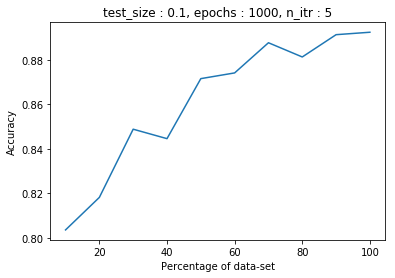

../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.2epochs : 1000n_itr : 5.png


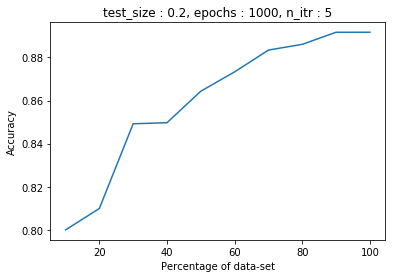

../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.3epochs : 1000n_itr : 5.png


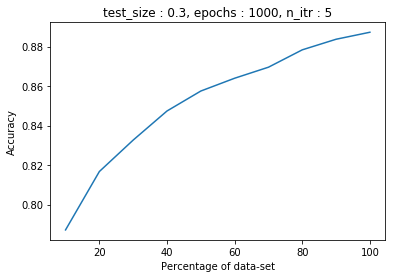

In [36]:
import matplotlib.pyplot as plt
x_axis = [10*i for i in range(1,11)]
title = []
for v in valuesOfTestSize:
    for e in valuesOfEpochs:
        title.append(["test_size : "+str(v),"epochs : " + str(e), "n_itr : " + str(n_itr)])
for i in range(0,len(overAllY)):
    y_axis = overAllY[i]
    plt.plot(x_axis,y_axis)
    plt.xlabel('Percentage of data-set')
    plt.ylabel('Accuracy')
    plt.title(title[i][0]+", "+title[i][1] + ", " + title[i][2])
    filename = "../dataset/bigdata1/result_dnn/graphs_dnn/"+str(title[i][0])+str(title[i][1])+str(title[i][2])+".png"
    print(filename)
    plt.savefig(filename)
    plt.show()

In [37]:
with open("../dataset/bigdata1/result_dnn/dnn_result_5iterations.txt","a+") as f:
    for i in range(0,len(overAllY)):
        line = str(title[i][0])+", "+ str(title[i][1])+", "+str(title[i][2])
        f.write(line+"\r\n")
        f.write(str(overAllY[i])+"\r\n")